In [1]:
require(tidyverse)
require(openxlsx)
require(lme4)

Loading required package: tidyverse

Warning message:
"package 'tidyverse' was built under R version 4.2.2"
── Attaching packages ─────────────────────────────────────────────────────────────────────────────── tidyverse 1.3.2 ──
✔ ggplot2 3.3.6      ✔ purrr   0.3.5 
✔ tibble  3.1.8      ✔ dplyr   1.0.10
✔ tidyr   1.2.1      ✔ stringr 1.4.1 
✔ readr   2.1.3      ✔ forcats 0.5.2 
── Conflicts ────────────────────────────────────────────────────────────────────────────────── tidyverse_conflicts() ──
✖ dplyr::filter()  masks stats::filter()
✖ purrr::flatten() masks jsonlite::flatten()
✖ dplyr::lag()     masks stats::lag()
Loading required package: openxlsx

Warning message:
"package 'openxlsx' was built under R version 4.2.2"
Loading required package: lme4

Warning message:
"package 'lme4' was built under R version 4.2.2"
Loading required package: Matrix

Warning message:
"package 'Matrix' was built under R version 4.2.2"

Attaching package: 'Matrix'


The following objects are masked from

### Input data

In [2]:
df_norm <- read.csv("../phenotype_data/383农艺性状汇总表V3/383农艺性状汇总表V3-归一化.csv")
df_stat <- read.csv("../phenotype_data/383农艺性状汇总表V3/383农艺性状汇总表V3-描述性统计.csv")

df_raw <- read.xlsx("../phenotype_data/383农艺性状汇总表V3/383农艺性状汇总表V3.xlsx")
df_raw_anno <- read.xlsx("../phenotype_data/383农艺性状汇总表V3/383农艺性状汇总表V3.xlsx", sheet = 2)

df_ykl <- read.xlsx("../phenotype_data/383农艺性状汇总表V3/383农艺性状汇总表V3-源库流和抗逆分类.xlsx")
df_ykl_anno <- read.xlsx("../phenotype_data/383农艺性状汇总表V3/383农艺性状汇总表V3-源库流和抗逆分类.xlsx", sheet = 2)

df_stress <- read.xlsx("../phenotype_data/383农艺性状汇总表V3/383农艺性状汇总表V3-源库流和抗逆分类.xlsx", sheet = 3)
df_stress_anno <- read.xlsx("../phenotype_data/383农艺性状汇总表V3/383农艺性状汇总表V3-源库流和抗逆分类.xlsx", sheet = 4)


In [3]:
# Traits needs to be removed in V4
remove <- read.xlsx("../phenotype_data/383农艺性状汇总表V3/383农艺性状汇总表V4-updated-20221202.xlsx", sheet = 3)
rm_traits <- remove$Remove_Trait

update_data <- function(df, rm_traits){
    df <- df %>% select(setdiff(colnames(.) ,rm_traits))
    return(df)
}
df_raw <- update_data(df_raw, rm_traits)
df_norm <- update_data(df_norm, rm_traits)
df_ykl <- update_data(df_ykl, rm_traits)
df_stress <- update_data(df_stress, rm_traits)

df_raw_anno <- df_raw_anno %>% mutate(性状分类1 = gsub(' ', '', 性状分类1))

#### 李洪戈 updated  phenotype summary
##### 全部性状属性信息
Trait + Treatment (726种组合) -- Replicate + location + year

In [4]:
pheno_sum <- read.xlsx("../phenotype_data/383农艺性状汇总表V3/383农艺性状 - 属性解释表V2 - 李洪戈.xlsx") %>% 
    mutate(性状分类1 = gsub(' ', '', 性状分类1)) %>% 
    subset(!性状 %in% rm_traits) %>% # remove problem traits
    mutate(Treatment = ifelse(is.na(Treatment), 'BK', Treatment)) %>% 
    mutate(Develop.period = ifelse(is.na(Develop.period), 'BK', Develop.period)) %>% 
    mutate(TreatDev = paste0(Treatment, '_', Develop.period)) %>% 
    mutate(Replicate2 = ifelse(is.na(Replicate), 'R1', Replicate)) %>% 
    mutate(Replicate2 = ifelse(Trait %in% c('FW_Leaf', 'FW_Stem', 'FW_Root', 'CLAM'), 'R1', Replicate2)) %>%  # Four records have AV but no replicate, change them to R1
    subset(Replicate2 != 'AV') # remove AV records

In [6]:
write.xlsx(pheno_sum, '../05.for_zhanghao_20230502/trait_combo_2.xlsx')

In [6]:
write.csv(pheno_sum, '../05.for_zhanghao_20230502/trait_combo.csv')

In [7]:
pheno_sum

,性状,注释,性状分类1,Trait,Location,Year,Treatment,Develop.period,Replicate,Additional_info,TreatDev,Replicate2
,<chr>,<chr>,<chr>,<chr>,<chr>,<dbl>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>
1,FE_AL_18_CK_R1,对照小区断裂伸长率%_R1,纤维品质,FE,AL,18,BK,BK,R1,NA,BK_BK,R1
2,FE_AL_18_CK_R2,对照小区断裂伸长率%_R2,纤维品质,FE,AL,18,BK,BK,R2,NA,BK_BK,R2
4,FE_AL_19_CK_R1,对照小区伸长率(%)R1,纤维品质,FE,AL,19,BK,BK,R1,NA,BK_BK,R1
5,FE_AL_19_CK_R2,对照小区伸长率(%)R2,纤维品质,FE,AL,19,BK,BK,R2,NA,BK_BK,R2
7,FE_AY_18_R1,断裂伸长率%_R1,纤维品质,FE,AY,18,BK,BK,R1,NA,BK_BK,R1
8,FE_AY_18_R2,断裂伸长率%_R2,纤维品质,FE,AY,18,BK,BK,R2,NA,BK_BK,R2
10,FE_AY_19_CK_R1,对照小区伸长率(%)R1,纤维品质,FE,AY,19,BK,BK,R1,NA,BK_BK,R1
11,FE_AY_19_CK_R2,对照小区伸长率(%)R2,纤维品质,FE,AY,19,BK,BK,R2,NA,BK_BK,R2
13,FE_KT_18_CK_R1,对照小区断裂伸长率_R1,纤维品质,FE,KT,18,BK,BK,R1,NA,BK_BK,R1


### BLUP and heredity by_mean by_plot

#### 按-地点-年份-重复-拟合不lm同模型
##### 各性状的 地点-年份-重复 数量

In [14]:
generate_LocYearDevRep_num <- function(pheno_sum, trait, TraitDev){
    tmp <- pheno_sum %>% subset(Trait == trait & TreatDev == TraitDev)
    Loc_num = tmp$Location %>% unique %>% length
    Year_num = tmp$Year %>% unique %>% length
    Dev_num = tmp$Develop.period %>% unique %>% length
    Rep_num = tmp$Replicate2 %>% unique %>% length
    return(c(trait, TraitDev, Loc_num, Year_num, Dev_num, Rep_num))
}
generate_LocYearDevRep_num(pheno_sum, "FE", "BK_BK")

[1] "FE"    "BK_BK" "5"     "3"     "1"     "2"

In [15]:
LYR_num_list <- list()
for (trait in pheno_sum$Trait %>% unique){
    for (TreatDev in pheno_sum %>% subset(Trait == trait) %>% .$TreatDev %>% unique) {
        result_vec <- generate_LocYearDevRep_num(pheno_sum, trait, TreatDev)
        LYR_num_list[[paste0(trait, '_', TreatDev)]] = result_vec
    }
}

In [16]:
df_LYR <- do.call(rbind, LYR_num_list) %>% 
data.frame() %>% 
mutate(numCombo = paste0(X3, X4, X6)) %>% 
setNames(c('Trait', 'TreatDev', 'Location', 'Year', 'Development', 'Replicate', 'numCombo'))

In [17]:
df_LYR %>% head

,Trait,TreatDev,Location,Year,Development,Replicate,numCombo
,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>
FE_BK_BK,FE,BK_BK,5,3,1,2,532
FE_DR_BK,FE,DR_BK,3,2,1,2,322
FL_BK_BK,FL,BK_BK,5,3,1,2,532
FL_DR_BK,FL,DR_BK,3,2,1,2,322
FS_BK_BK,FS,BK_BK,5,3,1,2,532
FS_DR_BK,FS,DR_BK,3,2,1,2,322


In [79]:
df_LYR %>% dim

[1] 646   7

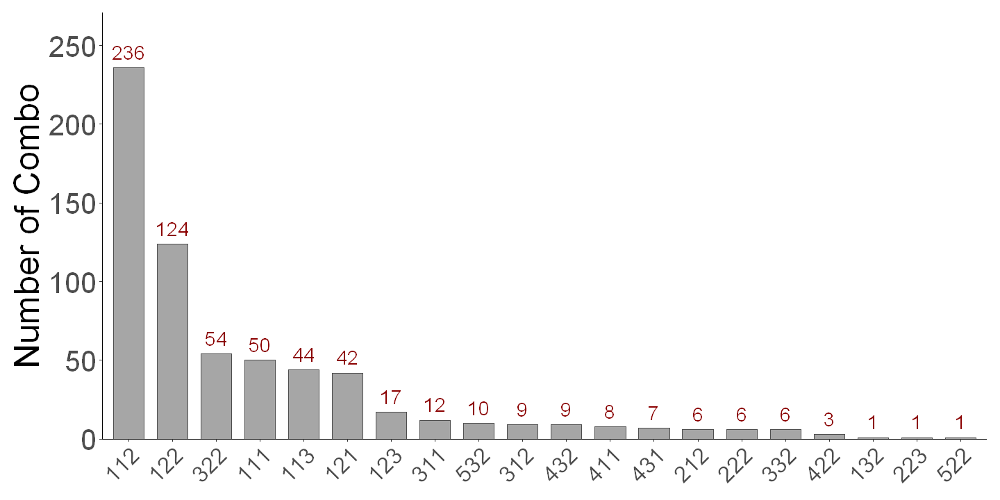

In [10]:
tmp <- df_LYR %>% 
    group_by(numCombo) %>% 
    summarize_at('Trait', list(length))

options(repr.plot.width = 12, repr.plot.height = 6)
tmp %>% 
    arrange(desc(Trait)) %>% 
    mutate(numCombo = factor(numCombo, levels = .$numCombo)) %>% 
    ggplot(aes(numCombo, Trait)) +
    geom_col(width = 0.7, alpha = 0.5, color = "grey30", fill = "grey30") +
    geom_text(aes(x = numCombo, y = Trait + 10, label = Trait), size=6, color = "darkred") +
    theme_classic()+
    ylab("Number of Combo") +
    scale_y_continuous(expand = expansion(mult = c(0, 0.1)))+
    theme(axis.text.y = element_text(size = 25),
          axis.text.x = element_text(size = 20, angle = 45, hjust=1, vjust=1),
          axis.title = element_text(size = 30),
          axis.title.x  = element_blank(),
          legend.text = element_text(size = 25),
          legend.title = element_text(size = 30),
          plot.margin = unit(c(0.4,0.4,0.4,0.4),'cm'))

#### 计算BLUP 和 heredity
- 单年-单点-有重复 无法计算遗传力，计算均值当做blup。
- 按照 地点 年份 的level 是否 > 1 划分四种情况拟合模型
    - 多年 多点 
        - 有重复
    > lmer(value ~ (1|ID)+(1|Location/Replicate2)+(1|Year)+(1|ID:Location)+(1|ID:Year), data = tmp2)
        - 无重复
    > lmer(value ~ (1|ID)+(1|Location)+(1|Year)+(1|ID:Location)+(1|ID:Year), data = tmp2)    
    - 一年 多点
        - 有重复
    > lmer(value ~ (1|ID)+(1|Location/Replicate2)+(1|ID:Location), data = tmp2)
        - 无重复
    > lmer(value ~ (1|ID)+(1|Location)+(1|ID:Location), data = tmp2)
    - 多年 一点
        - 有/无重复
    > lmer(value ~ (1|ID)+(1|Year)+(1|ID:Year), data = tmp2)
    
    - 一年一点 有/无重复
    
    


In [50]:
generate_blup_heridity <- function(df_raw, pheno_sum, trait, treatDev){ # 函数的参数要和内部变量不同
    comboID <- paste0(trait, '_', treatDev) 
    
    tmp <- pheno_sum %>% # generate trait info
        subset(Trait == trait & TreatDev == treatDev) %>% 
        subset(Replicate2 != 'AV')
    
    tmp2 <- df_raw[c('ID', tmp$性状)] %>% # extract trait value
        gather(性状, value, 2:ncol(.)) %>% 
        merge(tmp, '性状') %>% 
        .[c('Trait', 'TreatDev', 'Location', 'Year', 'Replicate2', '性状', 'ID', 'value' )] %>% 
        mutate(ID = as.factor(ID)) %>% 
        mutate(Trait = as.factor(Trait)) %>% 
        mutate(Location = as.factor(Location)) %>% 
        mutate(Year = as.factor(Year)) %>% 
        mutate(TreatDev = as.factor(TreatDev)) %>% 
        mutate(Replicate2 = as.factor(Replicate2)) %>% 
        mutate(value = as.numeric(value))
    
    ID_num = levels(tmp2$ID) %>% length
    L_num = levels(tmp2$Location) %>% length
    Y_num = levels(tmp2$Year) %>% length
    R_num = levels(tmp2$Replicate2) %>% length
    
    # generate BLUP
    generate_blup <- function(mod1, comboID){
        random <- ranef(mod1)
        fixed <- fixef(mod1)
        BLUP <- fixed[1] + random$ID
        colnames(BLUP)[1] = comboID 
        return(BLUP)
    }

    # generate Heredity
    generate_heredity <- function(mod1){
        df_vec <- summary(mod1)[['varcor']] %>% as.data.frame
        var_vec <-df_vec$vcov
        names(var_vec) <- df_vec$grp
        return(var_vec)
    }
    
    
    if (L_num > 1 & Y_num >1){
        if (R_num > 1){
            
            mod1 = lmer(value ~ (1|ID)+(1|Location/Replicate2)+(1|Year)+(1|ID:Location)+(1|ID:Year), data = tmp2)
            blup = generate_blup(mod1, comboID)
            
            mod_var = generate_heredity(mod1)
            var_G = mod_var['ID']
            var_RL = mod_var['Replicate2:Location']/(L_num*R_num)
            var_L = mod_var['Location']/L_num
            var_Y = mod_var['Year']/Y_num
            var_IL = mod_var['ID:Location']/(ID_num*L_num)
            var_IY = mod_var['ID:Year']/(ID_num*Y_num)           
            h2 = var_G / (var_G + var_RL + var_L + var_Y + var_IL + var_IY)
            h2 = unname(h2)
            
            var_RL_p = mod_var['Replicate2:Location']
            var_L_p = mod_var['Location']
            var_Y_p = mod_var['Year']
            var_IL_p = mod_var['ID:Location']
            var_IY_p = mod_var['ID:Year']                       
            h2_p = var_G / (var_G + var_RL_p + var_L_p + var_Y_p + var_IL_p + var_IY_p)
            h2_p = unname(h2_p)
            
        }else if (R_num == 1){
            
            mod1 = lmer(value ~ (1|ID)+(1|Location)+(1|Year)+(1|ID:Location)+(1|ID:Year), data = tmp2)
            blup = generate_blup(mod1, comboID)
            
            mod_var = generate_heredity(mod1)
            var_G = mod_var['ID']
            var_L = mod_var['Location']/L_num
            var_Y = mod_var['Year']/Y_num
            var_IL = mod_var['ID:Location']/(ID_num*L_num)
            var_IY = mod_var['ID:Year']/(ID_num*Y_num)           
            h2 = var_G / (var_G + var_L + var_Y + var_IL + var_IY)
            h2 = unname(h2)            
            
            var_L_p = mod_var['Location']
            var_Y_p = mod_var['Year']
            var_IL_p = mod_var['ID:Location']
            var_IY_p = mod_var['ID:Year']                       
            h2_p =  var_G / (var_G + var_L_p + var_Y_p + var_IL_p + var_IY_p)            
            h2_p = unname(h2_p)
        }
    }else if (L_num > 1 & Y_num <= 1){
        if (R_num > 1){
            
            mod1 = lmer(value ~ (1|ID)+(1|Location/Replicate2) +(1|ID:Location), data = tmp2)
            blup = generate_blup(mod1, comboID)
            
            mod_var = generate_heredity(mod1)
            var_G = mod_var['ID']            
            var_RL = mod_var['Replicate2:Location']/(L_num*R_num)
            var_L = mod_var['Location']/L_num
            var_IL = mod_var['ID:Location']/(ID_num*L_num)           
            h2 = var_G / (var_G + var_RL + var_L + var_IL)
            h2 = unname(h2)
            
            var_RL_p = mod_var['Replicate2:Location']
            var_L_p = mod_var['Location']
            var_IL_p = mod_var['ID:Location']                      
            h2_p = var_G / (var_G + var_RL_p + var_L_p + var_IL_p)
            h2_p = unname(h2_p)
            
                        
        }else if (R_num == 1){

#             mod1 = lmer(value ~ (1|ID)+(1|Location)+(1|ID:Location), data = tmp2)
            mod1 = lmer(value ~ (1|ID)+(1|Location), data = tmp2)
            blup = generate_blup(mod1, comboID)
            
            mod_var = generate_heredity(mod1)
            var_G = mod_var['ID']
            var_L = mod_var['Location']/L_num
            var_IL = mod_var['ID:Location']/(ID_num*L_num)         
            h2 = var_G / (var_G + var_L + var_IL)     
            h2 = unname(h2)
            
            var_L_p = mod_var['Location']
            var_IL_p = mod_var['ID:Location']                     
            h2_p = var_G / (var_G + var_L_p + var_IL_p)
            h2_p = unname(h2_p)
            
        }        
    }else if (L_num <= 1 & Y_num > 1){
        
#         mod1 = lmer(value ~ (1|ID)+(1|Year)+(1|ID:Year), data = tmp2)
        mod1 = lmer(value ~ (1|ID)+(1|Year), data = tmp2)
        blup = generate_blup(mod1, comboID)
        
        mod_var = generate_heredity(mod1)
        var_G = mod_var['ID']
        var_Y = mod_var['Year']/Y_num
#         var_IY = mod_var['ID:Year']/(ID_num*Y_num)           
        h2 = var_G / (var_G + var_Y)         
        h2 = unname(h2)
        
        var_Y_p = mod_var['Year']
#         var_IY_p = mod_var['ID:Year']                       
        h2_p = var_G / (var_G + var_Y_p)
        h2_p = unname(h2_p)
               
    }else if (L_num <= 1 & Y_num <= 1){
        
        blup = tmp2 %>% group_by(ID) %>% summarize_at('value', list(mean)) %>% 
            column_to_rownames(var='ID') %>% setNames(comboID)
        h2 = NA
        h2_p = NA
        
    }else {
        blup = NA
        h2 = NA
        h2_p = NA
    }
    return(list(blup, h2, h2_p))
}

In [13]:
# result_list <- list()
# for (trait in pheno_sum$Trait %>% unique){
#     for (treatment in pheno_sum %>% subset(Trait == trait) %>% .$Treatment %>% unique) {
#         print(paste(trait, '---', treatment, 'is runing...'))
#         label = paste0(trait, '_', treatment)
#         result_list[[label]] = generate_blup_heridity(df_raw, pheno_sum, trait, treatment)
#     }
# }

In [51]:
result_list <- list()
for (trait in pheno_sum$Trait %>% unique) {
    for (TreatDev in pheno_sum %>% subset(Trait == trait) %>% .$TreatDev %>% unique) {
        tryCatch({
            print(paste(trait, "---", TreatDev, "is runing..."))
            label = paste0(trait, "_", TreatDev)
            result_list[[label]] = generate_blup_heridity(df_raw, pheno_sum, trait, TreatDev)
        }, error = function(e) {
            cat("ERROR :", conditionMessage(e), "")
        })
    }
}

[1] "FE --- BK_BK is runing..."


boundary (singular) fit: see help('isSingular')



[1] "FE --- DR_BK is runing..."


boundary (singular) fit: see help('isSingular')



[1] "FL --- BK_BK is runing..."
[1] "FL --- DR_BK is runing..."


boundary (singular) fit: see help('isSingular')



[1] "FS --- BK_BK is runing..."
[1] "FS --- DR_BK is runing..."


boundary (singular) fit: see help('isSingular')



[1] "MIC --- BK_BK is runing..."
[1] "MIC --- DR_BK is runing..."


boundary (singular) fit: see help('isSingular')



[1] "FU --- BK_BK is runing..."
[1] "FU --- DR_BK is runing..."


boundary (singular) fit: see help('isSingular')



[1] "MAT --- BK_BK is runing..."
[1] "SCI --- BK_BK is runing..."
[1] "SFI --- BK_BK is runing..."
[1] "Ln5 --- BK_BK is runing..."
[1] "FNN --- BK_BK is runing..."
[1] "FNS --- BK_BK is runing..."
[1] "Fine --- BK_BK is runing..."
[1] "IM --- BK_BK is runing..."
[1] "Ln --- BK_BK is runing..."
[1] "MR --- BK_BK is runing..."
[1] "SFCn --- BK_BK is runing..."
[1] "SFCw --- BK_BK is runing..."
[1] "TNS --- BK_BK is runing..."
[1] "TNN --- BK_BK is runing..."
[1] "UQLw --- BK_BK is runing..."
[1] "EE --- BK_BK is runing..."
[1] "CC --- BK_BK is runing..."
[1] "HH --- BK_BK is runing..."
[1] "LL --- BK_BK is runing..."
[1] "aa --- BK_BK is runing..."


boundary (singular) fit: see help('isSingular')



[1] "bb --- BK_BK is runing..."
[1] "WH --- BK_BK is runing..."
[1] "L --- BK_BK is runing..."


boundary (singular) fit: see help('isSingular')



[1] "a --- BK_BK is runing..."


boundary (singular) fit: see help('isSingular')



[1] "b --- BK_BK is runing..."


boundary (singular) fit: see help('isSingular')



[1] "W10 --- BK_BK is runing..."
[1] "T10 --- BK_BK is runing..."
[1] "T10 --- BK_Hyd12d is runing..."
[1] "T10 --- BK_FTP is runing..."
[1] "T10 --- BK_FEF is runing..."


boundary (singular) fit: see help('isSingular')



[1] "x10 --- BK_BK is runing..."


boundary (singular) fit: see help('isSingular')



[1] "y10 --- BK_BK is runing..."


boundary (singular) fit: see help('isSingular')



[1] "C --- BK_BK is runing..."
[1] "h --- BK_BK is runing..."


boundary (singular) fit: see help('isSingular')



[1] "L1 --- BK_BK is runing..."
[1] "L1 --- BK_Hyd12d is runing..."
[1] "L1 --- BK_FTP is runing..."
[1] "L1 --- BK_FEF is runing..."
[1] "a1 --- BK_BK is runing..."


boundary (singular) fit: see help('isSingular')



[1] "b1 --- BK_BK is runing..."


Warning message in checkConv(attr(opt, "derivs"), opt$par, ctrl = control$checkConv, :
"Model failed to converge with max|grad| = 0.0022899 (tol = 0.002, component 1)"


[1] "X10 --- BK_BK is runing..."


boundary (singular) fit: see help('isSingular')



[1] "Y10 --- BK_BK is runing..."


boundary (singular) fit: see help('isSingular')



[1] "Z10 --- BK_BK is runing..."


boundary (singular) fit: see help('isSingular')



[1] "Rx --- BK_BK is runing..."


boundary (singular) fit: see help('isSingular')



[1] "Ry --- BK_BK is runing..."


boundary (singular) fit: see help('isSingular')



[1] "Rz --- BK_BK is runing..."


boundary (singular) fit: see help('isSingular')



[1] "R457 --- BK_BK is runing..."


boundary (singular) fit: see help('isSingular')



[1] "WF --- BK_BK is runing..."
[1] "SFC --- BK_BK is runing..."
[1] "Cellulose --- BK_BK is runing..."


boundary (singular) fit: see help('isSingular')



[1] "Lignin_H --- BK_BK is runing..."
[1] "BN --- BK_BK is runing..."


boundary (singular) fit: see help('isSingular')



[1] "BN --- BK_blooming is runing..."
[1] "BN --- DR_BK is runing..."
[1] "BN --- DR_blooming is runing..."
[1] "BW --- BK_BK is runing..."


boundary (singular) fit: see help('isSingular')



[1] "BW --- DR_BK is runing..."


boundary (singular) fit: see help('isSingular')



[1] "LP --- BK_BK is runing..."
[1] "LP --- DR_BK is runing..."


boundary (singular) fit: see help('isSingular')



[1] "SI --- BK_BK is runing..."
[1] "SI --- DR_BK is runing..."
[1] "SY --- BK_BK is runing..."
[1] "SY --- DR_BK is runing..."


boundary (singular) fit: see help('isSingular')



[1] "Y --- BK_BK is runing..."


boundary (singular) fit: see help('isSingular')



[1] "Y --- DR_BK is runing..."
[1] "LI --- BK_BK is runing..."


Warning message in mask$eval_all_mutate(quo):
"NAs introduced by coercion"
boundary (singular) fit: see help('isSingular')



[1] "LI --- DR_BK is runing..."
[1] "FABN --- BK_BK is runing..."
[1] "FABN --- DR_BK is runing..."


boundary (singular) fit: see help('isSingular')



[1] "FABR --- BK_BK is runing..."
[1] "FABR --- DR_BK is runing..."


boundary (singular) fit: see help('isSingular')



[1] "YT --- BK_BK is runing..."
[1] "YT --- DR_BK is runing..."
[1] "EFBA --- BK_BK is runing..."


boundary (singular) fit: see help('isSingular')



[1] "EFBA --- DR_BK is runing..."
[1] "EFBL --- BK_BK is runing..."
[1] "EFBL --- DR_BK is runing..."


boundary (singular) fit: see help('isSingular')



[1] "FBA --- BK_BK is runing..."


Warning message in checkConv(attr(opt, "derivs"), opt$par, ctrl = control$checkConv, :
"Model failed to converge with max|grad| = 0.00252083 (tol = 0.002, component 1)"


[1] "FBA --- DR_BK is runing..."
[1] "FBL --- BK_BK is runing..."
[1] "FBL --- DR_BK is runing..."


Warning message in checkConv(attr(opt, "derivs"), opt$par, ctrl = control$checkConv, :
"Model failed to converge with max|grad| = 0.0173358 (tol = 0.002, component 1)"


[1] "FBN --- BK_BK is runing..."


boundary (singular) fit: see help('isSingular')



[1] "FBN --- BK_FB is runing..."
[1] "FBN --- DR_BK is runing..."


boundary (singular) fit: see help('isSingular')



[1] "FBN --- DR_FB is runing..."
[1] "FBN --- WL_BK is runing..."
[1] "FBN --- T_CK_BK is runing..."
[1] "FFBA --- BK_BK is runing..."


boundary (singular) fit: see help('isSingular')



[1] "FFBA --- DR_BK is runing..."
[1] "FFBH --- BK_BK is runing..."


Warning message in checkConv(attr(opt, "derivs"), opt$par, ctrl = control$checkConv, :
"Model failed to converge with max|grad| = 0.0100199 (tol = 0.002, component 1)"


[1] "FFBH --- BK_BS is runing..."
[1] "FFBH --- DR_BK is runing..."


boundary (singular) fit: see help('isSingular')



[1] "FFBH --- DR_BS is runing..."
[1] "FFBL --- BK_BK is runing..."


boundary (singular) fit: see help('isSingular')



[1] "FFBL --- DR_BK is runing..."


boundary (singular) fit: see help('isSingular')



[1] "LBN --- BK_BK is runing..."


boundary (singular) fit: see help('isSingular')



[1] "NNFF --- BK_BK is runing..."
[1] "NNFF --- DR_BK is runing..."


boundary (singular) fit: see help('isSingular')



[1] "PH --- BK_BK is runing..."
[1] "PH --- BK_FB is runing..."
[1] "PH --- DR_BK is runing..."


boundary (singular) fit: see help('isSingular')



[1] "PH --- T_CK_GS is runing..."
[1] "PW --- BK_BK is runing..."
[1] "SFBA --- BK_BK is runing..."


boundary (singular) fit: see help('isSingular')



[1] "SFBA --- DR_BK is runing..."
[1] "SFBL --- BK_BK is runing..."
[1] "SFBL --- DR_BK is runing..."
[1] "BODI --- BK_BK is runing..."


boundary (singular) fit: see help('isSingular')



[1] "BOP --- BK_BK is runing..."
[1] "FBOD --- BK_BK is runing..."


boundary (singular) fit: see help('isSingular')



[1] "FD --- BK_BK is runing..."
[1] "FDI --- BK_BK is runing..."
[1] "FFD --- BK_BK is runing..."


boundary (singular) fit: see help('isSingular')



[1] "SBOD --- BK_BK is runing..."


boundary (singular) fit: see help('isSingular')



[1] "SFD --- BK_BK is runing..."


boundary (singular) fit: see help('isSingular')



[1] "FT --- BK_BK is runing..."
[1] "FT --- DR_BK is runing..."
[1] "FN --- BK_blooming is runing..."
[1] "FN --- DR_blooming is runing..."
[1] "DrW --- BK_BK is runing..."
[1] "FrW --- BK_BK is runing..."
[1] "FrW --- BK_Hyd12d is runing..."
[1] "FrW --- BK_FEF is runing..."
[1] "Frw --- BK_BK is runing..."
[1] "LeA --- BK_BK is runing..."
[1] "LeC --- BK_BK is runing..."
[1] "LeG --- BK_BK is runing..."
[1] "LeN --- BK_BK is runing..."


boundary (singular) fit: see help('isSingular')



[1] "LPA --- BK_BK is runing..."
[1] "SPAD --- BK_BK is runing..."
[1] "SPAD --- DR_BK is runing..."


boundary (singular) fit: see help('isSingular')



[1] "SPAD --- SIN1_BK is runing..."
[1] "SPAD --- SIN2_BK is runing..."
[1] "SPAD --- SIP1_BK is runing..."
[1] "SPAD --- SIP2_BK is runing..."
[1] "SPAD --- T_CK_GS is runing..."
[1] "SPAD --- T_CK_BK is runing..."
[1] "BL --- BK_10d is runing..."
[1] "BL --- BK_20d is runing..."
[1] "BL --- BK_30d is runing..."
[1] "BL --- BK_40d is runing..."
[1] "TUWB --- BK_10d is runing..."
[1] "TUWB --- BK_20d is runing..."
[1] "TUWB --- BK_30d is runing..."
[1] "TUWB --- BK_40d is runing..."
[1] "BL_TUWB --- BK_10d is runing..."
[1] "BL_TUWB --- BK_20d is runing..."
[1] "BL_TUWB --- BK_30d is runing..."
[1] "BL_TUWB --- BK_40d is runing..."
[1] "BV --- BK_10d is runing..."
[1] "BV --- BK_20d is runing..."
[1] "BV --- BK_30d is runing..."
[1] "BV --- BK_40d is runing..."
[1] "BST --- BK_10d is runing..."
[1] "BST --- BK_20d is runing..."
[1] "BST --- BK_30d is runing..."
[1] "BST --- BK_40d is runing..."
[1] "SFW --- BK_10d is runing..."
[1] "SFW --- BK_20d is runing..."
[1] "SFW --- BK_30d is r

boundary (singular) fit: see help('isSingular')



[1] "DW --- BK_30d is runing..."
[1] "DW --- BK_40d is runing..."
[1] "SDWR --- BK_10d is runing..."
[1] "SDWR --- BK_20d is runing..."
[1] "SDWR --- BK_30d is runing..."
[1] "SDWR --- BK_40d is runing..."
[1] "CDWR --- BK_10d is runing..."
[1] "CDWR --- BK_20d is runing..."
[1] "CDWR --- BK_30d is runing..."
[1] "CDWR --- BK_40d is runing..."
[1] "SDF --- BK_10d is runing..."
[1] "SDF --- BK_20d is runing..."
[1] "SDF --- BK_30d is runing..."
[1] "SDF --- BK_40d is runing..."
[1] "CDF --- BK_10d is runing..."
[1] "CDF --- BK_20d is runing..."
[1] "CDF --- BK_30d is runing..."
[1] "CDF --- BK_40d is runing..."


boundary (singular) fit: see help('isSingular')



[1] "DF --- BK_10d is runing..."
[1] "DF --- BK_20d is runing..."
[1] "DF --- BK_30d is runing..."
[1] "DF --- BK_40d is runing..."


boundary (singular) fit: see help('isSingular')



[1] "BD --- BK_10d is runing..."
[1] "BD --- BK_20d is runing..."
[1] "BD --- BK_30d is runing..."
[1] "BD --- BK_40d is runing..."
[1] "TMWB --- BK_30d is runing..."
[1] "TMWB --- BK_40d is runing..."
[1] "TMWB --- BK_10d is runing..."
[1] "TMWB --- BK_20d is runing..."
[1] "TLWB --- BK_30d is runing..."
[1] "TLWB --- BK_40d is runing..."
[1] "TLWB --- BK_10d is runing..."
[1] "TLWB --- BK_20d is runing..."
[1] "BL_TMWB --- BK_30d is runing..."
[1] "BL_TMWB --- BK_40d is runing..."
[1] "BL_TMWB --- BK_10d is runing..."
[1] "BL_TLWB --- BK_30d is runing..."
[1] "BL_TLWB --- BK_40d is runing..."
[1] "BL_TLWB --- BK_10d is runing..."
[1] "SL --- BK_BK is runing..."
[1] "SL --- BK_Hyd12d is runing..."
[1] "SL --- BK_Hyd4d is runing..."
[1] "SL --- BK_Hyd8d is runing..."
[1] "SL --- BK_FTP is runing..."
[1] "SL --- T_CK_BK is runing..."
[1] "STW --- BK_BK is runing..."


boundary (singular) fit: see help('isSingular')



[1] "SMW --- BK_BK is runing..."


boundary (singular) fit: see help('isSingular')



[1] "SBW --- BK_BK is runing..."


boundary (singular) fit: see help('isSingular')



[1] "SL_STW --- BK_BK is runing..."


boundary (singular) fit: see help('isSingular')



[1] "SL_SMW --- BK_BK is runing..."


boundary (singular) fit: see help('isSingular')



[1] "SL_SBW --- BK_BK is runing..."


boundary (singular) fit: see help('isSingular')



[1] "SL_AY --- BK_BK is runing..."
[1] "DDrW --- BK_Hyd12d is runing..."
[1] "DFrw --- BK_Hyd12d is runing..."
[1] "GR --- BK_Hyd4d is runing..."
[1] "LR --- BK_Hyd12d is runing..."
[1] "LR --- BK_Hyd8d is runing..."
[1] "LR --- BK_FTP is runing..."
[1] "LR --- BK_FEF is runing..."
[1] "PRL --- BK_Hyd12d is runing..."
[1] "PRL --- BK_Hyd4d is runing..."
[1] "PRL --- BK_Hyd8d is runing..."
[1] "PRL --- BK_FTP is runing..."
[1] "PRL --- BK_FEF is runing..."
[1] "PRL --- T_CK_GS is runing..."
[1] "PRL --- T_CK_BK is runing..."
[1] "UDrW --- BK_Hyd12d is runing..."
[1] "UFrw --- BK_Hyd12d is runing..."
[1] "AnRA --- BK_Hyd12d is runing..."
[1] "AnRA --- BK_FTP is runing..."
[1] "AnRA --- BK_FEF is runing..."
[1] "AnRH --- BK_Hyd12d is runing..."
[1] "AnRH --- BK_FTP is runing..."
[1] "AnRH --- BK_FEF is runing..."
[1] "AnRW --- BK_Hyd12d is runing..."
[1] "AnRW --- BK_FTP is runing..."
[1] "AnRW --- BK_FEF is runing..."
[1] "AvgDiam --- BK_Hyd12d is runing..."
[1] "AvgDiam --- BK_FTP is ru

boundary (singular) fit: see help('isSingular')



[1] "ASS --- BK_BK is runing..."


boundary (singular) fit: see help('isSingular')



[1] "CSS --- BK_BK is runing..."


boundary (singular) fit: see help('isSingular')



[1] "SDI --- BK_BK is runing..."


boundary (singular) fit: see help('isSingular')



[1] "SFrW --- BK_BK is runing..."


boundary (singular) fit: see help('isSingular')



[1] "LN --- DR_BK is runing..."


boundary (singular) fit: see help('isSingular')



[1] "LH --- DR_BK is runing..."
[1] "LN.UF --- DR_BK is runing..."
[1] "LN.T --- DR_BK is runing..."
[1] "G --- DR_BK is runing..."
[1] "FFLN --- DR_FABS is runing..."
[1] "MSLN --- DR_BK is runing..."
[1] "SIPH --- SI_BK is runing..."
[1] "SILEN --- SI_BK is runing..."
[1] "SISPAD --- SI_BK is runing..."
[1] "SISDrW --- SI_BK is runing..."
[1] "SIRDrW --- SI_BK is runing..."
[1] "SITDrW --- SI_BK is runing..."
[1] "SIRSR --- SI_BK is runing..."
[1] "ADB --- SIN1_BK is runing..."
[1] "ADB --- SIN2_BK is runing..."
[1] "ADB --- SIP1_BK is runing..."
[1] "ADB --- SIP2_BK is runing..."
[1] "UDB --- SIN1_BK is runing..."
[1] "UDB --- SIN2_BK is runing..."
[1] "UDB --- SIP1_BK is runing..."
[1] "UDB --- SIP2_BK is runing..."
[1] "TDB --- SIN1_BK is runing..."
[1] "TDB --- SIN2_BK is runing..."
[1] "TDB --- SIP1_BK is runing..."
[1] "TDB --- SIP2_BK is runing..."
[1] "TRL --- SIN1_BK is runing..."
[1] "TRL --- SIN2_BK is runing..."
[1] "TRL --- SIP1_BK is runing..."
[1] "TRL --- SIP2_BK is r

boundary (singular) fit: see help('isSingular')



[1] "VWDI --- BK_BK is runing..."
[1] "DR2 --- CK_BK is runing..."


boundary (singular) fit: see help('isSingular')



[1] "DR2 --- T_BK is runing..."


boundary (singular) fit: see help('isSingular')



[1] "RDR2 --- CK_T_BK is runing..."


boundary (singular) fit: see help('isSingular')



[1] "RDR2 --- T_CK_BK is runing..."


boundary (singular) fit: see help('isSingular')



[1] "PBS2 --- CK_BK is runing..."
[1] "PBS2 --- T_BK is runing..."


boundary (singular) fit: see help('isSingular')



[1] "RPBS2 --- T_CK_BK is runing..."


boundary (singular) fit: see help('isSingular')



[1] "BaBN --- WL_BK is runing..."
[1] "BaBR --- WL_BK is runing..."
[1] "BiBN --- WL_BK is runing..."
[1] "BiBN --- T_CK_BK is runing..."
[1] "BoN --- WL_BK is runing..."
[1] "BoN --- T_CK_BK is runing..."
[1] "SBN --- WL_BK is runing..."
[1] "ShR --- WL_BK is runing..."
[1] "ShR --- T_CK_BK is runing..."
[1] "ToB --- WL_BK is runing..."
[1] "ToB --- T_CK_BK is runing..."
[1] "FaBN --- WL_BK is runing..."
[1] "FaBN --- T_CK_BK is runing..."
[1] "FlR --- WL_BK is runing..."
[1] "FlR --- T_CK_BK is runing..."
[1] "FrN --- WL_BK is runing..."
[1] "FrN --- T_CK_BK is runing..."
[1] "ER --- T_CK_GS is runing..."


In [52]:
result_list %>% length

[1] 646

In [153]:
# generate_blup_heridity_debug <- function(df_raw, pheno_sum, trait, treatment){
#     COMBO_ID <- paste0(trait, '_', treatment) 
    
#     tmp <- pheno_sum %>% # generate trait info
#         subset(Trait == trait & Treatment == treatment) %>% 
#         subset(Replicate2 != 'AV')
    
#     tmp2 <- df_raw[c('ID', tmp$性状)] %>%  # extract trait value
#         gather(性状, value, 2:ncol(.)) %>% 
#         merge(tmp, '性状') %>% 
#         .[c('Trait', 'Treatment', 'Location', 'Year', 'Replicate2', '性状', 'ID', 'value' )] %>% 
#         mutate(ID = as.factor(ID)) %>% 
#         mutate(Trait = as.factor(Trait)) %>% 
#         mutate(Location = as.factor(Location)) %>% 
#         mutate(Year = as.factor(Year)) %>% 
#         mutate(Treatment = as.factor(Treatment)) %>% 
#         mutate(Replicate2 = as.factor(Replicate2)) %>% 
#         mutate(value = as.numeric(value))
#     tmp2$value[is.na(tmp2$value)] <- mean(tmp2$value, na.rm=T) # impute NA in value with mean
    
#     ID_num = levels(tmp2$ID) %>% length
#     L_num = levels(tmp2$Location) %>% length
#     Y_num = levels(tmp2$Year) %>% length
#     R_num = levels(tmp2$Replicate2) %>% length
    
#     # generate BLUP
#     generate_blup <- function(mod1, comboID){
#         random <- ranef(mod1)
#         fixed <- fixef(mod1)
#         BLUP <- fixed[1] + random$ID
# #         colnames(BLUP)[1] = comboID 
#         return(BLUP)
#     }

#     # generate Heredity
#     generate_heredity <- function(mod1){
#         df_vec <- summary(mod1)[['varcor']] %>% as.data.frame
#         var_vec <-df_vec$vcov
#         names(var_vec) <- df_vec$grp
#         return(var_vec)
#     }
    
    
#     if (L_num > 1 & Y_num >1){
#         if (R_num > 1){
            
# #             mod1 = lmer(value ~ (1|ID)+(1|Location/Replicate2)+(1|Year)+(1|ID:Location)+(1|ID:Year), data = tmp2)
#             mod1 = lmer(value ~ (1|ID)+(1|Location/Replicate2)+(1|Year), data = tmp2)
            
#             blup = generate_blup(mod1, COMBO_ID)
            
#             mod_var = generate_heredity(mod1)
#             var_G = mod_var['ID']
#             var_RL = mod_var['Replicate2:Location']/(L_num*R_num)
#             var_L = mod_var['Location']/L_num
#             var_Y = mod_var['Year']/Y_num
# #             var_IL = mod_var['ID:Location']/(ID_num*L_num)
# #             var_IY = mod_var['ID:Year']/(ID_num*Y_num)           
#             h2 = var_G / (var_G +var_RL + var_L + var_Y )
            
#         }else if (R_num == 1){
            
#             mod1 = lmer(value ~ (1|ID)+(1|Location)+(1|Year)+(1|ID:Location)+(1|ID:Year), data = tmp2)
#             blup = generate_blup(mod1, COMBO_ID)
            
#             mod_var = generate_heredity(mod1)
#             var_G = mod_var['ID']
#             var_L = mod_var['Location']/L_num
#             var_Y = mod_var['Year']/Y_num
#             var_IL = mod_var['ID:Location']/(ID_num*L_num)
#             var_IY = mod_var['ID:Year']/(ID_num*Y_num)           
#             h2 = var_G / (var_G + var_L + var_Y + var_IL + var_IY)
            
#         }
#     }else if (L_num > 1 & Y_num == 1){
#         if (R_num > 1){
            
#             mod1 = lmer(value ~ (1|ID)+(1|Location/Replicate2) +(1|ID:Location), data = tmp2)
#             blup = generate_blup(mod1, comboID)
            
#             mod_var = generate_heredity(mod1)
#             var_G = mod_var['ID']            
#             var_RL = mod_var['Replicate2:Location']/(L_num*R_num)
#             var_L = mod_var['Location']/L_num
#             var_IL = mod_var['ID:Location']/(ID_num*L_num)           
#             h2 = var_G / (var_G + var_RL + var_L + var_IL)
                        
#         }else if (R_num == 1){

#             mod1 = lmer(value ~ (1|ID)+(1|Location), data = tmp2)
#             blup = generate_blup(mod1, comboID)
            
#             mod_var = generate_heredity(mod1)
#             var_G = mod_var['ID']
#             var_L = mod_var['Location']/L_num        
#             h2 = var_G / (var_G + var_L)     
            
#         }        
#     }else if (L_num <= 1 & Y_num > 1){
        
#         mod1 = lmer(value ~ (1|ID)+(1|Year)+(1|ID:Year), data = tmp2)
#         blup = generate_blup(mod1, comboID)
        
#         mod_var = generate_heredity(mod1)
#         var_G = mod_var['ID']
#         var_Y = mod_var['Year']/Y_num
#         var_IY = mod_var['ID:Year']/(ID_num*Y_num)           
#         h2 = var_G / (var_G + var_Y + var_IY)         
               
#     }else if (L_num == 1 & Y_num == 1){
        
#         blup = tmp2 %>% group_by(ID) %>% summarize_at('value', list(mean)) %>% 
#             column_to_rownames(var='ID') %>% setNames(comboID)
#         h2 = 'NotAvailable'
        
#     }else {NULL}
    
#     return(list(blup, h2))
# #     return(list(tmp, tmp2, L_num, Y_num))
# }

# test <- generate_blup_heridity_debug(df_raw, pheno_sum, "FS", "DR")
# test

In [36]:
# # generate_blup_heridity_debug <- function(df_raw, pheno_sum, trait, treatDev){
# #     comboID <- paste0(trait, '_', TreatDev) 
    
# #     tmp <- pheno_sum %>% # generate trait info
# #         subset(Trait == trait & TreatDev == treatDev) %>% 
# #         subset(Replicate2 != 'AV')
    
# #     tmp2 <- df_raw[c('ID', tmp$性状)] %>% # extract trait value
# #         gather(性状, value, 2:ncol(.)) %>% 
# #         merge(tmp, '性状') %>% 
# #         .[c('Trait', 'TreatDev', 'Location', 'Year', 'Replicate2', '性状', 'ID', 'value' )] %>% 
# #         mutate(ID = as.factor(ID)) %>% 
# #         mutate(Trait = as.factor(Trait)) %>% 
# #         mutate(Location = as.factor(Location)) %>% 
# #         mutate(Year = as.factor(Year)) %>% 
# #         mutate(TreatDev = as.factor(TreatDev)) %>% 
# #         mutate(Replicate2 = as.factor(Replicate2)) %>% 
# #         mutate(value = as.numeric(value))
    
# #     ID_num = levels(tmp2$ID) %>% length
# #     L_num = levels(tmp2$Location) %>% length
# #     Y_num = levels(tmp2$Year) %>% length
# #     R_num = levels(tmp2$Replicate2) %>% length
    
# #     # generate BLUP
# #     generate_blup <- function(MOD, comboID){
# #         random <- ranef(MOD)
# #         fixed <- fixef(MOD)
# #         BLUP <-  fixed[1] + random$ID + 100
# #         colnames(BLUP)[1] = comboID 
# # #         return(BLUP)
# #         return(random$ID)
# #     }

# #     # generate Heredity
# #     generate_heredity <- function(mod1){
# #         df_vec <- summary(mod1)[['varcor']] %>% as.data.frame
# #         var_vec <-df_vec$vcov
# #         names(var_vec) <- df_vec$grp
# #         return(var_vec)
# #     }
    
    
# #     if (L_num > 1 & Y_num >1){
# #         if (R_num > 1){
# #             print(1)
# #             mod1 = lmer(value ~ (1|ID)+(1|Location/Replicate2)+(1|Year)+(1|ID:Location)+(1|ID:Year), data = tmp2)
# #             blup = generate_blup(mod1, comboID)
            
# #             mod_var = generate_heredity(mod1)
# #             var_G = mod_var['ID']
# #             var_RL = mod_var['Replicate2:Location']/(L_num*R_num)
# #             var_L = mod_var['Location']/L_num
# #             var_Y = mod_var['Year']/Y_num
# #             var_IL = mod_var['ID:Location']/(ID_num*L_num)
# #             var_IY = mod_var['ID:Year']/(ID_num*Y_num)           
# #             h2 = var_G / (var_G + var_RL + var_L + var_Y + var_IL + var_IY)
# #             h2 = unname(h2)
            
# #             var_RL_p = mod_var['Replicate2:Location']
# #             var_L_p = mod_var['Location']
# #             var_Y_p = mod_var['Year']
# #             var_IL_p = mod_var['ID:Location']
# #             var_IY_p = mod_var['ID:Year']                       
# #             h2_p = var_G / (var_G + var_RL_p + var_L_p + var_Y_p + var_IL_p + var_IY_p)
# #             h2_p = unname(h2_p)
            
# #             print(" 1 end")
            
# #         }else if (R_num == 1){
# #             print(2)
# # #             mod1 = lmer(value ~ (1|ID)+(1|Location)+(1|Year)+(1|ID:Location)+(1|ID:Year), data = tmp2)
# # #             blup = generate_blup(mod1, comboID)
            
# # #             mod_var = generate_heredity(mod1)
# # #             var_G = mod_var['ID']
# # #             var_L = mod_var['Location']/L_num
# # #             var_Y = mod_var['Year']/Y_num
# # #             var_IL = mod_var['ID:Location']/(ID_num*L_num)
# # #             var_IY = mod_var['ID:Year']/(ID_num*Y_num)           
# # #             h2 = var_G / (var_G + var_L + var_Y + var_IL + var_IY)
# # #             h2 = unname(h2)            
            
# # #             var_L_p = mod_var['Location']
# # #             var_Y_p = mod_var['Year']
# # #             var_IL_p = mod_var['ID:Location']
# # #             var_IY_p = mod_var['ID:Year']                       
# # #             h2_p =  var_G / (var_G + var_L_p + var_Y_p + var_IL_p + var_IY_p)            
# # #             h2_p = unname(h2_p)
# #         }
# #     }else if (L_num > 1 & Y_num <= 1){
# #         if (R_num > 1){
# #             print(3)
# # #             mod1 = lmer(value ~ (1|ID)+(1|Location/Replicate2) +(1|ID:Location), data = tmp2)
# # #             blup = generate_blup(mod1, comboID)
            
# # #             mod_var = generate_heredity(mod1)
# # #             var_G = mod_var['ID']            
# # #             var_RL = mod_var['Replicate2:Location']/(L_num*R_num)
# # #             var_L = mod_var['Location']/L_num
# # #             var_IL = mod_var['ID:Location']/(ID_num*L_num)           
# # #             h2 = var_G / (var_G + var_RL + var_L + var_IL)
# # #             h2 = unname(h2)
            
# # #             var_RL_p = mod_var['Replicate2:Location']
# # #             var_L_p = mod_var['Location']
# # #             var_IL_p = mod_var['ID:Location']                      
# # #             h2_p = var_G / (var_G + var_RL_p + var_L_p + var_IL_p)
# # #             h2_p = unname(h2_p)
            
                        
# #         }else if (R_num == 1){
# #             print(4)
# # #             mod1 = lmer(value ~ (1|ID)+(1|Location)+(1|ID:Location), data = tmp2)
# # #             mod1 = lmer(value ~ (1|ID)+(1|Location), data = tmp2)
# # #             blup = generate_blup(mod1, comboID)
            
# # #             mod_var = generate_heredity(mod1)
# # #             var_G = mod_var['ID']
# # #             var_L = mod_var['Location']/L_num
# # #             var_IL = mod_var['ID:Location']/(ID_num*L_num)         
# # #             h2 = var_G / (var_G + var_L + var_IL)     
# # #             h2 = unname(h2)
            
# # #             var_L_p = mod_var['Location']
# # #             var_IL_p = mod_var['ID:Location']                     
# # #             h2_p = var_G / (var_G + var_L_p + var_IL_p)
# # #             h2_p = unname(h2_p)
            
# #         }        
# #     }else if (L_num <= 1 & Y_num > 1){
# #         print(4)
# # #         mod1 = lmer(value ~ (1|ID)+(1|Year)+(1|ID:Year), data = tmp2)
# # #         blup = generate_blup(mod1, comboID)
        
# # #         mod_var = generate_heredity(mod1)
# # #         var_G = mod_var['ID']
# # #         var_Y = mod_var['Year']/Y_num
# # #         var_IY = mod_var['ID:Year']/(ID_num*Y_num)           
# # #         h2 = var_G / (var_G + var_Y + var_IY)         
# # #         h2 = unname(h2)
        
# # #         var_Y_p = mod_var['Year']
# # #         var_IY_p = mod_var['ID:Year']                       
# # #         h2_p = var_G / (var_G + var_Y_p + var_IY_p)
# # #         h2_p = unname(h2_p)
               
# #     }else if (L_num <= 1 & Y_num <= 1){
# #         print(5)
# # #         blup = tmp2 %>% group_by(ID) %>% summarize_at('value', list(mean)) %>% 
# # #             column_to_rownames(var='ID') %>% setNames(comboID)
# # #         h2 = NA
# # #         h2_p = NA
        
# #     }else {
# #         print(6)
# # #         blup = NA
# # #         h2 = NA
# # #         h2_p = NA
# #     }
    
# #     return(list(tmp, tmp2, mod1, blup, h2, h2_p))
# # }

# # generate_blup_heridity_debug(df_raw, pheno_sum, 'FE', 'BK_BK')

#  tmp <- pheno_sum %>% # generate trait info
#         subset(Trait == 'FE' & TreatDev == 'BK_BK') %>% 
#         subset(Replicate2 != 'AV')

#     tmp2 <- df_raw[c('ID', tmp$性状)] %>% # extract trait value
#         gather(性状, value, 2:ncol(.)) %>% 
#         merge(tmp, '性状') %>% 
#         .[c('Trait', 'TreatDev', 'Location', 'Year', 'Replicate2', '性状', 'ID', 'value' )] %>% 
#         mutate(ID = as.factor(ID)) %>% 
#         mutate(Trait = as.factor(Trait)) %>% 
#         mutate(Location = as.factor(Location)) %>% 
#         mutate(Year = as.factor(Year)) %>% 
#         mutate(TreatDev = as.factor(TreatDev)) %>% 
#         mutate(Replicate2 = as.factor(Replicate2)) %>% 
#         mutate(value = as.numeric(value))

# tmp2 %>% ggplot(aes(性状, value, group = ID)) + geom_point() + geom_line(alpha=0.5)

#     ID_num = levels(tmp2$ID) %>% length
#     L_num = levels(tmp2$Location) %>% length
#     Y_num = levels(tmp2$Year) %>% length
#     R_num = levels(tmp2$Replicate2) %>% length

# mod1 = lmer(value ~ (1|ID)+(1|Location/Replicate2)+(1|Year)+(1|ID:Location)+(1|ID:Year), data = tmp2)

# mod1



# fixef(mod1)

# ranef(mod1)$ID





# generate_blup <- function(mod1, comboID){
#     random <- ranef(mod1)
#     fixed <- fixef(mod1)
#     BLUP <- fixed[1] + random$ID
#     colnames(BLUP)[1] = comboID
#     return(BLUP)}
# generate_blup(mod1, '123')

# generate_heredity <- function(mod1){
#     df_vec <- summary(mod1)[['varcor']] %>% as.data.frame
#     var_vec <-df_vec$vcov
#     names(var_vec) <- df_vec$grp
#     return(var_vec)
# }

# mod_var = generate_heredity(mod1)
# var_G = mod_var['ID']
# var_RL = mod_var['Replicate2:Location']/(L_num*R_num)
# var_L = mod_var['Location']/L_num
# var_Y = mod_var['Year']/Y_num
# var_IL = mod_var['ID:Location']/(ID_num*L_num)
# var_IY = mod_var['ID:Year']/(ID_num*Y_num)           
# h2 = var_G / (var_G + var_RL + var_L + var_Y + var_IL + var_IY)
# h2 = unname(h2)

# var_RL_p = mod_var['Replicate2:Location']
# var_L_p = mod_var['Location']
# var_Y_p = mod_var['Year']
# var_IL_p = mod_var['ID:Location']
# var_IY_p = mod_var['ID:Year']                       
# h2_p = var_G / (var_G + var_RL_p + var_L_p + var_Y_p + var_IL_p + var_IY_p)
# h2_p = unname(h2_p)

# h2

# h2_p





#### 调研无法拟合的性状

In [17]:
# df_blup <- read.csv('./all_blup.20Dec2022.csv', row.names=1)

In [33]:
setdiff(rownames(df_LYR), colnames(df_blup)) %>% # check those traits not 
df_LYR[.,]

,Trait,TreatDev,Location,Year,Development,Replicate,numCombo
,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>
SFW_BK_10d,SFW,BK_10d,1,2,1,1,121
SFW_BK_20d,SFW,BK_20d,1,2,1,1,121
SFW_BK_40d,SFW,BK_40d,1,2,1,1,121
CFW_BK_10d,CFW,BK_10d,1,2,1,1,121
CFW_BK_20d,CFW,BK_20d,1,2,1,1,121
CFW_BK_40d,CFW,BK_40d,1,2,1,1,121
FW_BK_10d,FW,BK_10d,1,2,1,1,121
FW_BK_20d,FW,BK_20d,1,2,1,1,121
FW_BK_40d,FW,BK_40d,1,2,1,1,121


In [48]:
pheno_sum %>% subset(Trait == 'NOP_Med-CV' & TreatDev == 'BK_BK')

,性状,注释,性状分类1,Trait,Location,Year,Treatment,Develop.period,Replicate,Additional_info,TreatDev,Replicate2
,<chr>,<chr>,<chr>,<chr>,<chr>,<dbl>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>
2880,NOP_Med-CV,单位面积中部突起数的变异系数,胚珠微观性状,NOP_Med-CV,NA,NA,BK,BK,NA,NA,BK_BK,R1


In [44]:
generate_blup_heridity_debug <- function(df_raw, pheno_sum, trait, treatDev){ # 函数的参数要和内部变量不同
    comboID <- paste0(trait, '_', treatDev) 
    
    tmp <- pheno_sum %>% # generate trait info
        subset(Trait == trait & TreatDev == treatDev) %>% 
        subset(Replicate2 != 'AV')
    
    tmp2 <- df_raw[c('ID', tmp$性状)] %>% # extract trait value
        gather(性状, value, 2:ncol(.)) %>% 
        merge(tmp, '性状') %>% 
        .[c('Trait', 'TreatDev', 'Location', 'Year', 'Replicate2', '性状', 'ID', 'value' )] %>% 
        mutate(ID = as.factor(ID)) %>% 
        mutate(Trait = as.factor(Trait)) %>% 
        mutate(Location = as.factor(Location)) %>% 
        mutate(Year = as.factor(Year)) %>% 
        mutate(TreatDev = as.factor(TreatDev)) %>% 
        mutate(Replicate2 = as.factor(Replicate2)) %>% 
        mutate(value = as.numeric(value))
    
    ID_num = levels(tmp2$ID) %>% length
    L_num = levels(tmp2$Location) %>% length
    Y_num = levels(tmp2$Year) %>% length
    R_num = levels(tmp2$Replicate2) %>% length
    
    # generate BLUP
    generate_blup <- function(mod1, comboID){
        random <- ranef(mod1)
        fixed <- fixef(mod1)
        BLUP <- fixed[1] + random$ID
        colnames(BLUP)[1] = comboID 
        return(BLUP)
    }

    # generate Heredity
    generate_heredity <- function(mod1){
        df_vec <- summary(mod1)[['varcor']] %>% as.data.frame
        var_vec <-df_vec$vcov
        names(var_vec) <- df_vec$grp
        return(var_vec)
    }
    
    
    if (L_num > 1 & Y_num >1){
        if (R_num > 1){
            
            mod1 = lmer(value ~ (1|ID)+(1|Location/Replicate2)+(1|Year)+(1|ID:Location)+(1|ID:Year), data = tmp2)
            blup = generate_blup(mod1, comboID)
            
            mod_var = generate_heredity(mod1)
            var_G = mod_var['ID']
            var_RL = mod_var['Replicate2:Location']/(L_num*R_num)
            var_L = mod_var['Location']/L_num
            var_Y = mod_var['Year']/Y_num
            var_IL = mod_var['ID:Location']/(ID_num*L_num)
            var_IY = mod_var['ID:Year']/(ID_num*Y_num)           
            h2 = var_G / (var_G + var_RL + var_L + var_Y + var_IL + var_IY)
            h2 = unname(h2)
            
            var_RL_p = mod_var['Replicate2:Location']
            var_L_p = mod_var['Location']
            var_Y_p = mod_var['Year']
            var_IL_p = mod_var['ID:Location']
            var_IY_p = mod_var['ID:Year']                       
            h2_p = var_G / (var_G + var_RL_p + var_L_p + var_Y_p + var_IL_p + var_IY_p)
            h2_p = unname(h2_p)
            
        }else if (R_num == 1){
            
            mod1 = lmer(value ~ (1|ID)+(1|Location)+(1|Year)+(1|ID:Location)+(1|ID:Year), data = tmp2)
            blup = generate_blup(mod1, comboID)
            
            mod_var = generate_heredity(mod1)
            var_G = mod_var['ID']
            var_L = mod_var['Location']/L_num
            var_Y = mod_var['Year']/Y_num
            var_IL = mod_var['ID:Location']/(ID_num*L_num)
            var_IY = mod_var['ID:Year']/(ID_num*Y_num)           
            h2 = var_G / (var_G + var_L + var_Y + var_IL + var_IY)
            h2 = unname(h2)            
            
            var_L_p = mod_var['Location']
            var_Y_p = mod_var['Year']
            var_IL_p = mod_var['ID:Location']
            var_IY_p = mod_var['ID:Year']                       
            h2_p =  var_G / (var_G + var_L_p + var_Y_p + var_IL_p + var_IY_p)            
            h2_p = unname(h2_p)
        }
    }else if (L_num > 1 & Y_num <= 1){
        if (R_num > 1){
            
            mod1 = lmer(value ~ (1|ID)+(1|Location/Replicate2) +(1|ID:Location), data = tmp2)
            blup = generate_blup(mod1, comboID)
            
            mod_var = generate_heredity(mod1)
            var_G = mod_var['ID']            
            var_RL = mod_var['Replicate2:Location']/(L_num*R_num)
            var_L = mod_var['Location']/L_num
            var_IL = mod_var['ID:Location']/(ID_num*L_num)           
            h2 = var_G / (var_G + var_RL + var_L + var_IL)
            h2 = unname(h2)
            
            var_RL_p = mod_var['Replicate2:Location']
            var_L_p = mod_var['Location']
            var_IL_p = mod_var['ID:Location']                      
            h2_p = var_G / (var_G + var_RL_p + var_L_p + var_IL_p)
            h2_p = unname(h2_p)
            
                        
        }else if (R_num == 1){

#             mod1 = lmer(value ~ (1|ID)+(1|Location)+(1|ID:Location), data = tmp2)
            mod1 = lmer(value ~ (1|ID)+(1|Location), data = tmp2)
            blup = generate_blup(mod1, comboID)
            
            mod_var = generate_heredity(mod1)
            var_G = mod_var['ID']
            var_L = mod_var['Location']/L_num
            var_IL = mod_var['ID:Location']/(ID_num*L_num)         
            h2 = var_G / (var_G + var_L + var_IL)     
            h2 = unname(h2)
            
            var_L_p = mod_var['Location']
            var_IL_p = mod_var['ID:Location']                     
            h2_p = var_G / (var_G + var_L_p + var_IL_p)
            h2_p = unname(h2_p)
            
        }        
    }else if (L_num <= 1 & Y_num > 1){
        
#         mod1 = lmer(value ~ (1|ID)+(1|Year)+(1|ID:Year), data = tmp2)
        mod1 = lmer(value ~ (1|ID)+(1|Year), data = tmp2)
        blup = generate_blup(mod1, comboID)
        
        mod_var = generate_heredity(mod1)
        var_G = mod_var['ID']
        var_Y = mod_var['Year']/Y_num
#         var_IY = mod_var['ID:Year']/(ID_num*Y_num)           
        h2 = var_G / (var_G + var_Y)         
        h2 = unname(h2)
        
        var_Y_p = mod_var['Year']
#         var_IY_p = mod_var['ID:Year']                       
        h2_p = var_G / (var_G + var_Y_p)
        h2_p = unname(h2_p)
               
    }else if (L_num <= 1 & Y_num <= 1){
        
        blup = tmp2 %>% group_by(ID) %>% summarize_at('value', list(mean)) %>% 
            column_to_rownames(var='ID') %>% setNames(comboID)
        h2 = NA
        h2_p = NA
        
    }else {
        blup = NA
        h2 = NA
        h2_p = NA
    }
    return(list(blup, h2, h2_p))
}

In [49]:
# generate_blup_heridity_debug(df_raw, pheno_sum, 'NOP_Med-CV', 'BK_BK')

,NOP_Med-CV_BK_BK
,<dbl>
K001,0.0388000
K002,0.0706000
K003,0.0526000
K004,0.0971000
K005,0.1747194
K006,0.4672101
K007,0.0991000
K008,0.0903000
K009,0.0675000


#### Tidyup Results
##### All BLUP value
- 有一些多年多点的性状，由genotype造成的random effect 非常小，每个line拟合的blup都几乎相同，遗传力也非常小。
    - 说明这些性状受环境影响大，而几乎不受遗传影响。
    - 说明不同地点，不同年份各line的表性值很不稳定。
    - **这些性状要么是真的遗传力低，要么是其记录中还有其他因素影响，需要进一步细分。**

- 部分性状lmer拟合无法收敛，不能得出blup值

In [56]:
# all blup value
blup_list <- result_list %>% map(., 1) # check the blup dim

blup_dim <- lapply(blup_list, dim)
comboID = names(blup_dim)
rowNum = blup_dim %>% map(., 1) %>% unname() %>% unlist()
blup_dim_df = data.frame(Trait_Treatment = comboID, rowNum = rowNum)

list_382 <- blup_dim_df %>% subset(rowNum != 383) %>% .$Trait_Treatment
list_383 <- setdiff(blup_dim_df$Trait_Treatment, list_382)

df_382 <- do.call(cbind, blup_list[list_382])
df_383 <- do.call(cbind, blup_list[list_383])

df_blup <- merge(df_383, df_382, by = 'row.names', all.x=T)
colnames(df_blup)[1] <- 'ID'

# write.csv(df_blup, './all_blup.21Dec2022.csv')

In [57]:
df_blup %>% head

,ID,FE_BK_BK,FE_DR_BK,FL_BK_BK,FL_DR_BK,FS_BK_BK,FS_DR_BK,MIC_BK_BK,MIC_DR_BK,FU_BK_BK,⋯,CDW_BK_40d,DW_BK_40d,SDWR_BK_40d,CDWR_BK_40d,SDF_BK_40d,CDF_BK_40d,DF_BK_40d,BD_BK_40d,TMWB_BK_40d,TLWB_BK_40d
,<I<chr>>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,⋯,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
1,K001,7.595672,1.006269,30.03286,0.9703730,31.16207,0.9857874,4.137411,1.074074,84.11903,⋯,3.854242,5.347422,29.10067,70.89933,14.84919,32.69861,24.89123,220.8595,30.66451,31.19895
2,K002,7.646048,1.006269,28.01802,0.9709366,27.56493,0.9857874,4.279981,1.077185,83.02780,⋯,3.956726,5.554689,29.11113,70.88887,15.92724,32.69861,24.89123,226.4116,31.77206,32.52046
3,K003,7.546395,1.006269,27.35631,0.9700466,27.87767,0.9857874,4.729187,1.049999,83.12976,⋯,3.916235,5.517328,30.09160,69.90840,15.73823,32.69861,24.89123,222.4090,31.48603,33.91933
4,K004,7.575864,1.006269,26.82647,0.9701432,27.42089,0.9857874,4.532415,1.051022,82.98186,⋯,3.953195,5.550524,29.15876,70.84124,15.91237,32.69861,24.89123,228.7225,31.35162,32.12965
5,K005,7.450582,1.006269,29.76980,0.9697361,30.64744,0.9857874,3.942932,1.050034,82.99469,⋯,3.979797,5.561352,28.10788,71.89212,15.60139,32.69861,24.89123,232.7671,31.26679,32.13774
6,K006,7.459790,1.006269,31.51658,0.9702988,31.33052,0.9857874,3.587879,1.059717,82.46200,⋯,3.896774,5.487345,30.37612,69.62388,14.65942,32.69861,24.89123,215.9868,32.72462,35.33152


##### All heredity by mean

In [60]:
# all h2
comboID <- result_list %>% map(., 2) %>% unlist() %>% names()
heredity <- result_list %>% map(., 2) %>% unlist() %>% unname()
df_h2 <- data.frame(Trait_Treatment = comboID, h2 = heredity)

In [61]:
# write.csv(df_h2, './all_h2_by_mean.21Dec2022.csv')

In [62]:
eff_num <- df_h2 %>% na.omit() %>% dim %>% .[1]
print(paste('A total of', eff_num, 'Trait_Treatments have h2.'))

[1] "A total of 296 Trait_Treatments have h2."


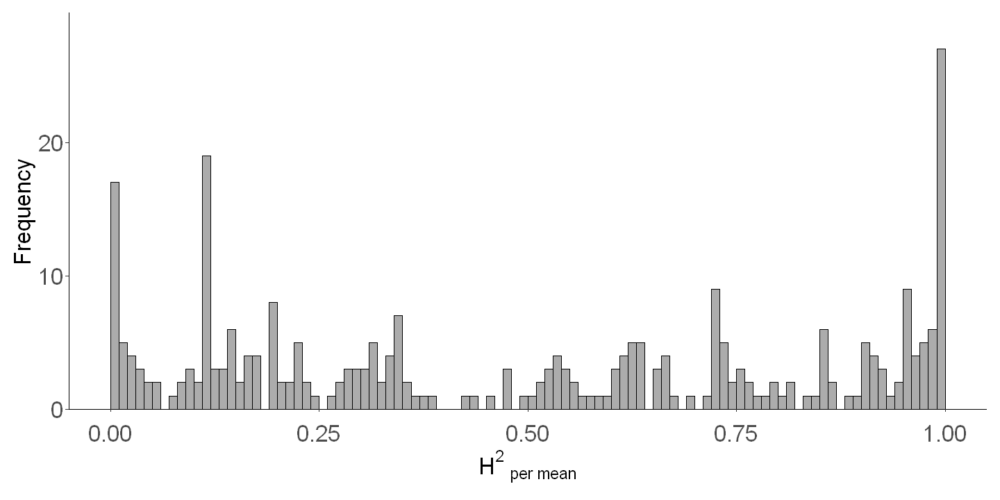

In [113]:
df_h2 %>% ggplot(aes(h2)) + geom_histogram(na.rm = T, binwidth = 0.01, boundary=TRUE, alpha=0.5, color='black') + 
    scale_y_continuous(expand = expansion(mult = c(0, 0.1)))+
    xlab(expression(H^2 * ' '['per mean'])) +
    ylab('Frequency') + 
    theme_classic() + 
    theme(axis.text.y = element_text(size = 20),
          axis.text.x = element_text(size = 20, margin = margin(t = 10)),
          axis.title = element_text(size = 20),
          axis.title.x  = element_text(size = 20),
          legend.text = element_text(size = 20),
          legend.title = element_text(size = 20),
          plot.margin = unit(c(0.4,0.4,0.4,0.4),'cm'))

##### All heredity by plot

In [64]:
# all h2
comboID <- result_list %>% map(., 3) %>% unlist() %>% names()
heredity_p <- result_list %>% map(., 3) %>% unlist() %>% unname()
df_h2_p <- data.frame(Trait_Treatment = comboID, h2 = heredity_p)

In [65]:
# write.csv(df_h2, './all_h2_by_plot.21Dec2022.csv')

In [66]:
eff_num <- df_h2_p %>% na.omit() %>% dim %>% .[1]
print(paste('A total of', eff_num, 'Trait_Treatments have h2.'))

[1] "A total of 296 Trait_Treatments have h2."


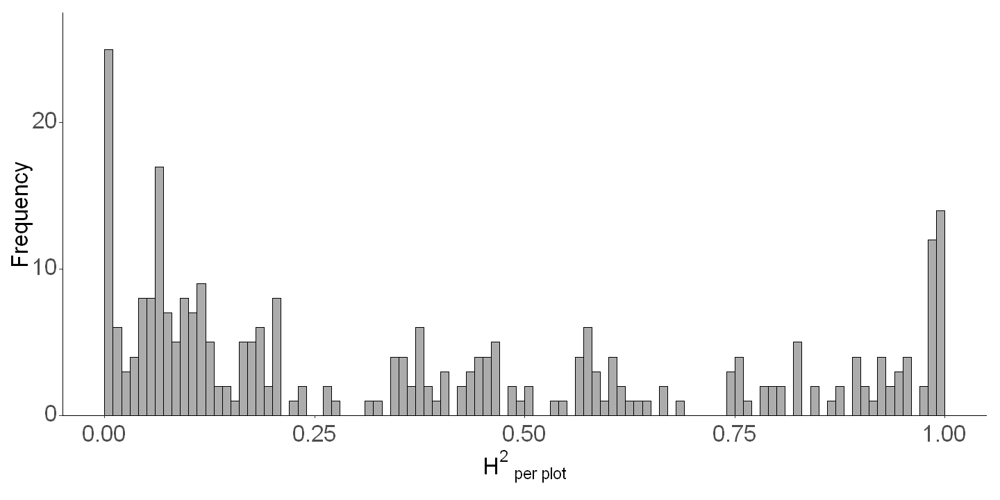

In [112]:
df_h2_p %>% ggplot(aes(h2)) + geom_histogram(na.rm = T, binwidth = 0.01, boundary=TRUE, alpha=0.5, color='black') + 
    scale_y_continuous(expand = expansion(mult = c(0, 0.1)))+
    xlab(expression(H^2 * ' '['per plot'])) +
    ylab('Frequency') + 
    theme_classic() +
    theme(axis.text.y = element_text(size = 20),
          axis.text.x = element_text(size = 20, margin = margin(t = 10)),
          axis.title = element_text(size = 20),
          axis.title.x  = element_text(size = 20),
          legend.text = element_text(size = 20),
          legend.title = element_text(size = 20),
          plot.margin = unit(c(0.4,0.4,0.4,0.4),'cm'))

###### 各性状大类遗传力分布

In [25]:
df_h2_plot <- read.csv('./all_h2_by_plot.21Dec2022.csv', row.names = 1)

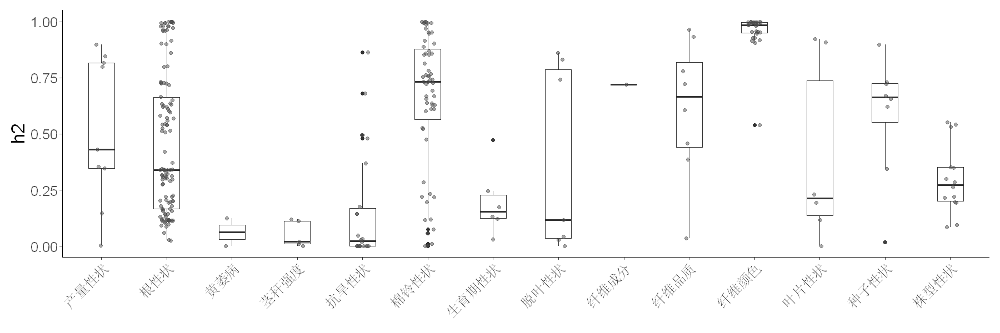

In [58]:
options(repr.plot.width = 15, repr.plot.height = 5)

pheno_sum %>% 
mutate(Trait_Treatment = paste0(Trait, '_', TreatDev)) %>% 
.[c('Trait_Treatment', '性状分类1')] %>% 
merge(., df_h2_plot, by = "Trait_Treatment", all.y =T) %>% 
distinct() %>% 
drop_na() %>% 
ggplot(aes(性状分类1, h2)) + 
    geom_boxplot(width=0.4) +
    geom_jitter(width = 0.1, color = 'grey30', alpha = 0.5) +
    xlab(NULL) +
        theme_classic() +
        theme(axis.text.y = element_text(size = 15),
              axis.text.x = element_text(size = 15, angle = 45, hjust=1, vjust=1),
              axis.title = element_text(size = 20),
              axis.title.x  = element_text(size = 20),
              legend.text = element_text(size = 15),
              legend.title = element_text(size = 15),
              plot.margin = unit(c(0.4,0.4,0.4,0.4),'cm'))

Warning message:
"Removed 350 rows containing non-finite values (stat_boxplot)."
Warning message:
"Removed 350 rows containing missing values (geom_point)."


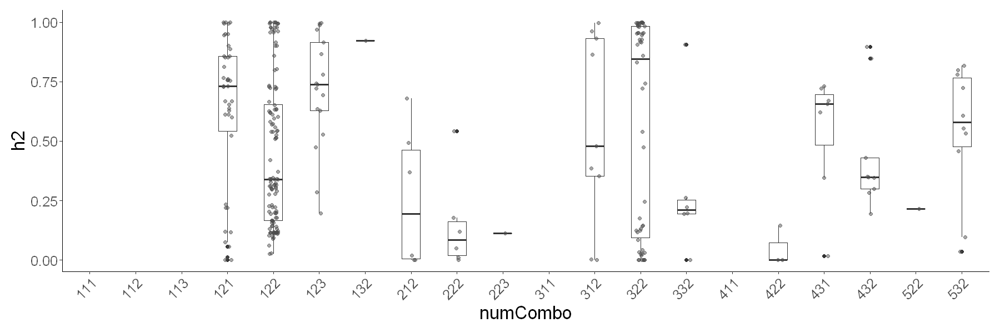

In [60]:
df_LYR[c('numCombo')] %>% 
rownames_to_column('Trait_Treatment') %>% 
merge(df_h2_plot) %>% 
# drop_na() %>% 
ggplot(aes(numCombo, h2)) + 
    geom_boxplot(width=0.4) +
    geom_jitter(width = 0.1, color = 'grey30', alpha = 0.5) +
        theme_classic() +
        theme(axis.text.y = element_text(size = 15),
              axis.text.x = element_text(size = 15, angle = 45, hjust=1, vjust=1),
              axis.title = element_text(size = 20),
              axis.title.x  = element_text(size = 20),
              legend.text = element_text(size = 15),
              legend.title = element_text(size = 15),
              plot.margin = unit(c(0.4,0.4,0.4,0.4),'cm'))

###### 查看h2高和低的trait 表型值在不同环境间的对应情况

In [74]:
plot_pheo_value <- function(df_raw, pheno_sum, trait, treatDev){
    
    tmp <- pheno_sum %>% # generate trait info
        subset(Trait == trait & TreatDev == treatDev) %>% 
        subset(Replicate2 != 'AV')
    
    tmp2 <- df_raw[c('ID', tmp$性状)] %>% # extract trait value
        gather(性状, value, 2:ncol(.)) %>% 
        merge(tmp, '性状') %>% 
        .[c('Trait', 'TreatDev', 'Location', 'Year', 'Replicate2', '性状', 'ID', 'value' )] %>% 
        mutate(ID = as.factor(ID)) %>% 
        mutate(Trait = as.factor(Trait)) %>% 
        mutate(Location = as.factor(Location)) %>% 
        mutate(Year = as.factor(Year)) %>% 
        mutate(TreatDev = as.factor(TreatDev)) %>% 
        mutate(Replicate2 = as.factor(Replicate2)) %>% 
        mutate(value = as.numeric(value))

    p <- tmp2 %>% ggplot(aes(x=性状, y=value, group=ID)) + 
        geom_point() + 
        geom_line(alpha = 0.5, color='grey60') +
        theme_classic()
    return(p)
    }

In [77]:
df_h2_p %>% 
    merge(df_LYR %>% rownames_to_column('Trait_Treatment'), by = 'Trait_Treatment') %>% 
    subset(h2 < 0.3 & h2>0.2) %>%  
    arrange(desc(h2))

Trait_Treatment,h2,Trait,TreatDev,Location,Year,Development,Replicate,numCombo
<chr>,<dbl>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>
FS_BK_BK,0.2793734,FS,BK_BK,5,3,1,2,532
HH_BK_BK,0.2687238,HH,BK_BK,3,2,1,2,322
T10_BK_FTP,0.2666014,T10,BK_FTP,1,2,1,2,122
SBOD_BK_BK,0.2319725,SBOD,BK_BK,3,2,1,2,322
PH_BK_BK,0.2317271,PH,BK_BK,5,3,1,2,532
T8_BK_FEF,0.2288723,T8,BK_FEF,1,2,1,2,122
V6_BK_FTP,0.2084302,V6,BK_FTP,1,2,1,2,122
SA6_BK_FTP,0.2056305,SA6,BK_FTP,1,2,1,2,122
PA6_BK_FTP,0.2056144,PA6,BK_FTP,1,2,1,2,122


In [114]:
df_h2_p %>% 
    merge(df_LYR %>% rownames_to_column('Trait_Treatment'), by = 'Trait_Treatment') %>% 
    subset(Trait_Treatment == 'FE_BK_BK')

,Trait_Treatment,h2,Trait,TreatDev,Location,Year,Development,Replicate,numCombo
,<chr>,<dbl>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>
141,FE_BK_BK,0.01010643,FE,BK_BK,5,3,1,2,532


Warning message:
"Removed 77 rows containing missing values (geom_point)."
Warning message:
"Removed 4 row(s) containing missing values (geom_path)."


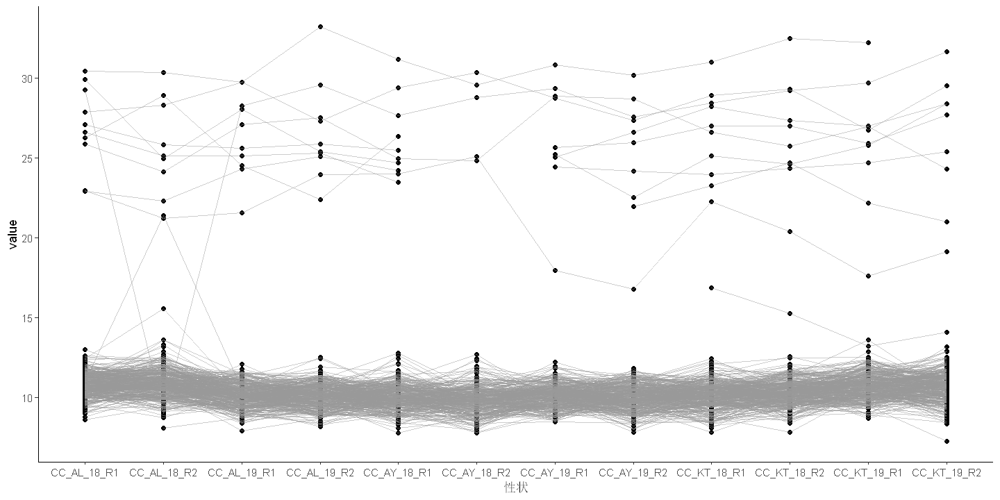

In [76]:
# CC_BK_BK	0.9857154	CC	BK_BK	3	2	1	2	322
plot_pheo_value(df_raw, pheno_sum, 'CC', 'BK_BK')

Warning message:
"Removed 102 rows containing missing values (geom_point)."
Warning message:
"Removed 54 row(s) containing missing values (geom_path)."


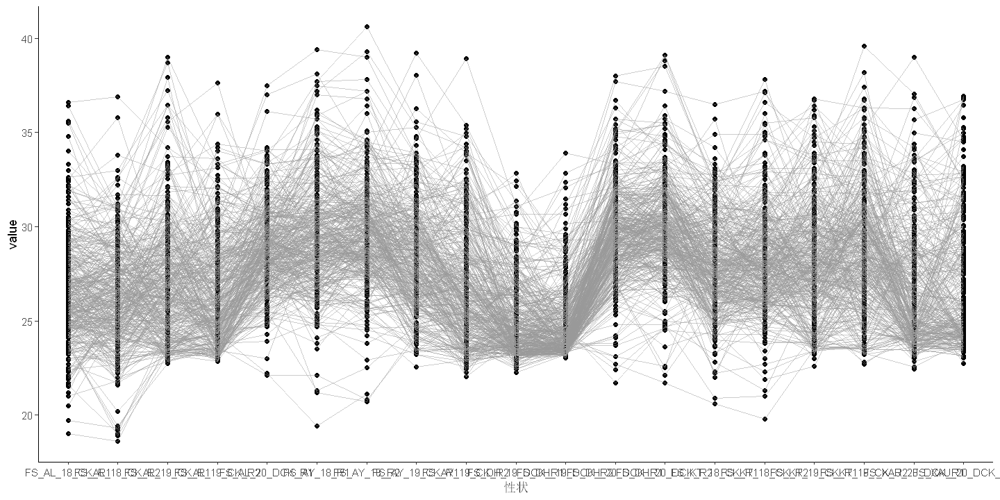

In [78]:
# FS_BK_BK	0.2793734	FS	BK_BK	5	3	1	2	532
plot_pheo_value(df_raw, pheno_sum, 'FS', 'BK_BK')

Warning message:
"Removed 102 rows containing missing values (geom_point)."
Warning message:
"Removed 54 row(s) containing missing values (geom_path)."


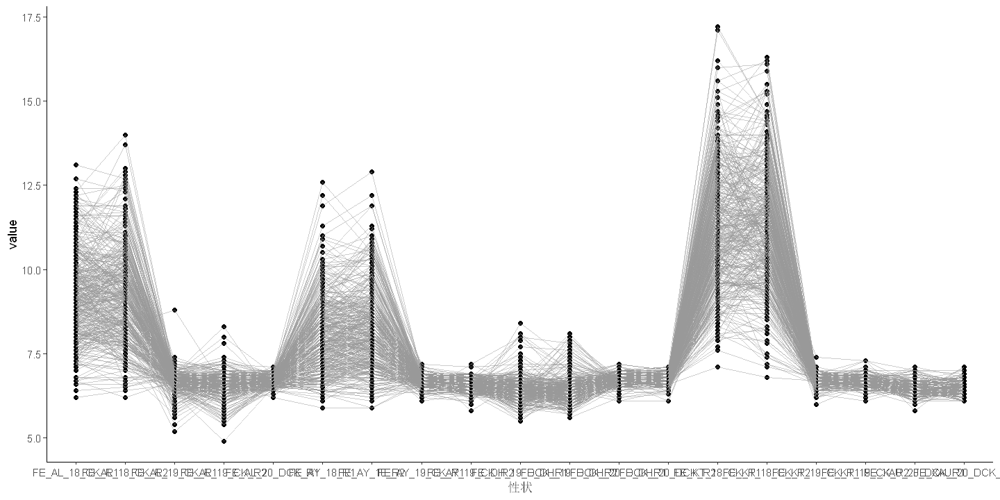

In [115]:
# FE_BK_BK	0.01010643	FE	BK_BK	5	3	1	2	532
plot_pheo_value(df_raw, pheno_sum, 'FE', 'BK_BK')

以上遗传力低的性状，一个是重复性不好，另外是否有其他因素没有涵盖，导致环境间的差异很大。

### rG
#### rG version 1
##### Generate pheno input

In [116]:
# GCTA input order
gcta_order <- read.csv('./Allchr.snp.final.recode.numChr.plink_out.gctaGRM.grm.id', sep='\t', header = F)
gcta_order <- gcta_order %>% .[c('V2')] %>% setNames(c('GenoID')) 
gcta_order %>% tail

,GenoID
,<chr>
378,ZGH0758N
379,ZGH0759N
380,ZGH0761N
381,ZGH0762N
382,ZGH0763N
383,ZGH0764N


In [117]:
# geno pheno id
geno_pheno <- read.xlsx('../383群体ID.xlsx') %>% setNames(c('ID', 'GenoID'))

In [192]:
# # generate a test file
# gcta_order %>% 
# merge(geno_pheno, by='GenoID') %>% 
# mutate(familyid = 0) %>% 
# .[c('familyid', 'GenoID', 'ID')] %>% 
# merge(df_blup, by = 'ID', all.x =T) %>% 
# .[match(gcta_order$GenoID, .$GenoID), ] %>% 
# select(-ID) %>% # whole GCTA input
# .[, 1:4] %>% 
# write.table('./rG.test.txt', col.names=F, row.names =F, quote=F)

In [119]:
# generate entire file
gcta_order %>% 
merge(geno_pheno, by='GenoID') %>% 
mutate(familyid = 0) %>% 
.[c('familyid', 'GenoID', 'ID')] %>% 
merge(df_blup, by = 'ID', all.x =T) %>% 
.[match(gcta_order$GenoID, .$GenoID), ] %>% 
select(-ID) %>% # whole GCTA input
write.table('./rG.entire.21Dec2022.txt', col.names=F, row.names =F, quote=F)

##### generate bash scripts to run in parallel

In [149]:
generate_parallel_script <- function(start, end, n, path){
    slice = seq(start, end, n)
    for (i in 1:(length(slice))){
        if (slice[i] + n - 1 > end){
            START = slice[i]
            END = end
#             print(paste(slice[i], '---', end))
        }else{
            START = slice[i]
            END = slice[i] + n - 1
#             print(paste(slice[i], '---', (slice[i] + n - 1)))
        }
        tmp = readLines(paste0(path, '/raw.sh'))
        tmp = gsub('START', START, tmp)
        tmp = gsub('END', END, tmp)
        writeLines(tmp, paste0(path, '/slice_', START, '_', END, '.sh'))
    }   
}

In [152]:
generate_parallel_script(1, 646, 20, './scripts_21Dec2022/')

##### Tidyup rG results

In [48]:
df_blup <- read.csv('./all_blup.21Dec2022.csv')

triat_vec <- colnames(df_blup) %>% .[3:length(.)]

In [50]:
df_rg <- read.table('./rG_results/extract_rG.result.202212220920.tab', sep = '\t', header = F, skip = 1) %>% 
    setNames(c('Fname', 'Type', 'rG', 'SE'))

df_rg_pval <- read.table('./rG_results/extract_Pval.result.202212220920.tab', sep = '', header = F, skip = 1) %>% 
    .[c(1, 3)] %>% 
    setNames(c('Fname', 'Pval'))

df_rg <- df_rg %>% 
    merge(df_rg_pval, by = 'Fname', all.x = T)

df_rg[c('Trait_idx_1', 'Trait_idx_2')] <- df_rg$Fname %>% gsub('.hsq', '', .) %>% str_split_fixed('_',  n=6) %>% .[,c(4, 6)]
df_rg <- df_rg %>% 
    mutate(Trait_idx_1 = as.integer(Trait_idx_1)) %>% 
    mutate(Trait_idx_2 = as.integer(Trait_idx_2)) %>% 
    mutate(Trait1 = triat_vec[Trait_idx_1]) %>% 
    mutate(Trait2 = triat_vec[Trait_idx_2])

In [51]:
df_trait_class <- pheno_sum %>% 
    mutate(TraitID = paste0(Trait, '_', TreatDev)) %>% 
    .[c('性状分类1', 'TraitID')] %>% 
    distinct()

###### All rG heatmap

Loading required package: pheatmap

Warning message:
"package 'pheatmap' was built under R version 4.2.2"


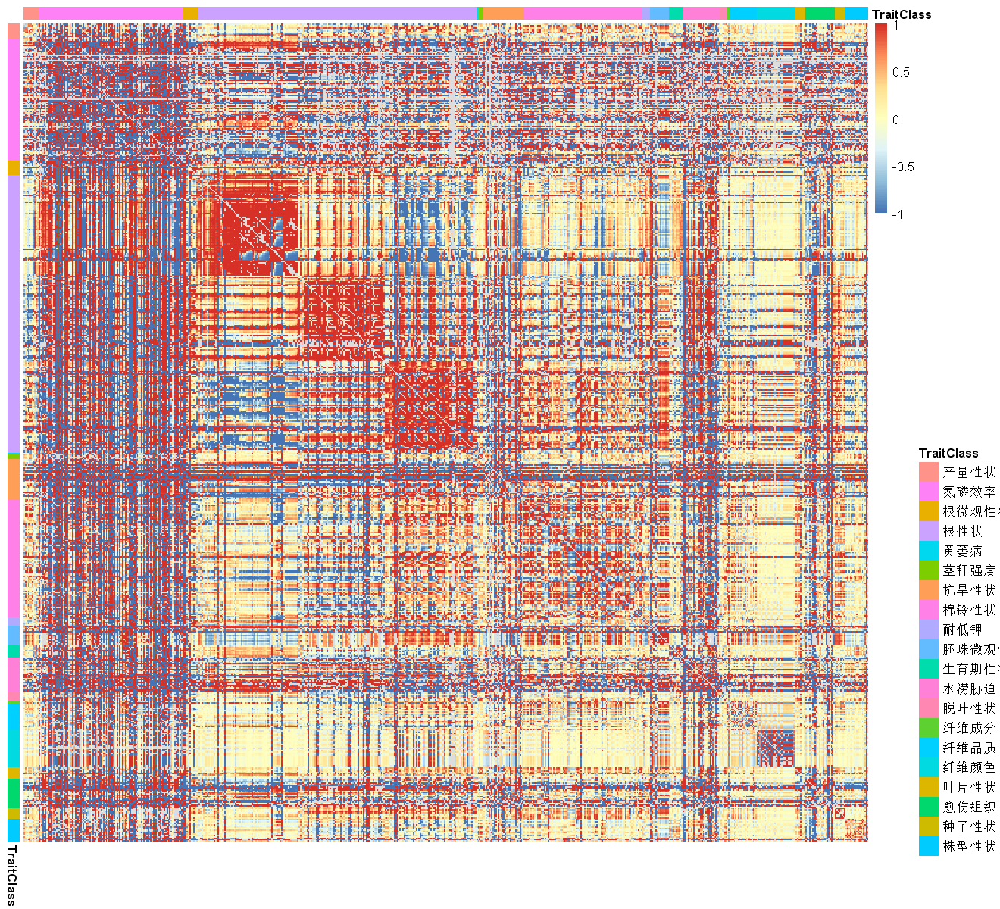

In [33]:
# generate heatmap input
df_rg %>% 
mutate(Trait_idx_1 = as.integer(Trait_idx_1)) %>% 
mutate(Trait_idx_2 = as.integer(Trait_idx_2)) %>% 
mutate(Trait1 = triat_vec[Trait_idx_1]) %>% 
mutate(Trait2 = triat_vec[Trait_idx_2]) %>% 
# subset(Trait_idx_1 < Trait_idx_2) %>% # 去除重复数据
.[c('Trait1', 'Trait2', 'rG')] %>% 
spread(Trait2, rG) %>% 
column_to_rownames('Trait1') -> rG_matrix


plot_pheatmap <- function(df, df_trait_class){
    trait_order <- df_trait_class %>% arrange(性状分类1) %>% .$TraitID
    
    ordered_row = setdiff(trait_order, setdiff(trait_order, rownames(df)))
    ordered_col = setdiff(trait_order, setdiff(trait_order, colnames(df)))
    data = df[ordered_row,  ordered_col]
    
    row_trait_class <- df_trait_class %>% subset(TraitID %in% rownames(df)) %>% distinct(TraitID, .keep_all = T) %>% arrange(性状分类1) %>% .$性状分类1
    col_trait_class <- df_trait_class %>% subset(TraitID %in% colnames(df)) %>% distinct(TraitID, .keep_all = T) %>% arrange(性状分类1) %>% .$性状分类1

    annotation_row <- data.frame(TraitClass = row_trait_class)
    rownames(annotation_row) <- ordered_row
    annotation_col <- data.frame(TraitClass = col_trait_class)
    rownames(annotation_col) <- ordered_col
    
    require(pheatmap)
    options(repr.plot.width = 11, repr.plot.height = 10)
    p <- data %>% 
        pheatmap(cluster_rows = FALSE,
                 cluster_cols = FALSE,
                 annotation_row = annotation_row,
                 annotation_col = annotation_col,
                 fontsize = 10,
                 show_rownames = F, 
                 show_colnames = F)
    return(p)
}

plot_pheatmap(rG_matrix, df_trait_class)

###### Filtered rG heatmap （Pval < 0.05）

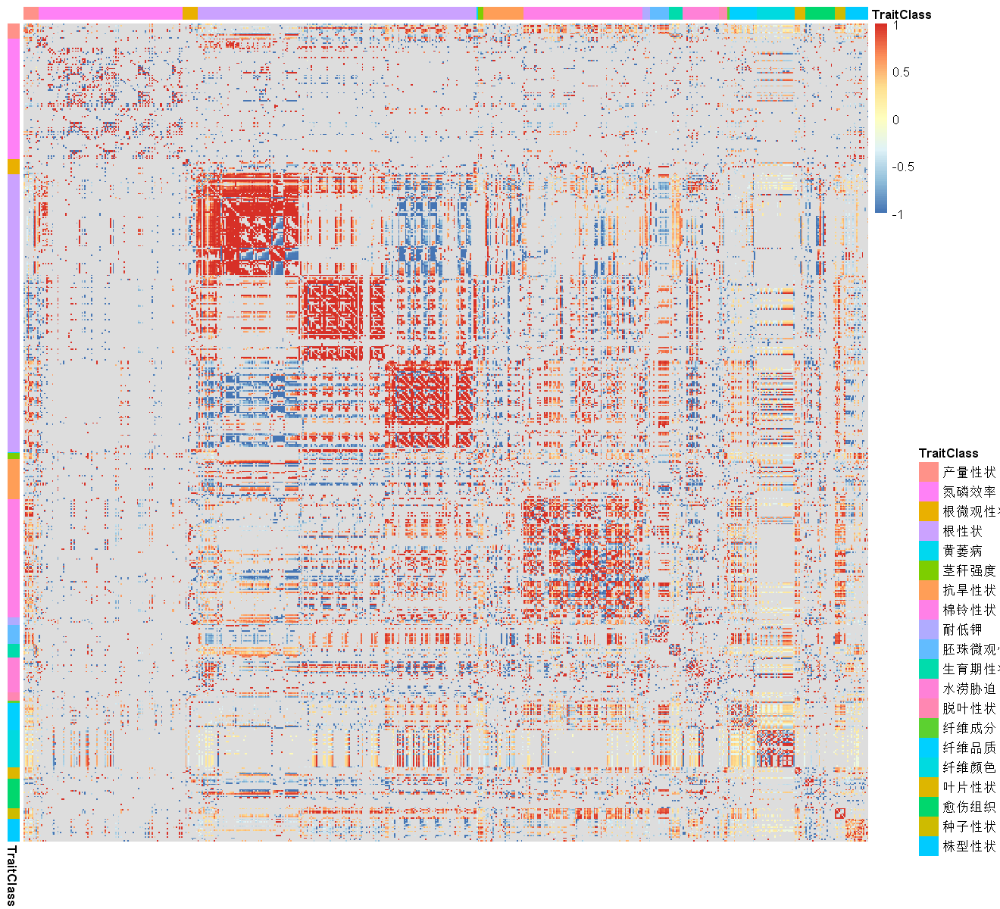

In [36]:
# generate heatmap input
df_rg %>% 
subset(Pval < 0.05) %>% 
mutate(Trait_idx_1 = as.integer(Trait_idx_1)) %>% 
mutate(Trait_idx_2 = as.integer(Trait_idx_2)) %>% 
mutate(Trait1 = triat_vec[Trait_idx_1]) %>% 
mutate(Trait2 = triat_vec[Trait_idx_2]) %>% 
# subset(Trait_idx_1 < Trait_idx_2) %>% # 去除重复数据
.[c('Trait1', 'Trait2', 'rG')] %>% 
spread(Trait2, rG) %>% 
column_to_rownames('Trait1') -> rG_matrix


plot_pheatmap <- function(df, df_trait_class){
    trait_order <- df_trait_class %>% arrange(性状分类1) %>% .$TraitID
    
    ordered_row = setdiff(trait_order, setdiff(trait_order, rownames(df)))
    ordered_col = setdiff(trait_order, setdiff(trait_order, colnames(df)))
    data = df[ordered_row,  ordered_col]
    
    row_trait_class <- df_trait_class %>% subset(TraitID %in% rownames(df)) %>% distinct(TraitID, .keep_all = T) %>% arrange(性状分类1) %>% .$性状分类1
    col_trait_class <- df_trait_class %>% subset(TraitID %in% colnames(df)) %>% distinct(TraitID, .keep_all = T) %>% arrange(性状分类1) %>% .$性状分类1

    annotation_row <- data.frame(TraitClass = row_trait_class)
    rownames(annotation_row) <- ordered_row
    annotation_col <- data.frame(TraitClass = col_trait_class)
    rownames(annotation_col) <- ordered_col
    
    require(pheatmap)
    options(repr.plot.width = 11, repr.plot.height = 10)
    p <- data %>% 
        pheatmap(cluster_rows = FALSE,
                 cluster_cols = FALSE,
                 annotation_row = annotation_row,
                 annotation_col = annotation_col,
                 fontsize = 10,
                 show_rownames = F, 
                 show_colnames = F)
    return(p)
}

plot_pheatmap(rG_matrix, df_trait_class)

###### 分析rG =  ± 1 的原因¶

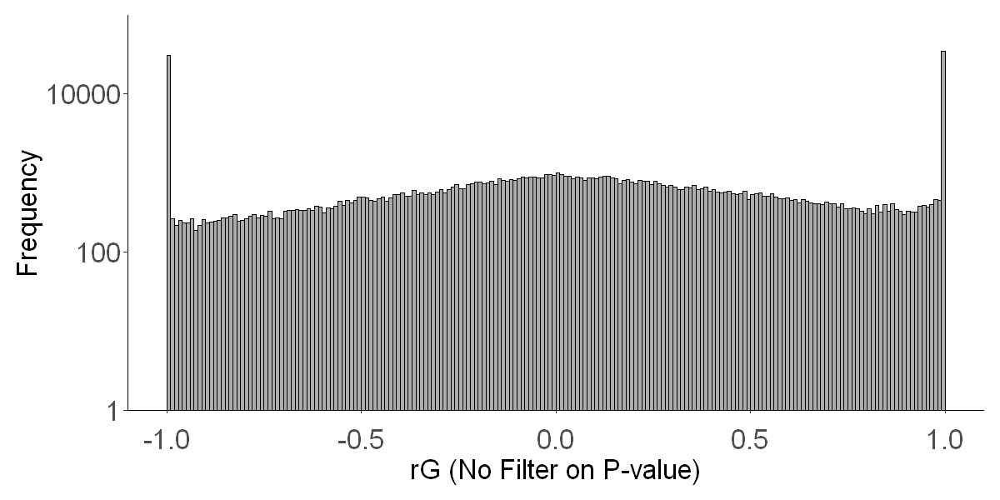

In [62]:
#
options(repr.plot.width = 10, repr.plot.height = 5)

df_rg %>% 
subset(Trait_idx_1 > Trait_idx_2) %>% 
# subset(Pval < 0.05) %>% 
ggplot(aes(rG)) + 
    geom_histogram(na.rm = T, binwidth = 0.01, boundary=TRUE, alpha=0.5, color='black') + 
#     scale_y_continuous(expand = expansion(mult = c(0, 0.1))) +
    scale_y_log10(expand = expansion(mult = c(0, 0.1))) +
    xlab('rG (No Filter on P-value)') +
    ylab('Frequency') + 
    theme_classic() +
    theme(axis.text.y = element_text(size = 20),
          axis.text.x = element_text(size = 20, margin = margin(t = 10)),
          axis.title = element_text(size = 20),
          axis.title.x  = element_text(size = 20),
          legend.text = element_text(size = 20),
          legend.title = element_text(size = 20),
          plot.margin = unit(c(0.4,0.4,0.4,0.4),'cm'))

Warning message:
"Transformation introduced infinite values in continuous y-axis"


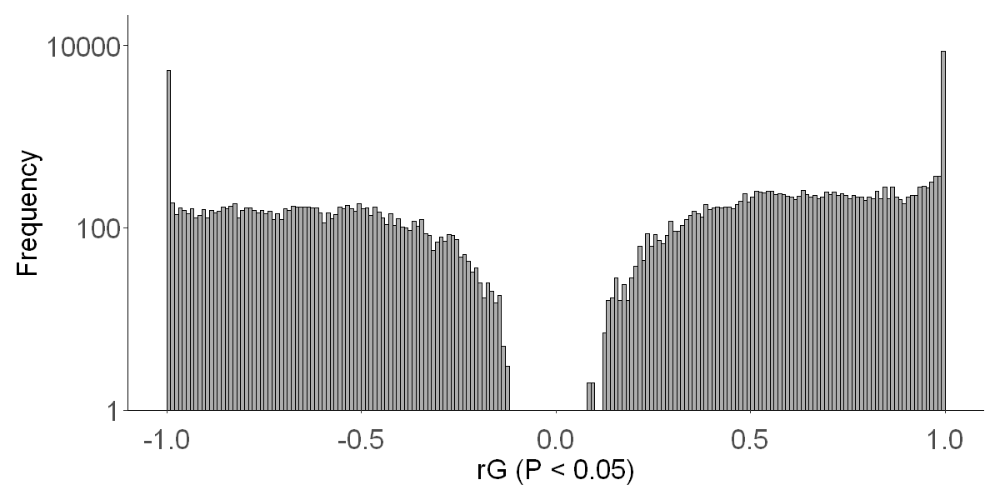

In [59]:
#
options(repr.plot.width = 10, repr.plot.height = 5)

df_rg %>% 
subset(Trait_idx_1 > Trait_idx_2) %>% 
subset(Pval < 0.05) %>% 
ggplot(aes(rG)) + 
    geom_histogram(na.rm = T, binwidth = 0.01, boundary=TRUE, alpha=0.5, color='black') + 
#     scale_y_continuous(expand = expansion(mult = c(0, 0.1))) +
    scale_y_log10(expand = expansion(mult = c(0, 0.1))) +
    xlab('rG (P < 0.05)') +
    ylab('Frequency') + 
    theme_classic() +
    theme(axis.text.y = element_text(size = 20),
          axis.text.x = element_text(size = 20, margin = margin(t = 10)),
          axis.title = element_text(size = 20),
          axis.title.x  = element_text(size = 20),
          legend.text = element_text(size = 20),
          legend.title = element_text(size = 20),
          plot.margin = unit(c(0.4,0.4,0.4,0.4),'cm'))

In [130]:
plot_pair_trait <- function(df_blup, trait1, trait2){
    tmp1 = df_blup[c( trait1, trait2)]
    tmp2 = df_blup[c('ID', trait1, trait2)]

    pearson_cor <- cor(tmp1, use = 'pairwise.complete.obs')[1,2]

    tmp <- tmp2 %>% 
        gather(Trait, Value, 2:3)

    options(repr.plot.width = 5, repr.plot.height = 5)
    p <- tmp %>% ggplot(aes(Trait, Value)) +
        geom_violin() +
        geom_point() +
        geom_line(aes(group = ID), alpha=0.5, color = 'grey60') +
        xlab(paste0('Pearson Coeff is: ', round(pearson_cor, 2))) + 
        theme_classic() +
        theme(axis.text.y = element_text(size = 20),
              axis.text.x = element_text(size = 20, margin = margin(t = 10)),
              axis.title = element_text(size = 20),
              axis.title.x  = element_text(size = 20, color = 'darkred', margin = margin(t = 10)),
              legend.text = element_text(size = 20),
              legend.title = element_text(size = 20),
              plot.margin = unit(c(0.4,0.4,0.4,0.4),'cm'))
    return(p)
}

- 成对比较rG = 1

In [131]:
tmp <- df_rg %>% 
subset(Trait_idx_1 > Trait_idx_2) %>% 
subset(Pval < 0.05) %>% 
subset(rG == 1)

set.seed(999)
row_idx <- sample(rownames(tmp), 100)
tmp <- tmp[row_idx, ]

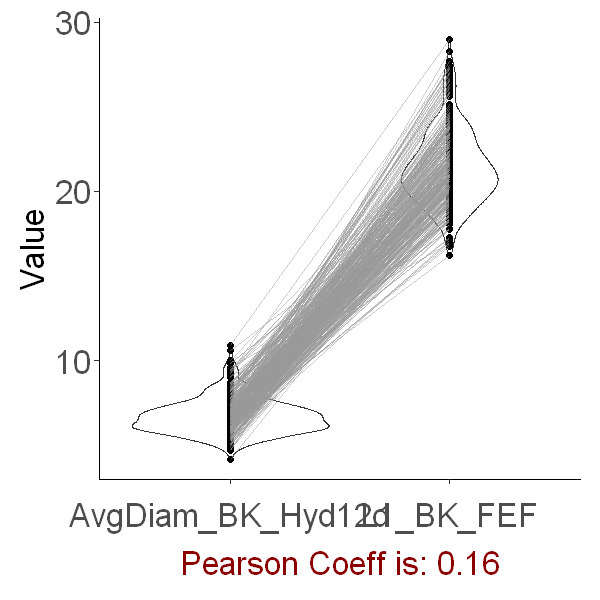

Warning message:
"Removed 12 rows containing non-finite values (stat_ydensity)."
Warning message:
"Removed 12 rows containing missing values (geom_point)."
Warning message:
"Removed 12 row(s) containing missing values (geom_path)."


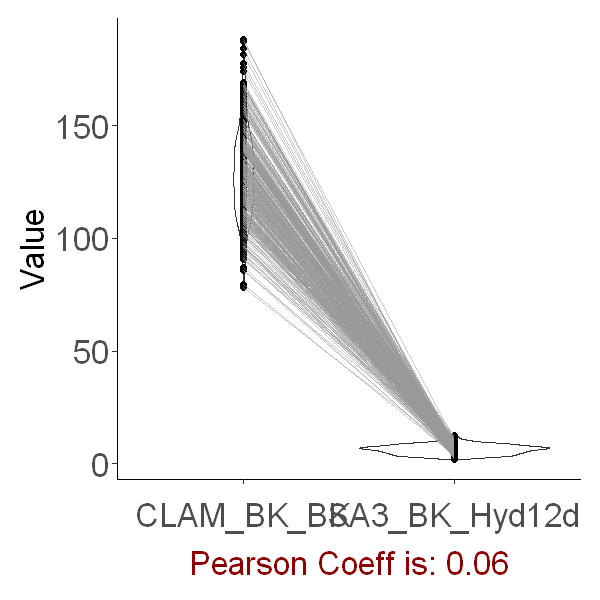

Warning message:
"Removed 5 rows containing non-finite values (stat_ydensity)."
Warning message:
"Removed 5 rows containing missing values (geom_point)."
Warning message:
"Removed 5 row(s) containing missing values (geom_path)."


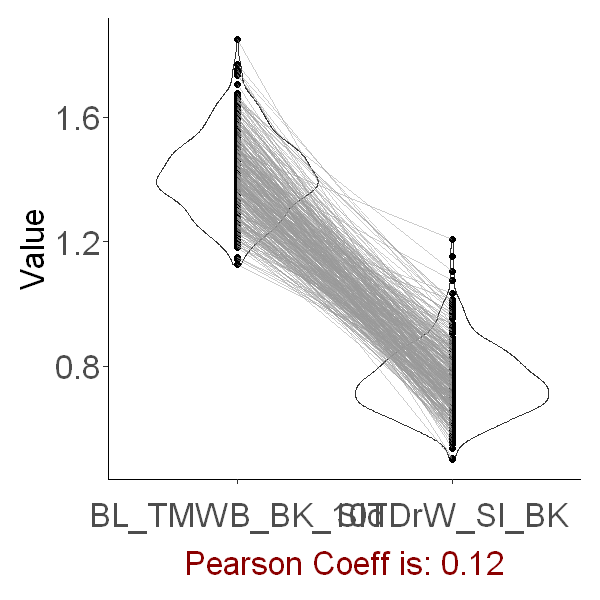

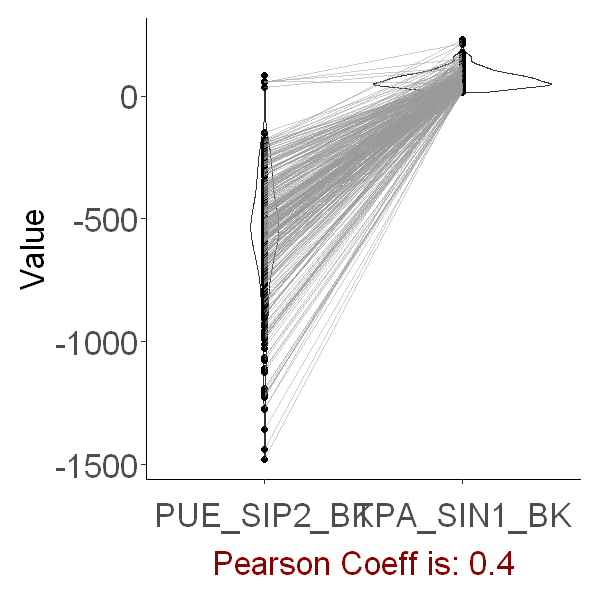

Warning message:
"Removed 39 rows containing non-finite values (stat_ydensity)."
Warning message:
"Removed 39 rows containing missing values (geom_point)."
Warning message:
"Removed 39 row(s) containing missing values (geom_path)."


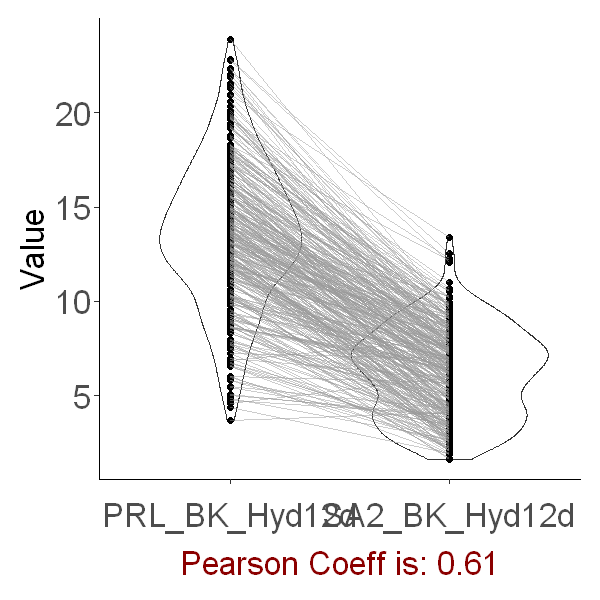

Warning message:
"Removed 8 rows containing non-finite values (stat_ydensity)."
Warning message:
"Removed 8 rows containing missing values (geom_point)."
Warning message:
"Removed 8 row(s) containing missing values (geom_path)."


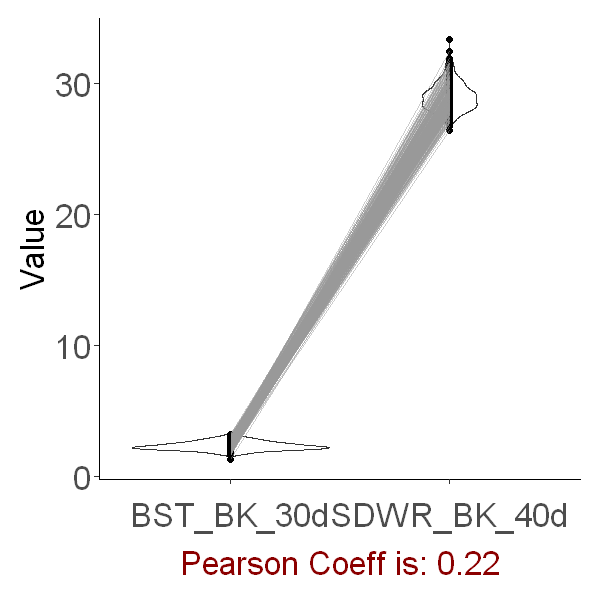

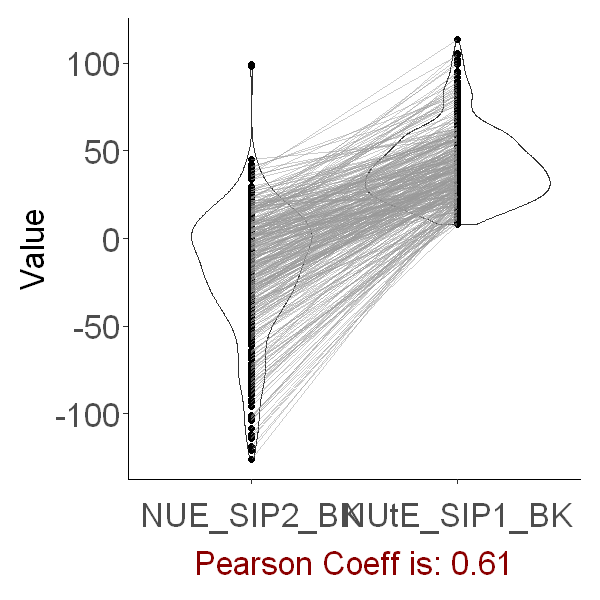

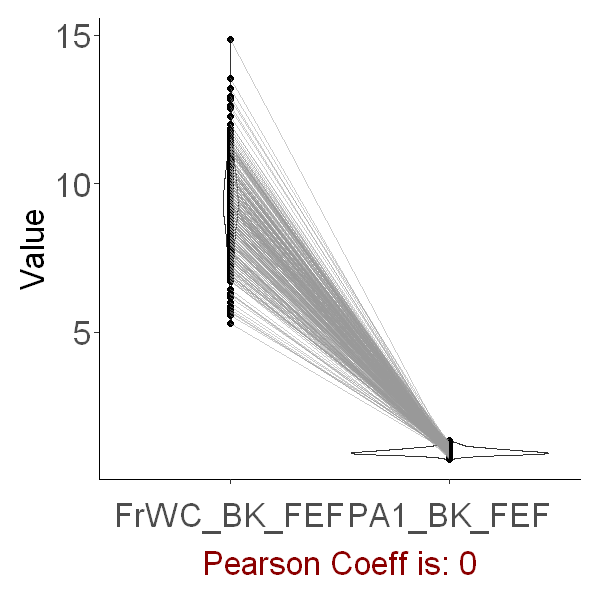

Warning message:
"Removed 1 rows containing non-finite values (stat_ydensity)."
Warning message:
"Removed 1 rows containing missing values (geom_point)."
Warning message:
"Removed 1 row(s) containing missing values (geom_path)."


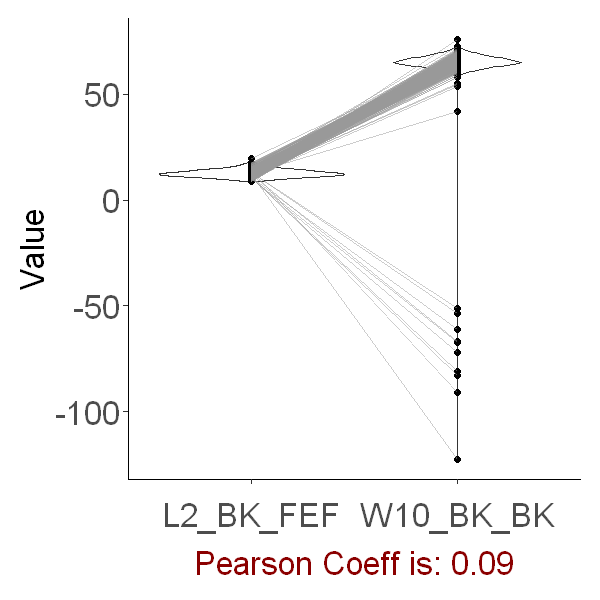

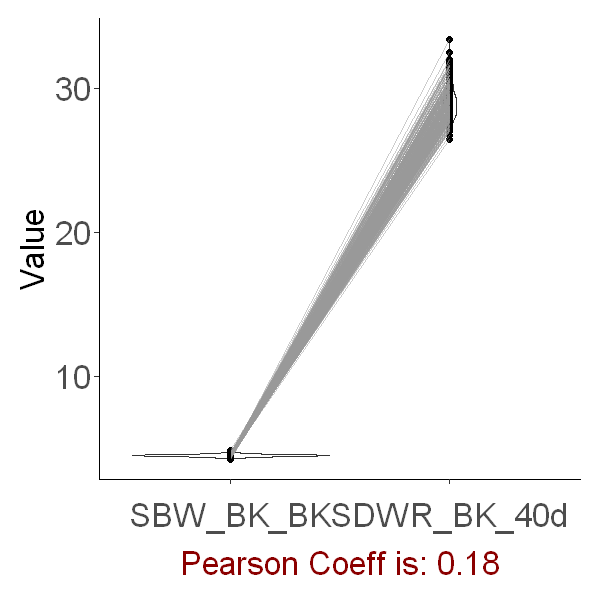

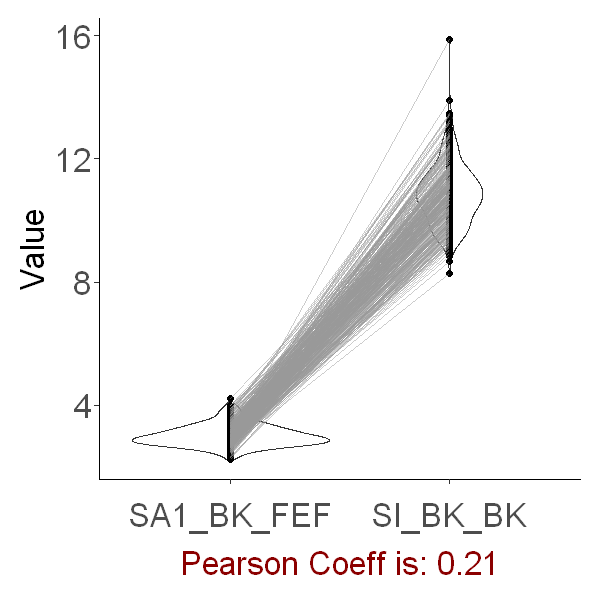

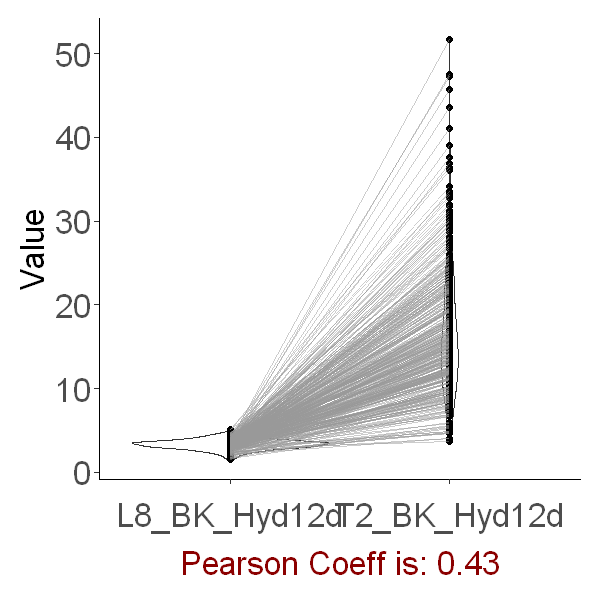

Warning message:
"Removed 10 rows containing non-finite values (stat_ydensity)."
Warning message:
"Removed 10 rows containing missing values (geom_point)."
Warning message:
"Removed 10 row(s) containing missing values (geom_path)."


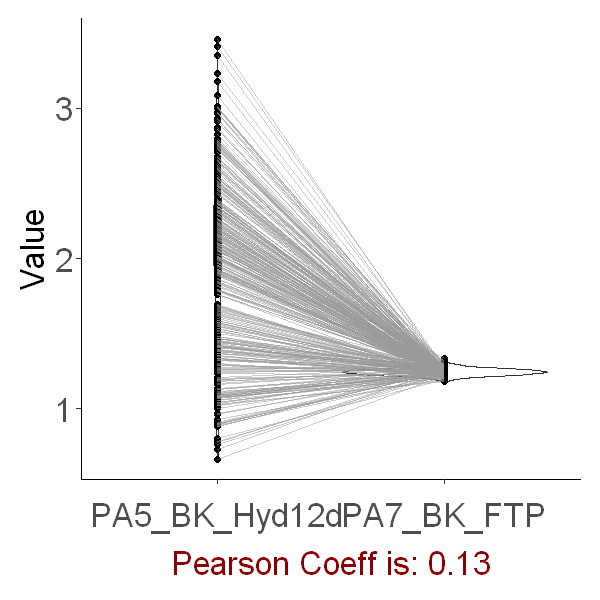

Warning message:
"Removed 4 rows containing non-finite values (stat_ydensity)."
Warning message:
"Removed 4 rows containing missing values (geom_point)."
Warning message:
"Removed 4 row(s) containing missing values (geom_path)."


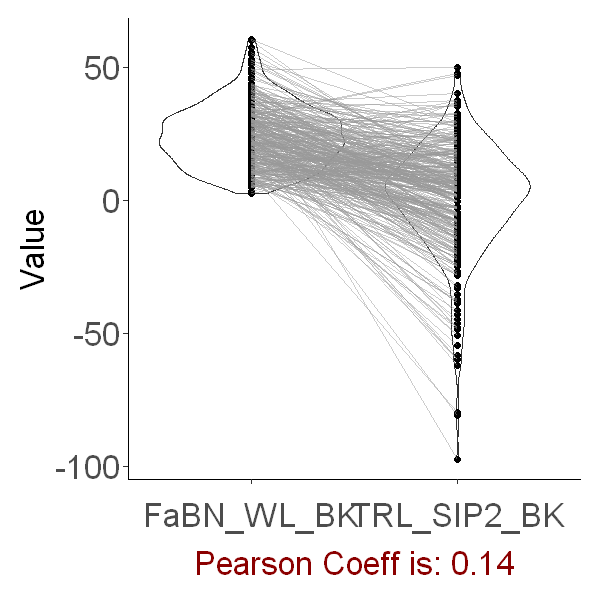

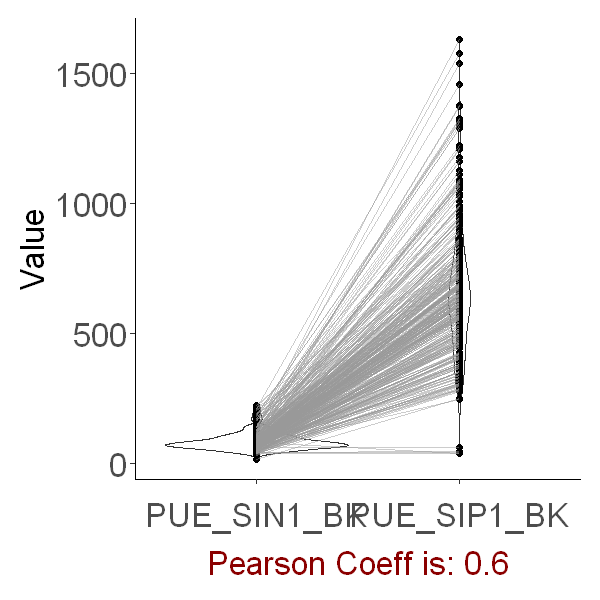

Warning message:
"Removed 9 rows containing non-finite values (stat_ydensity)."
Warning message:
"Removed 9 rows containing missing values (geom_point)."
Warning message:
"Removed 9 row(s) containing missing values (geom_path)."


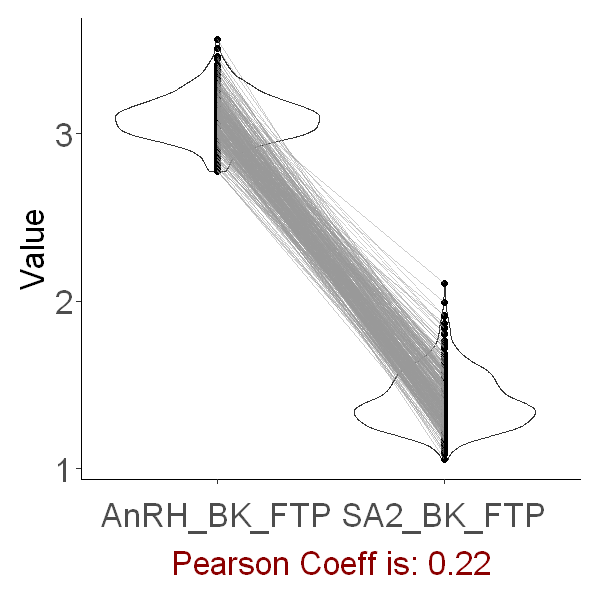

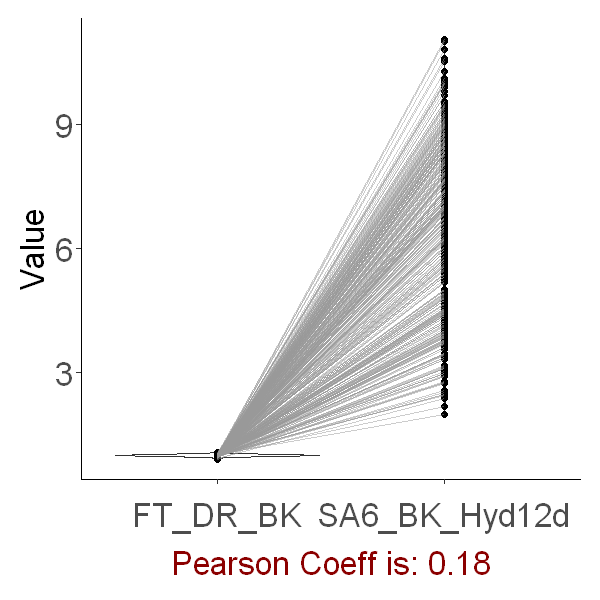

Warning message:
"Removed 66 rows containing non-finite values (stat_ydensity)."
Warning message:
"Removed 66 rows containing missing values (geom_point)."
Warning message:
"Removed 66 row(s) containing missing values (geom_path)."


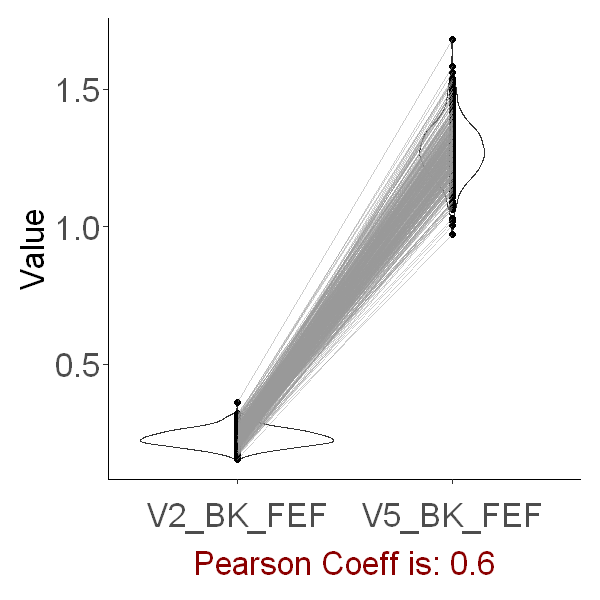

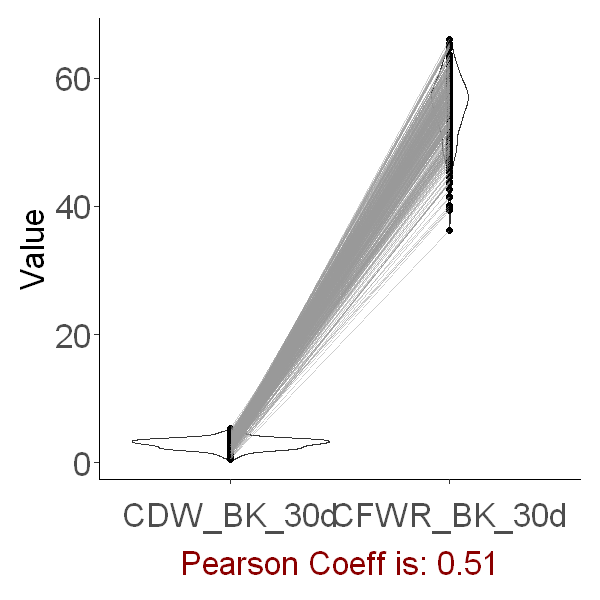

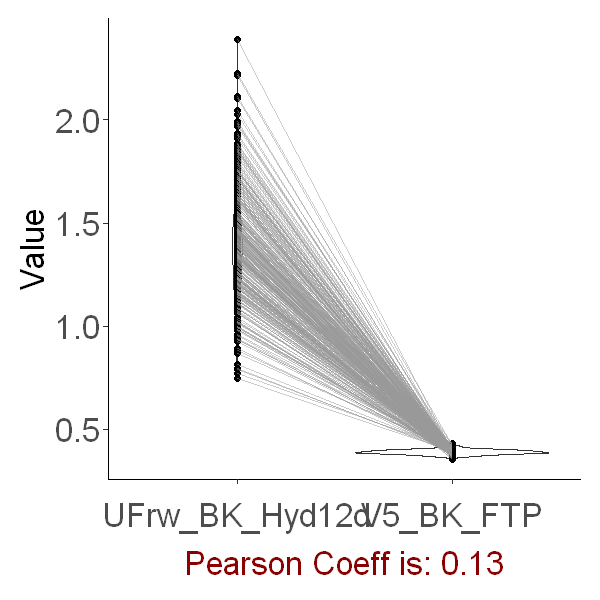

Warning message:
"Removed 50 rows containing non-finite values (stat_ydensity)."
Warning message:
"Removed 50 rows containing missing values (geom_point)."
Warning message:
"Removed 50 row(s) containing missing values (geom_path)."


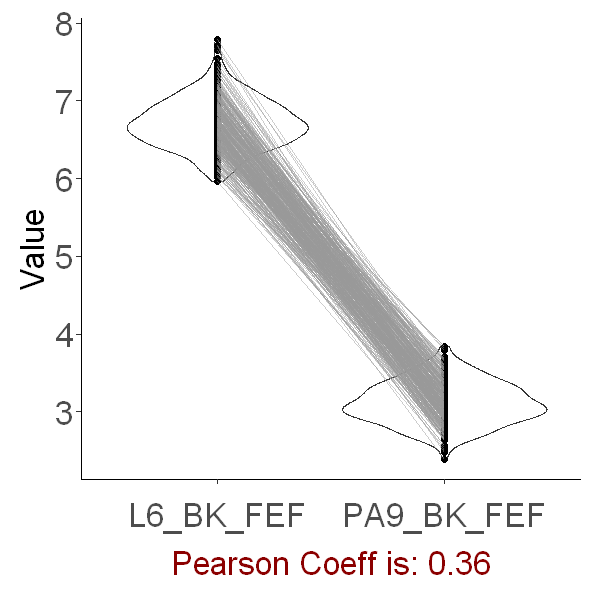

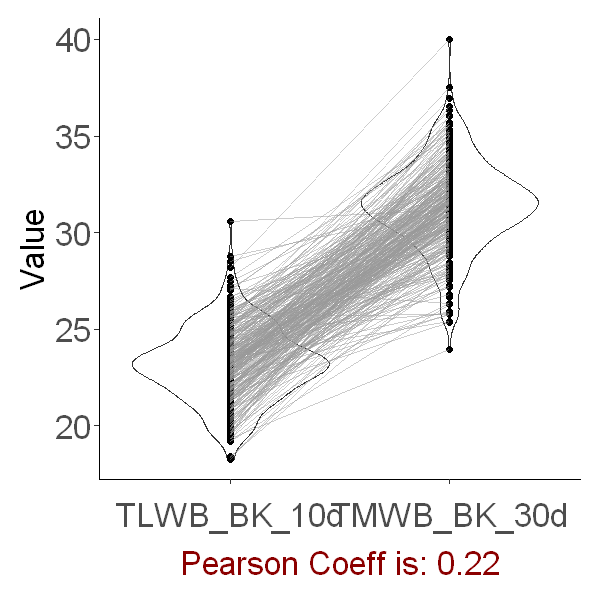

Warning message:
"Removed 70 rows containing non-finite values (stat_ydensity)."
Warning message:
"Removed 70 rows containing missing values (geom_point)."
Warning message:
"Removed 70 row(s) containing missing values (geom_path)."


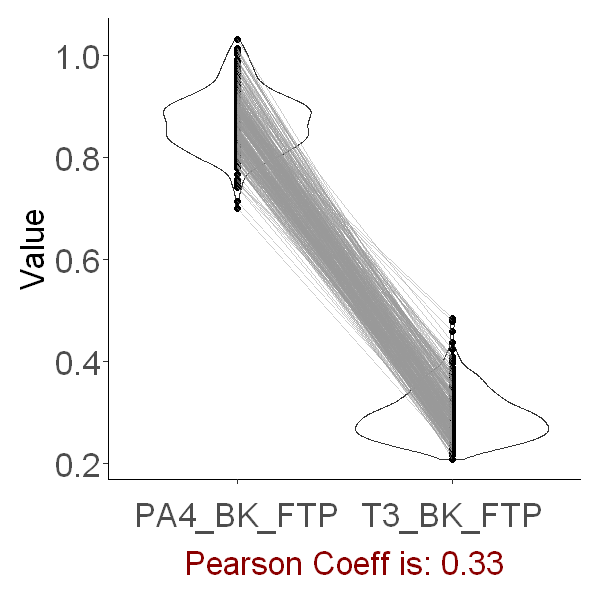

Warning message:
"Removed 9 rows containing non-finite values (stat_ydensity)."
Warning message:
"Removed 9 rows containing missing values (geom_point)."
Warning message:
"Removed 9 row(s) containing missing values (geom_path)."


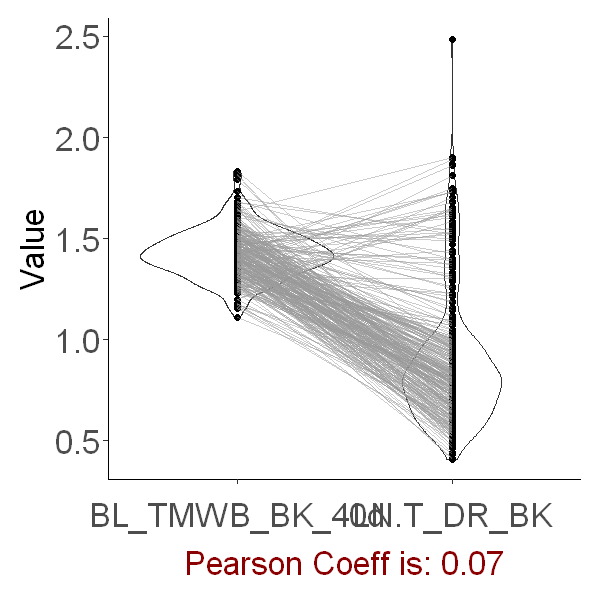

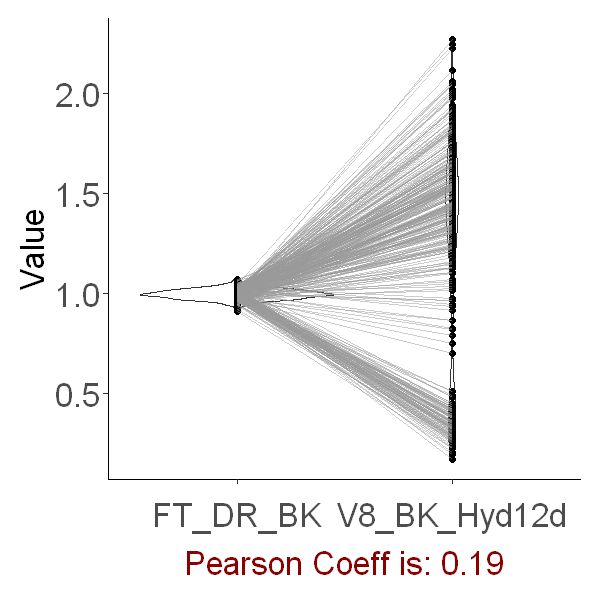

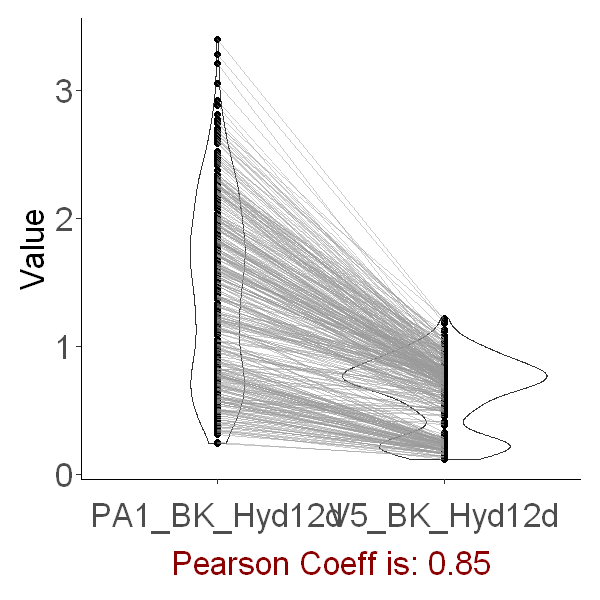

Warning message:
"Removed 1 rows containing non-finite values (stat_ydensity)."
Warning message:
"Removed 1 rows containing missing values (geom_point)."
Warning message:
"Removed 1 row(s) containing missing values (geom_path)."


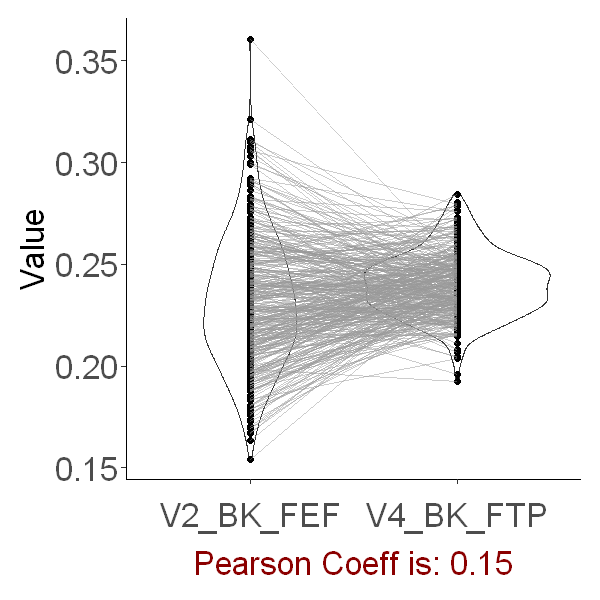

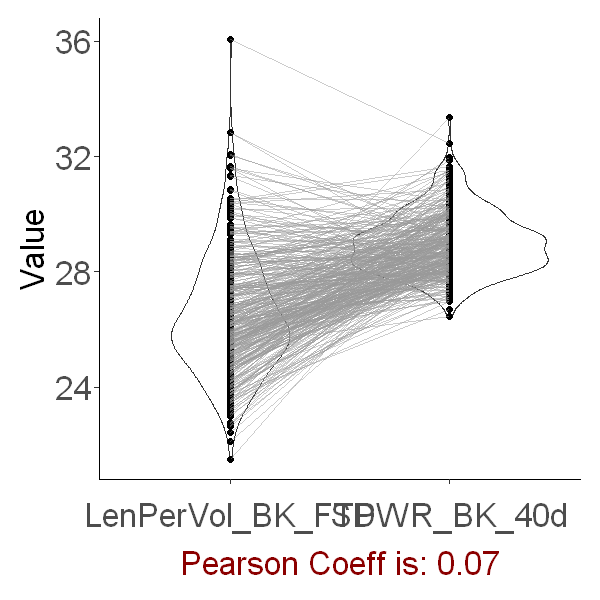

Warning message:
"Removed 64 rows containing non-finite values (stat_ydensity)."
Warning message:
"Removed 64 rows containing missing values (geom_point)."
Warning message:
"Removed 64 row(s) containing missing values (geom_path)."


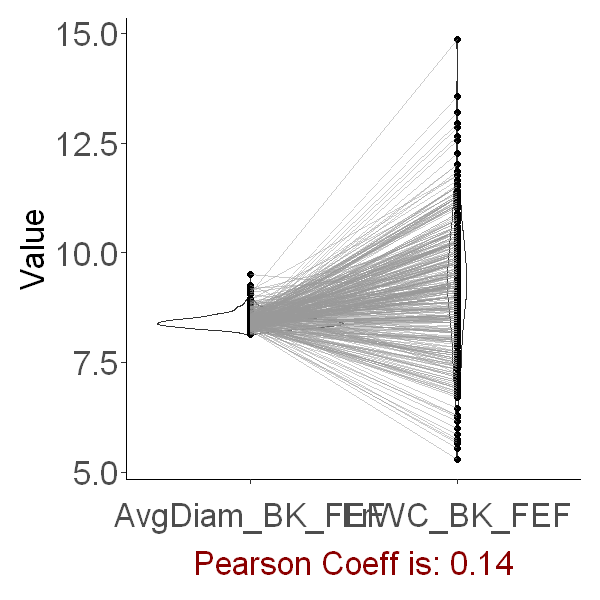

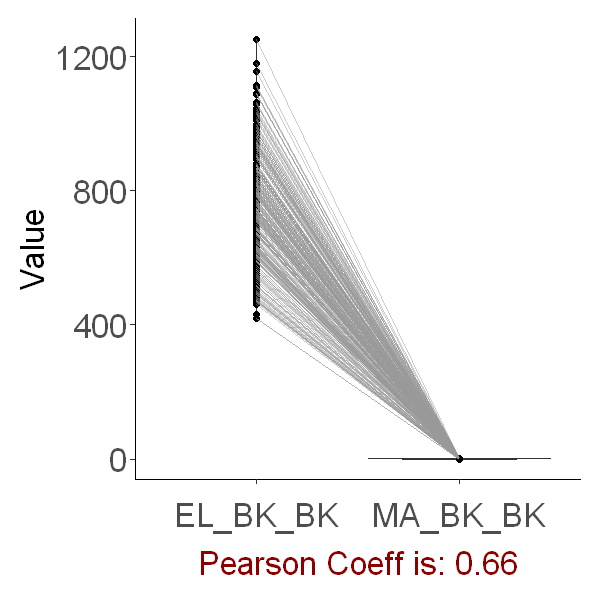

Warning message:
"Removed 2 rows containing non-finite values (stat_ydensity)."
Warning message:
"Removed 2 rows containing missing values (geom_point)."
Warning message:
"Removed 2 row(s) containing missing values (geom_path)."


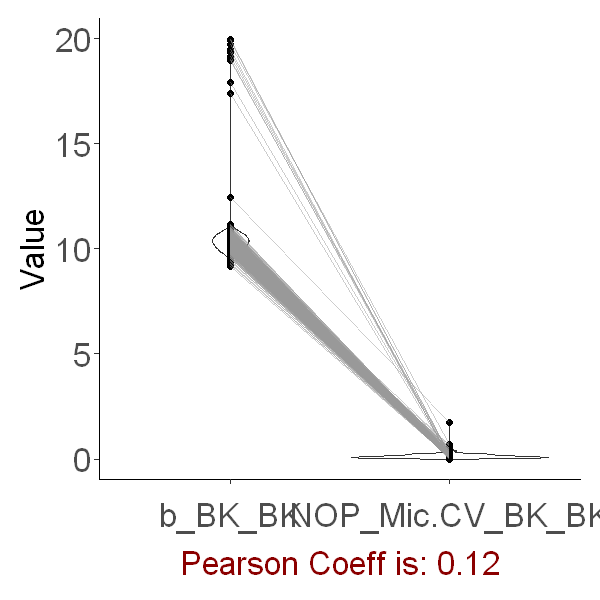

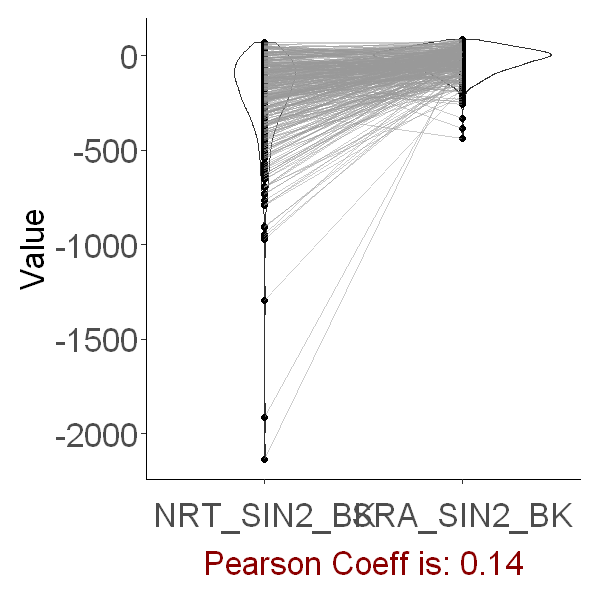

Warning message:
"Removed 44 rows containing non-finite values (stat_ydensity)."
Warning message:
"Removed 44 rows containing missing values (geom_point)."
Warning message:
"Removed 44 row(s) containing missing values (geom_path)."


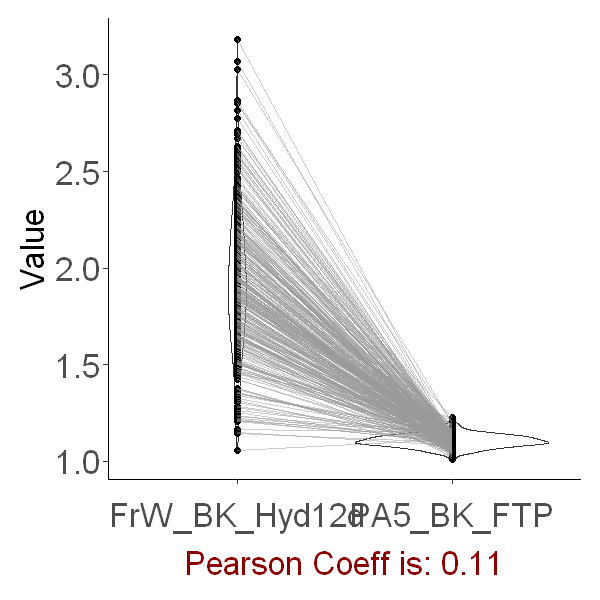

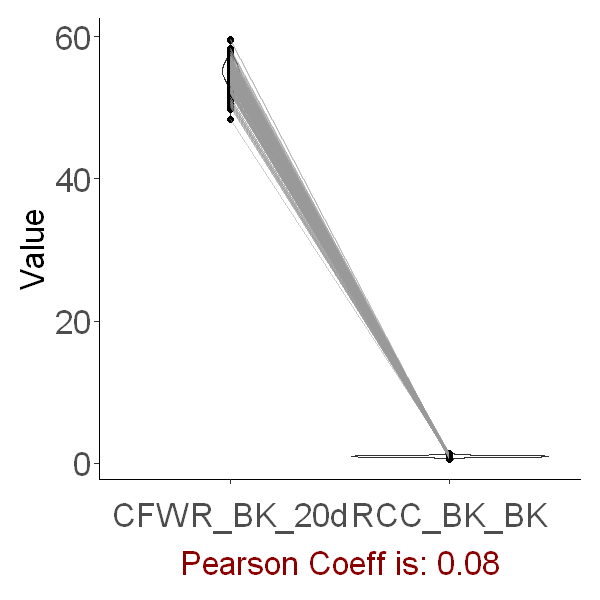

Warning message:
"Removed 2 rows containing non-finite values (stat_ydensity)."
Warning message:
"Removed 2 rows containing missing values (geom_point)."
Warning message:
"Removed 2 row(s) containing missing values (geom_path)."


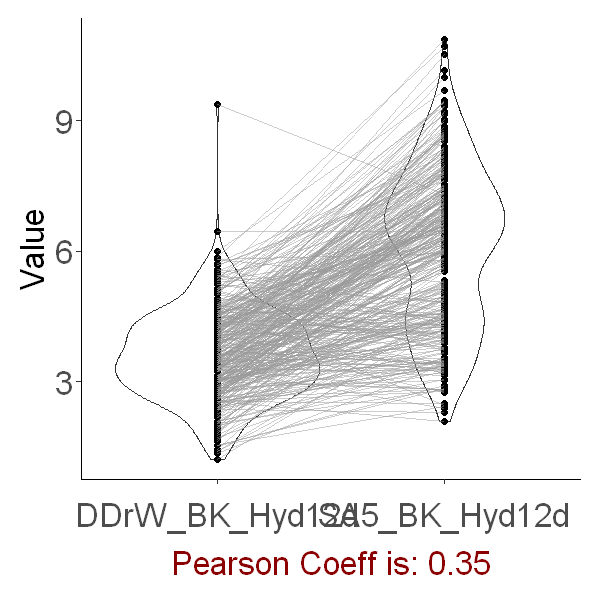

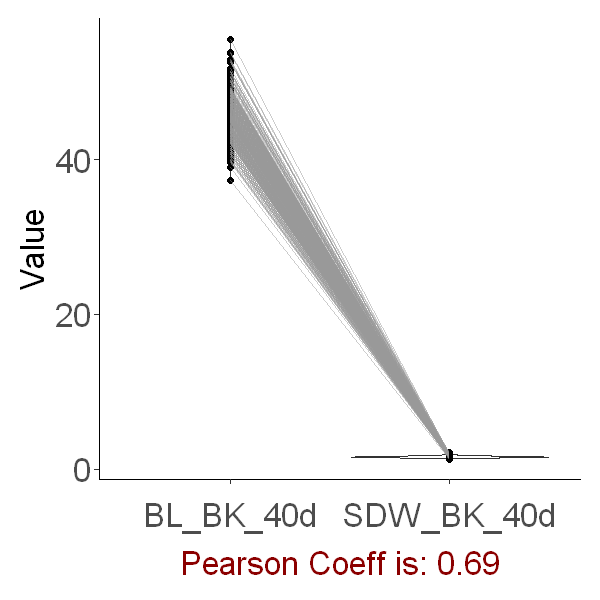

Warning message:
"Removed 21 rows containing non-finite values (stat_ydensity)."
Warning message:
"Removed 21 rows containing missing values (geom_point)."
Warning message:
"Removed 21 row(s) containing missing values (geom_path)."


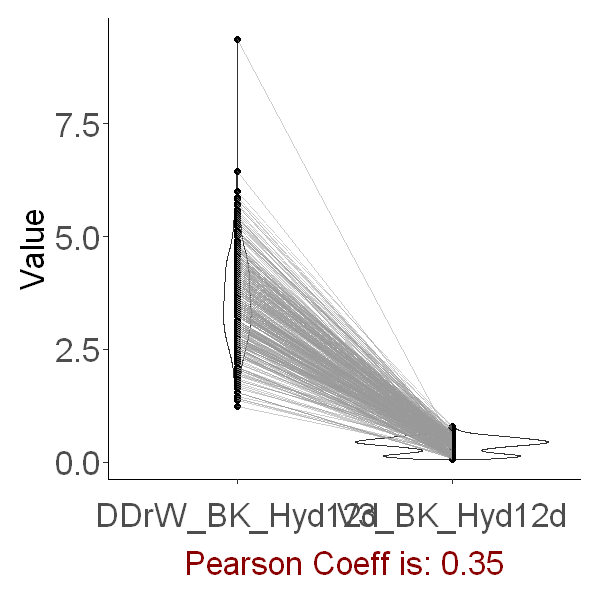

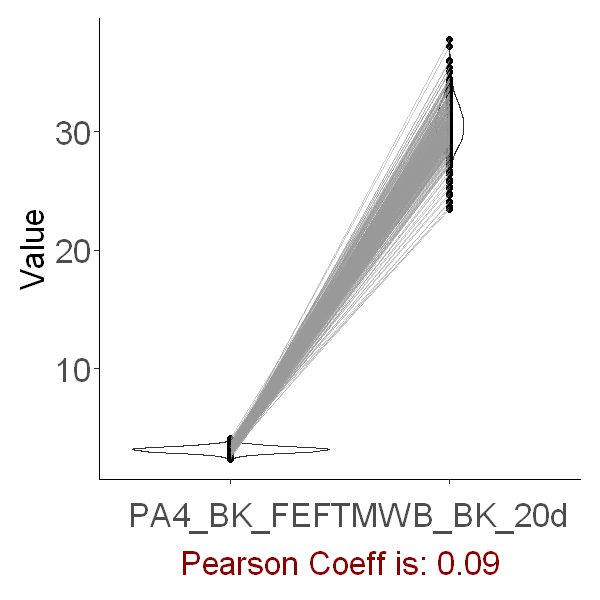

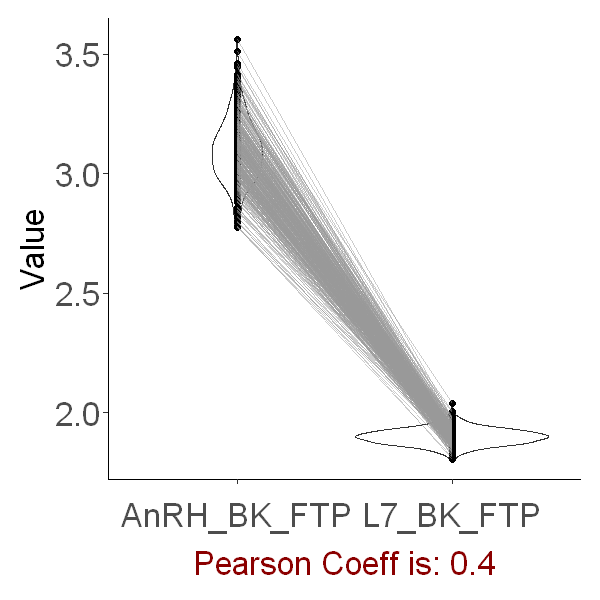

Warning message:
"Removed 127 rows containing non-finite values (stat_ydensity)."
Warning message:
"Removed 127 rows containing missing values (geom_point)."
Warning message:
"Removed 127 row(s) containing missing values (geom_path)."


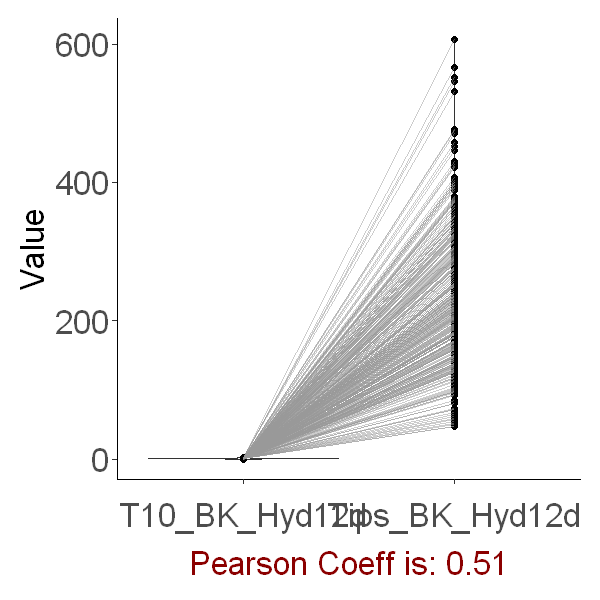

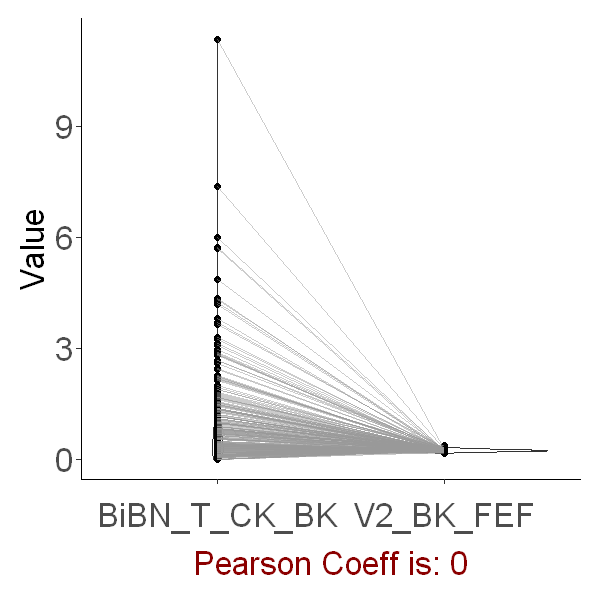

Warning message:
"Removed 1 rows containing non-finite values (stat_ydensity)."
Warning message:
"Removed 1 rows containing missing values (geom_point)."
Warning message:
"Removed 1 row(s) containing missing values (geom_path)."


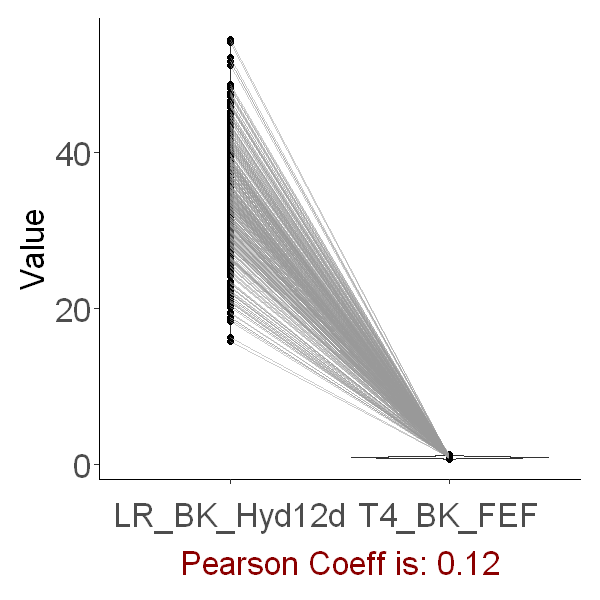

Warning message:
"Removed 2 rows containing non-finite values (stat_ydensity)."
Warning message:
"Removed 2 rows containing missing values (geom_point)."
Warning message:
"Removed 2 row(s) containing missing values (geom_path)."


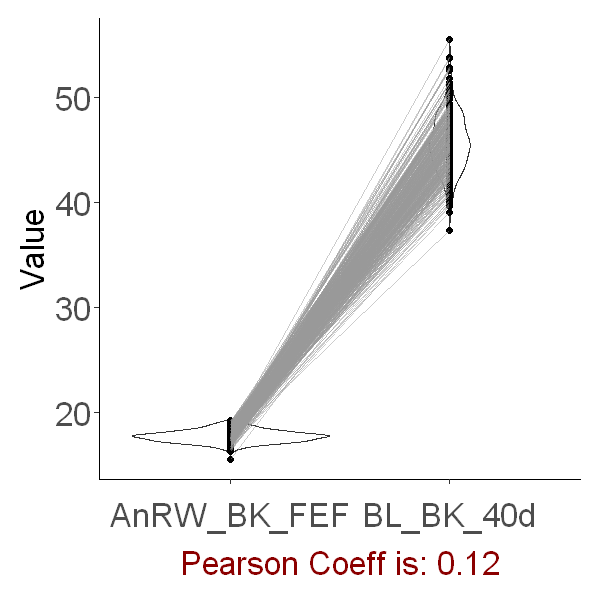

Warning message:
"Removed 127 rows containing non-finite values (stat_ydensity)."
Warning message:
"Removed 127 rows containing missing values (geom_point)."
Warning message:
"Removed 127 row(s) containing missing values (geom_path)."


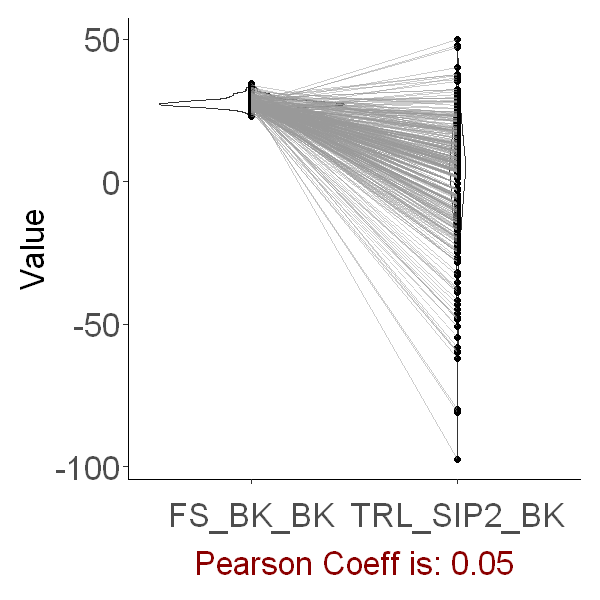

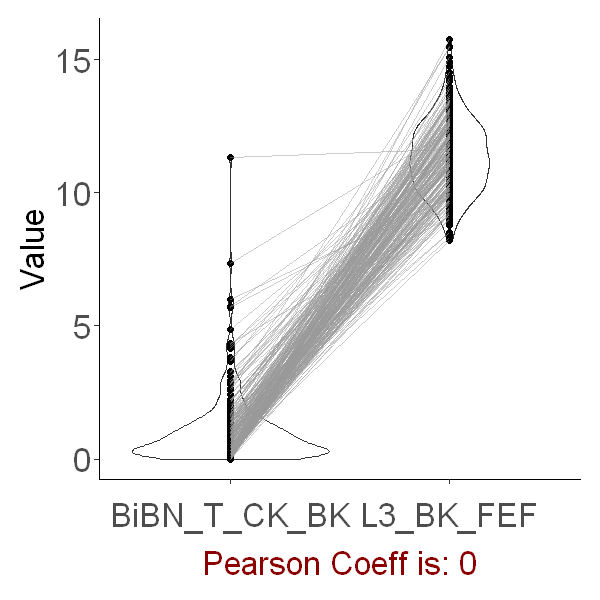

Warning message:
"Removed 1 rows containing non-finite values (stat_ydensity)."
Warning message:
"Removed 1 rows containing missing values (geom_point)."
Warning message:
"Removed 1 row(s) containing missing values (geom_path)."


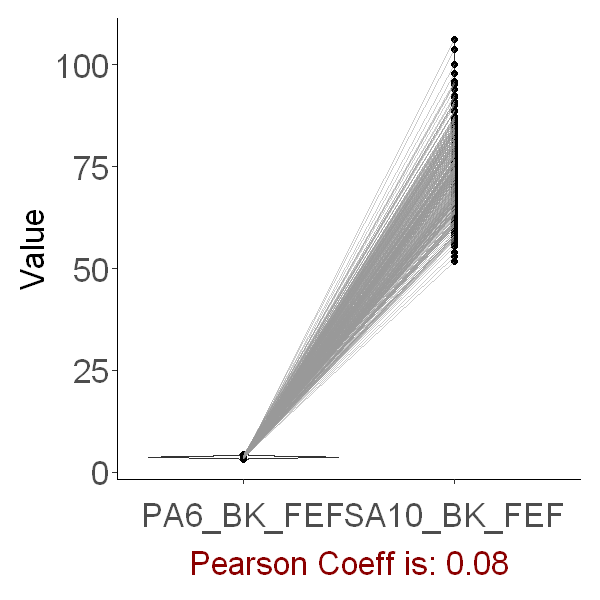

Warning message:
"Removed 33 rows containing non-finite values (stat_ydensity)."
Warning message:
"Removed 33 rows containing missing values (geom_point)."
Warning message:
"Removed 33 row(s) containing missing values (geom_path)."


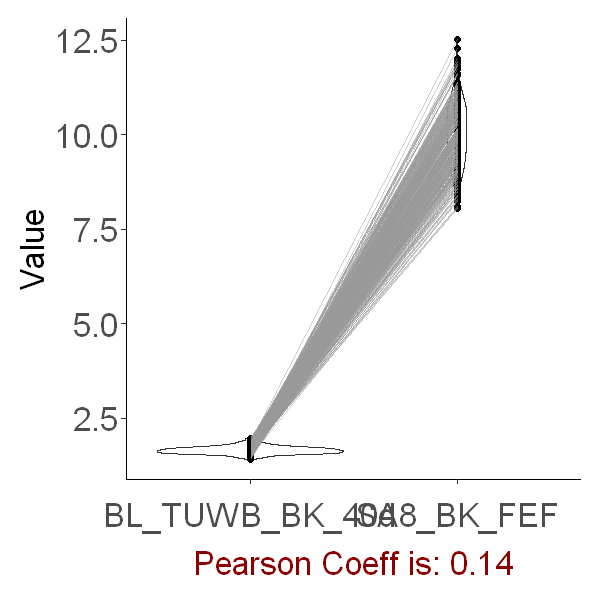

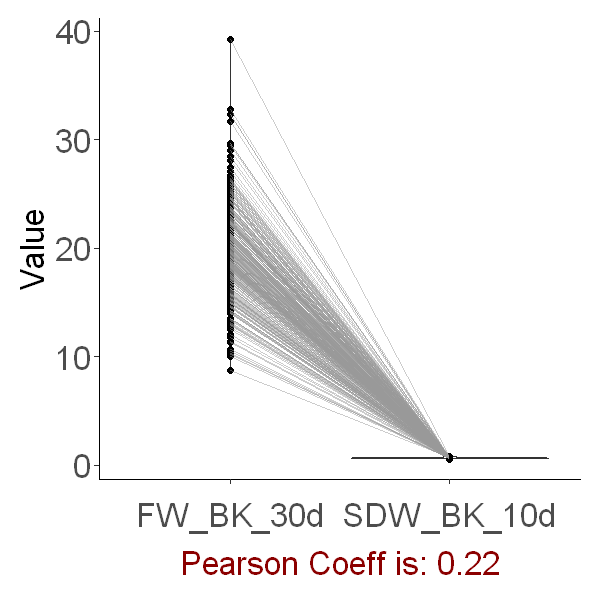

Warning message:
"Removed 1 rows containing non-finite values (stat_ydensity)."
Warning message:
"Removed 1 rows containing missing values (geom_point)."
Warning message:
"Removed 1 row(s) containing missing values (geom_path)."


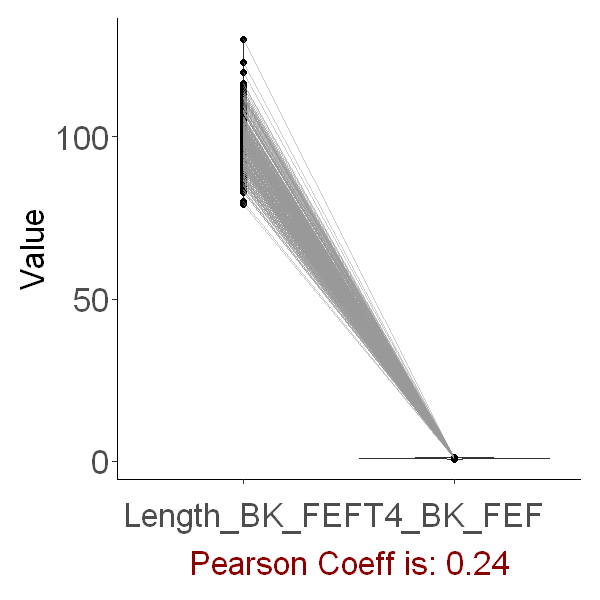

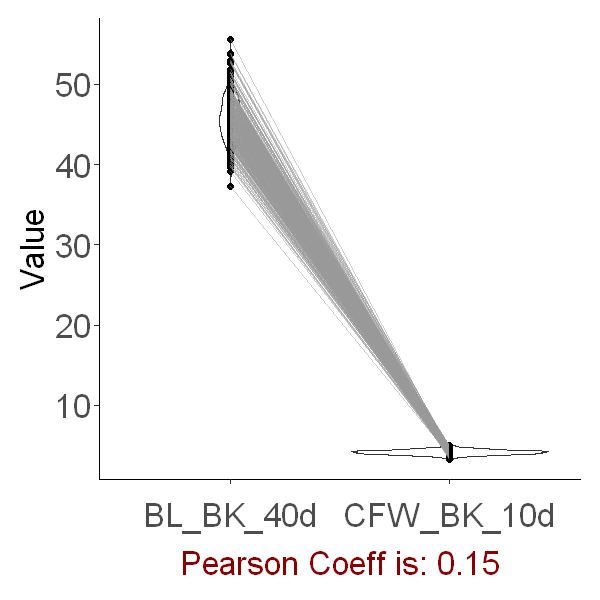

Warning message:
"Removed 71 rows containing non-finite values (stat_ydensity)."
Warning message:
"Removed 71 rows containing missing values (geom_point)."
Warning message:
"Removed 71 row(s) containing missing values (geom_path)."


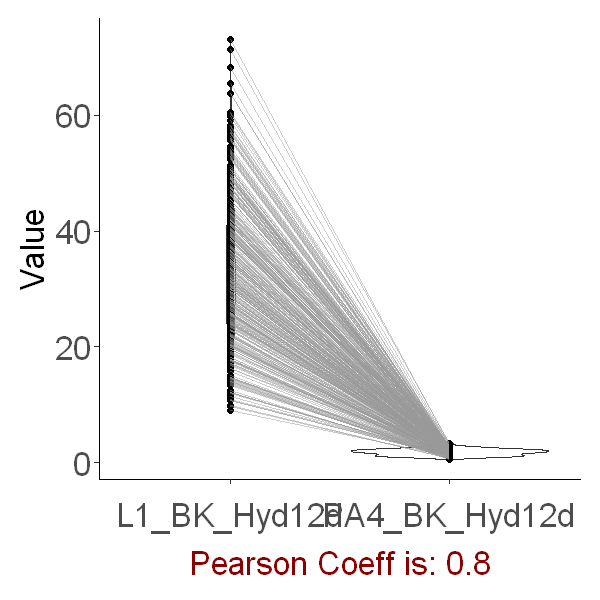

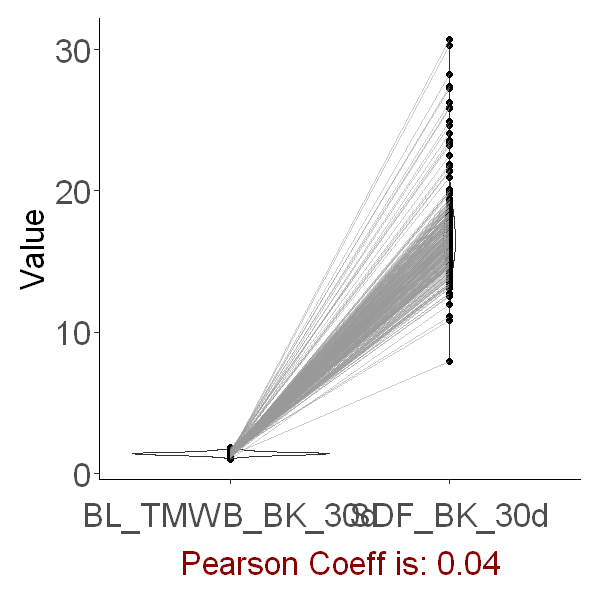

Warning message:
"Removed 1 rows containing non-finite values (stat_ydensity)."
Warning message:
"Removed 1 rows containing missing values (geom_point)."
Warning message:
"Removed 1 row(s) containing missing values (geom_path)."


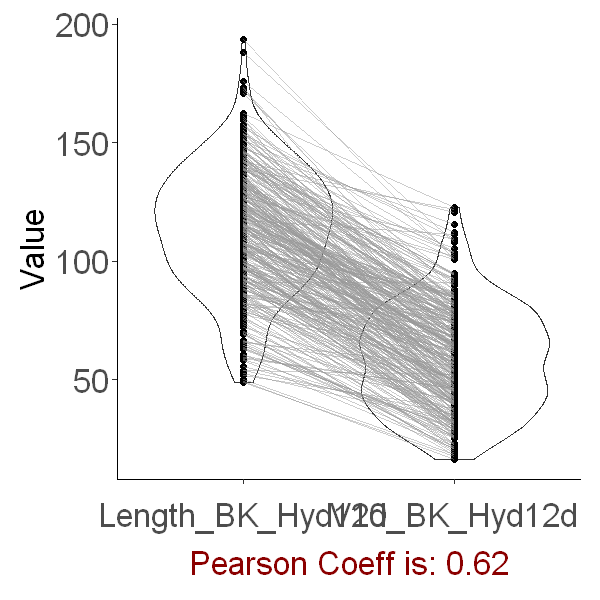

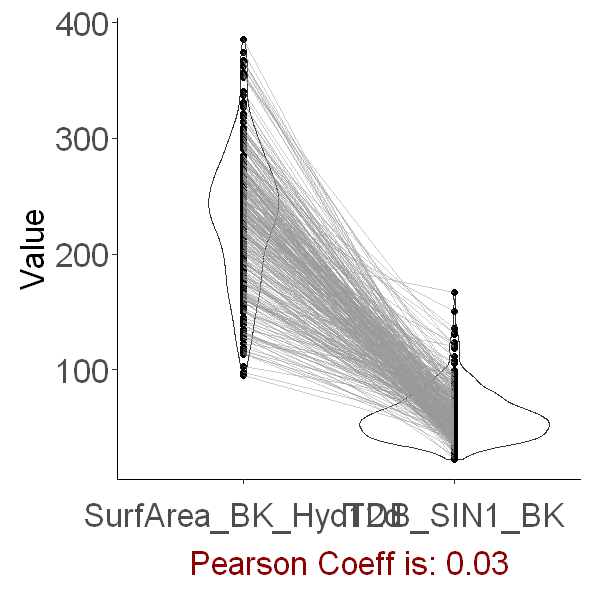

Warning message:
"Removed 33 rows containing non-finite values (stat_ydensity)."
Warning message:
"Removed 33 rows containing missing values (geom_point)."
Warning message:
"Removed 33 row(s) containing missing values (geom_path)."


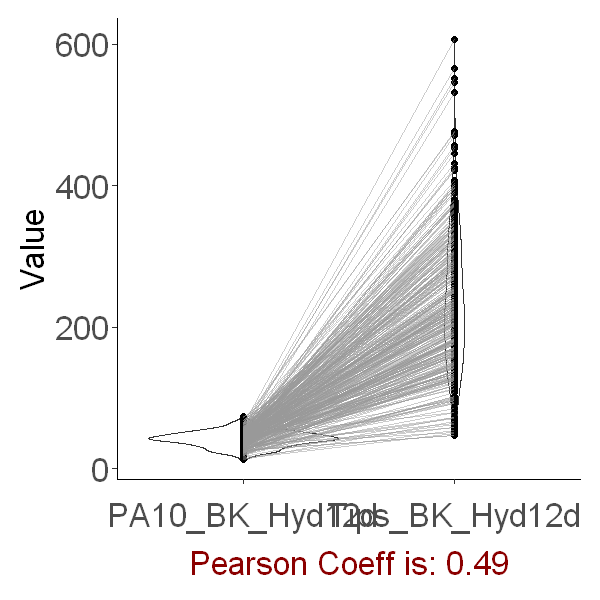

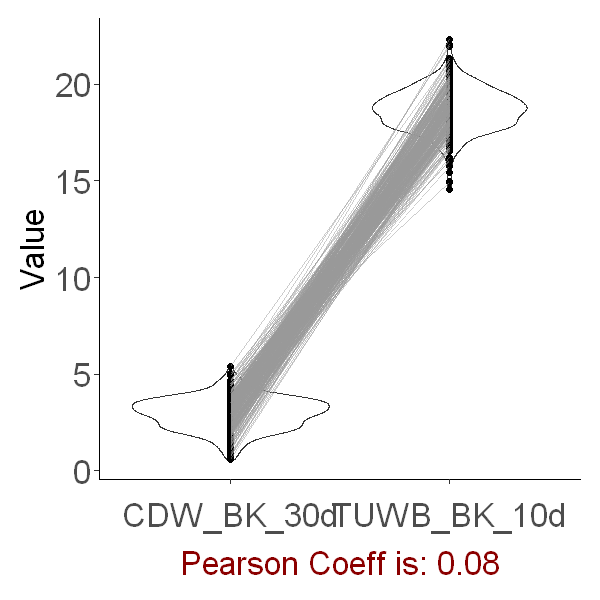

Warning message:
"Removed 55 rows containing non-finite values (stat_ydensity)."
Warning message:
"Removed 55 rows containing missing values (geom_point)."
Warning message:
"Removed 55 row(s) containing missing values (geom_path)."


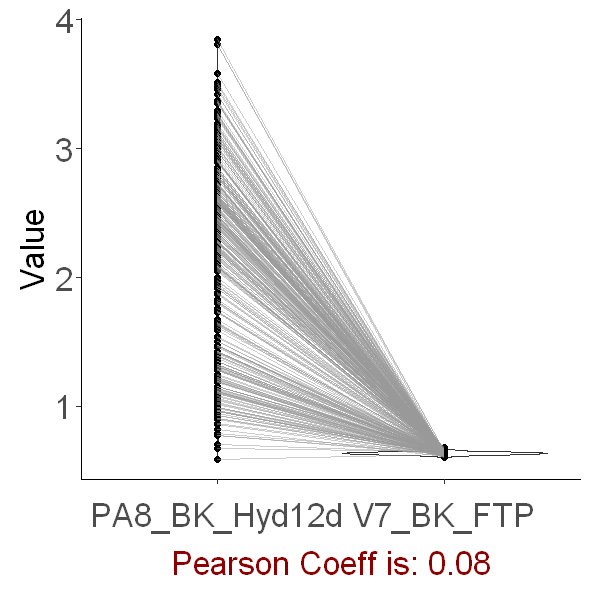

Warning message:
"Removed 1 rows containing non-finite values (stat_ydensity)."
Warning message:
"Removed 1 rows containing missing values (geom_point)."
Warning message:
"Removed 1 row(s) containing missing values (geom_path)."


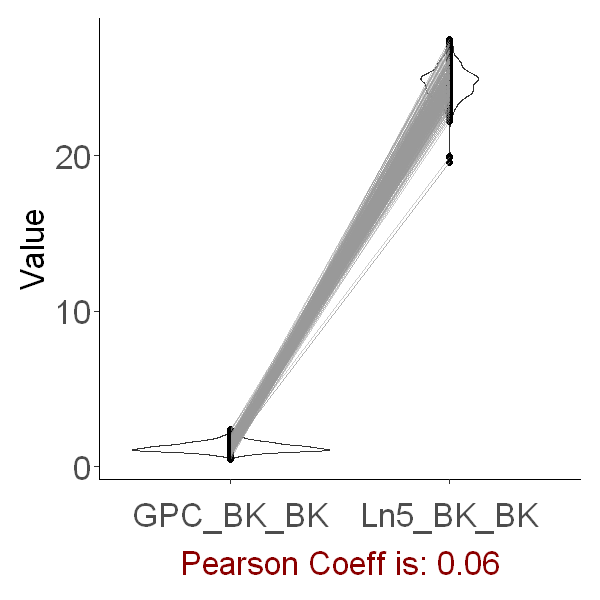

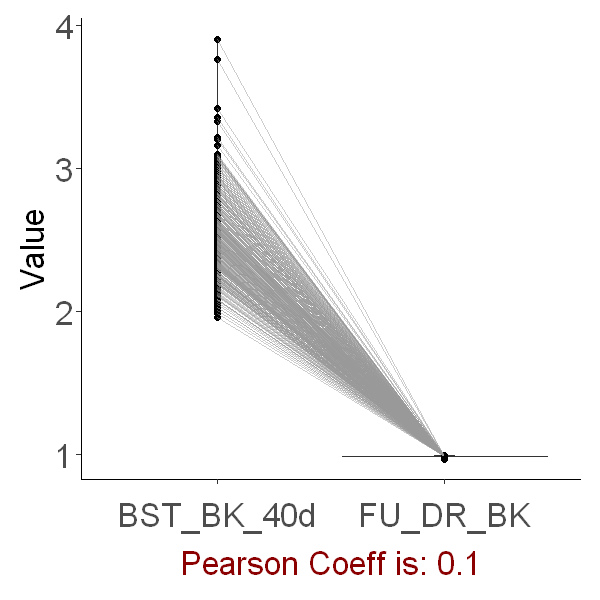

Warning message:
"Removed 2 rows containing non-finite values (stat_ydensity)."
Warning message:
"Removed 2 rows containing missing values (geom_point)."
Warning message:
"Removed 2 row(s) containing missing values (geom_path)."


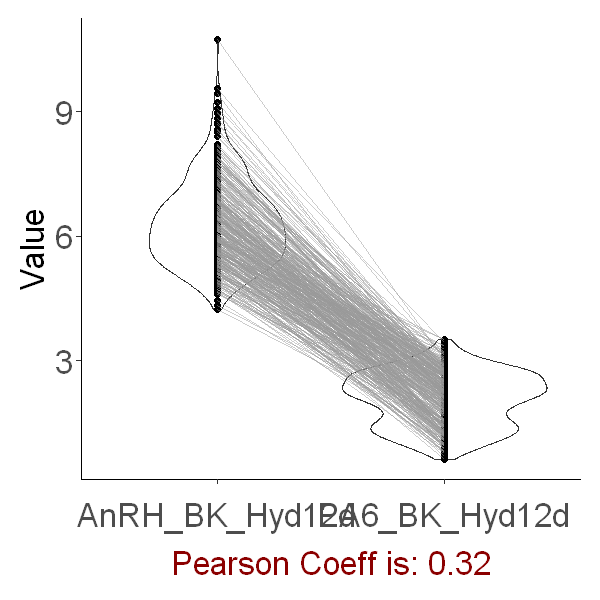

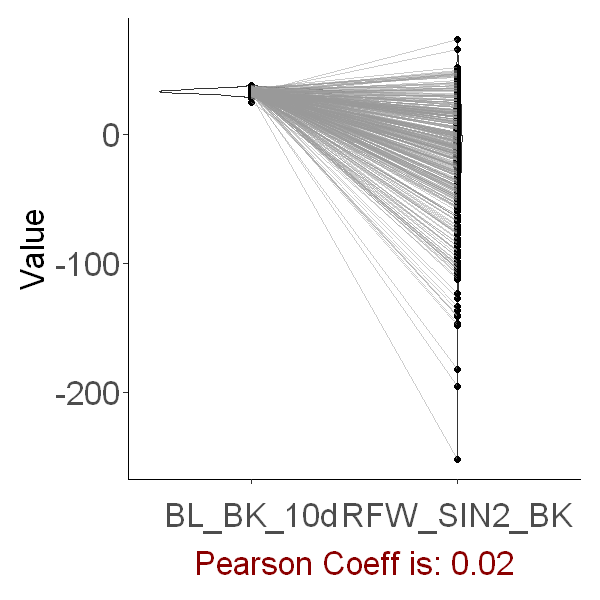

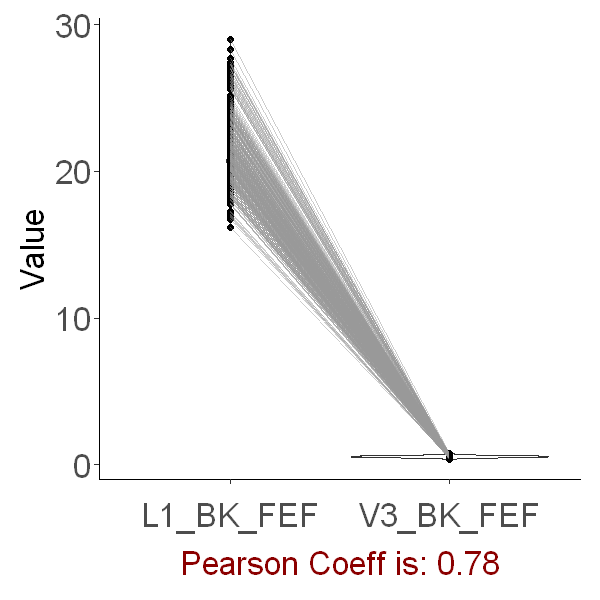

Warning message:
"Removed 7 rows containing non-finite values (stat_ydensity)."
Warning message:
"Removed 7 rows containing missing values (geom_point)."
Warning message:
"Removed 7 row(s) containing missing values (geom_path)."


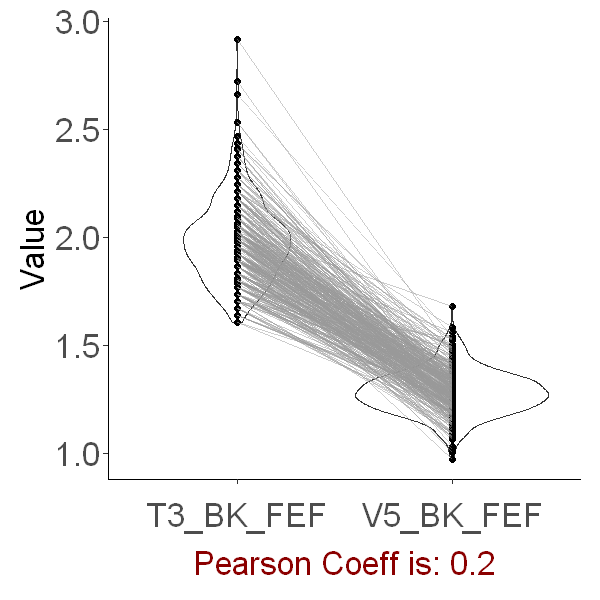

Warning message:
"Removed 46 rows containing non-finite values (stat_ydensity)."
Warning message:
"Removed 46 rows containing missing values (geom_point)."
Warning message:
"Removed 46 row(s) containing missing values (geom_path)."


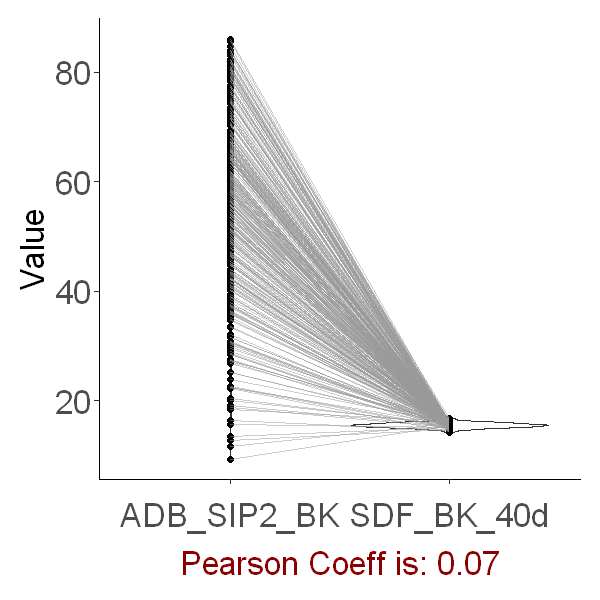

Warning message:
"Removed 1 rows containing non-finite values (stat_ydensity)."
Warning message:
"Removed 1 rows containing missing values (geom_point)."
Warning message:
"Removed 1 row(s) containing missing values (geom_path)."


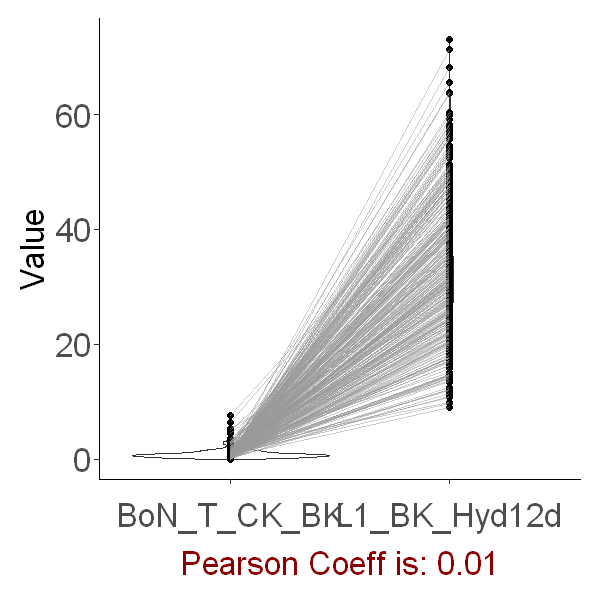

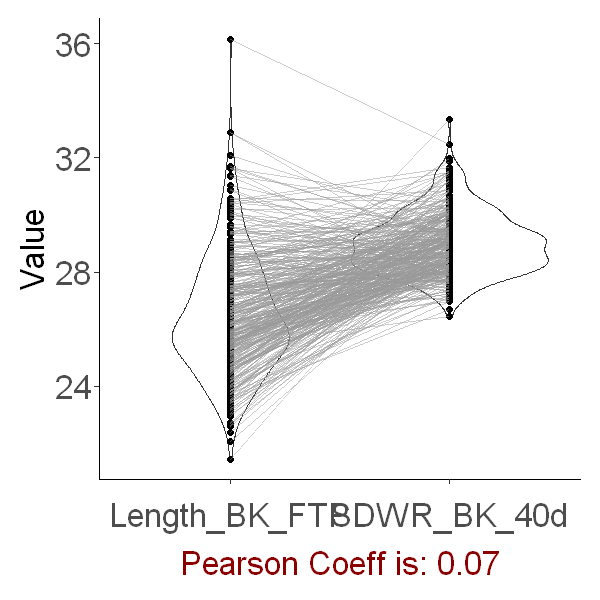

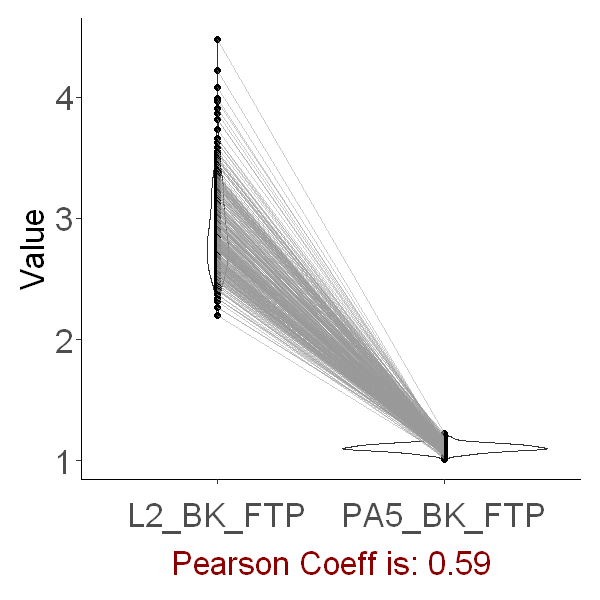

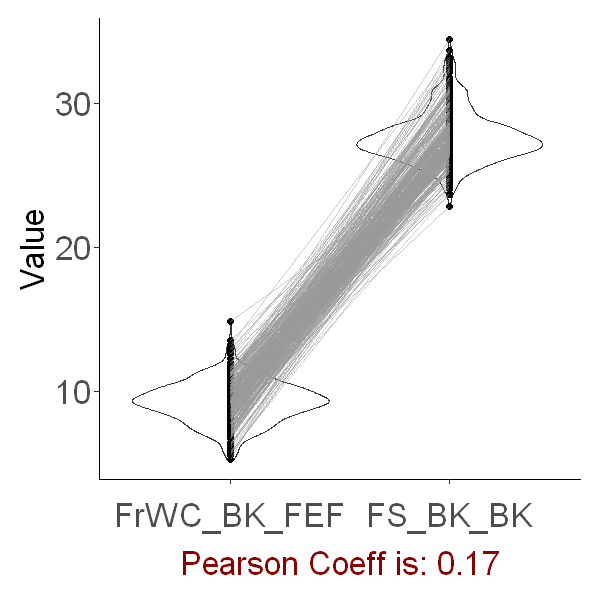

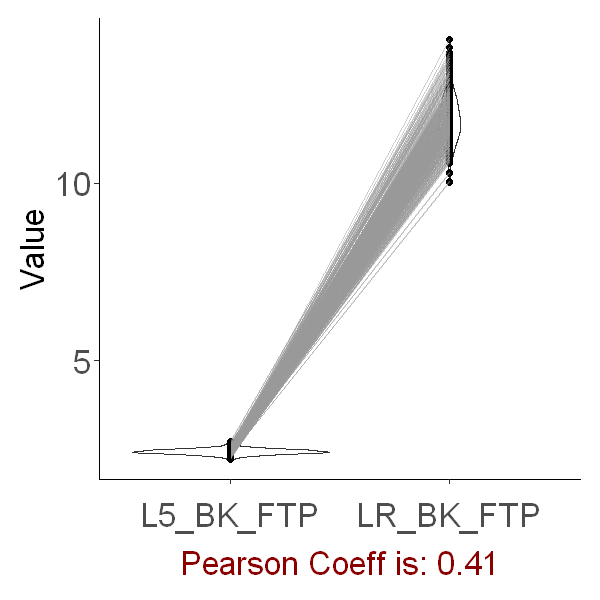

Warning message:
"Removed 5 rows containing non-finite values (stat_ydensity)."
Warning message:
"Removed 5 rows containing missing values (geom_point)."
Warning message:
"Removed 5 row(s) containing missing values (geom_path)."


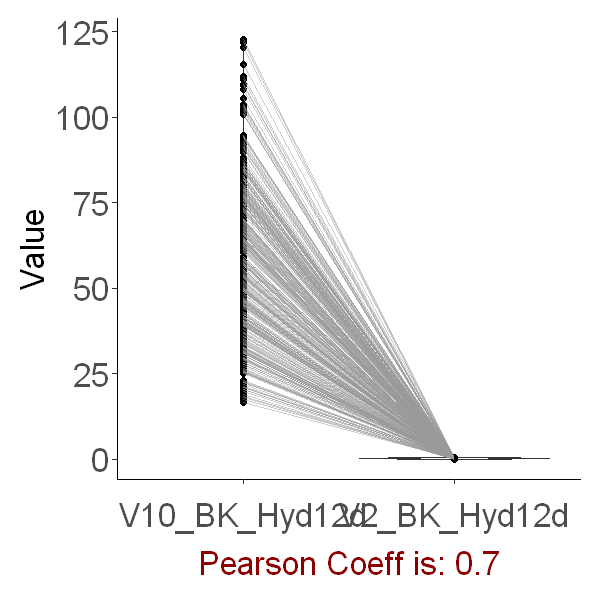

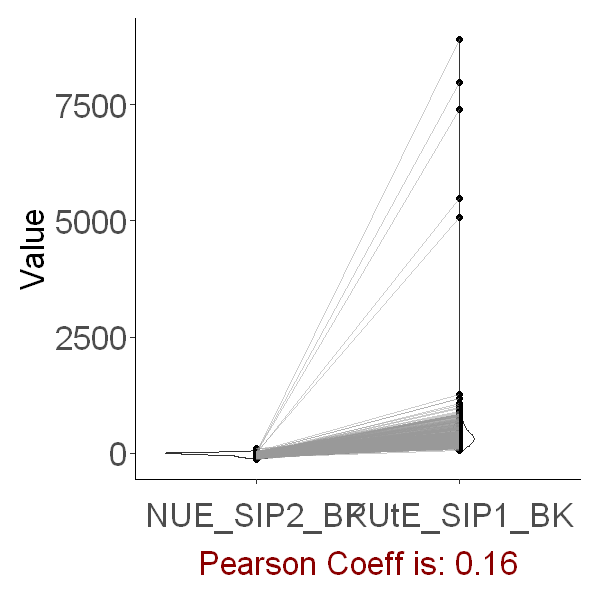

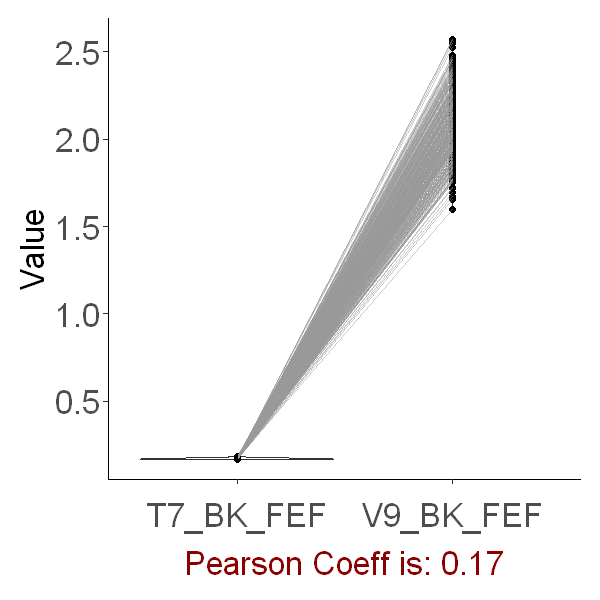

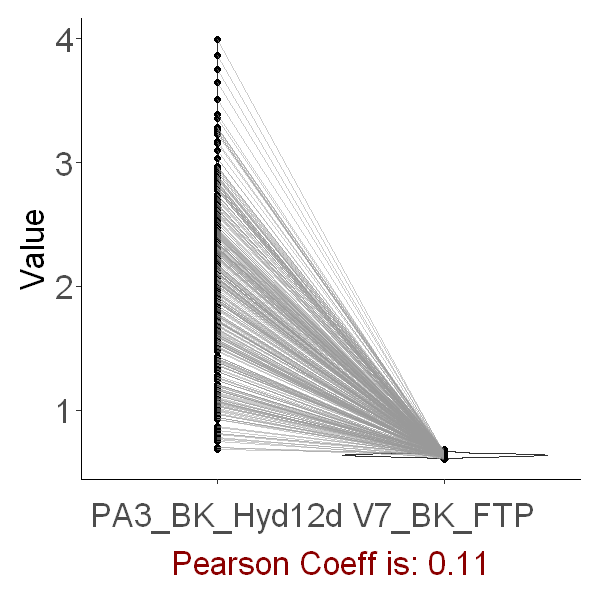

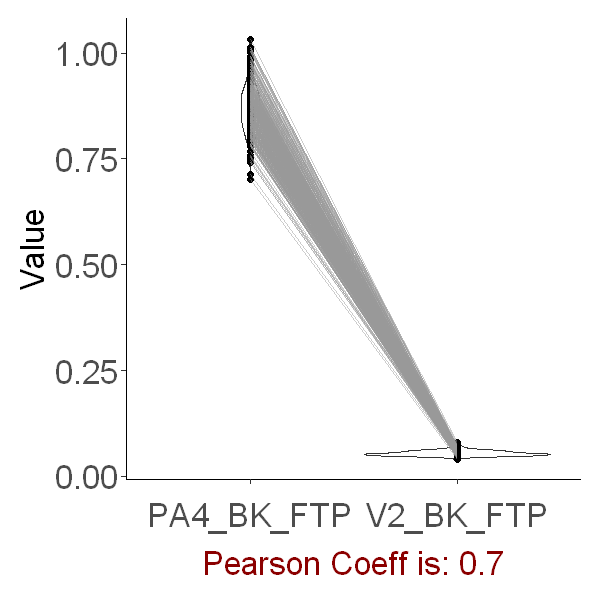

Warning message:
"Removed 1 rows containing non-finite values (stat_ydensity)."
Warning message:
"Removed 1 rows containing missing values (geom_point)."
Warning message:
"Removed 1 row(s) containing missing values (geom_path)."


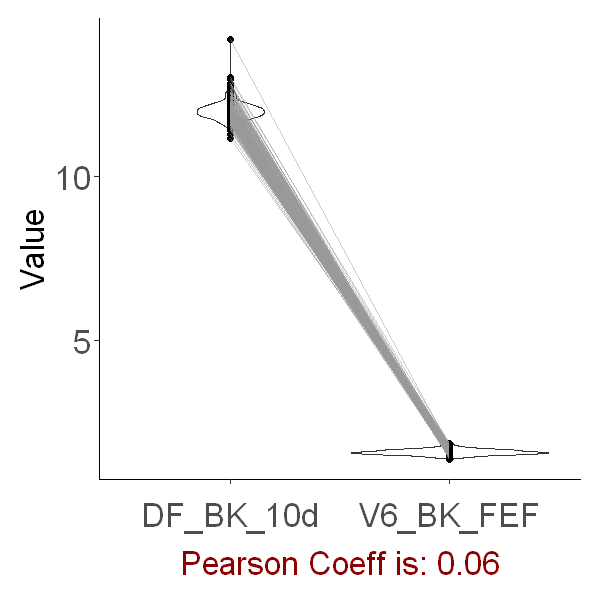

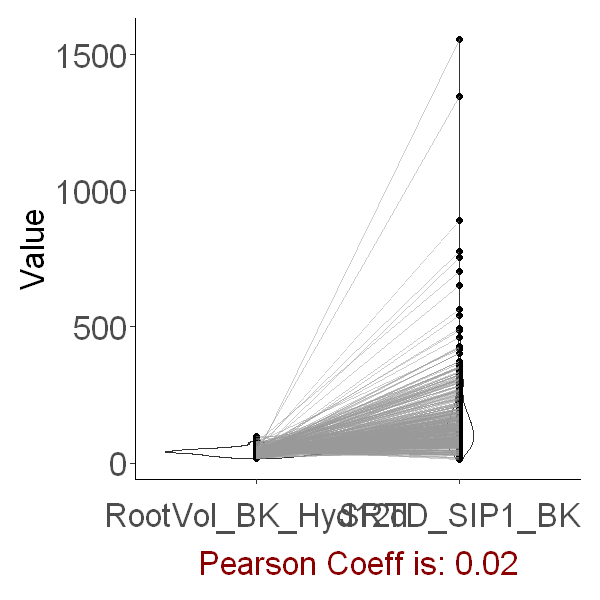

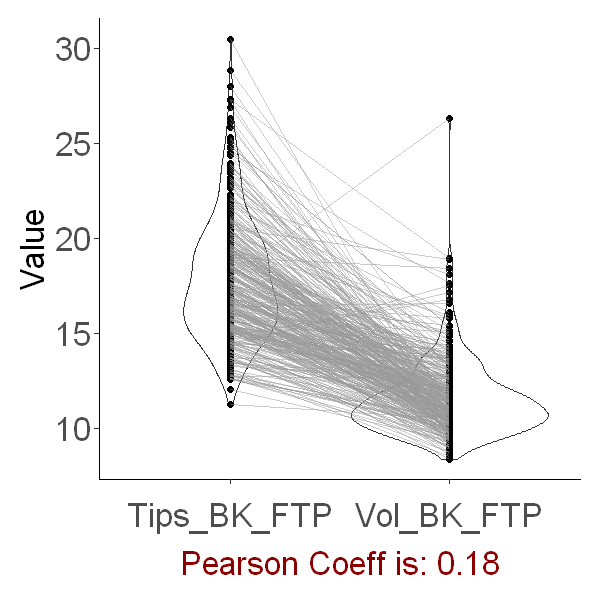

Warning message:
"Removed 1 rows containing non-finite values (stat_ydensity)."
Warning message:
"Removed 1 rows containing missing values (geom_point)."
Warning message:
"Removed 1 row(s) containing missing values (geom_path)."


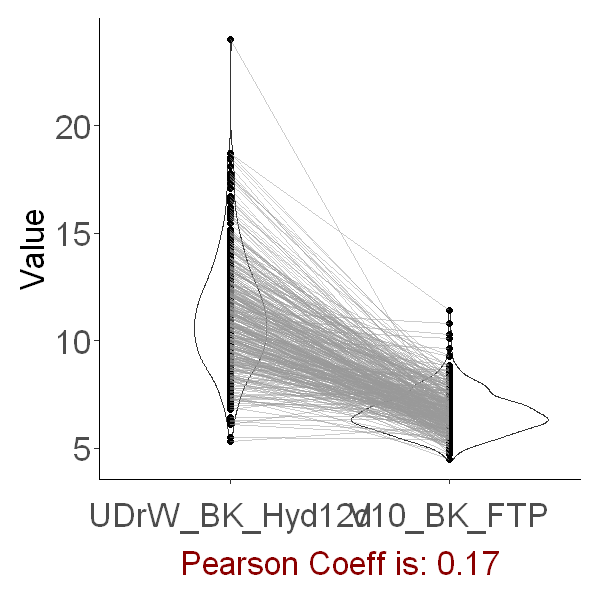

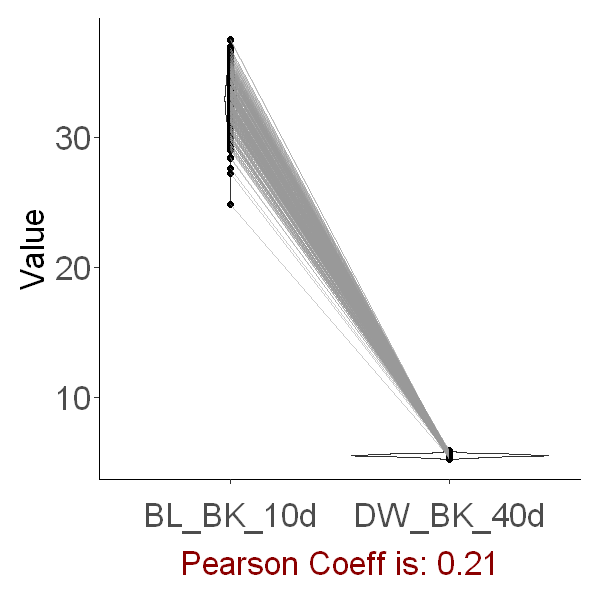

Warning message:
"Removed 38 rows containing non-finite values (stat_ydensity)."
Warning message:
"Removed 38 rows containing missing values (geom_point)."
Warning message:
"Removed 38 row(s) containing missing values (geom_path)."


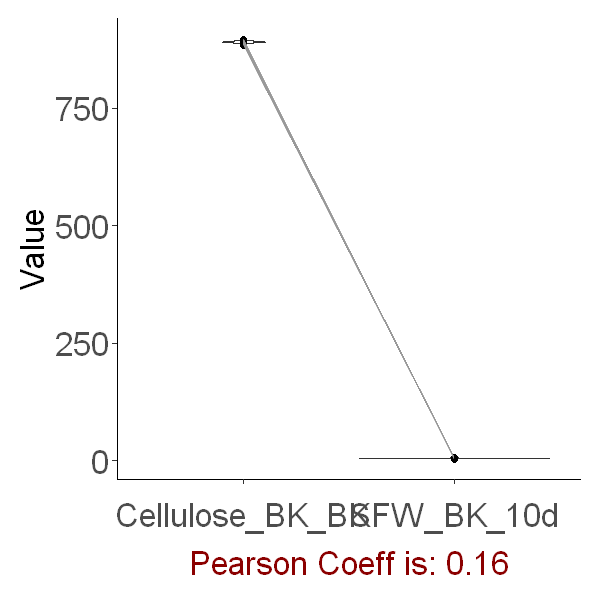

Warning message:
"Removed 4 rows containing non-finite values (stat_ydensity)."
Warning message:
"Removed 4 rows containing missing values (geom_point)."
Warning message:
"Removed 4 row(s) containing missing values (geom_path)."


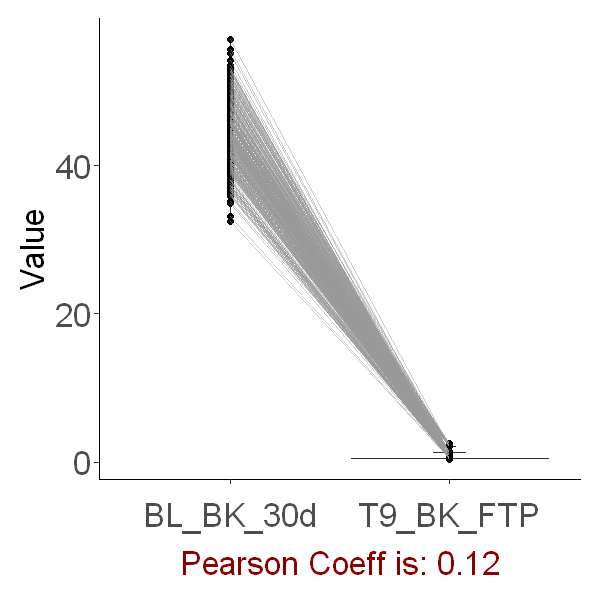

Warning message:
"Removed 1 rows containing non-finite values (stat_ydensity)."
Warning message:
"Removed 1 rows containing missing values (geom_point)."
Warning message:
"Removed 1 row(s) containing missing values (geom_path)."


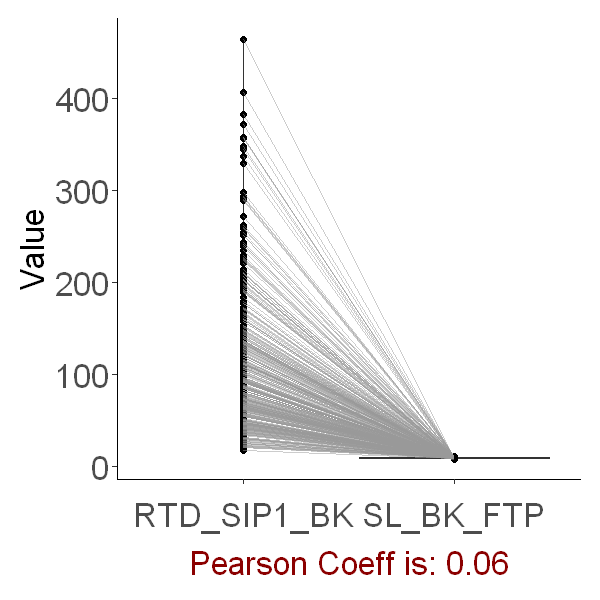

Warning message:
"Removed 38 rows containing non-finite values (stat_ydensity)."
Warning message:
"Removed 38 rows containing missing values (geom_point)."
Warning message:
"Removed 38 row(s) containing missing values (geom_path)."


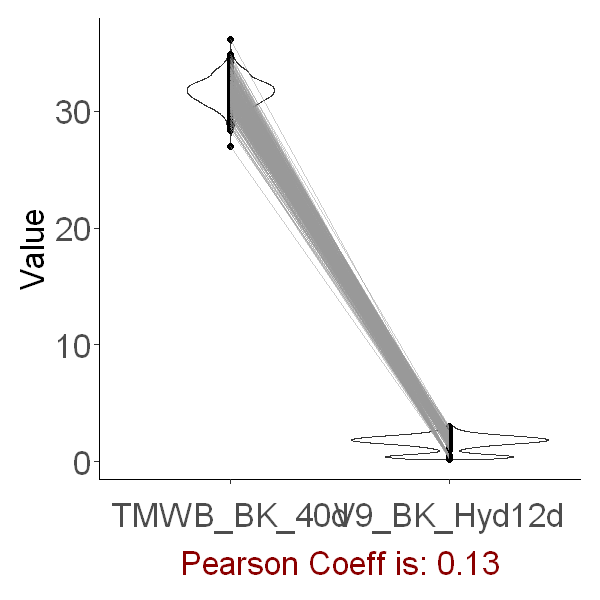

Warning message:
"Removed 1 rows containing non-finite values (stat_ydensity)."
Warning message:
"Removed 1 rows containing missing values (geom_point)."
Warning message:
"Removed 1 row(s) containing missing values (geom_path)."


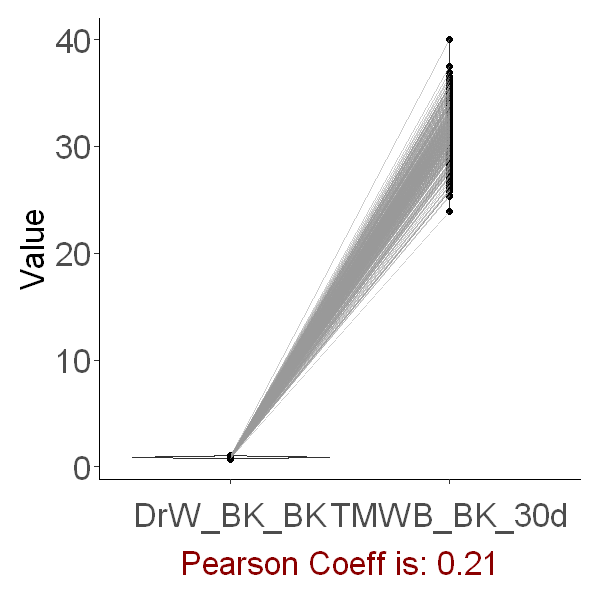

Warning message:
"Removed 1 rows containing non-finite values (stat_ydensity)."
Warning message:
"Removed 1 rows containing missing values (geom_point)."
Warning message:
"Removed 1 row(s) containing missing values (geom_path)."


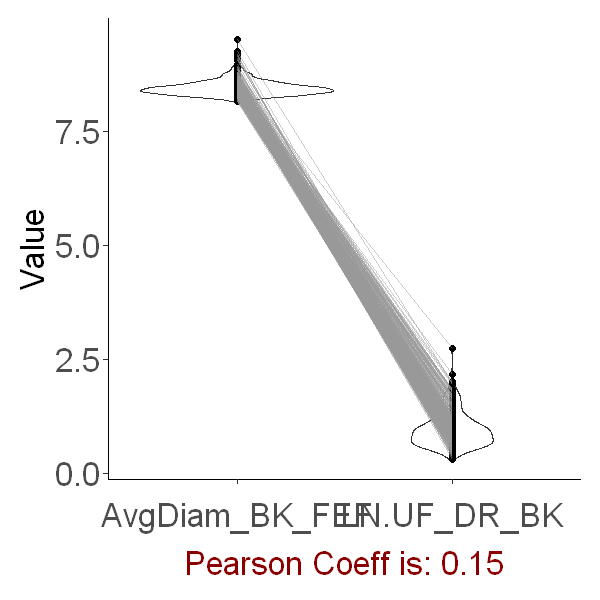

Warning message:
"Removed 8 rows containing non-finite values (stat_ydensity)."
Warning message:
"Removed 8 rows containing missing values (geom_point)."
Warning message:
"Removed 8 row(s) containing missing values (geom_path)."


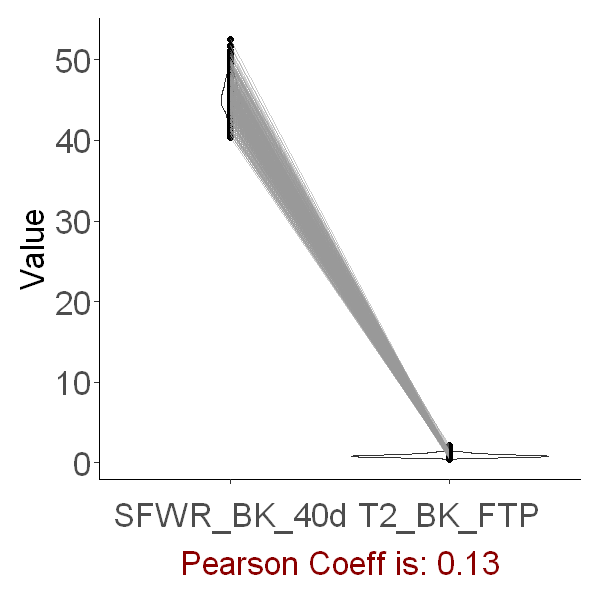

Warning message:
"Removed 5 rows containing non-finite values (stat_ydensity)."
Warning message:
"Removed 5 rows containing missing values (geom_point)."
Warning message:
"Removed 5 row(s) containing missing values (geom_path)."


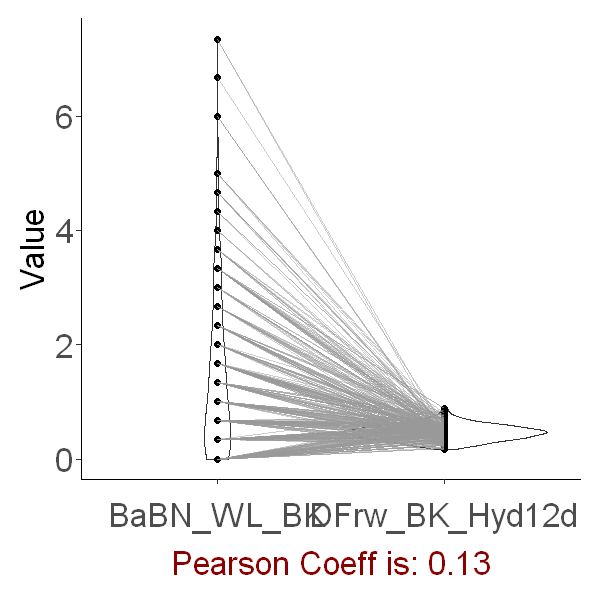

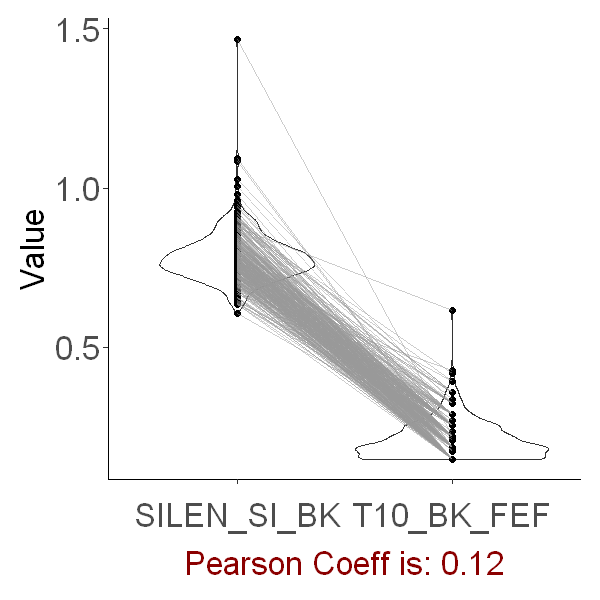

Warning message:
"Removed 1 rows containing non-finite values (stat_ydensity)."
Warning message:
"Removed 1 rows containing missing values (geom_point)."
Warning message:
"Removed 1 row(s) containing missing values (geom_path)."


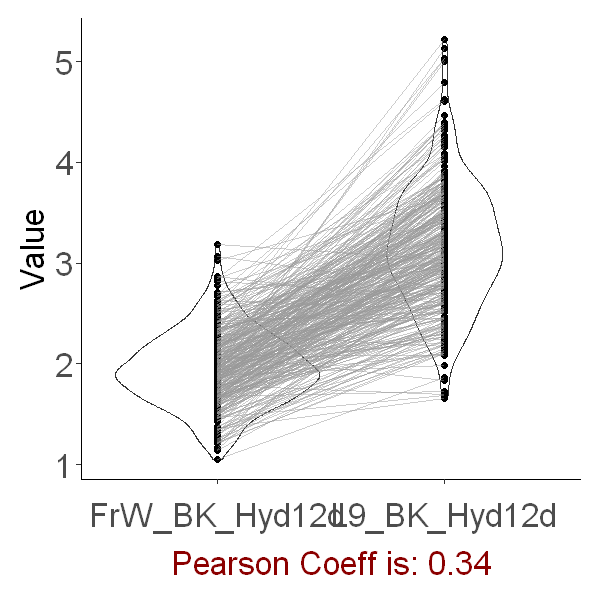

Warning message:
"Removed 33 rows containing non-finite values (stat_ydensity)."
Warning message:
"Removed 33 rows containing missing values (geom_point)."
Warning message:
"Removed 33 row(s) containing missing values (geom_path)."


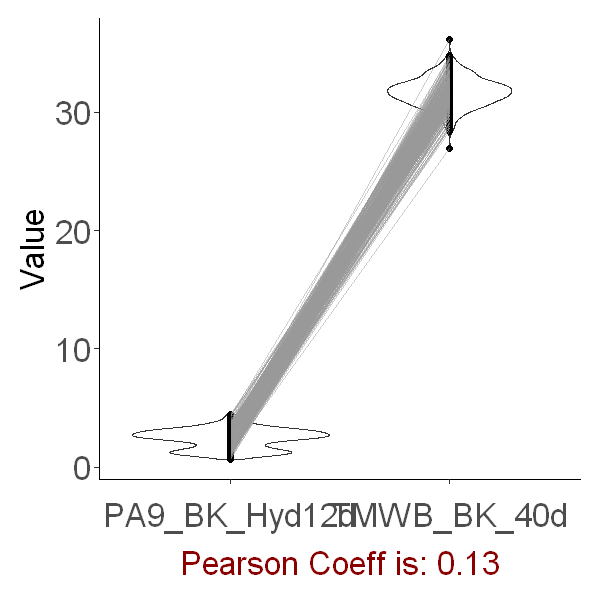

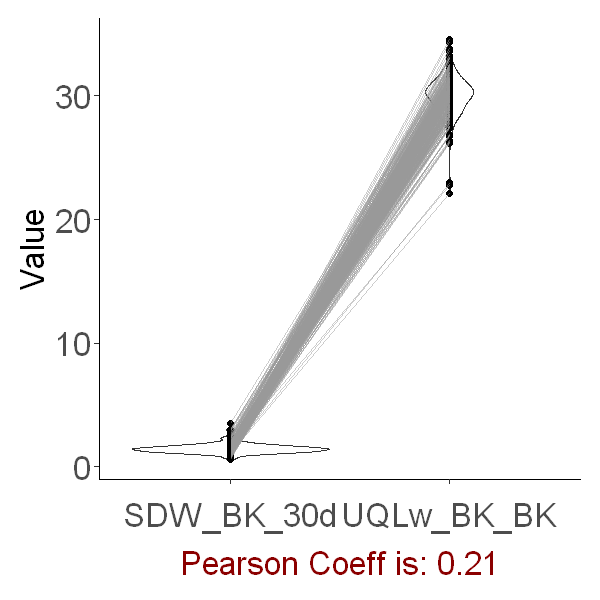

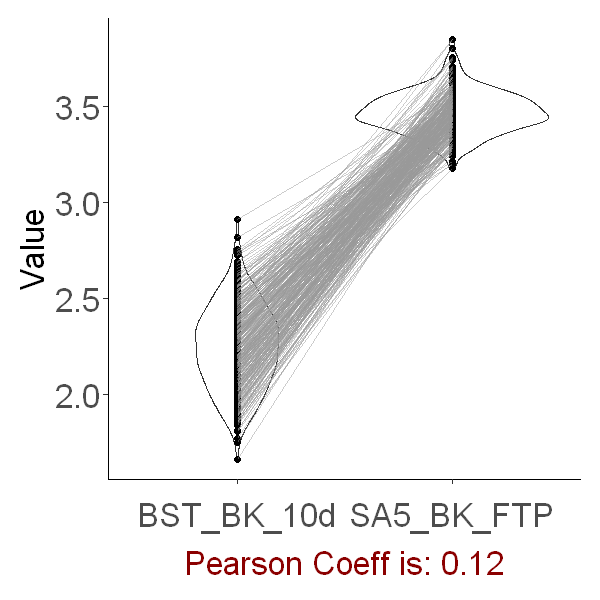

Warning message:
"Removed 5 rows containing non-finite values (stat_ydensity)."
Warning message:
"Removed 5 rows containing missing values (geom_point)."
Warning message:
"Removed 5 row(s) containing missing values (geom_path)."


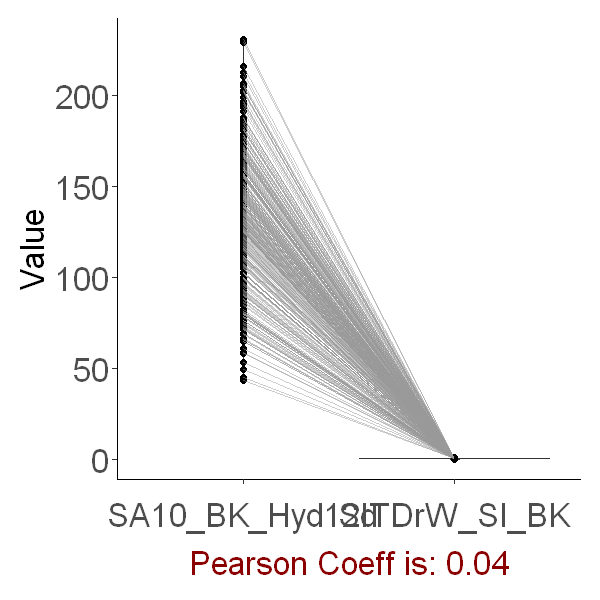

Warning message:
"Removed 13 rows containing non-finite values (stat_ydensity)."
Warning message:
"Removed 13 rows containing missing values (geom_point)."
Warning message:
"Removed 13 row(s) containing missing values (geom_path)."


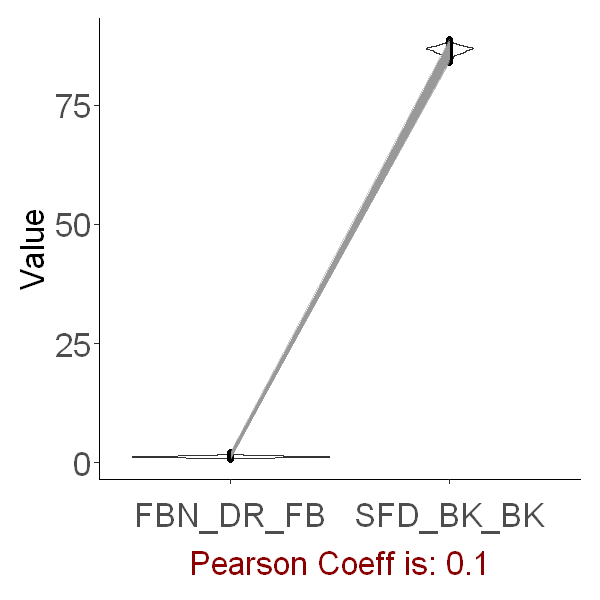

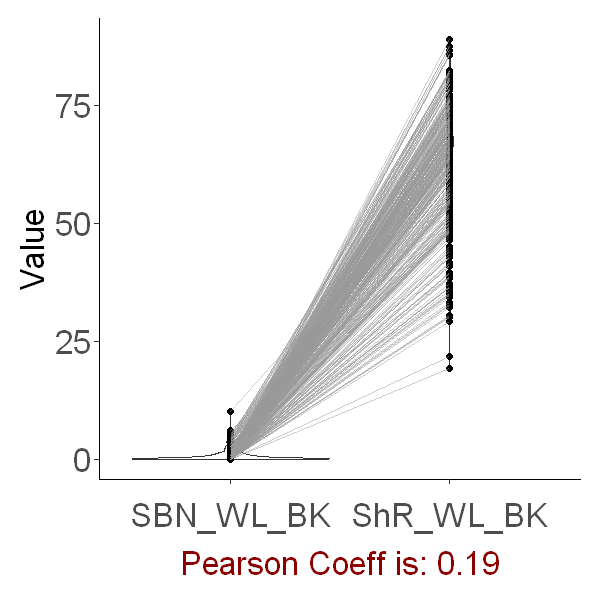

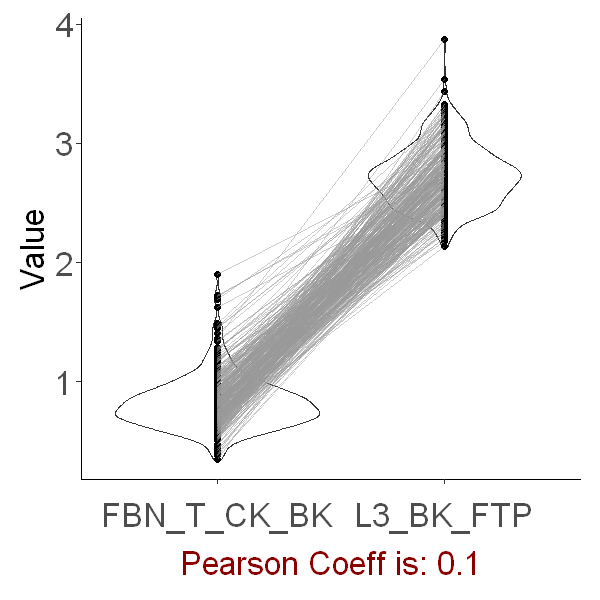

Warning message:
"Removed 10 rows containing non-finite values (stat_ydensity)."
Warning message:
"Removed 10 rows containing missing values (geom_point)."
Warning message:
"Removed 10 row(s) containing missing values (geom_path)."


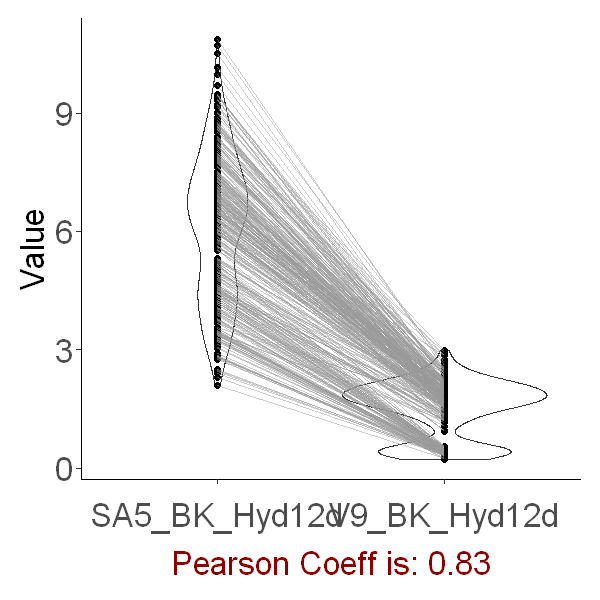

Warning message:
"Removed 12 rows containing non-finite values (stat_ydensity)."
Warning message:
"Removed 12 rows containing missing values (geom_point)."
Warning message:
"Removed 12 row(s) containing missing values (geom_path)."


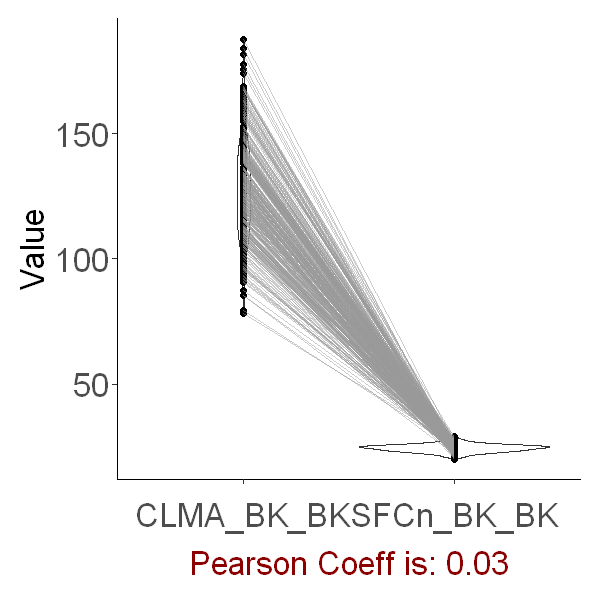

Warning message:
"Removed 2 rows containing non-finite values (stat_ydensity)."
Warning message:
"Removed 2 rows containing missing values (geom_point)."
Warning message:
"Removed 2 row(s) containing missing values (geom_path)."


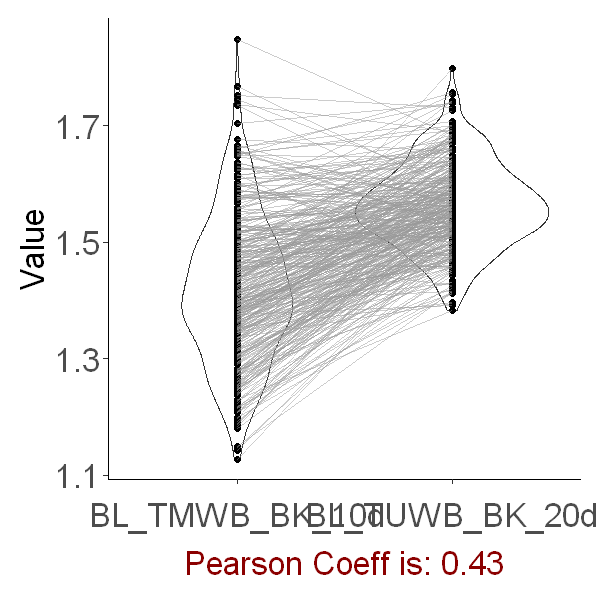

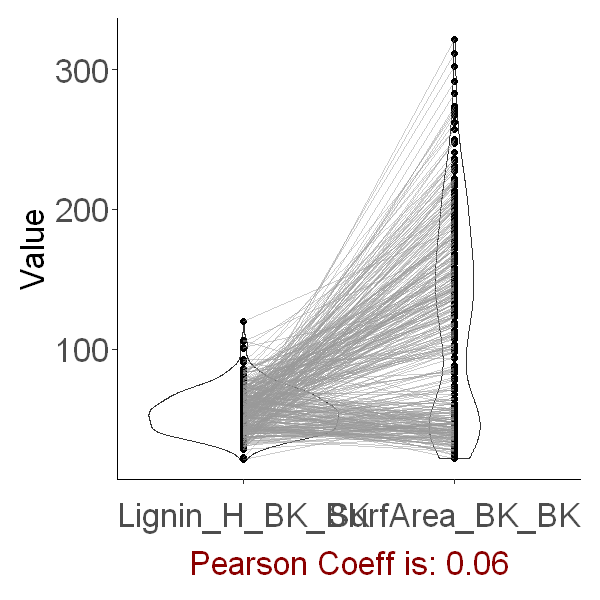

In [132]:
for (i in 1:nrow(tmp)){
    p <- plot_pair_trait(df_blup, tmp$Trait1[i], tmp$Trait2[i])
    print(p)
}

- 成对比较rG = -1

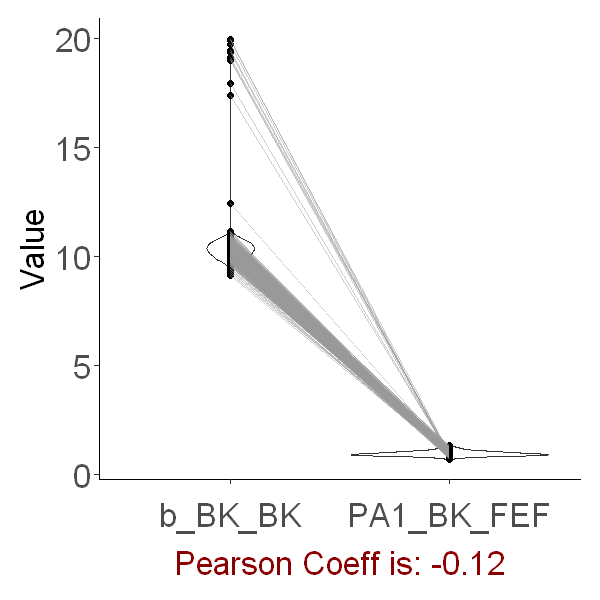

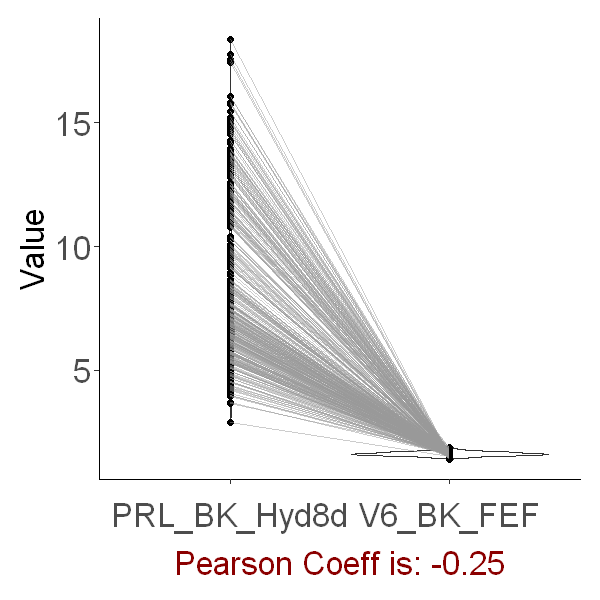

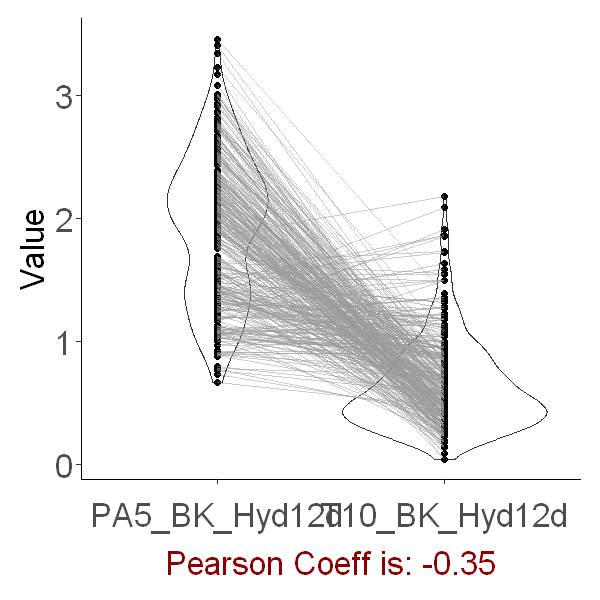

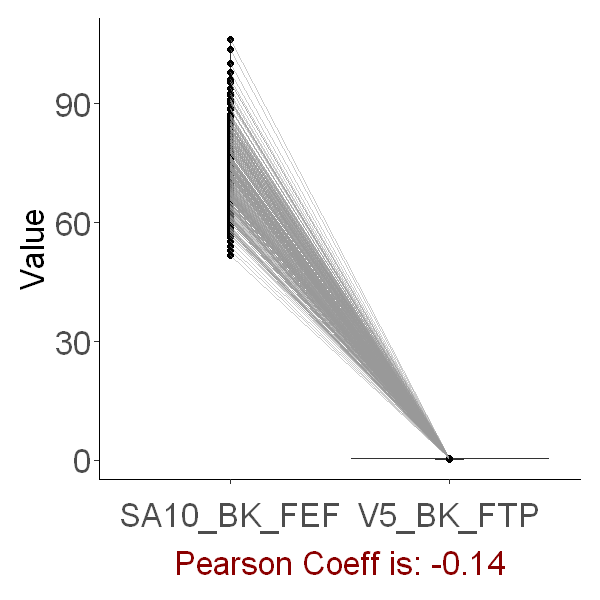

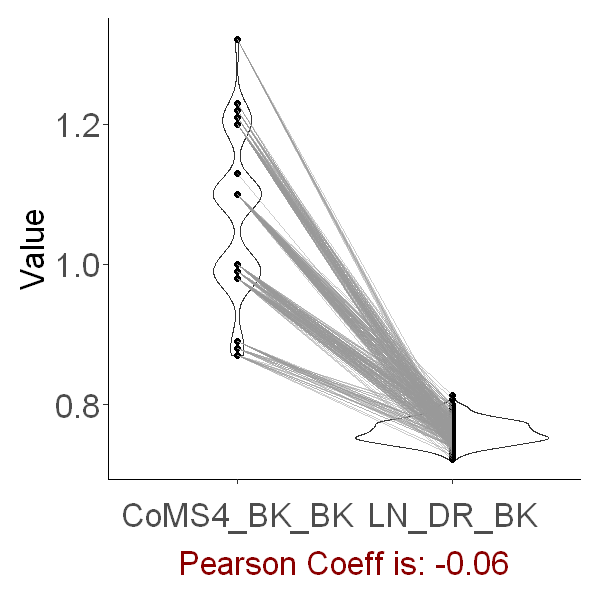

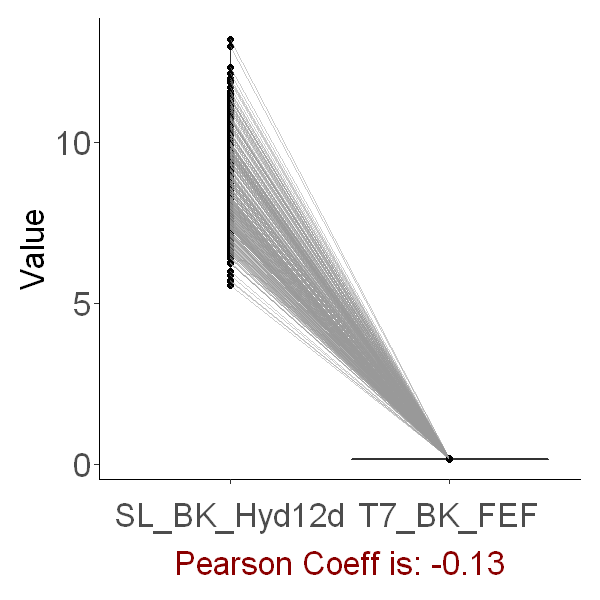

Warning message:
"Removed 28 rows containing non-finite values (stat_ydensity)."
Warning message:
"Removed 28 rows containing missing values (geom_point)."
Warning message:
"Removed 28 row(s) containing missing values (geom_path)."


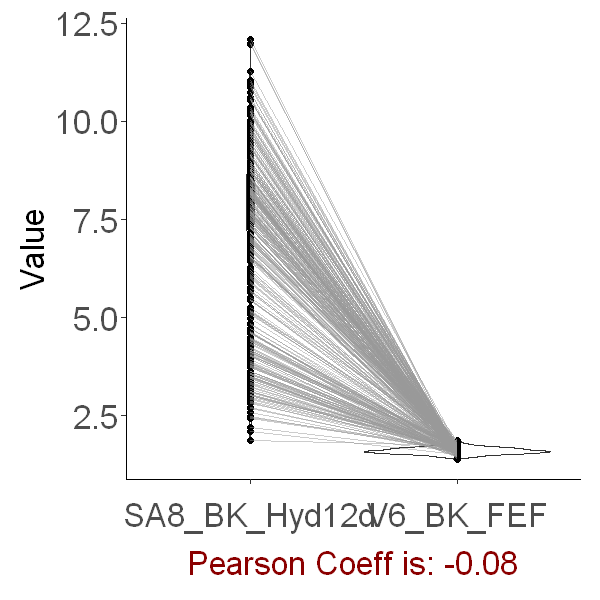

Warning message:
"Removed 8 rows containing non-finite values (stat_ydensity)."
Warning message:
"Removed 8 rows containing missing values (geom_point)."
Warning message:
"Removed 8 row(s) containing missing values (geom_path)."


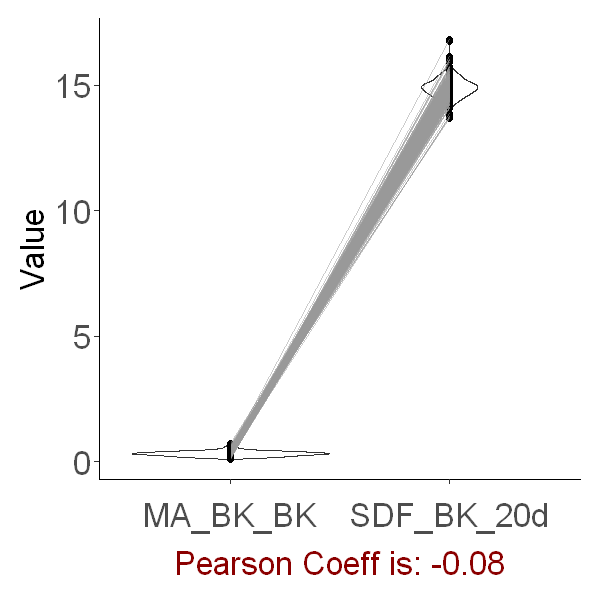

Warning message:
"Removed 3 rows containing non-finite values (stat_ydensity)."
Warning message:
"Removed 3 rows containing missing values (geom_point)."
Warning message:
"Removed 3 row(s) containing missing values (geom_path)."


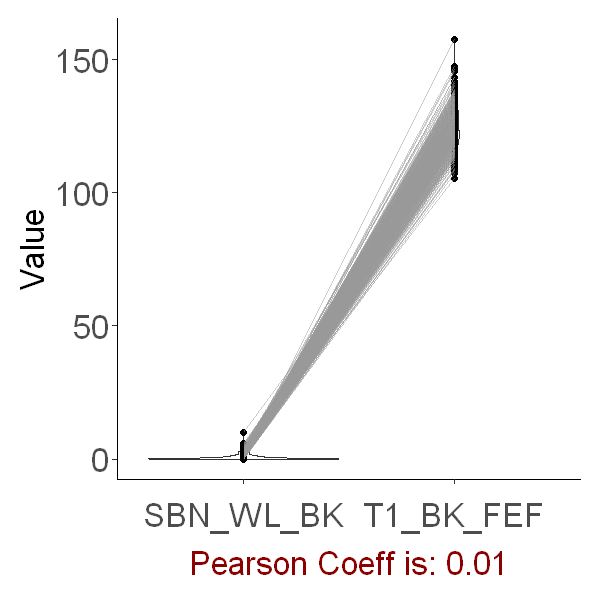

Warning message:
"Removed 6 rows containing non-finite values (stat_ydensity)."
Warning message:
"Removed 6 rows containing missing values (geom_point)."
Warning message:
"Removed 6 row(s) containing missing values (geom_path)."


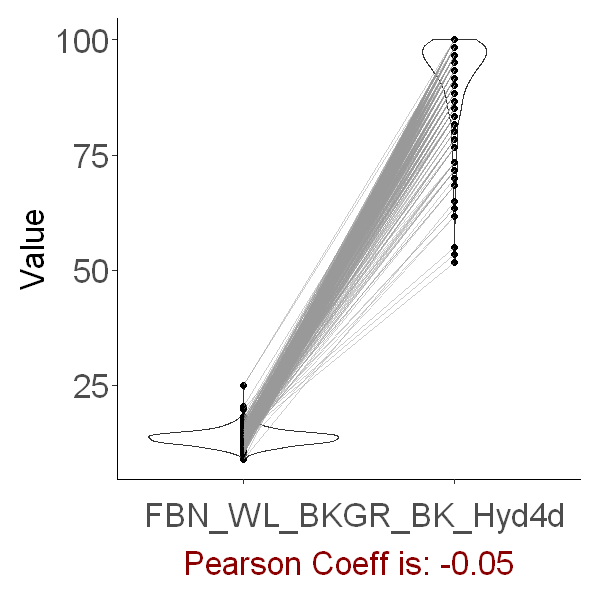

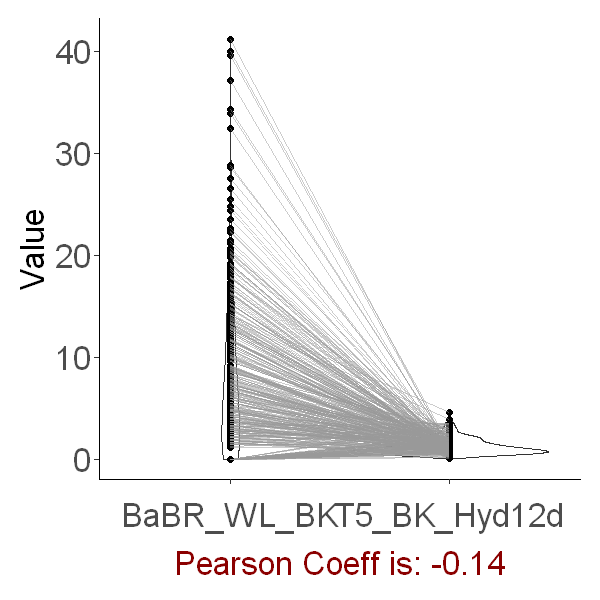

Warning message:
"Removed 35 rows containing non-finite values (stat_ydensity)."
Warning message:
"Removed 35 rows containing missing values (geom_point)."
Warning message:
"Removed 35 row(s) containing missing values (geom_path)."


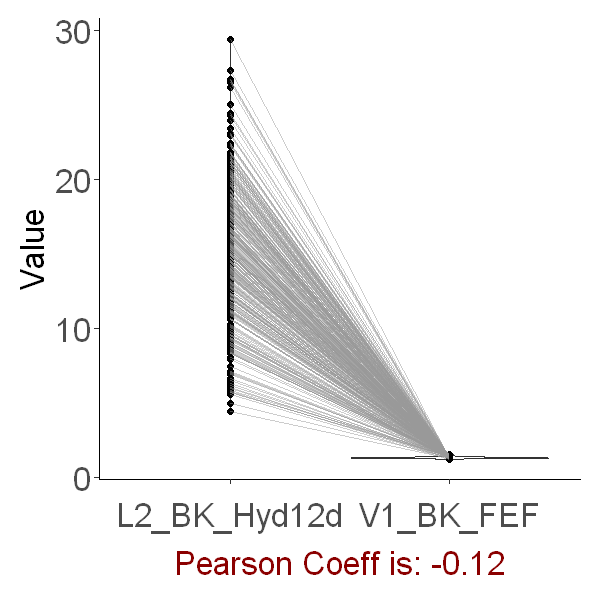

Warning message:
"Removed 14 rows containing non-finite values (stat_ydensity)."
Warning message:
"Removed 14 rows containing missing values (geom_point)."
Warning message:
"Removed 14 row(s) containing missing values (geom_path)."


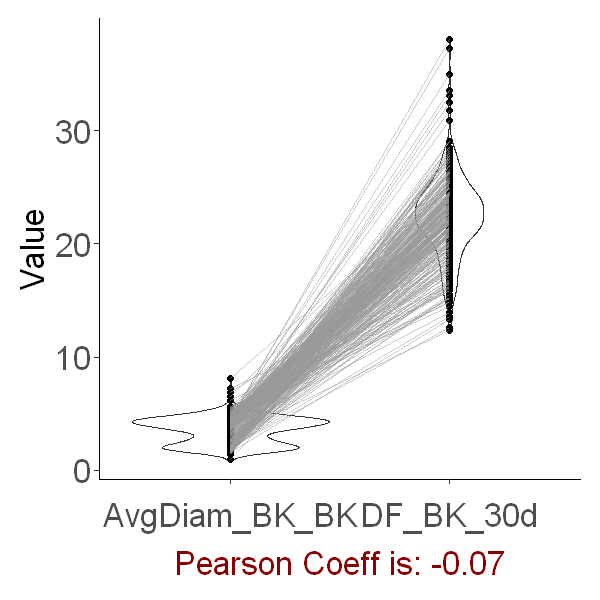

Warning message:
"Removed 1 rows containing non-finite values (stat_ydensity)."
Warning message:
"Removed 1 rows containing missing values (geom_point)."
Warning message:
"Removed 1 row(s) containing missing values (geom_path)."


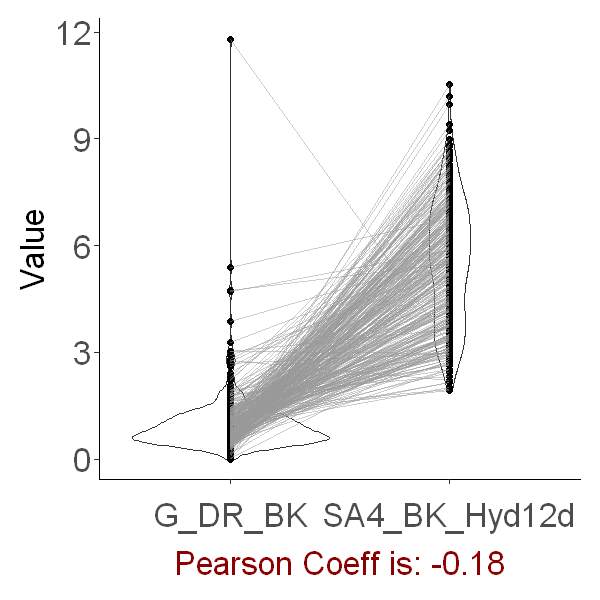

Warning message:
"Removed 8 rows containing non-finite values (stat_ydensity)."
Warning message:
"Removed 8 rows containing missing values (geom_point)."
Warning message:
"Removed 8 row(s) containing missing values (geom_path)."


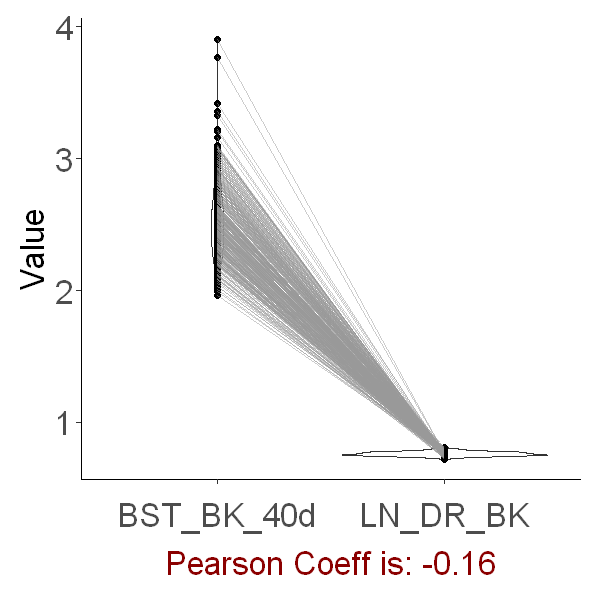

Warning message:
"Removed 6 rows containing non-finite values (stat_ydensity)."
Warning message:
"Removed 6 rows containing missing values (geom_point)."
Warning message:
"Removed 6 row(s) containing missing values (geom_path)."


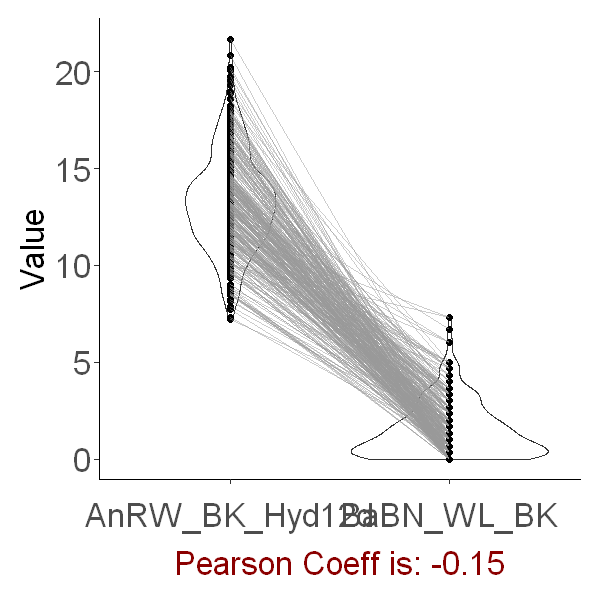

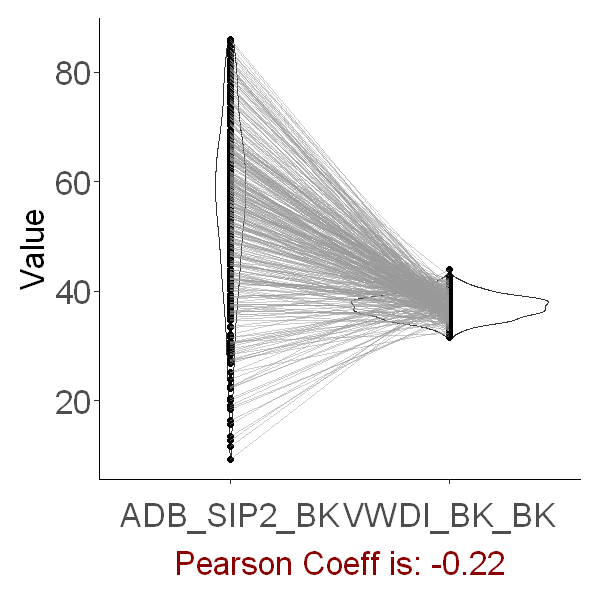

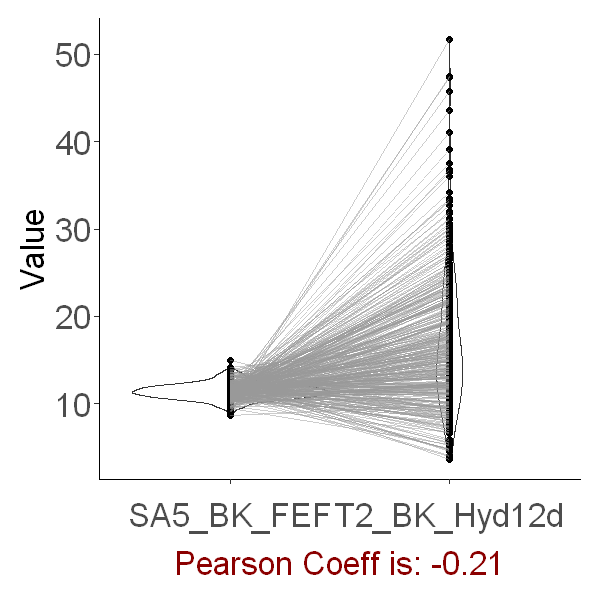

Warning message:
"Removed 5 rows containing non-finite values (stat_ydensity)."
Warning message:
"Removed 5 rows containing missing values (geom_point)."
Warning message:
"Removed 5 row(s) containing missing values (geom_path)."


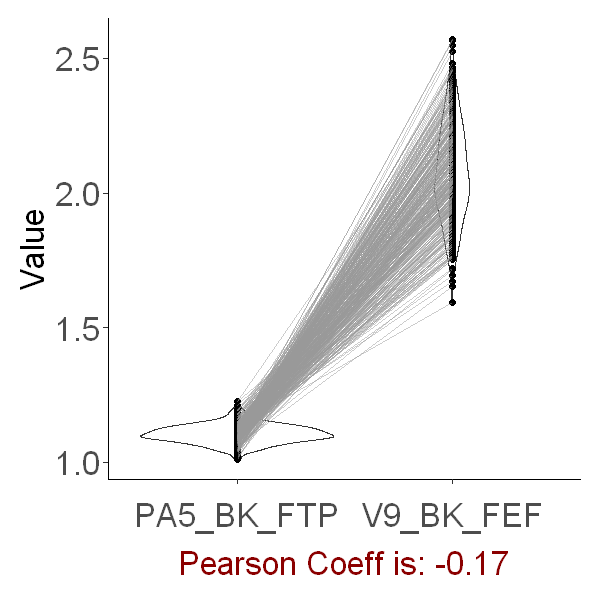

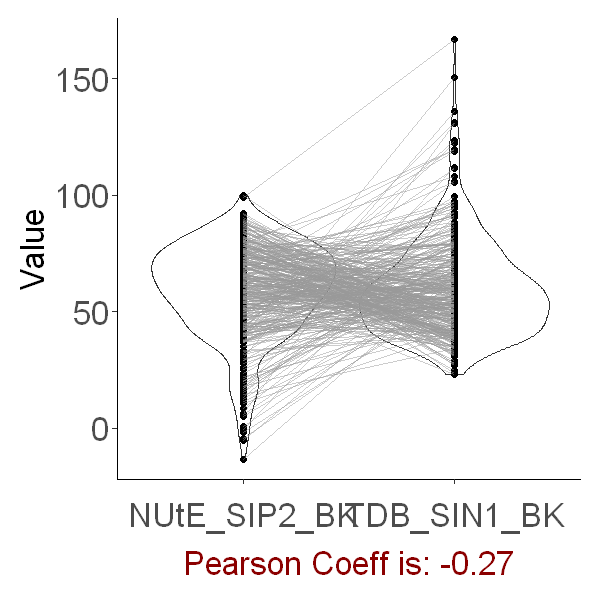

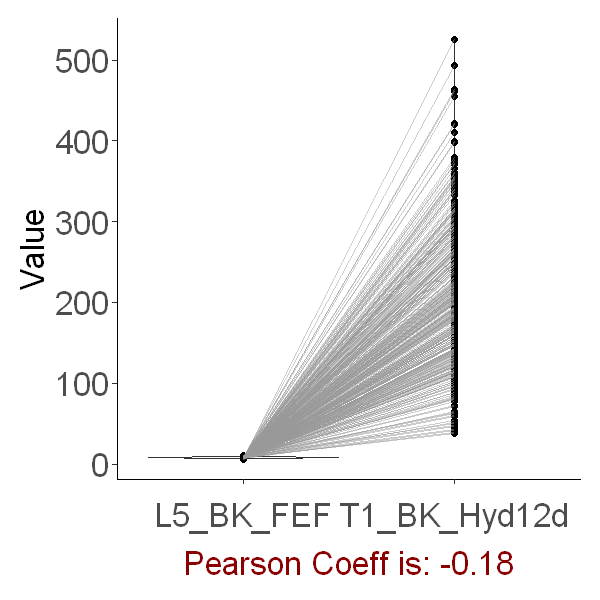

Warning message:
"Removed 2 rows containing non-finite values (stat_ydensity)."
Warning message:
"Removed 2 rows containing missing values (geom_point)."
Warning message:
"Removed 2 row(s) containing missing values (geom_path)."


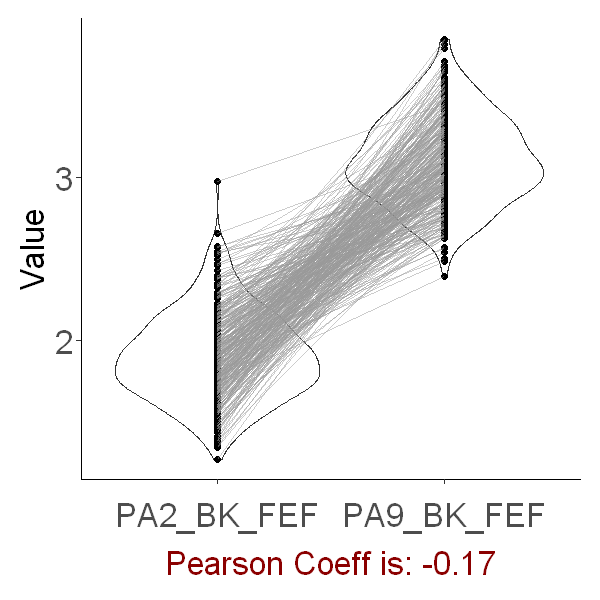

Warning message:
"Removed 7 rows containing non-finite values (stat_ydensity)."
Warning message:
"Removed 7 rows containing missing values (geom_point)."
Warning message:
"Removed 7 row(s) containing missing values (geom_path)."


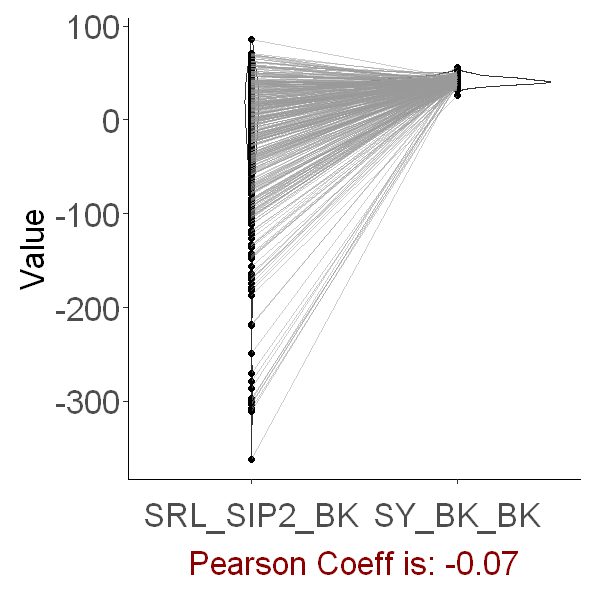

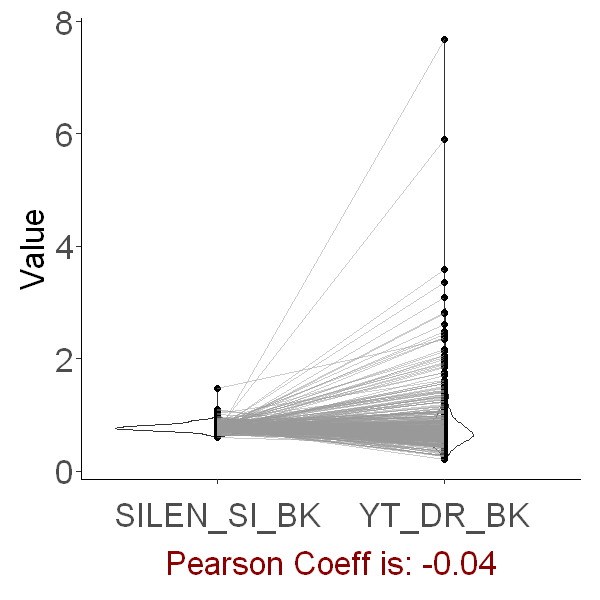

Warning message:
"Removed 5 rows containing non-finite values (stat_ydensity)."
Warning message:
"Removed 5 rows containing missing values (geom_point)."
Warning message:
"Removed 5 row(s) containing missing values (geom_path)."


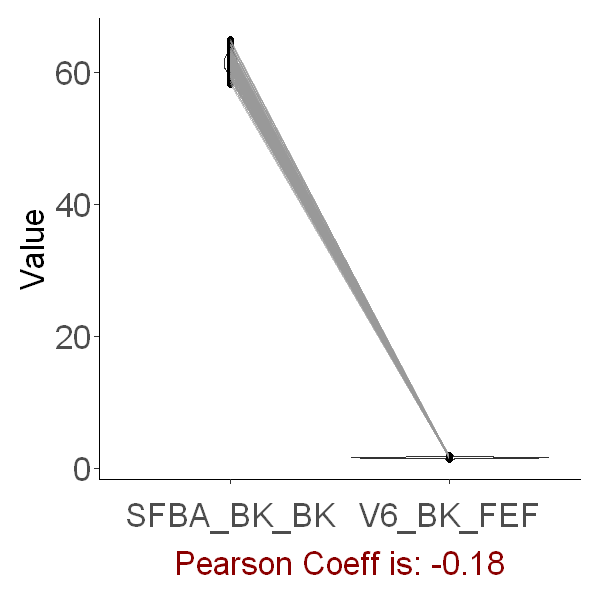

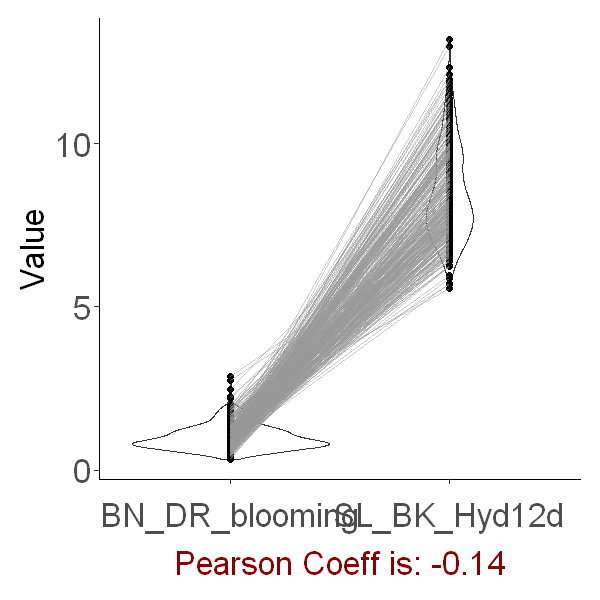

Warning message:
"Removed 35 rows containing non-finite values (stat_ydensity)."
Warning message:
"Removed 35 rows containing missing values (geom_point)."
Warning message:
"Removed 35 row(s) containing missing values (geom_path)."


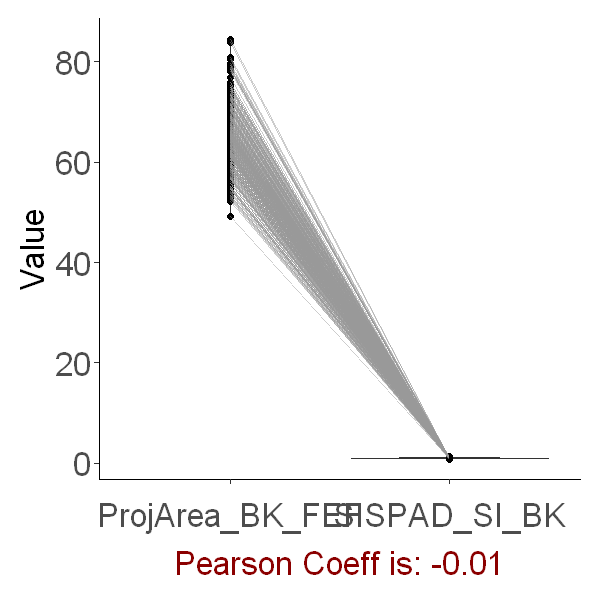

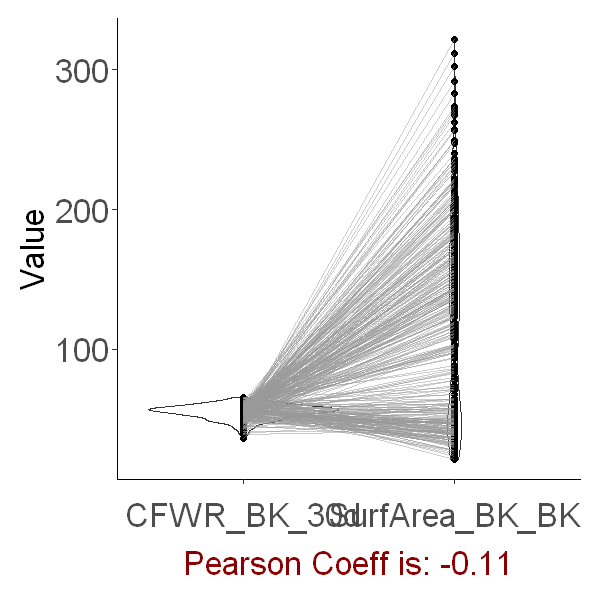

Warning message:
"Removed 3 rows containing non-finite values (stat_ydensity)."
Warning message:
"Removed 3 rows containing missing values (geom_point)."
Warning message:
"Removed 3 row(s) containing missing values (geom_path)."


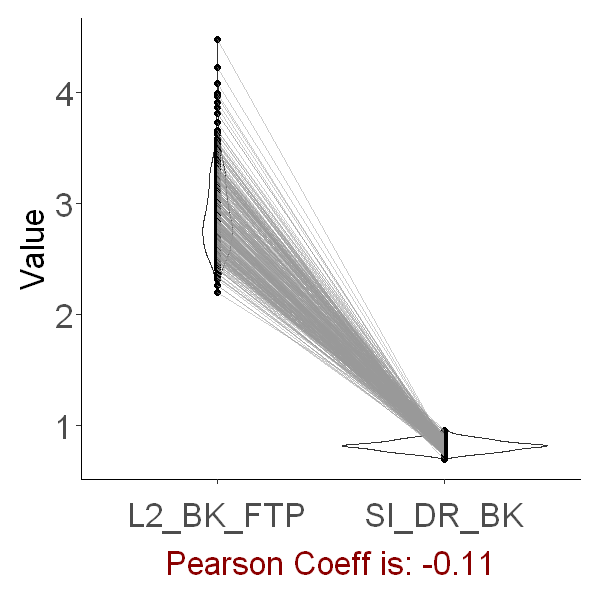

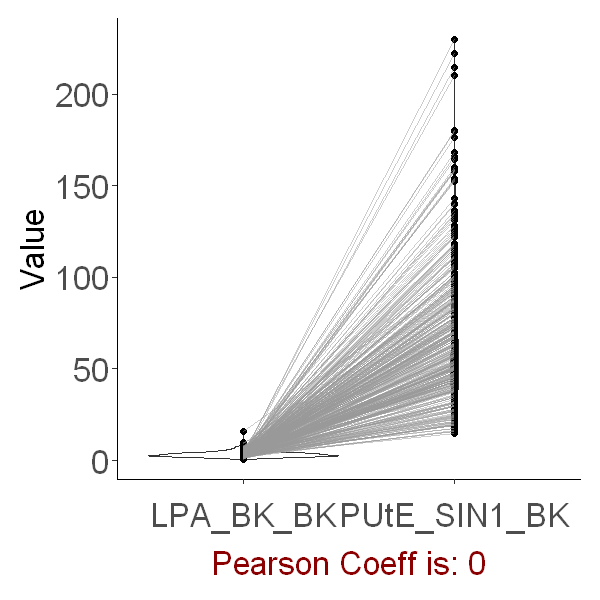

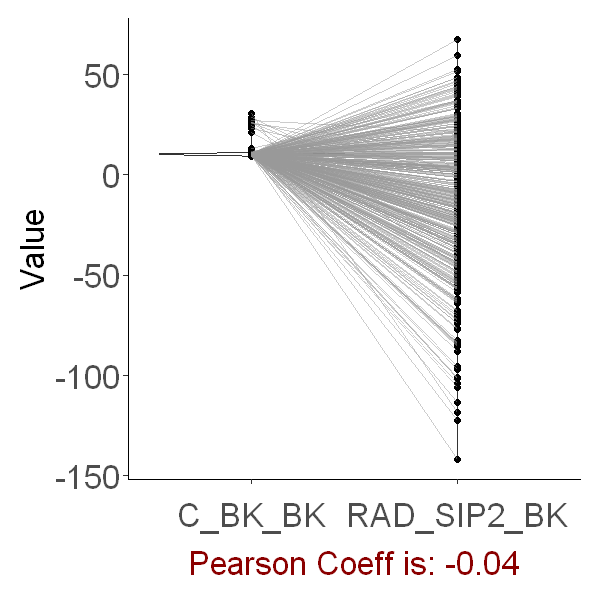

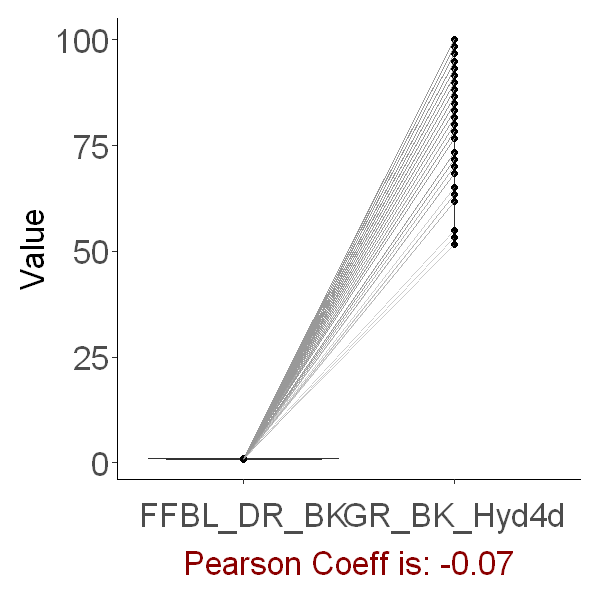

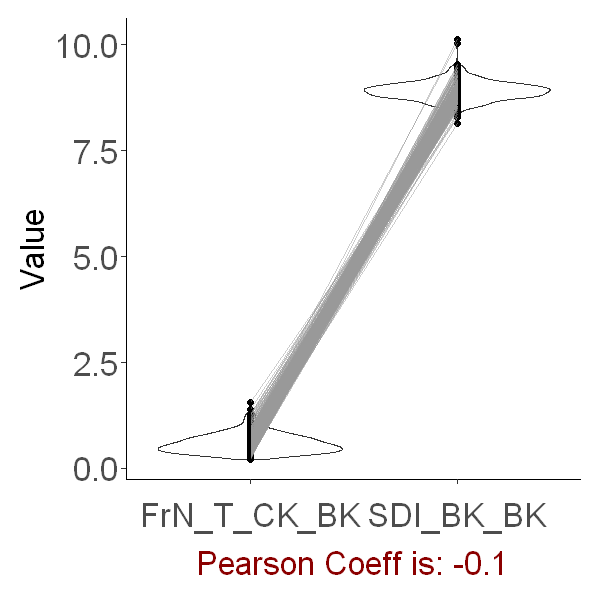

Warning message:
"Removed 52 rows containing non-finite values (stat_ydensity)."
Warning message:
"Removed 52 rows containing missing values (geom_point)."
Warning message:
"Removed 52 row(s) containing missing values (geom_path)."


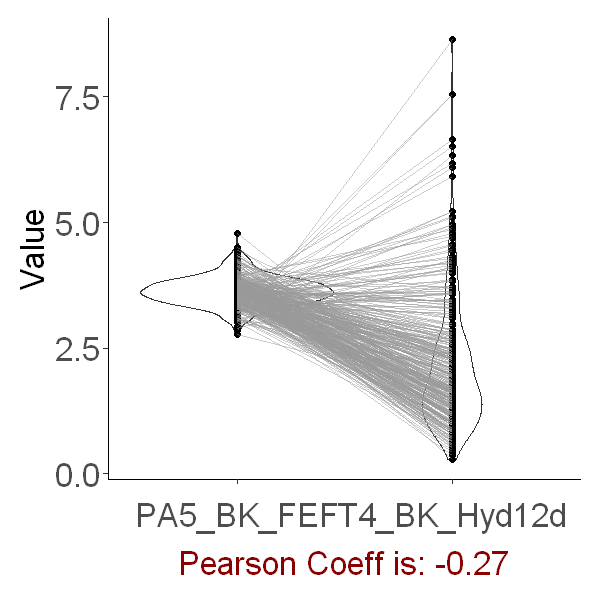

Warning message:
"Removed 8 rows containing non-finite values (stat_ydensity)."
Warning message:
"Removed 8 rows containing missing values (geom_point)."
Warning message:
"Removed 8 row(s) containing missing values (geom_path)."


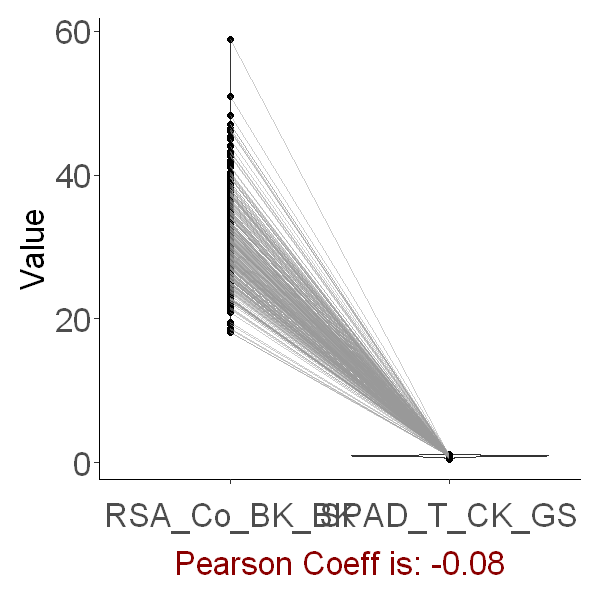

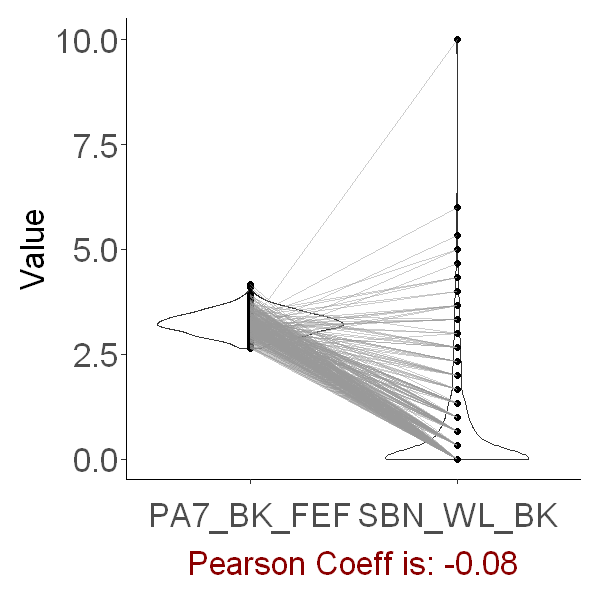

Warning message:
"Removed 40 rows containing non-finite values (stat_ydensity)."
Warning message:
"Removed 40 rows containing missing values (geom_point)."
Warning message:
"Removed 40 row(s) containing missing values (geom_path)."


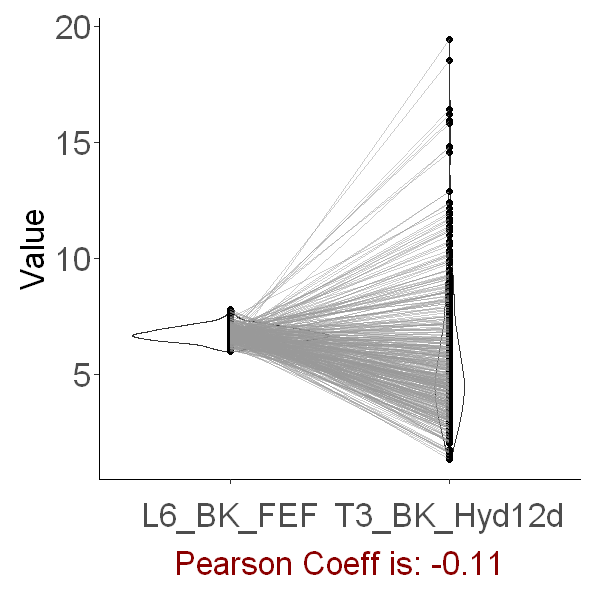

Warning message:
"Removed 5 rows containing non-finite values (stat_ydensity)."
Warning message:
"Removed 5 rows containing missing values (geom_point)."
Warning message:
"Removed 5 row(s) containing missing values (geom_path)."


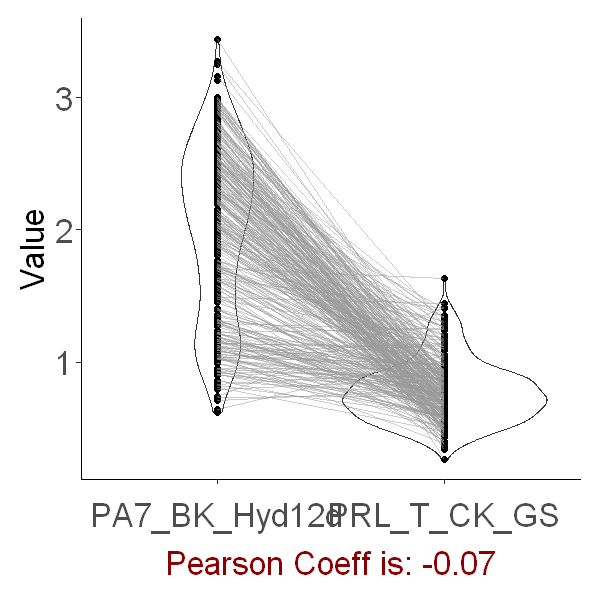

Warning message:
"Removed 7 rows containing non-finite values (stat_ydensity)."
Warning message:
"Removed 7 rows containing missing values (geom_point)."
Warning message:
"Removed 7 row(s) containing missing values (geom_path)."


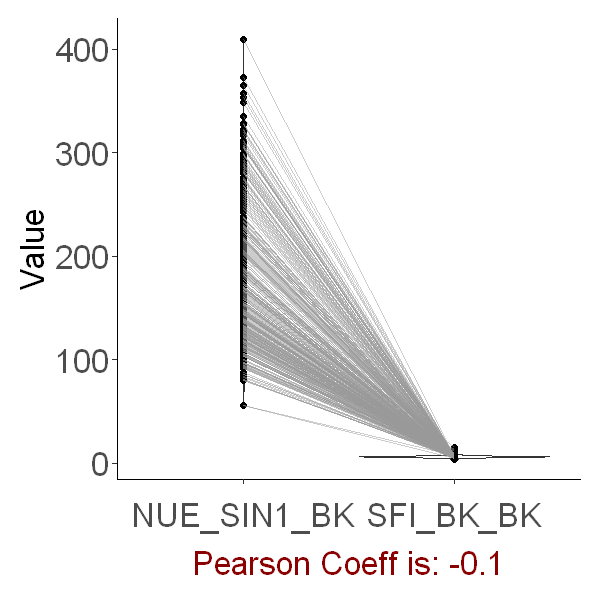

Warning message:
"Removed 5 rows containing non-finite values (stat_ydensity)."
Warning message:
"Removed 5 rows containing missing values (geom_point)."
Warning message:
"Removed 5 row(s) containing missing values (geom_path)."


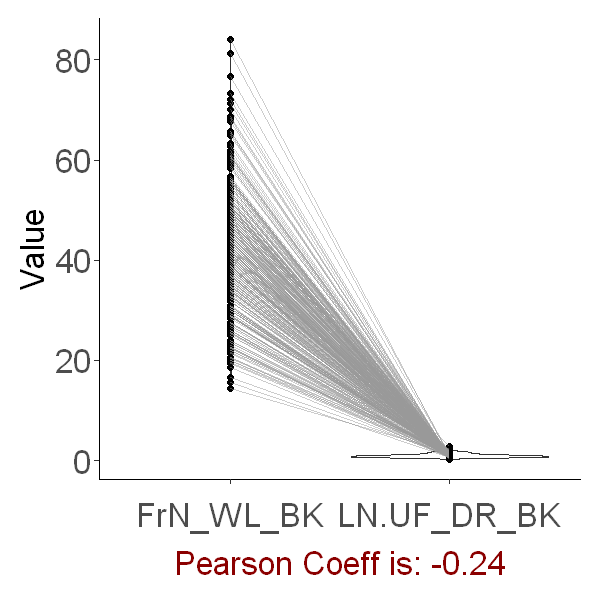

Warning message:
"Removed 2 rows containing non-finite values (stat_ydensity)."
Warning message:
"Removed 2 rows containing missing values (geom_point)."
Warning message:
"Removed 2 row(s) containing missing values (geom_path)."


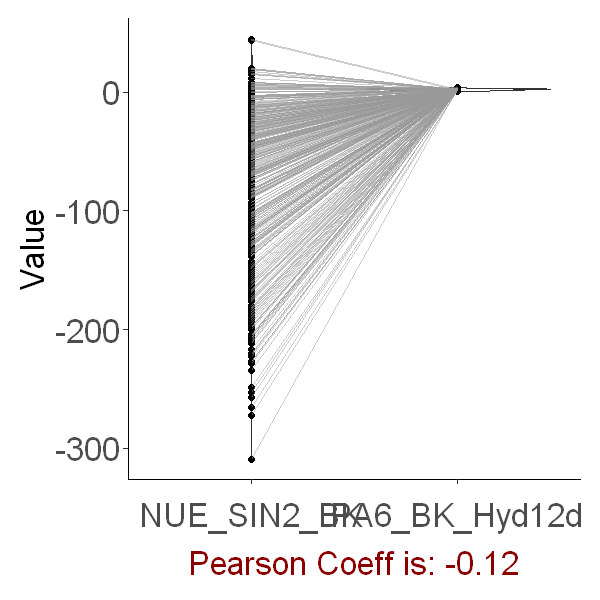

Warning message:
"Removed 5 rows containing non-finite values (stat_ydensity)."
Warning message:
"Removed 5 rows containing missing values (geom_point)."
Warning message:
"Removed 5 row(s) containing missing values (geom_path)."


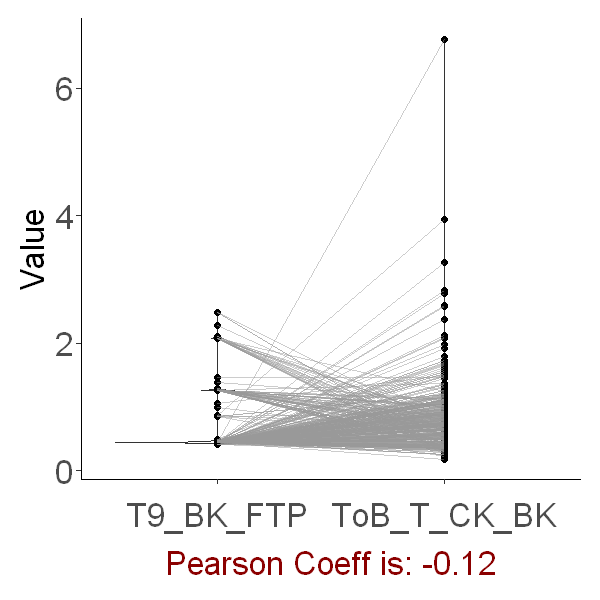

Warning message:
"Removed 71 rows containing non-finite values (stat_ydensity)."
Warning message:
"Removed 71 rows containing missing values (geom_point)."
Warning message:
"Removed 71 row(s) containing missing values (geom_path)."


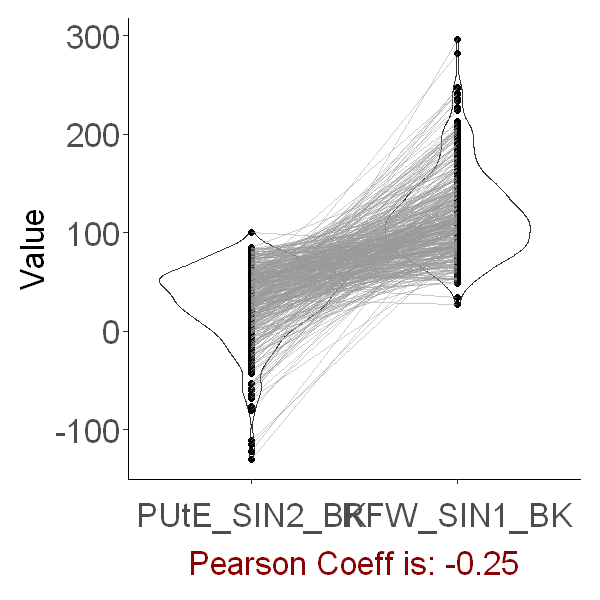

Warning message:
"Removed 1 rows containing non-finite values (stat_ydensity)."
Warning message:
"Removed 1 rows containing missing values (geom_point)."
Warning message:
"Removed 1 row(s) containing missing values (geom_path)."


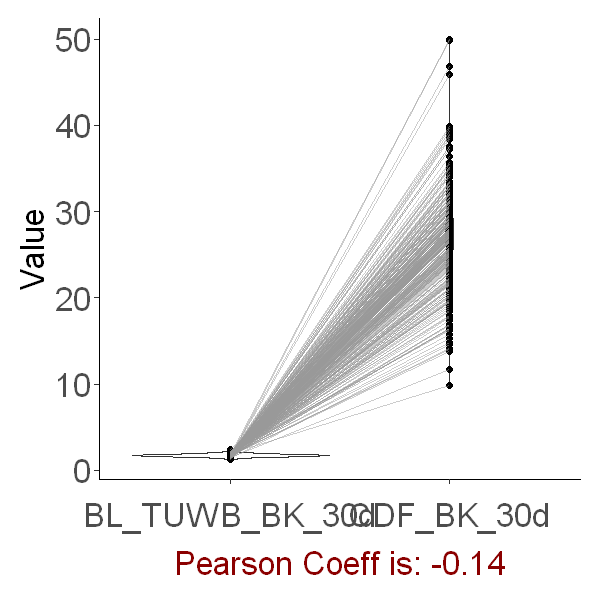

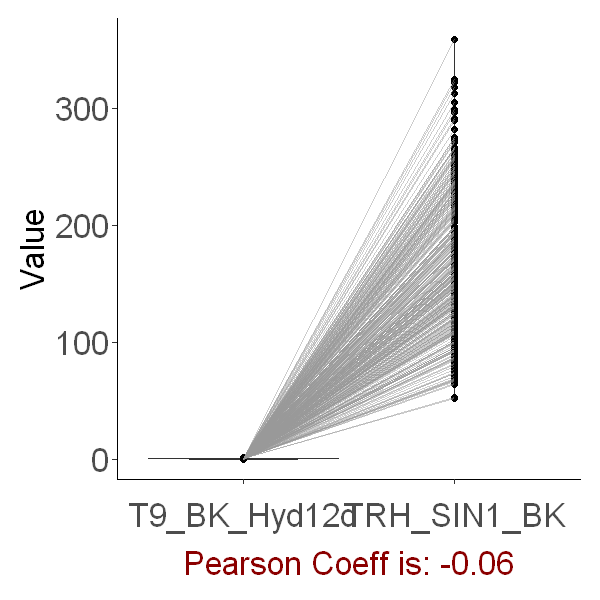

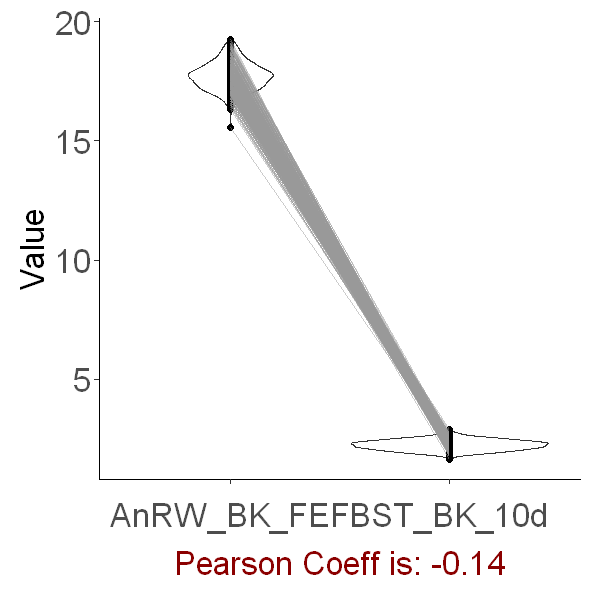

Warning message:
"Removed 34 rows containing non-finite values (stat_ydensity)."
Warning message:
"Removed 34 rows containing missing values (geom_point)."
Warning message:
"Removed 34 row(s) containing missing values (geom_path)."


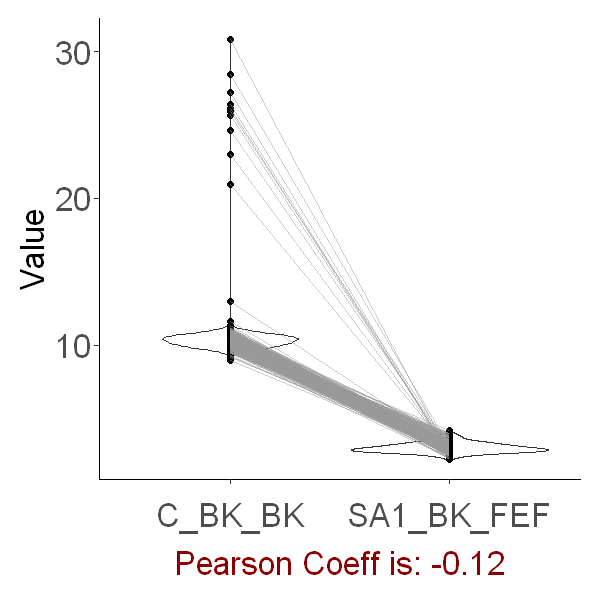

Warning message:
"Removed 12 rows containing non-finite values (stat_ydensity)."
Warning message:
"Removed 12 rows containing missing values (geom_point)."
Warning message:
"Removed 12 row(s) containing missing values (geom_path)."


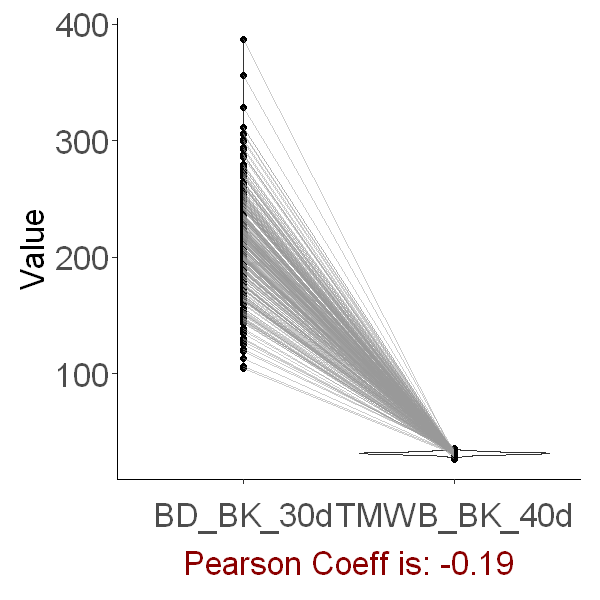

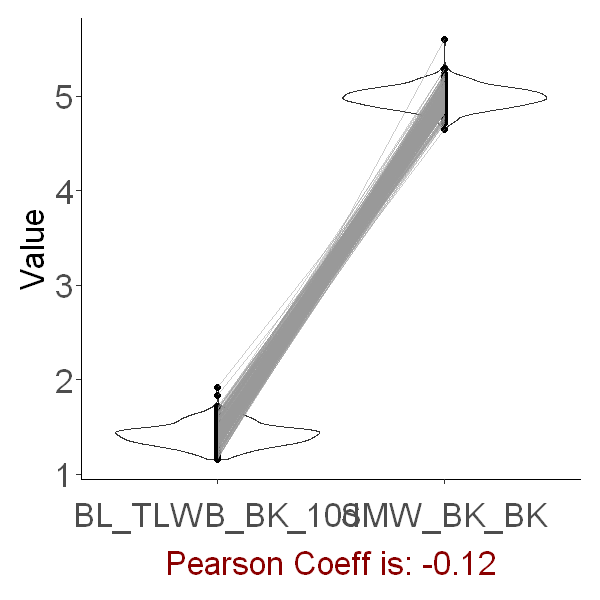

Warning message:
"Removed 5 rows containing non-finite values (stat_ydensity)."
Warning message:
"Removed 5 rows containing missing values (geom_point)."
Warning message:
"Removed 5 row(s) containing missing values (geom_path)."


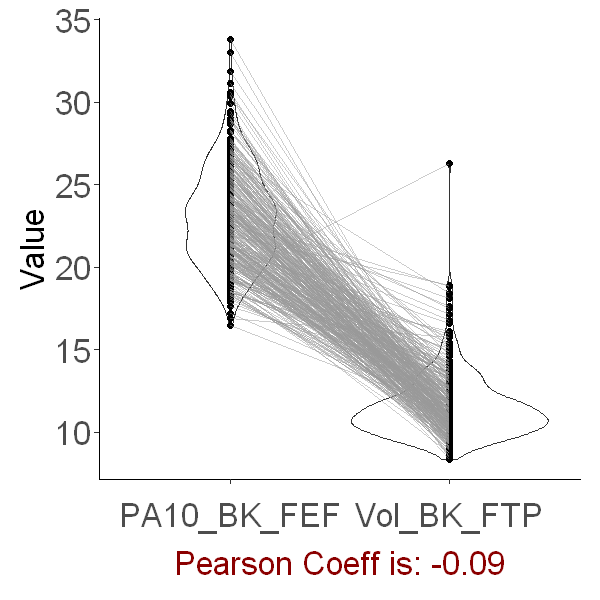

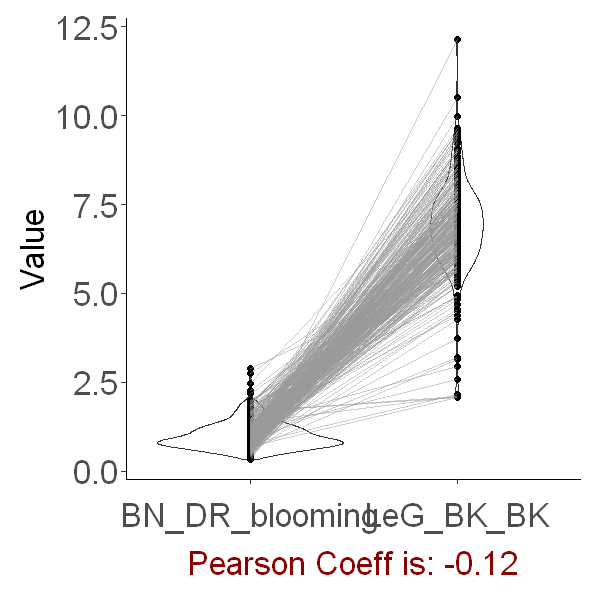

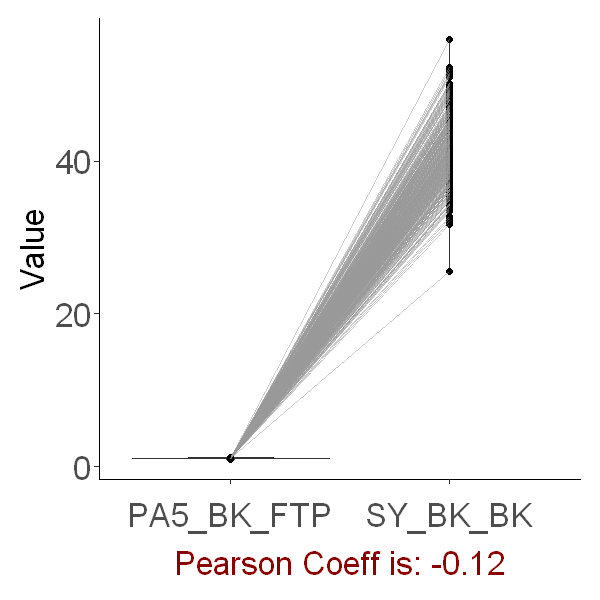

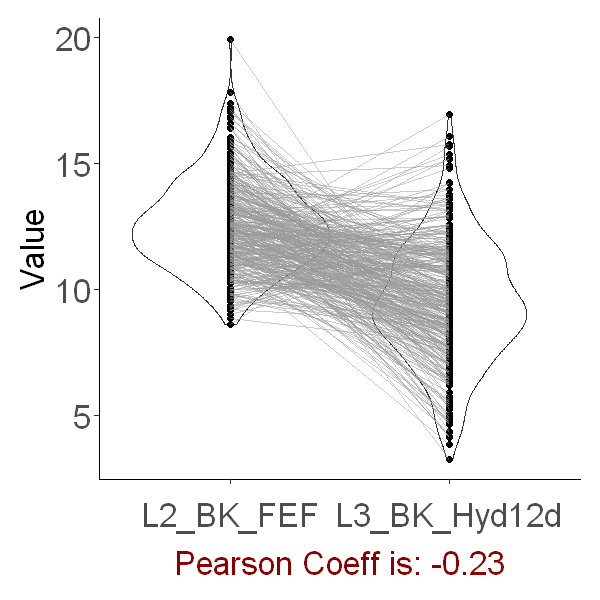

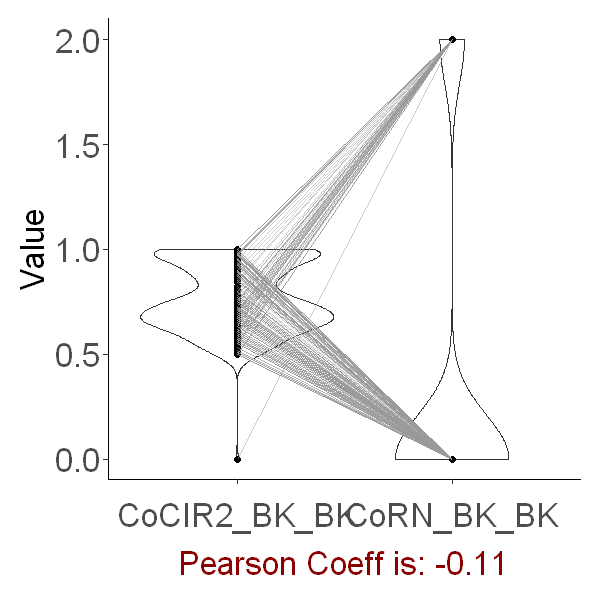

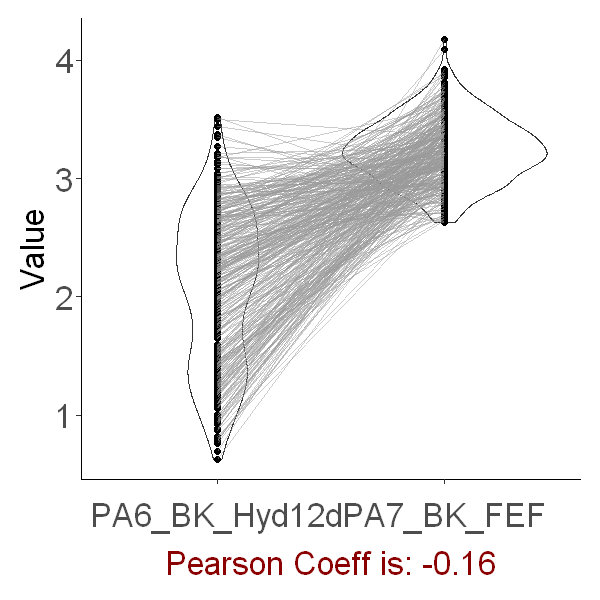

Warning message:
"Removed 8 rows containing non-finite values (stat_ydensity)."
Warning message:
"Removed 8 rows containing missing values (geom_point)."
Warning message:
"Removed 8 row(s) containing missing values (geom_path)."


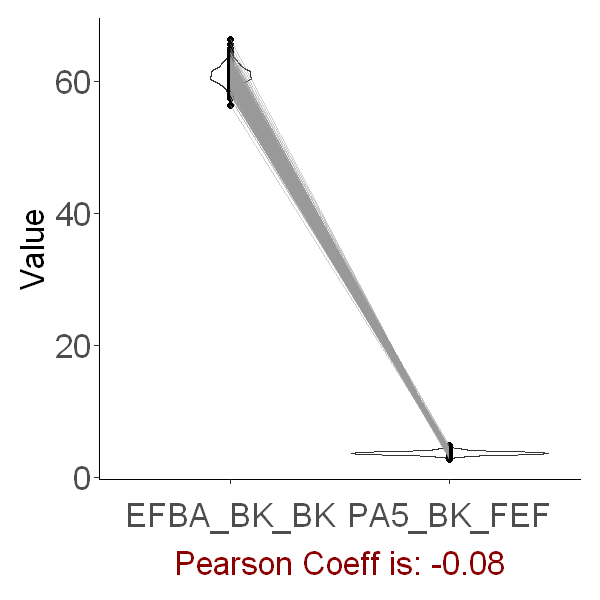

Warning message:
"Removed 33 rows containing non-finite values (stat_ydensity)."
Warning message:
"Removed 33 rows containing missing values (geom_point)."
Warning message:
"Removed 33 row(s) containing missing values (geom_path)."


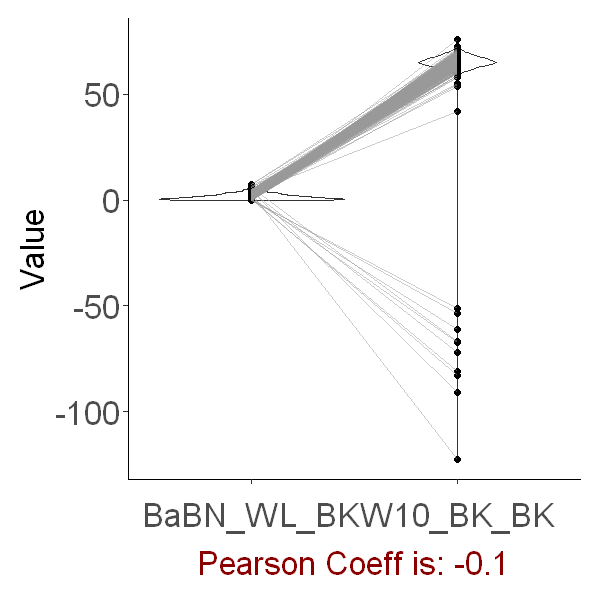

Warning message:
"Removed 1 rows containing non-finite values (stat_ydensity)."
Warning message:
"Removed 1 rows containing missing values (geom_point)."
Warning message:
"Removed 1 row(s) containing missing values (geom_path)."


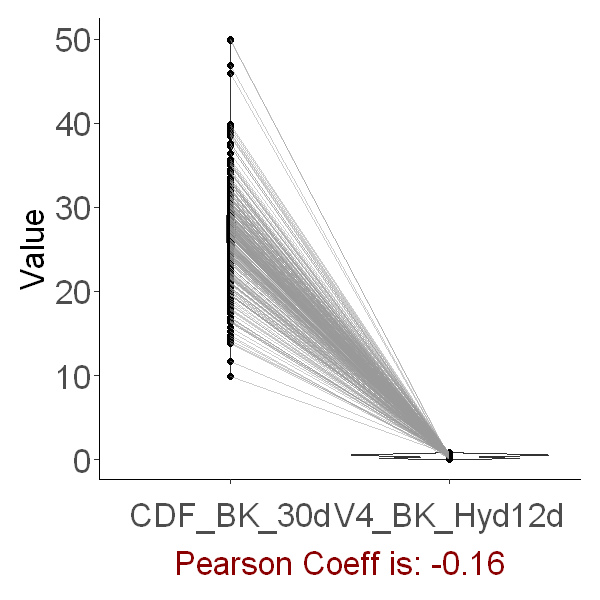

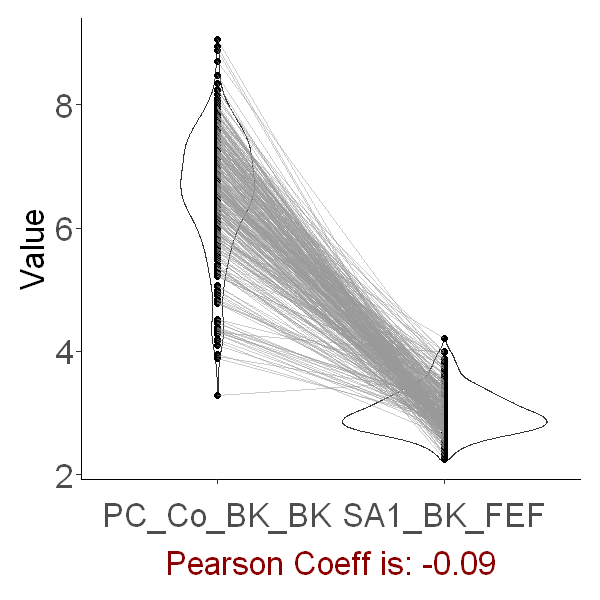

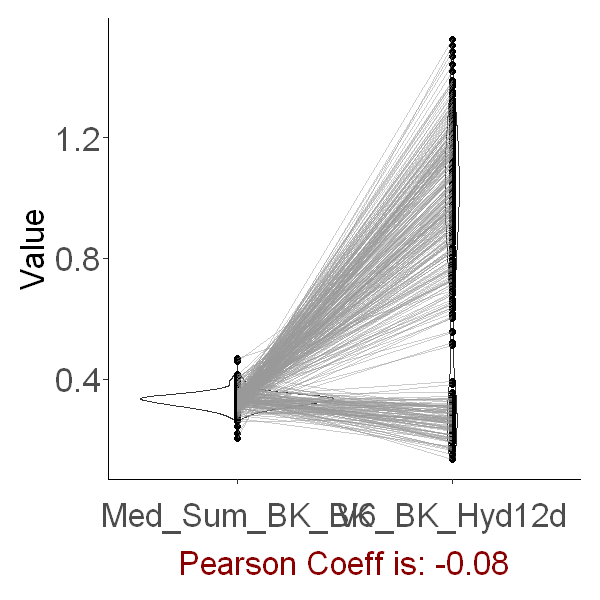

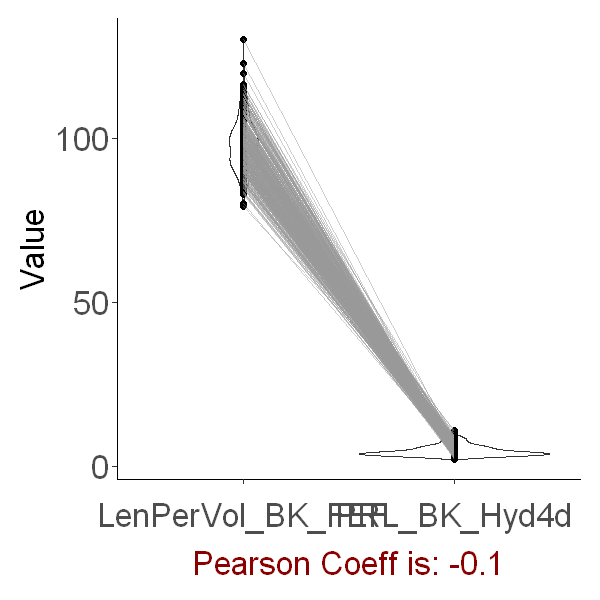

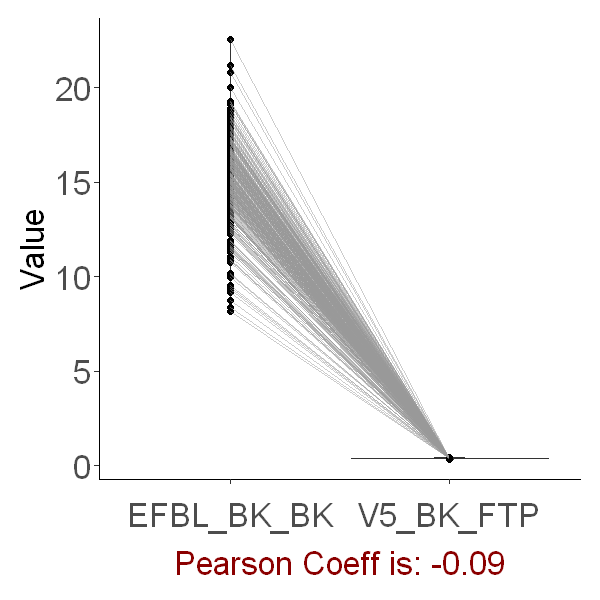

Warning message:
"Removed 14 rows containing non-finite values (stat_ydensity)."
Warning message:
"Removed 14 rows containing missing values (geom_point)."
Warning message:
"Removed 14 row(s) containing missing values (geom_path)."


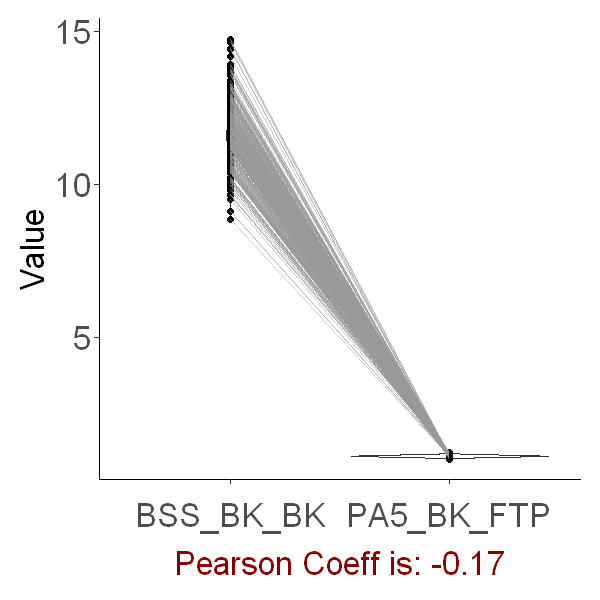

Warning message:
"Removed 173 rows containing non-finite values (stat_ydensity)."
Warning message:
"Removed 173 rows containing missing values (geom_point)."
Warning message:
"Removed 173 row(s) containing missing values (geom_path)."


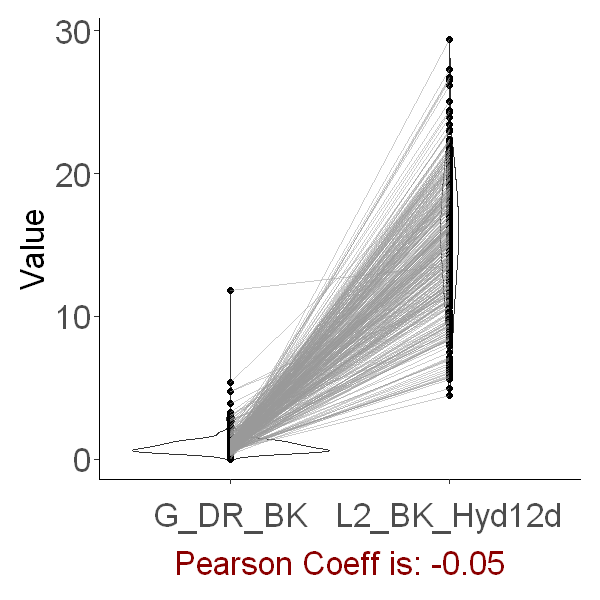

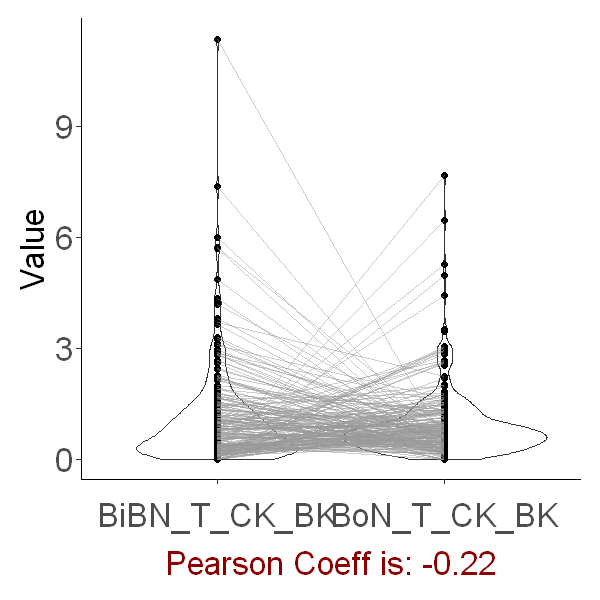

Warning message:
"Removed 29 rows containing non-finite values (stat_ydensity)."
Warning message:
"Removed 29 rows containing missing values (geom_point)."
Warning message:
"Removed 29 row(s) containing missing values (geom_path)."


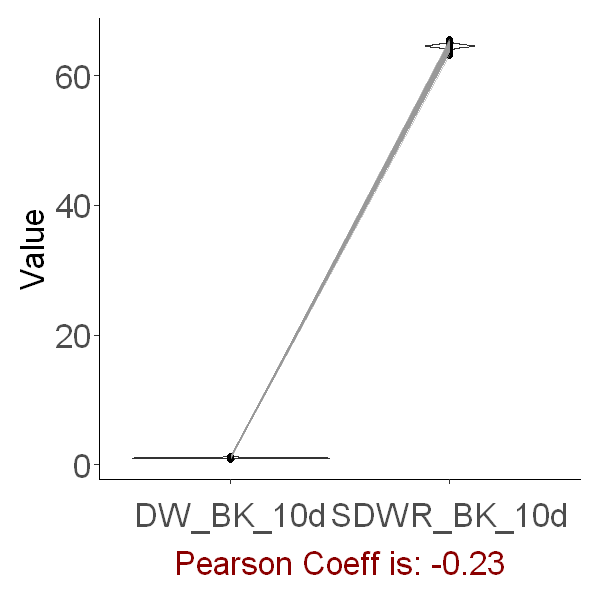

Warning message:
"Removed 1 rows containing non-finite values (stat_ydensity)."
Warning message:
"Removed 1 rows containing missing values (geom_point)."
Warning message:
"Removed 1 row(s) containing missing values (geom_path)."


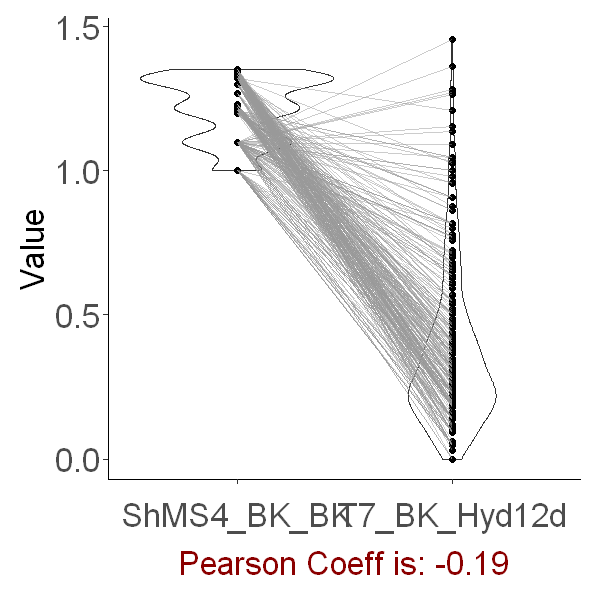

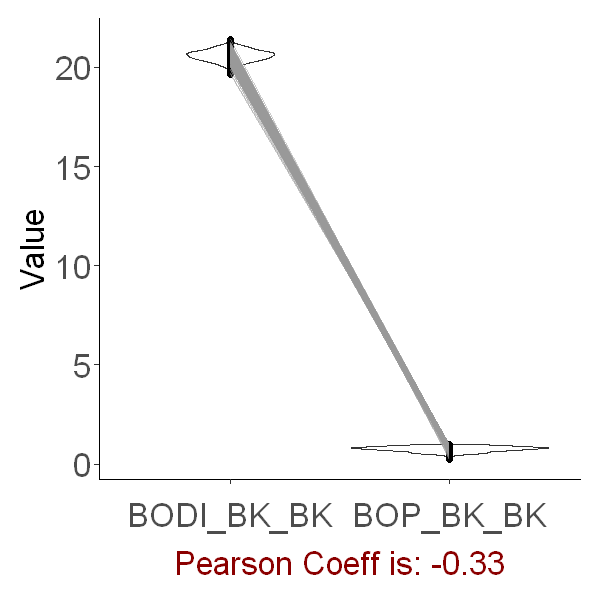

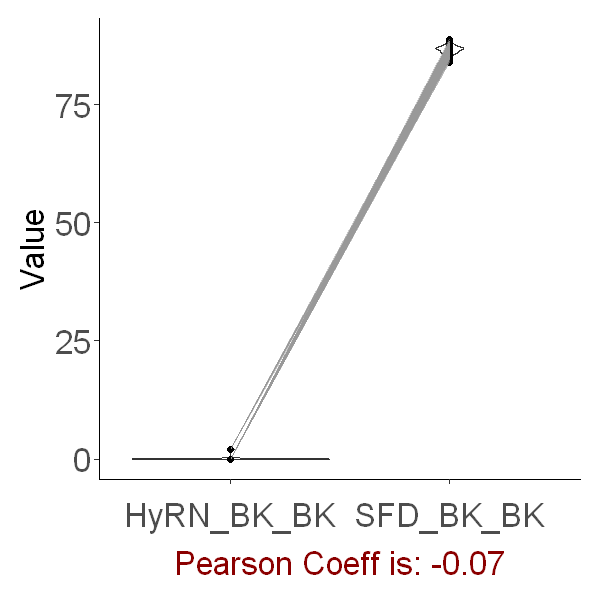

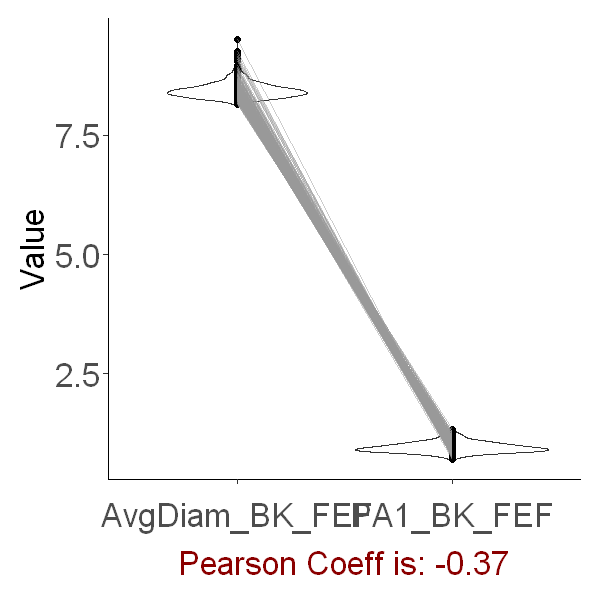

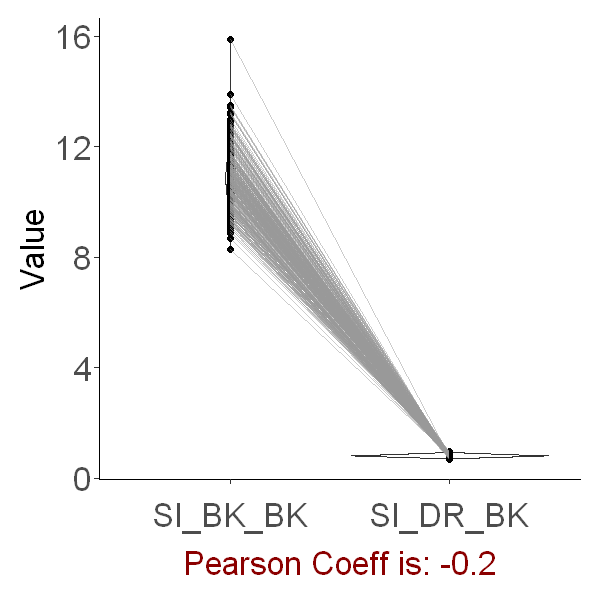

Warning message:
"Removed 1 rows containing non-finite values (stat_ydensity)."
Warning message:
"Removed 1 rows containing missing values (geom_point)."
Warning message:
"Removed 1 row(s) containing missing values (geom_path)."


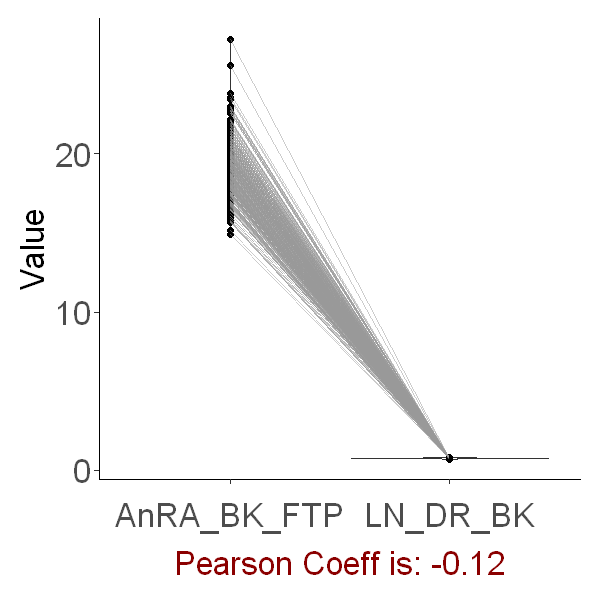

Warning message:
"Removed 1 rows containing non-finite values (stat_ydensity)."
Warning message:
"Removed 1 rows containing missing values (geom_point)."
Warning message:
"Removed 1 row(s) containing missing values (geom_path)."


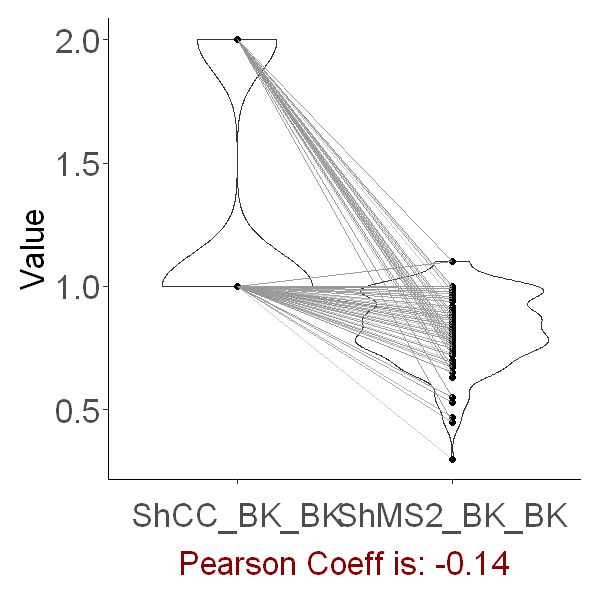

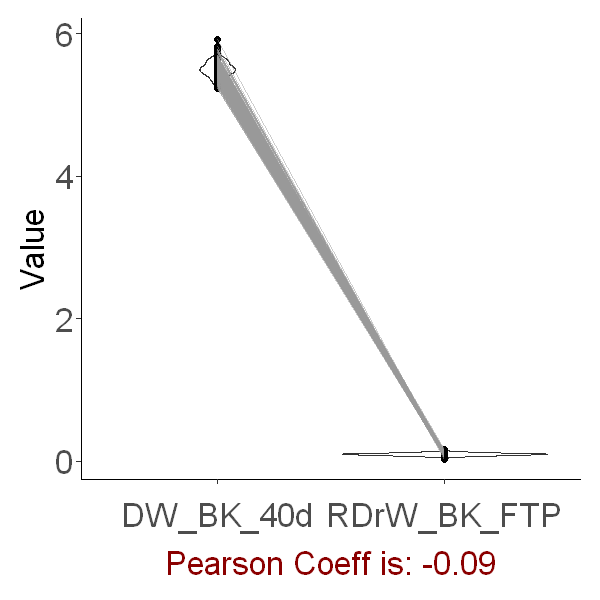

Warning message:
"Removed 33 rows containing non-finite values (stat_ydensity)."
Warning message:
"Removed 33 rows containing missing values (geom_point)."
Warning message:
"Removed 33 row(s) containing missing values (geom_path)."


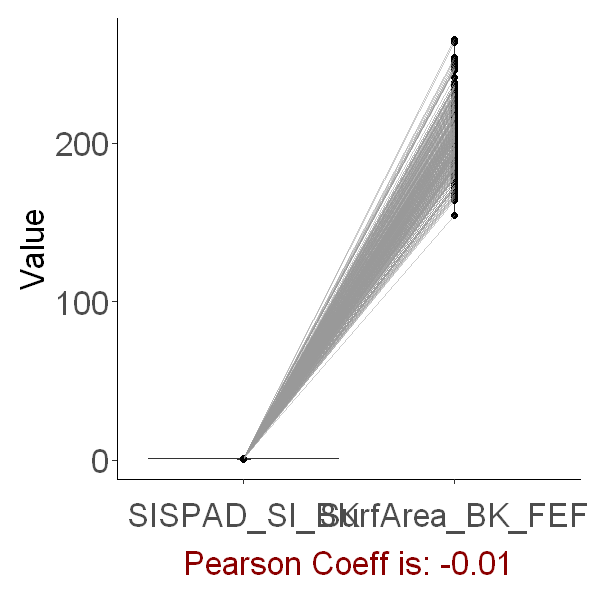

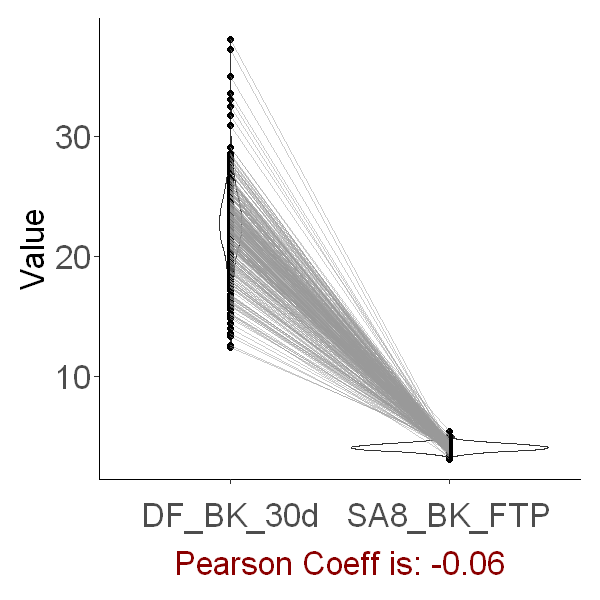

Warning message:
"Removed 33 rows containing non-finite values (stat_ydensity)."
Warning message:
"Removed 33 rows containing missing values (geom_point)."
Warning message:
"Removed 33 row(s) containing missing values (geom_path)."


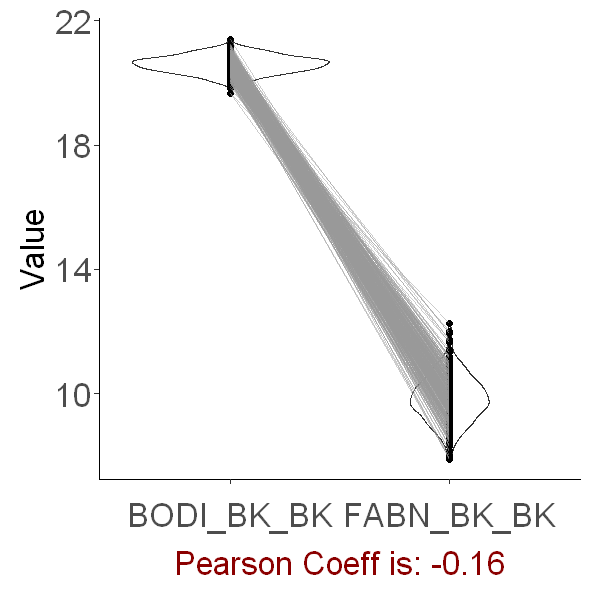

Warning message:
"Removed 33 rows containing non-finite values (stat_ydensity)."
Warning message:
"Removed 33 rows containing missing values (geom_point)."
Warning message:
"Removed 33 row(s) containing missing values (geom_path)."


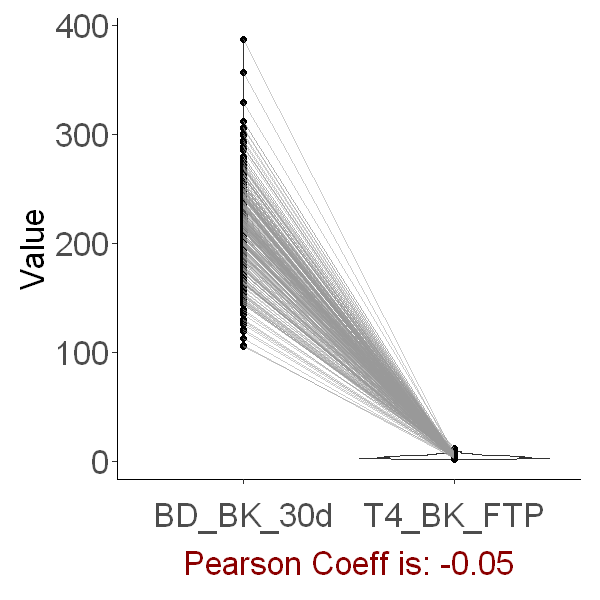

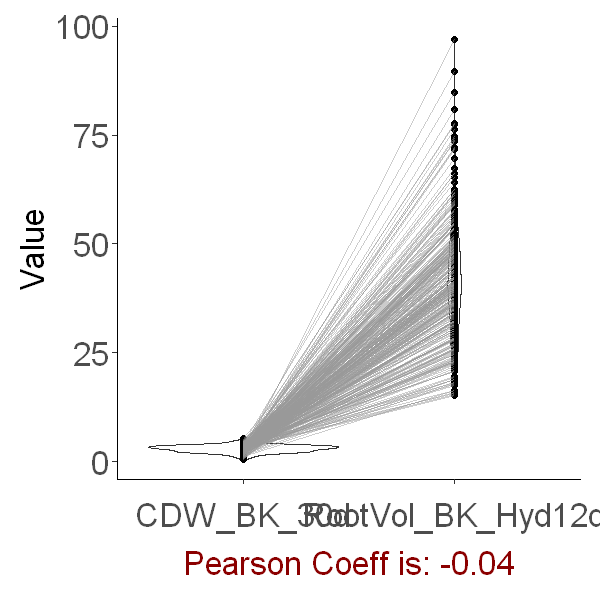

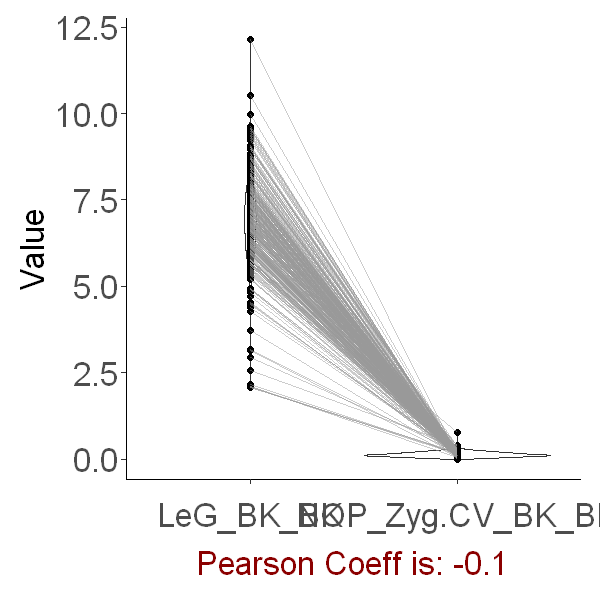

Warning message:
"Removed 4 rows containing non-finite values (stat_ydensity)."
Warning message:
"Removed 4 rows containing missing values (geom_point)."
Warning message:
"Removed 4 row(s) containing missing values (geom_path)."


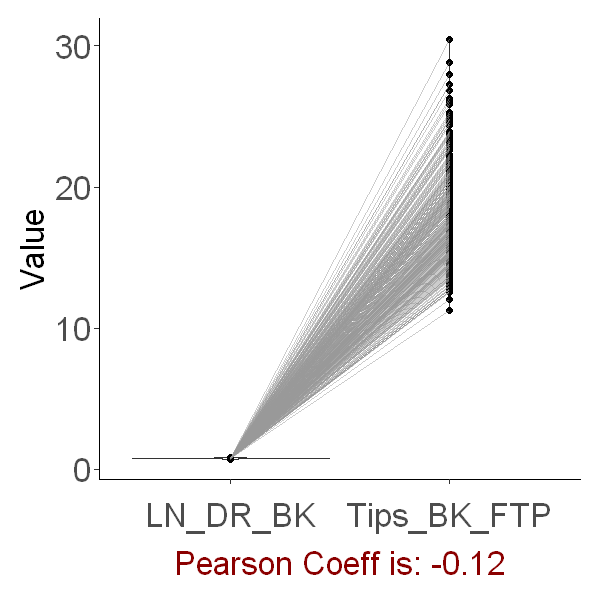

Warning message:
"Removed 8 rows containing non-finite values (stat_ydensity)."
Warning message:
"Removed 8 rows containing missing values (geom_point)."
Warning message:
"Removed 8 row(s) containing missing values (geom_path)."


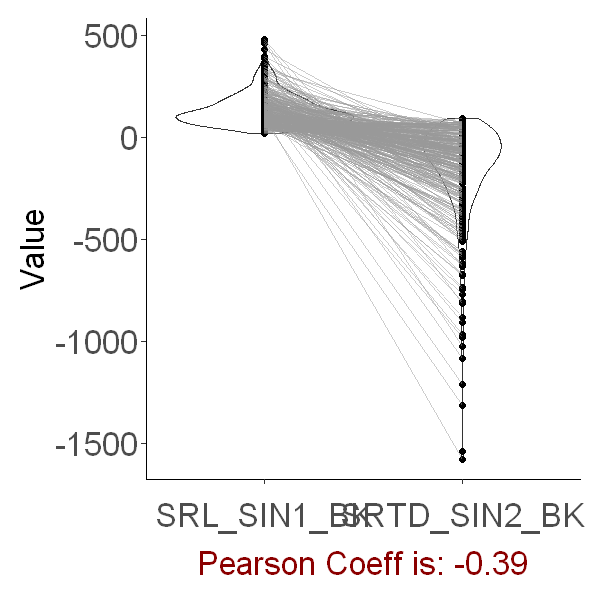

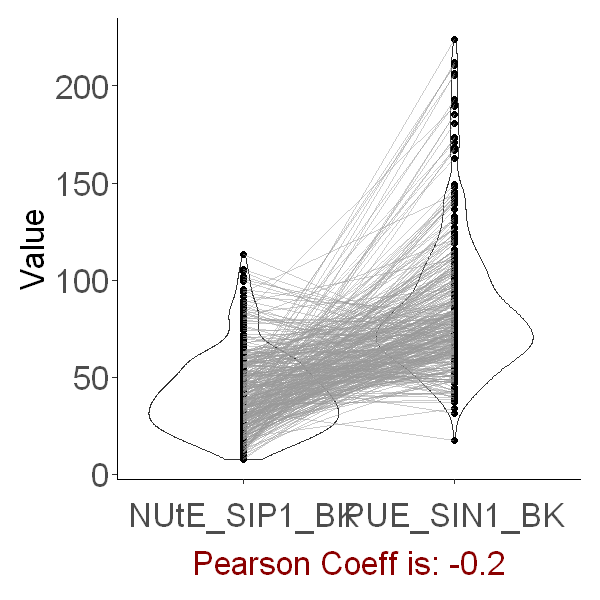

Warning message:
"Removed 4 rows containing non-finite values (stat_ydensity)."
Warning message:
"Removed 4 rows containing missing values (geom_point)."
Warning message:
"Removed 4 row(s) containing missing values (geom_path)."


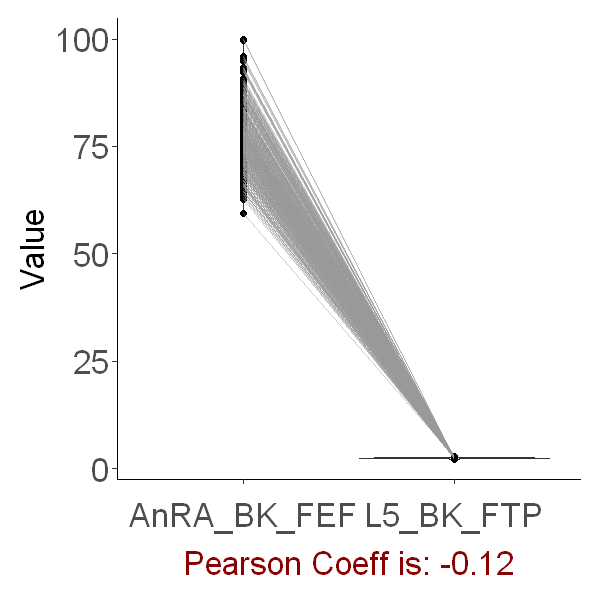

Warning message:
"Removed 33 rows containing non-finite values (stat_ydensity)."
Warning message:
"Removed 33 rows containing missing values (geom_point)."
Warning message:
"Removed 33 row(s) containing missing values (geom_path)."


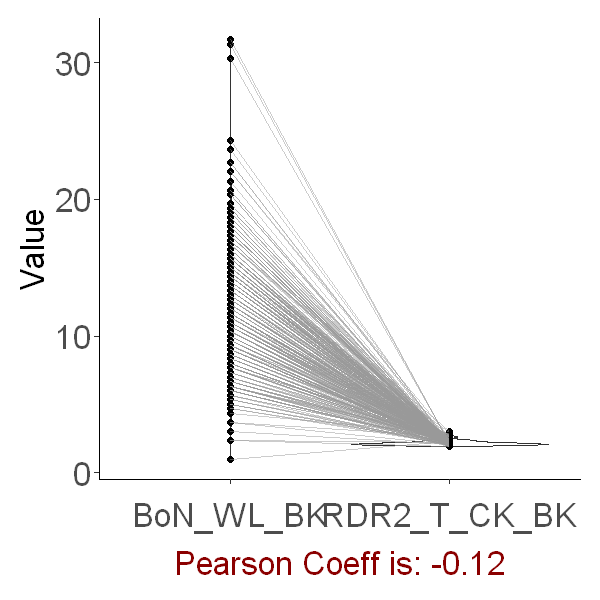

Warning message:
"Removed 2 rows containing non-finite values (stat_ydensity)."
Warning message:
"Removed 2 rows containing missing values (geom_point)."
Warning message:
"Removed 2 row(s) containing missing values (geom_path)."


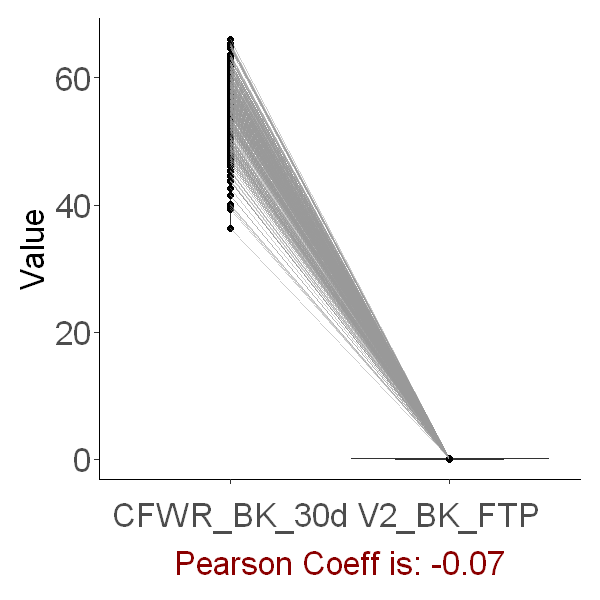

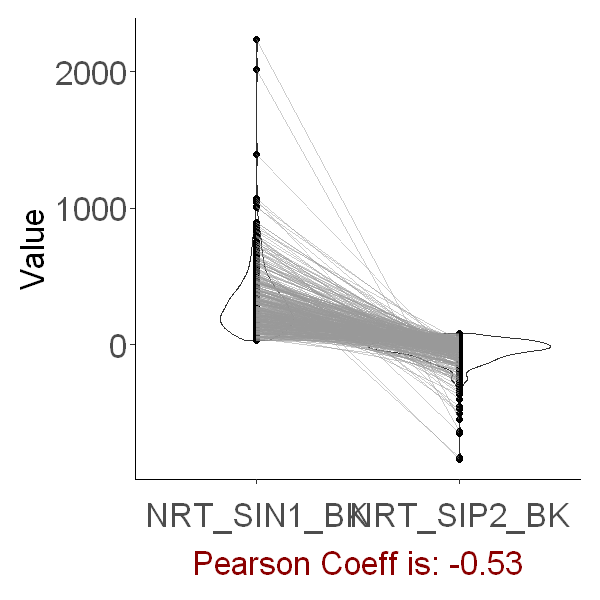

Warning message:
"Removed 2 rows containing non-finite values (stat_ydensity)."
Warning message:
"Removed 2 rows containing missing values (geom_point)."
Warning message:
"Removed 2 row(s) containing missing values (geom_path)."


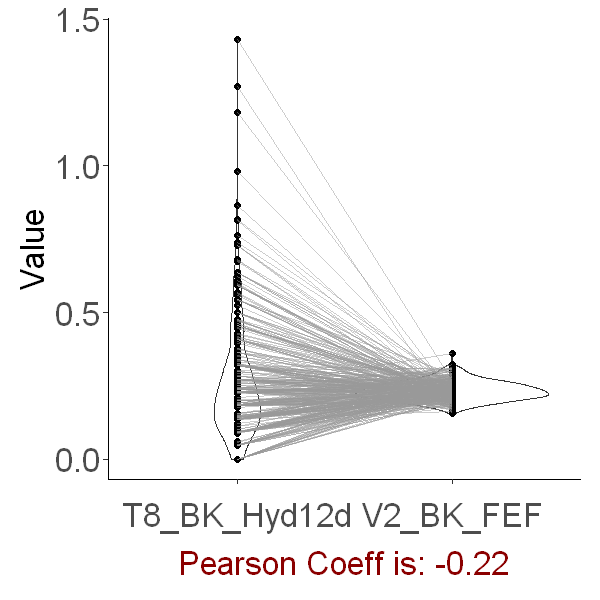

Warning message:
"Removed 33 rows containing non-finite values (stat_ydensity)."
Warning message:
"Removed 33 rows containing missing values (geom_point)."
Warning message:
"Removed 33 row(s) containing missing values (geom_path)."


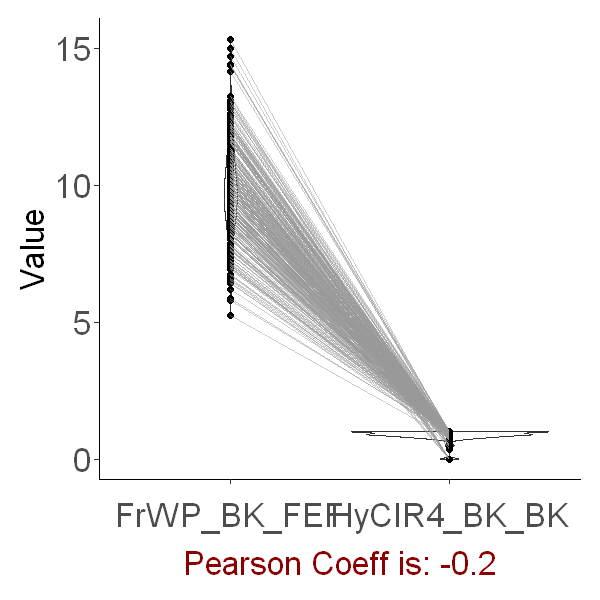

Warning message:
"Removed 33 rows containing non-finite values (stat_ydensity)."
Warning message:
"Removed 33 rows containing missing values (geom_point)."
Warning message:
"Removed 33 row(s) containing missing values (geom_path)."


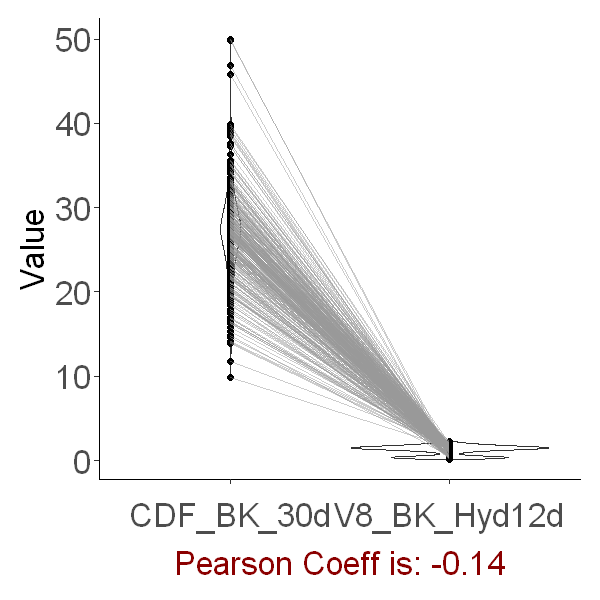

Warning message:
"Removed 10 rows containing non-finite values (stat_ydensity)."
Warning message:
"Removed 10 rows containing missing values (geom_point)."
Warning message:
"Removed 10 row(s) containing missing values (geom_path)."


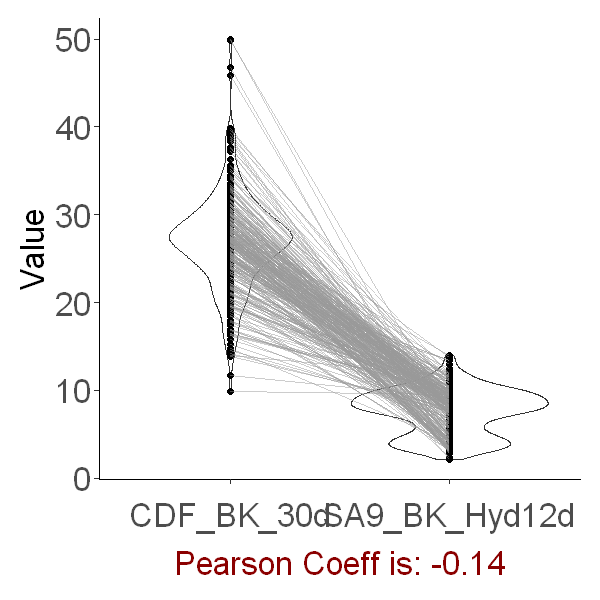

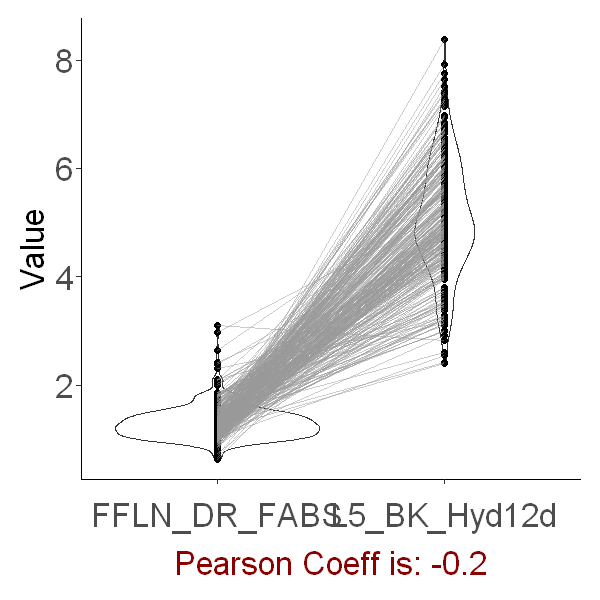

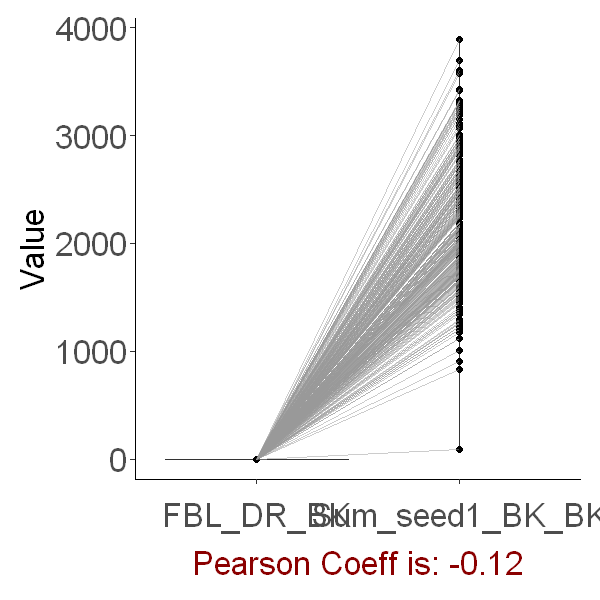

Warning message:
"Removed 45 rows containing non-finite values (stat_ydensity)."
Warning message:
"Removed 45 rows containing missing values (geom_point)."
Warning message:
"Removed 45 row(s) containing missing values (geom_path)."


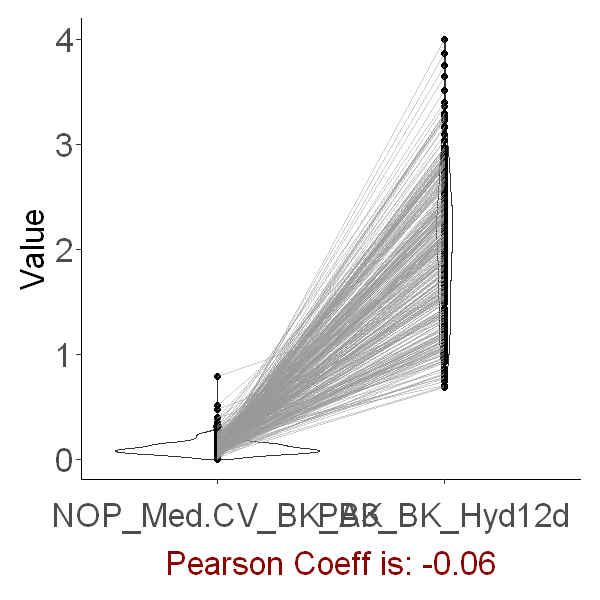

Warning message:
"Removed 1 rows containing non-finite values (stat_ydensity)."
Warning message:
"Removed 1 rows containing missing values (geom_point)."
Warning message:
"Removed 1 row(s) containing missing values (geom_path)."


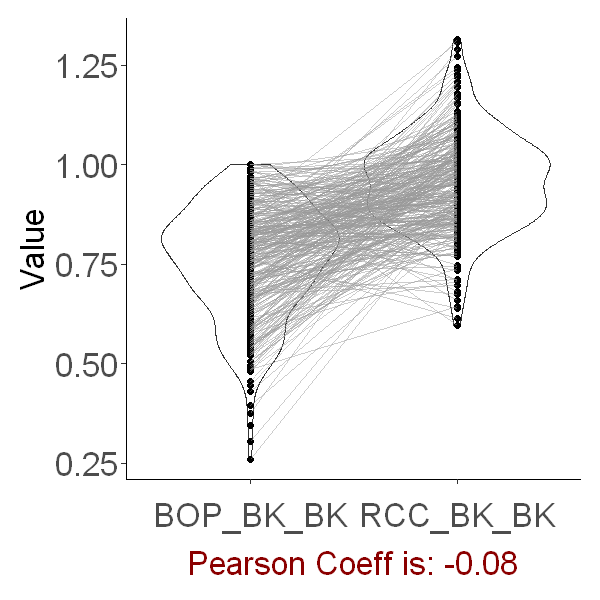

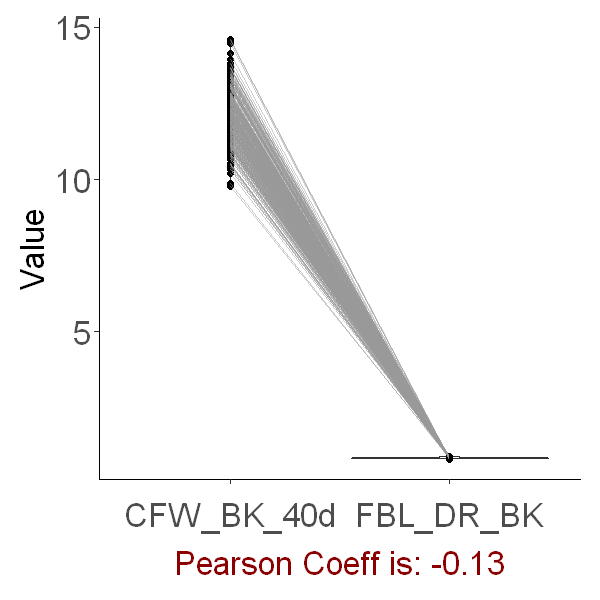

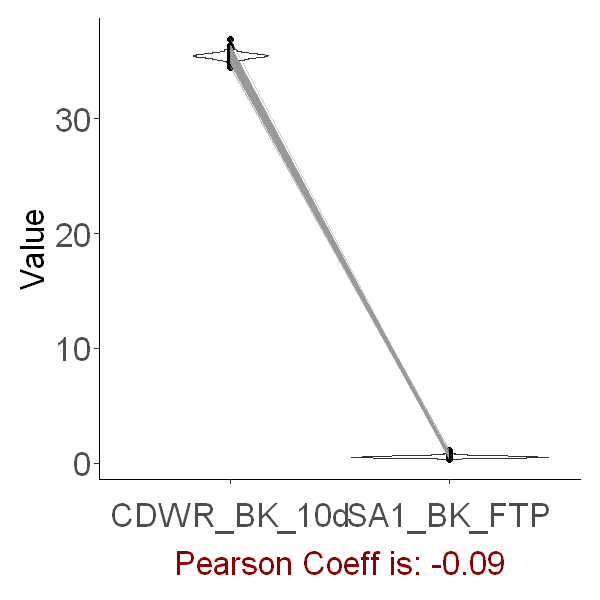

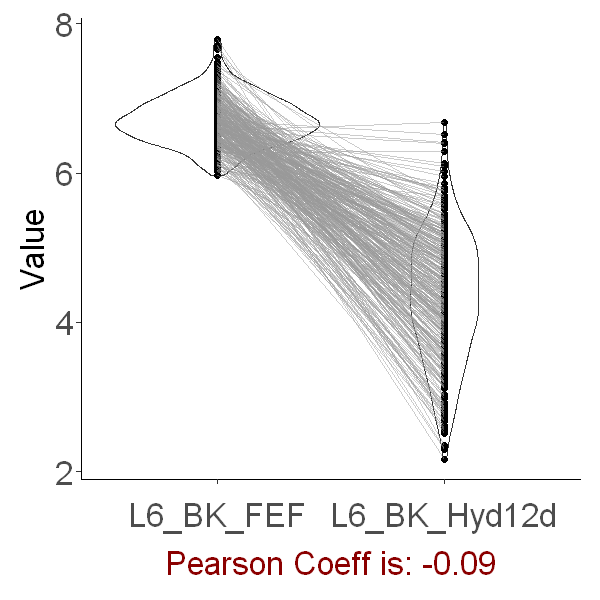

Warning message:
"Removed 33 rows containing non-finite values (stat_ydensity)."
Warning message:
"Removed 33 rows containing missing values (geom_point)."
Warning message:
"Removed 33 row(s) containing missing values (geom_path)."


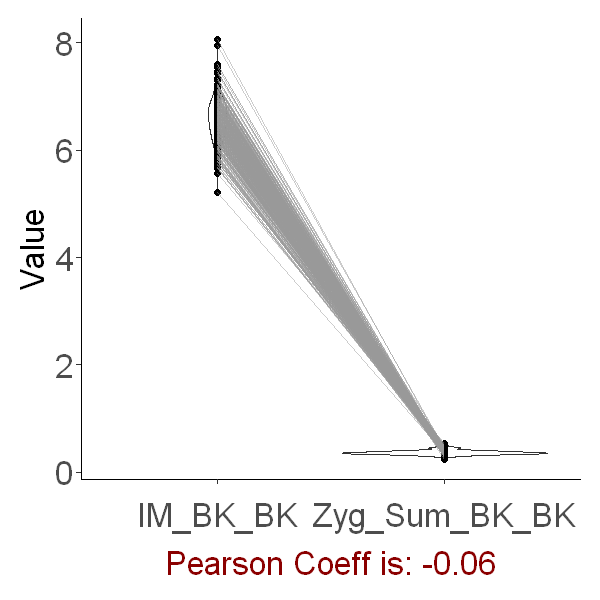

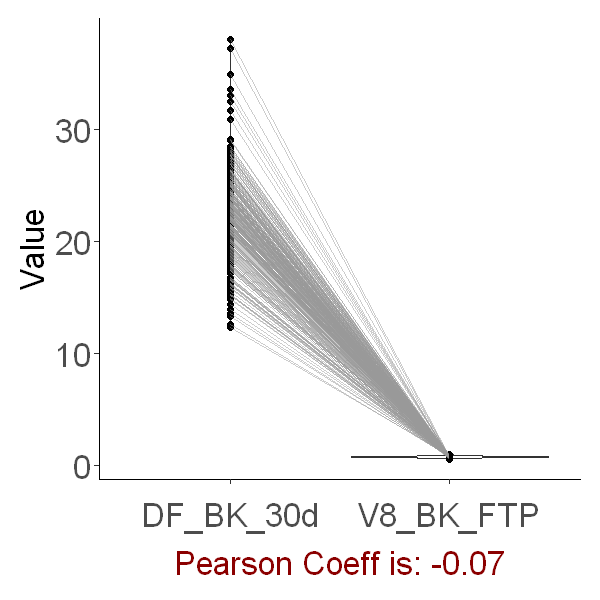

In [133]:
tmp <- df_rg %>% 
subset(Trait_idx_1 > Trait_idx_2) %>% 
subset(Pval < 0.05) %>% 
subset(rG == -1)

set.seed(999)
row_idx <- sample(rownames(tmp), 100)
tmp <- tmp[row_idx, ]

for (i in 1:nrow(tmp)){
    p <- plot_pair_trait(df_blup, tmp$Trait1[i], tmp$Trait2[i])
    print(p)
}

- rG = 0.8~0.9

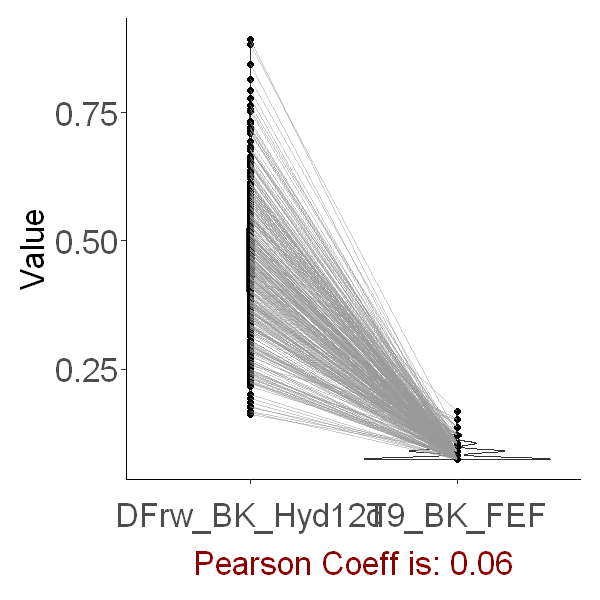

Warning message:
"Removed 1 rows containing non-finite values (stat_ydensity)."
Warning message:
"Removed 1 rows containing missing values (geom_point)."
Warning message:
"Removed 1 row(s) containing missing values (geom_path)."


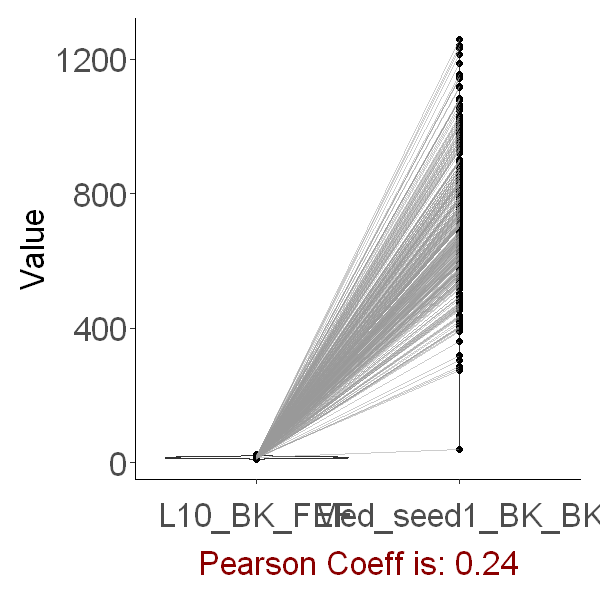

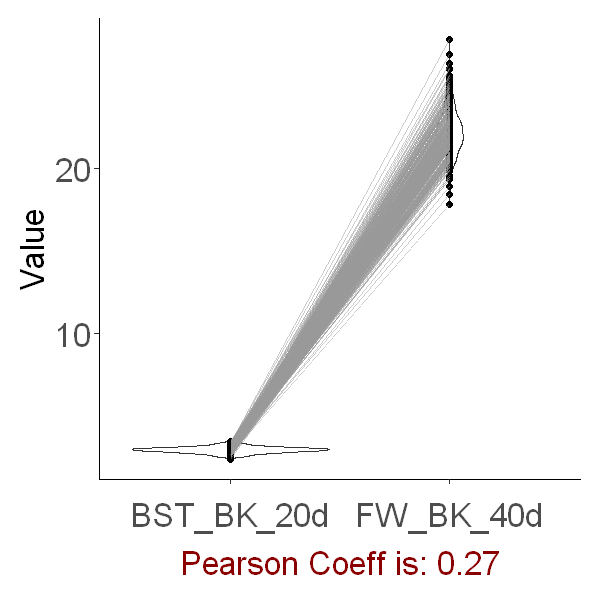

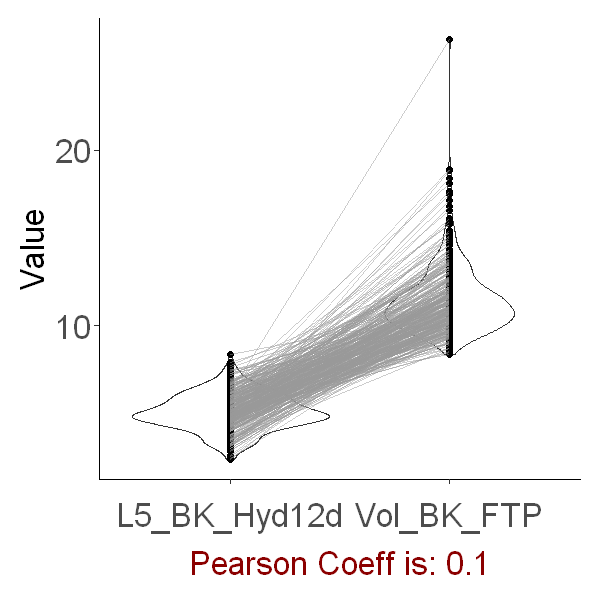

Warning message:
"Removed 1 rows containing non-finite values (stat_ydensity)."
Warning message:
"Removed 1 rows containing missing values (geom_point)."
Warning message:
"Removed 1 row(s) containing missing values (geom_path)."


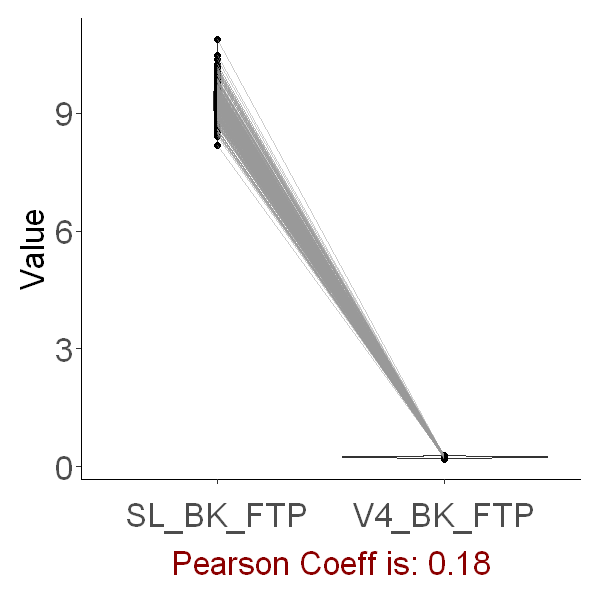

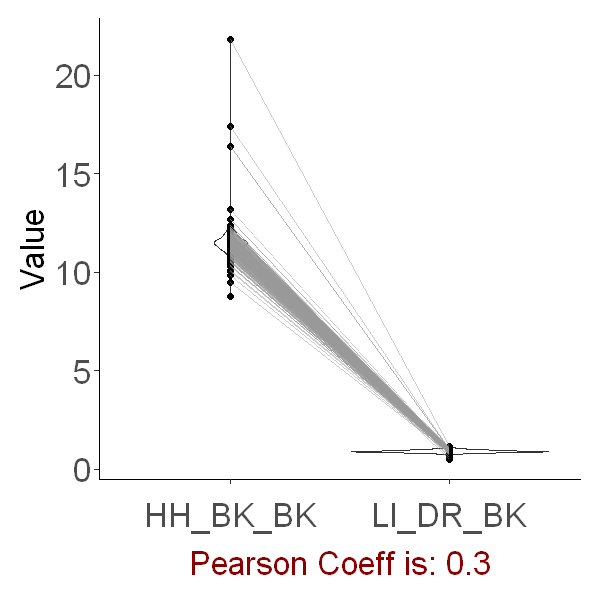

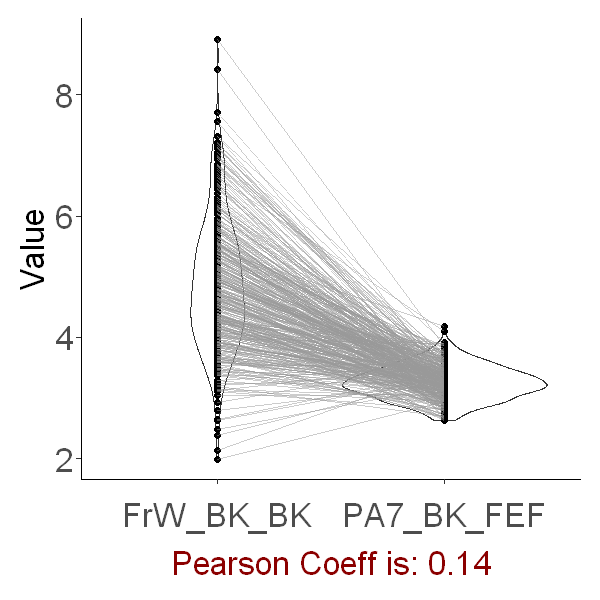

Warning message:
"Removed 38 rows containing non-finite values (stat_ydensity)."
Warning message:
"Removed 38 rows containing missing values (geom_point)."
Warning message:
"Removed 38 row(s) containing missing values (geom_path)."


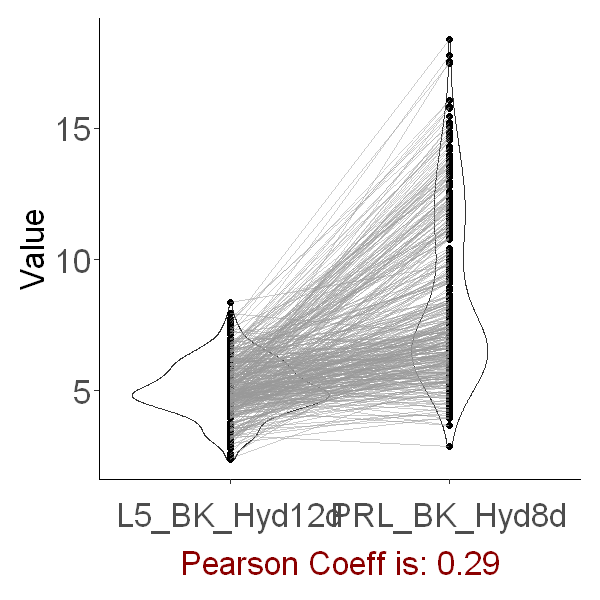

Warning message:
"Removed 1 rows containing non-finite values (stat_ydensity)."
Warning message:
"Removed 1 rows containing missing values (geom_point)."
Warning message:
"Removed 1 row(s) containing missing values (geom_path)."


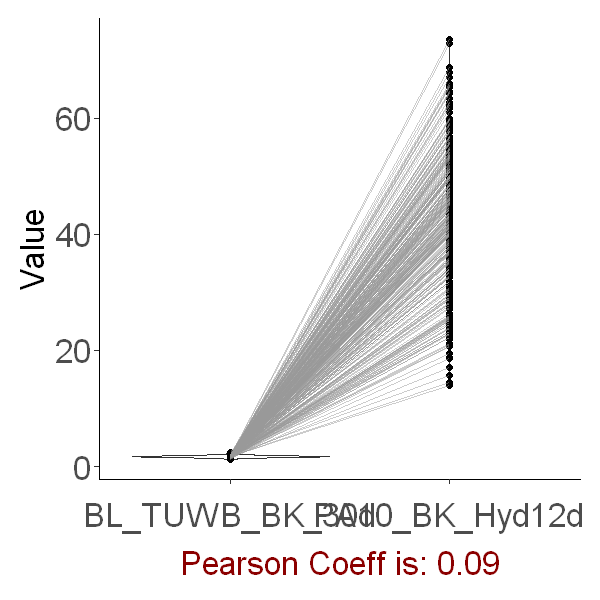

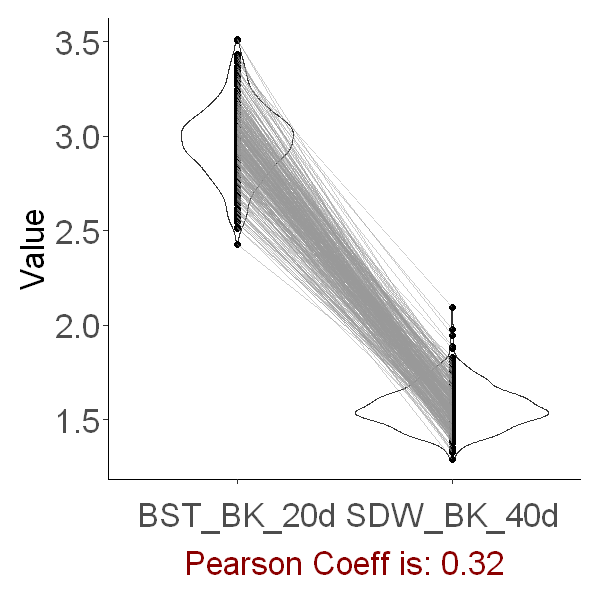

Warning message:
"Removed 6 rows containing non-finite values (stat_ydensity)."
Warning message:
"Removed 6 rows containing missing values (geom_point)."
Warning message:
"Removed 6 row(s) containing missing values (geom_path)."


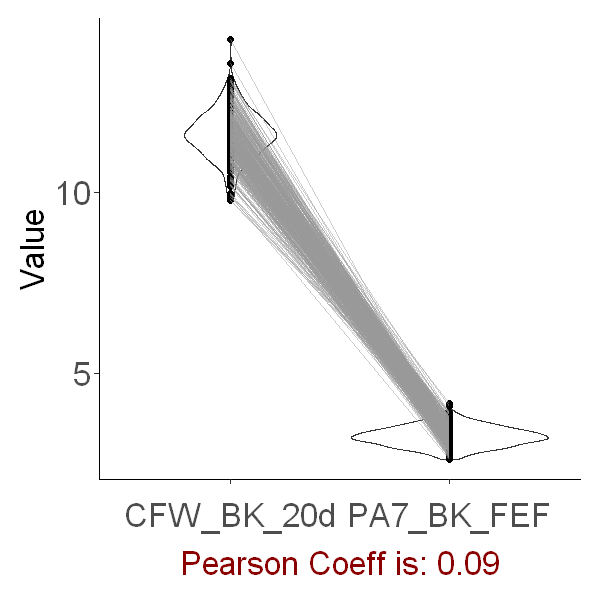

Warning message:
"Removed 68 rows containing non-finite values (stat_ydensity)."
Warning message:
"Removed 68 rows containing missing values (geom_point)."
Warning message:
"Removed 68 row(s) containing missing values (geom_path)."


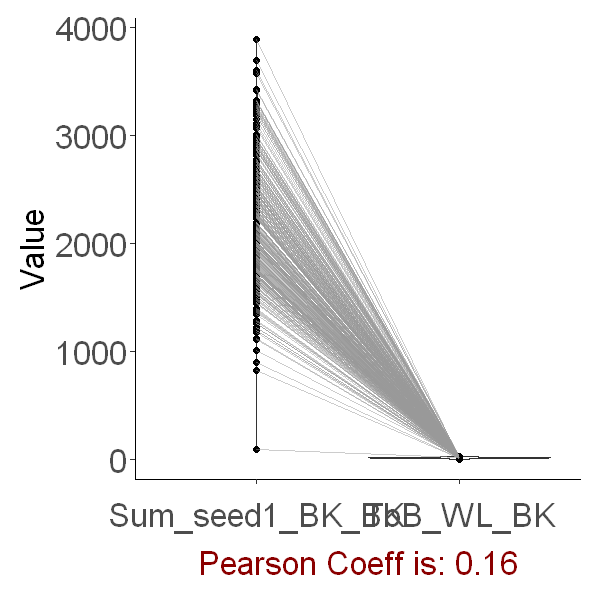

Warning message:
"Removed 38 rows containing non-finite values (stat_ydensity)."
Warning message:
"Removed 38 rows containing missing values (geom_point)."
Warning message:
"Removed 38 row(s) containing missing values (geom_path)."


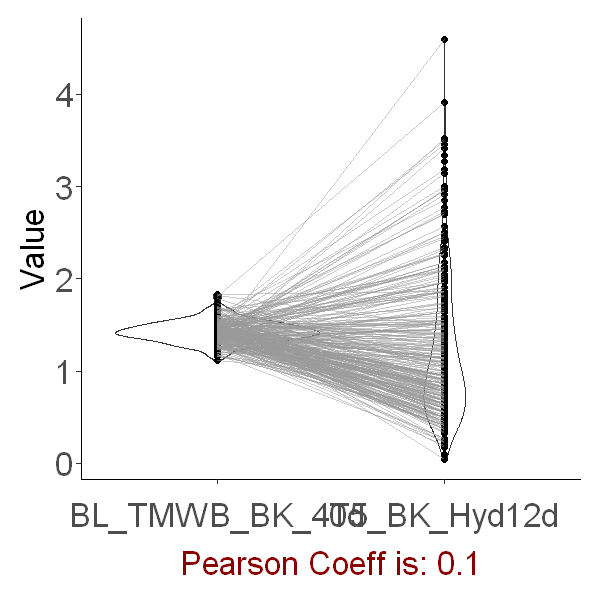

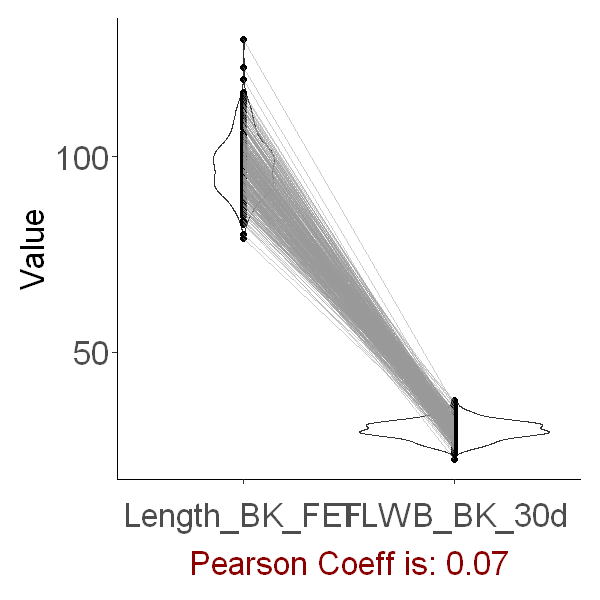

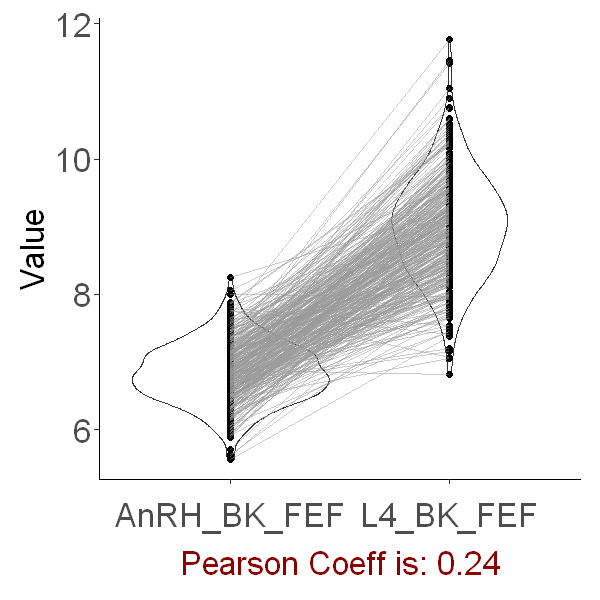

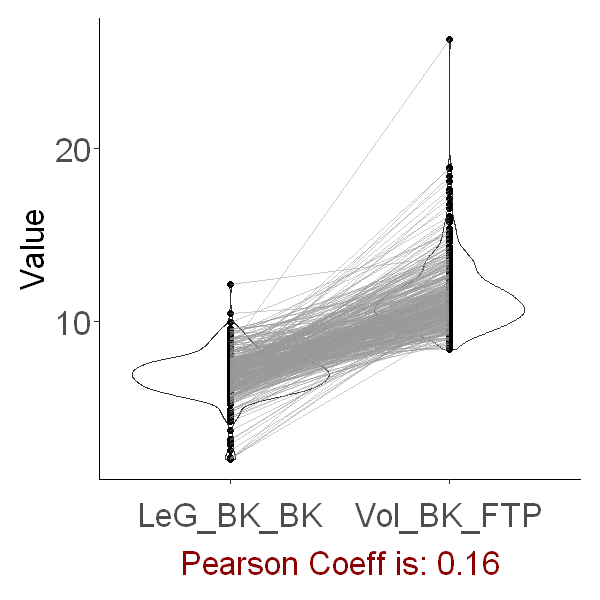

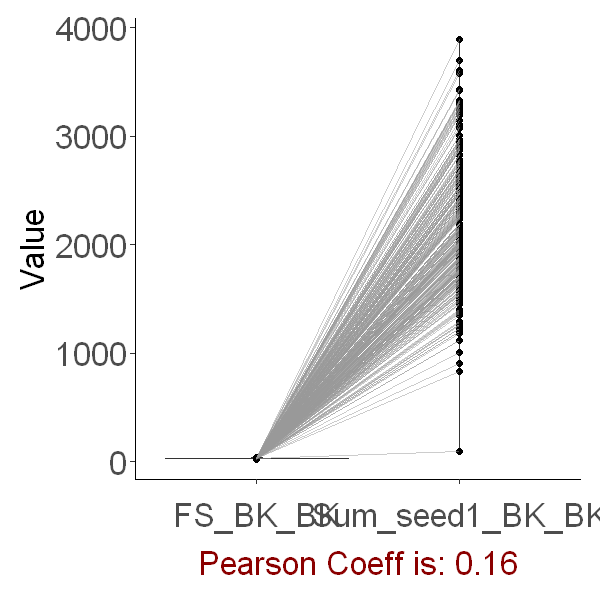

Warning message:
"Removed 2 rows containing non-finite values (stat_ydensity)."
Warning message:
"Removed 2 rows containing missing values (geom_point)."
Warning message:
"Removed 2 row(s) containing missing values (geom_path)."


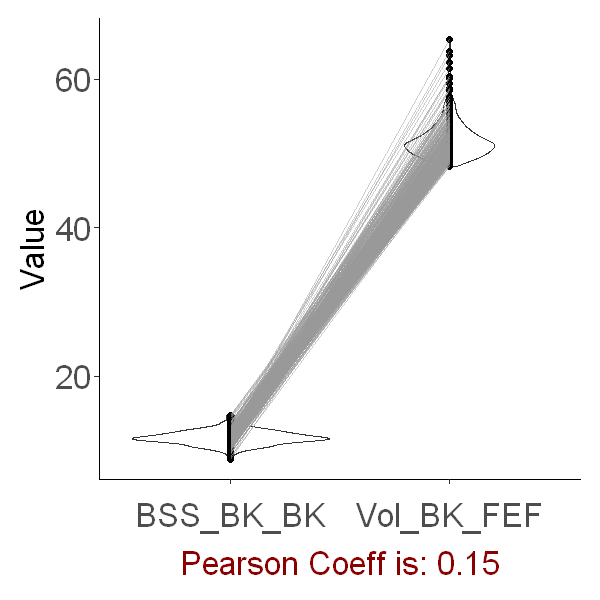

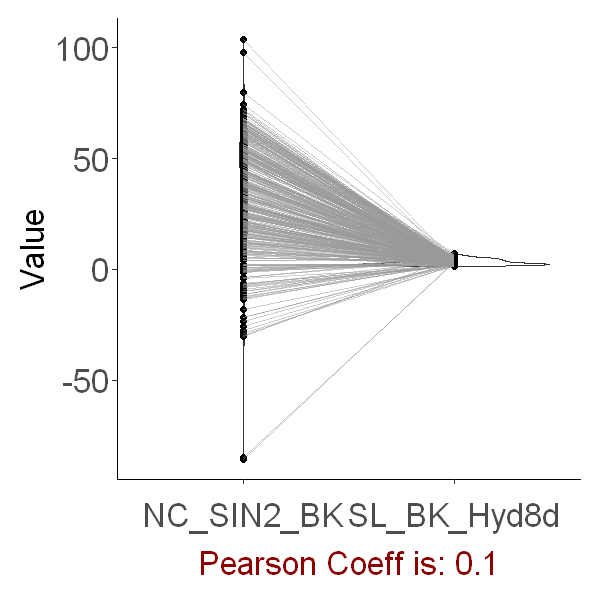

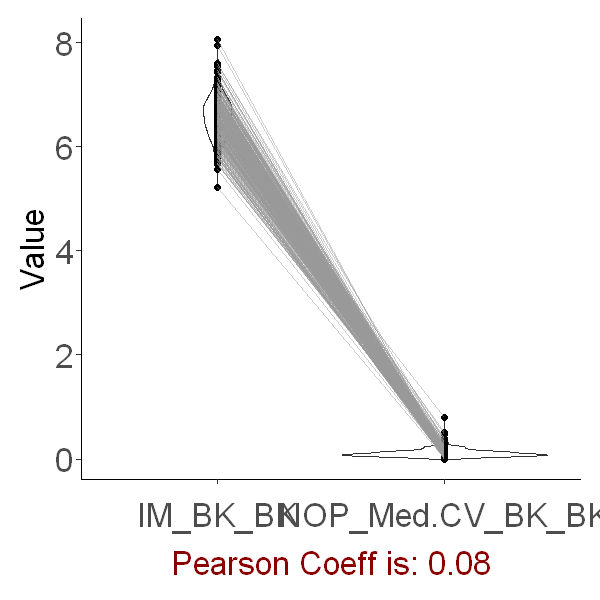

Warning message:
"Removed 2 rows containing non-finite values (stat_ydensity)."
Warning message:
"Removed 2 rows containing missing values (geom_point)."
Warning message:
"Removed 2 row(s) containing missing values (geom_path)."


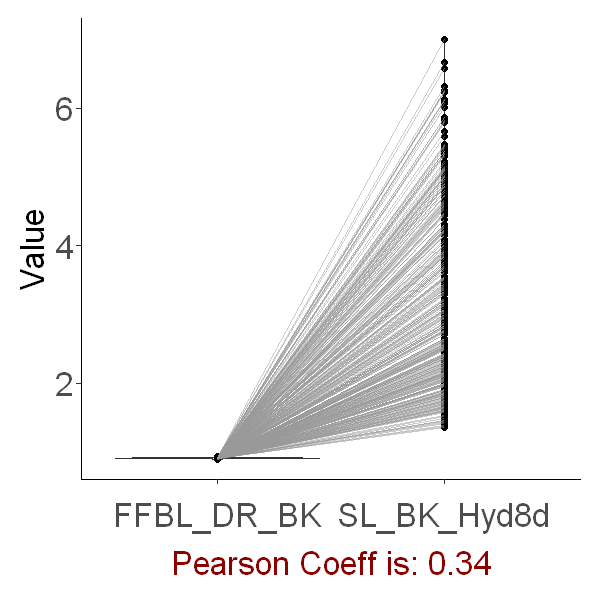

Warning message:
"Removed 2 rows containing non-finite values (stat_ydensity)."
Warning message:
"Removed 2 rows containing missing values (geom_point)."
Warning message:
"Removed 2 row(s) containing missing values (geom_path)."


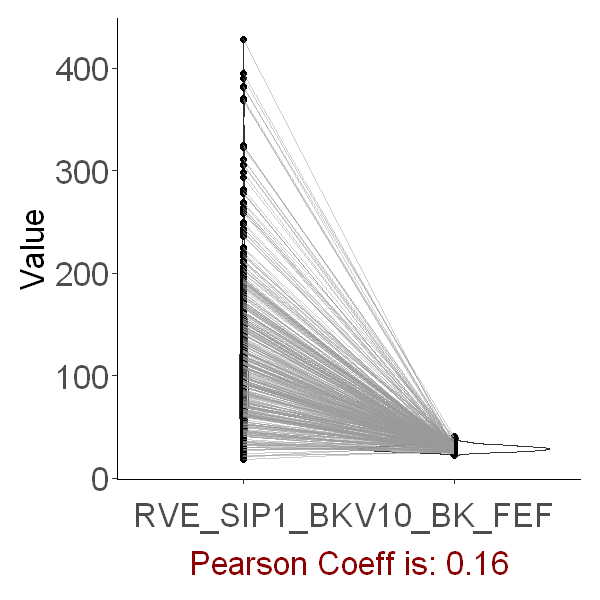

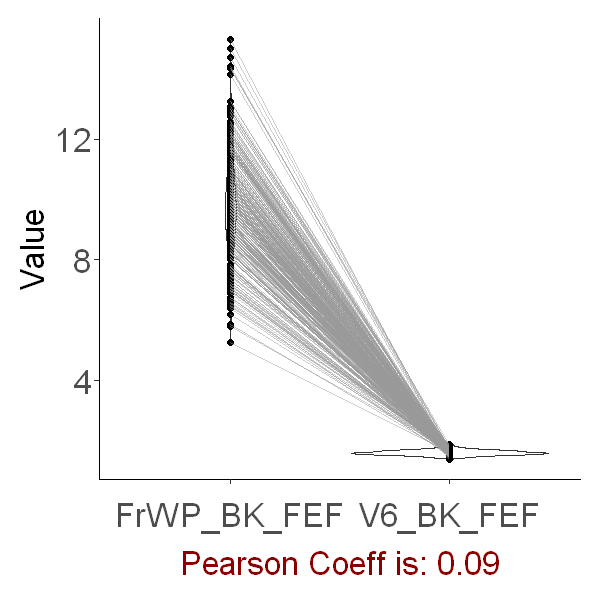

Warning message:
"Removed 3 rows containing non-finite values (stat_ydensity)."
Warning message:
"Removed 3 rows containing missing values (geom_point)."
Warning message:
"Removed 3 row(s) containing missing values (geom_path)."


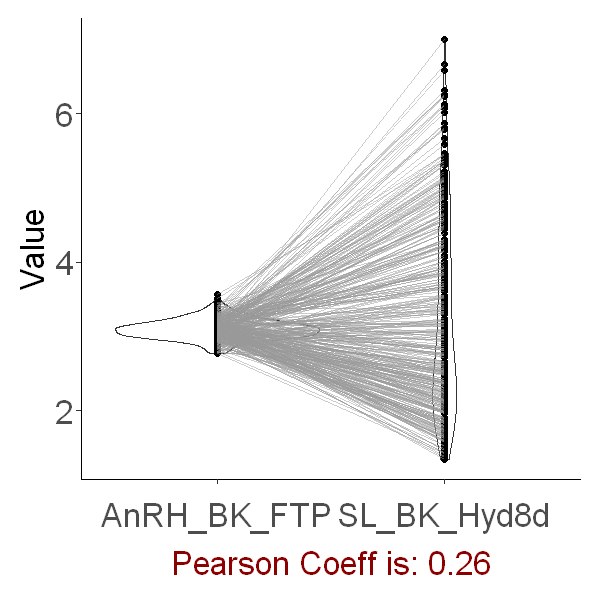

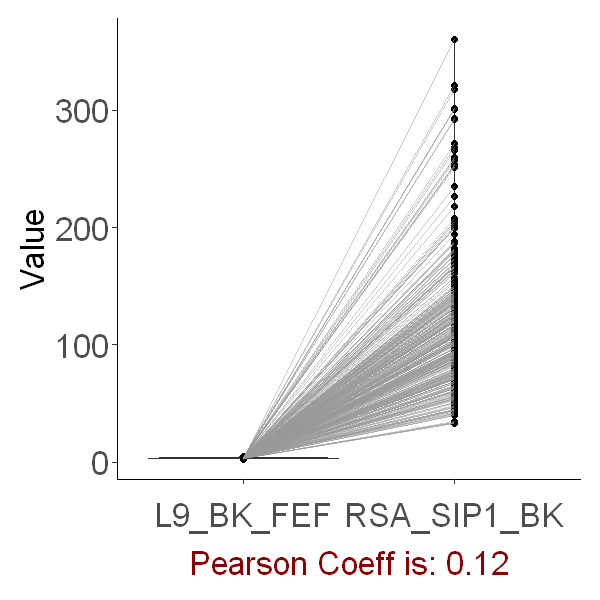

Warning message:
"Removed 43 rows containing non-finite values (stat_ydensity)."
Warning message:
"Removed 43 rows containing missing values (geom_point)."
Warning message:
"Removed 43 row(s) containing missing values (geom_path)."


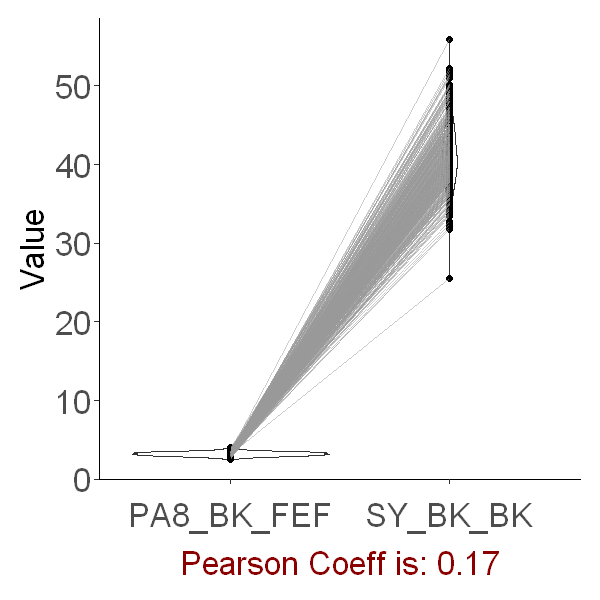

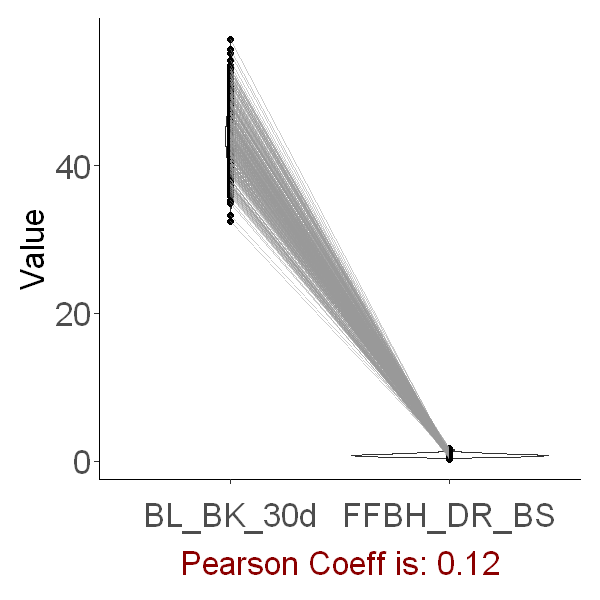

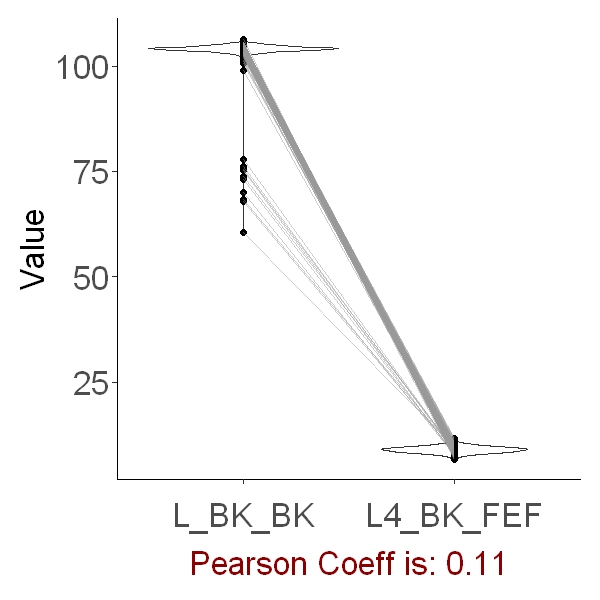

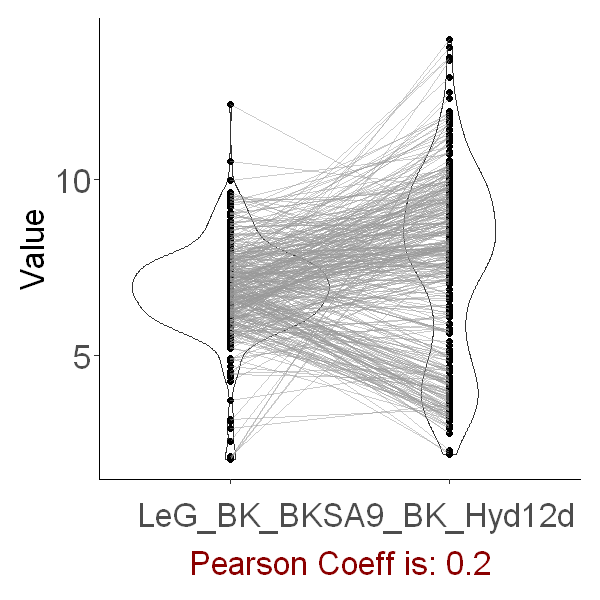

Warning message:
"Removed 1 rows containing non-finite values (stat_ydensity)."
Warning message:
"Removed 1 rows containing missing values (geom_point)."
Warning message:
"Removed 1 row(s) containing missing values (geom_path)."


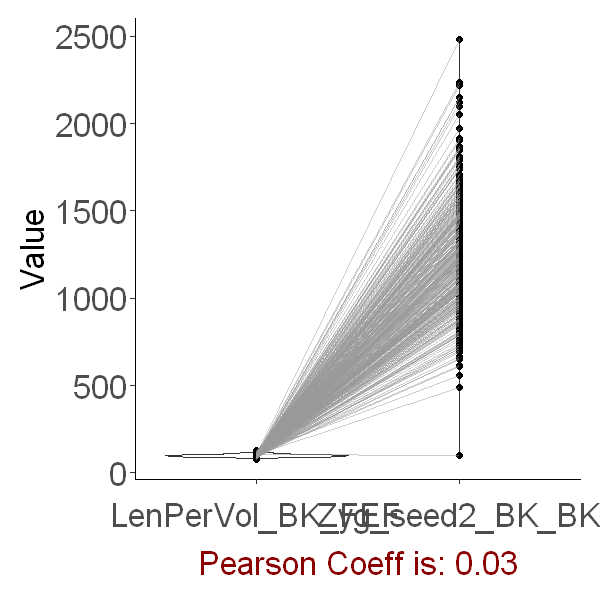

Warning message:
"Removed 2 rows containing non-finite values (stat_ydensity)."
Warning message:
"Removed 2 rows containing missing values (geom_point)."
Warning message:
"Removed 2 row(s) containing missing values (geom_path)."


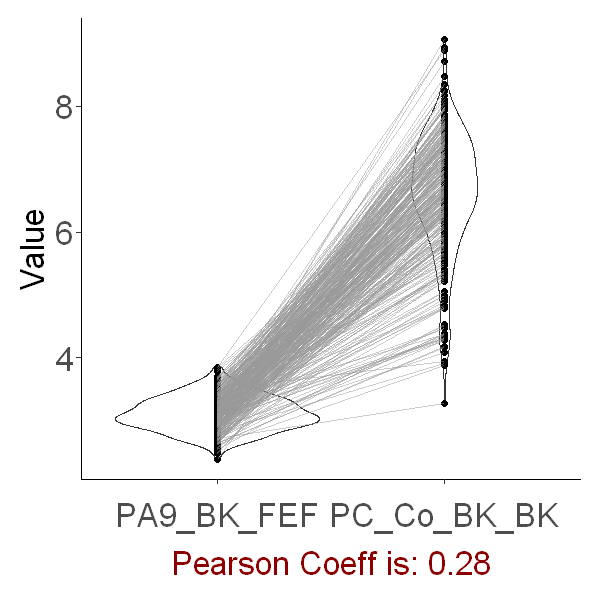

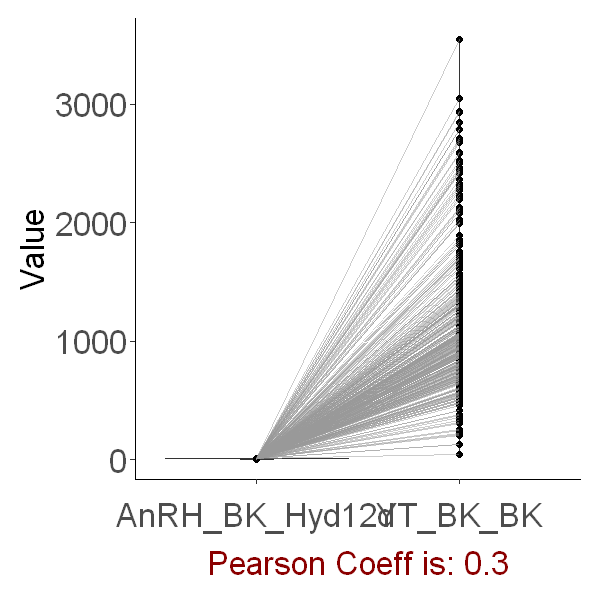

Warning message:
"Removed 43 rows containing non-finite values (stat_ydensity)."
Warning message:
"Removed 43 rows containing missing values (geom_point)."
Warning message:
"Removed 43 row(s) containing missing values (geom_path)."


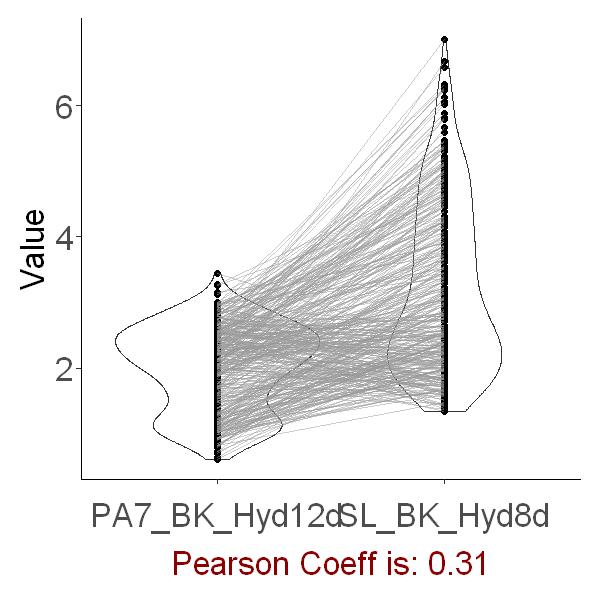

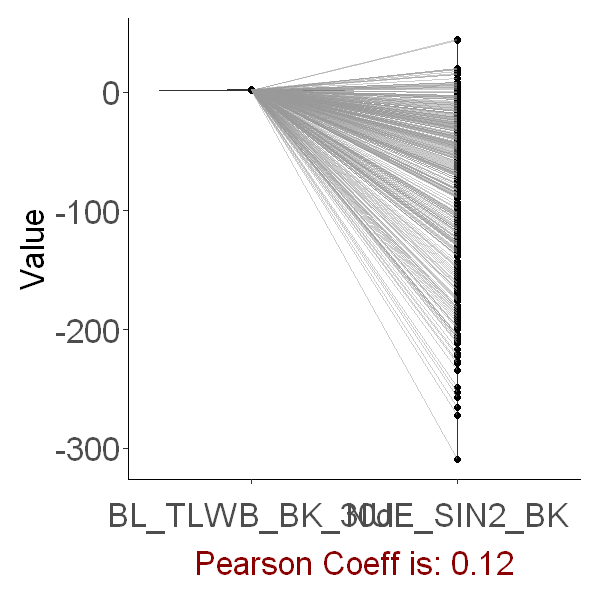

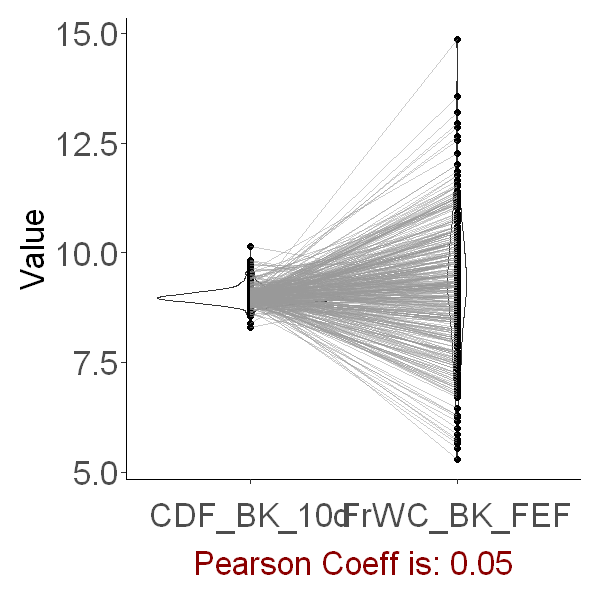

Warning message:
"Removed 66 rows containing non-finite values (stat_ydensity)."
Warning message:
"Removed 66 rows containing missing values (geom_point)."
Warning message:
"Removed 66 row(s) containing missing values (geom_path)."


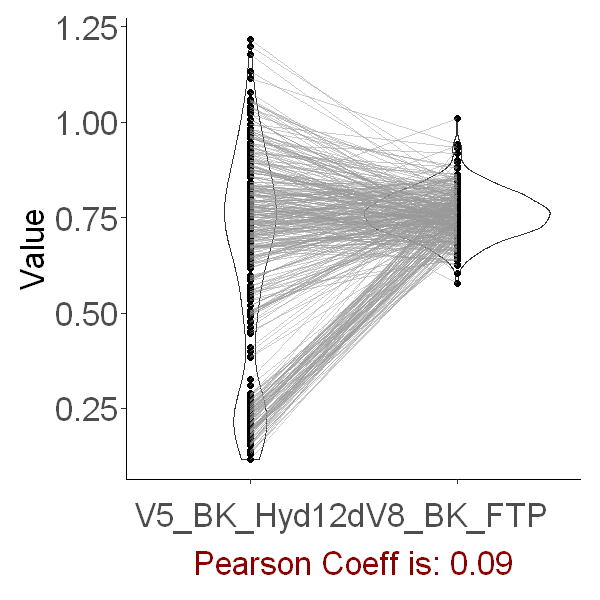

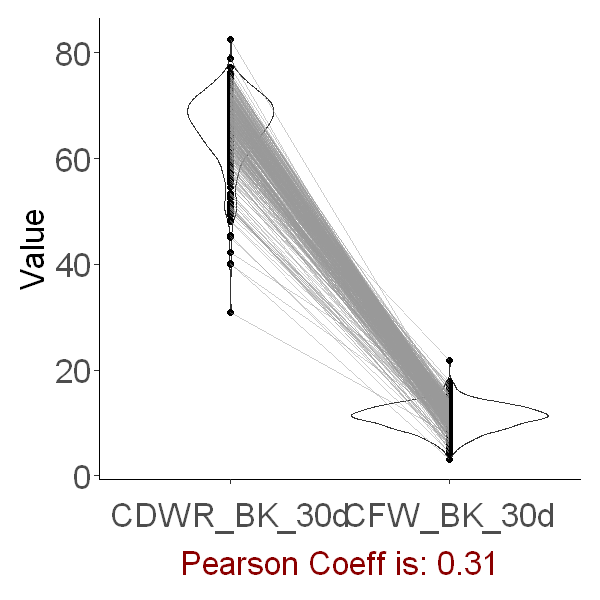

Warning message:
"Removed 38 rows containing non-finite values (stat_ydensity)."
Warning message:
"Removed 38 rows containing missing values (geom_point)."
Warning message:
"Removed 38 row(s) containing missing values (geom_path)."


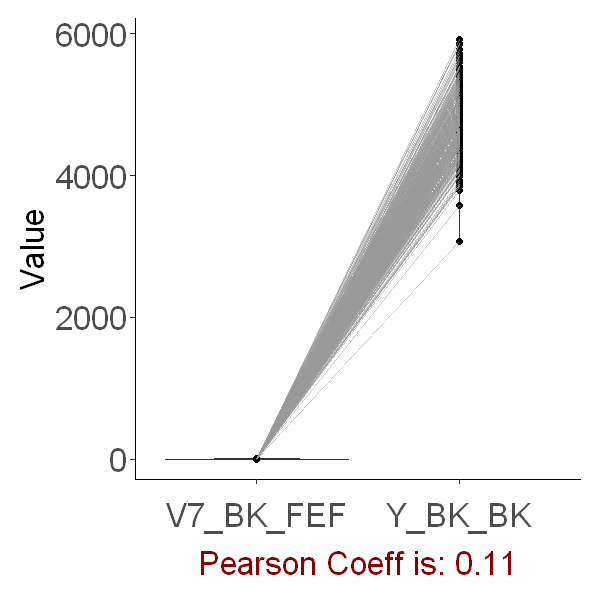

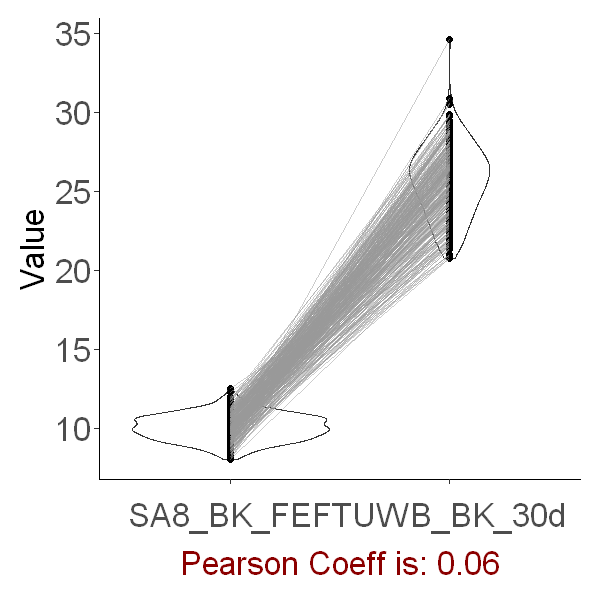

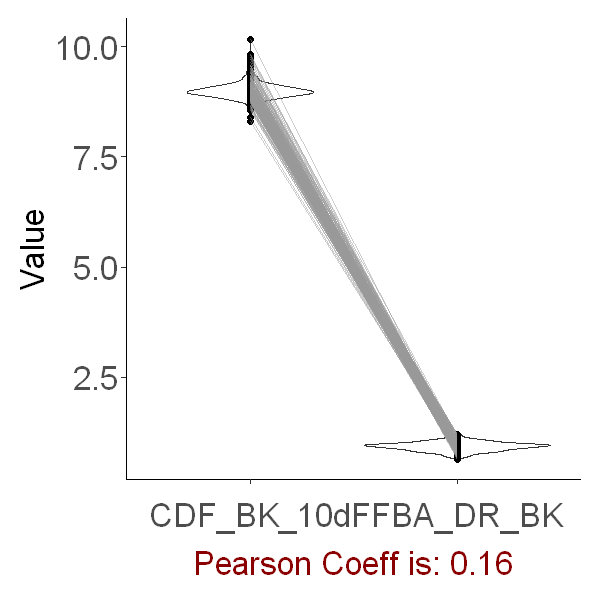

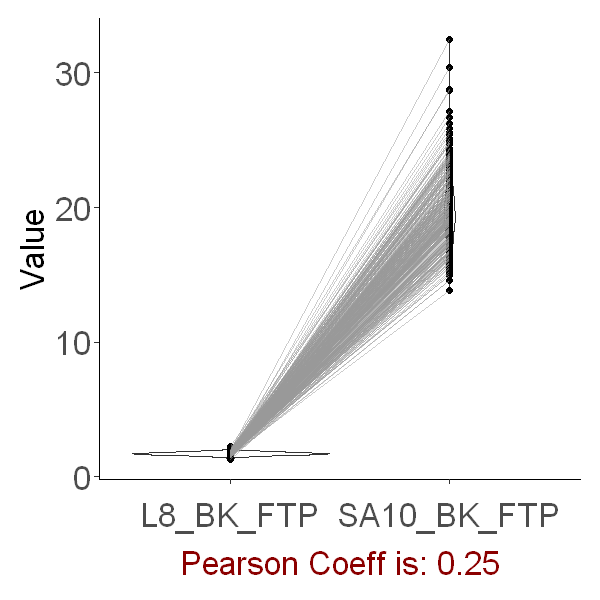

Warning message:
"Removed 33 rows containing non-finite values (stat_ydensity)."
Warning message:
"Removed 33 rows containing missing values (geom_point)."
Warning message:
"Removed 33 row(s) containing missing values (geom_path)."


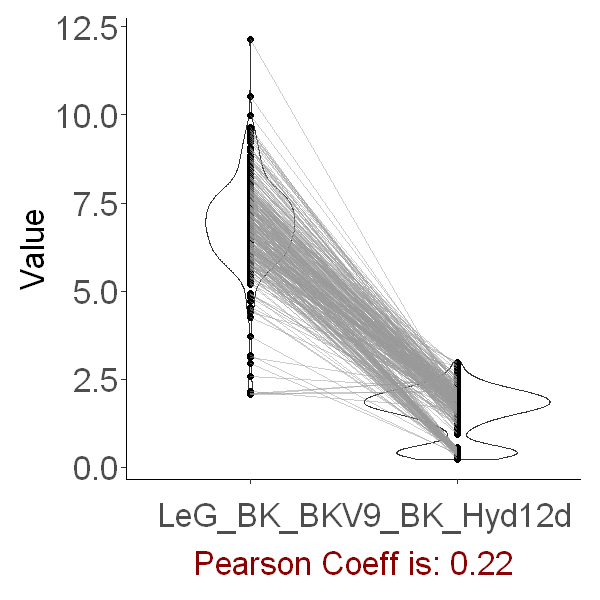

Warning message:
"Removed 68 rows containing non-finite values (stat_ydensity)."
Warning message:
"Removed 68 rows containing missing values (geom_point)."
Warning message:
"Removed 68 row(s) containing missing values (geom_path)."


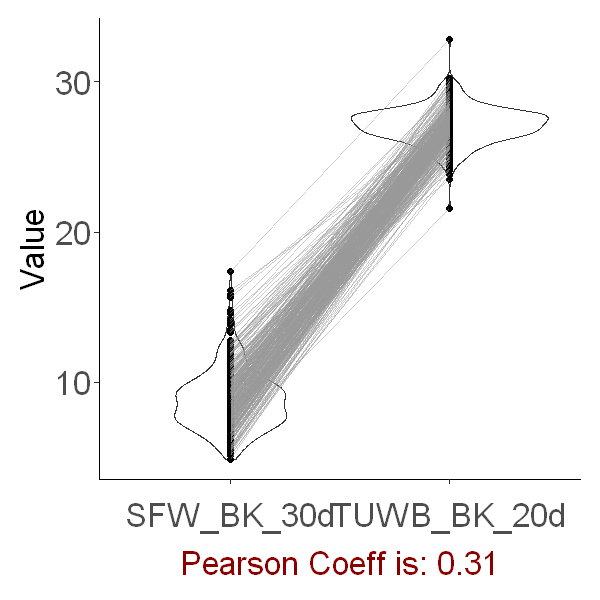

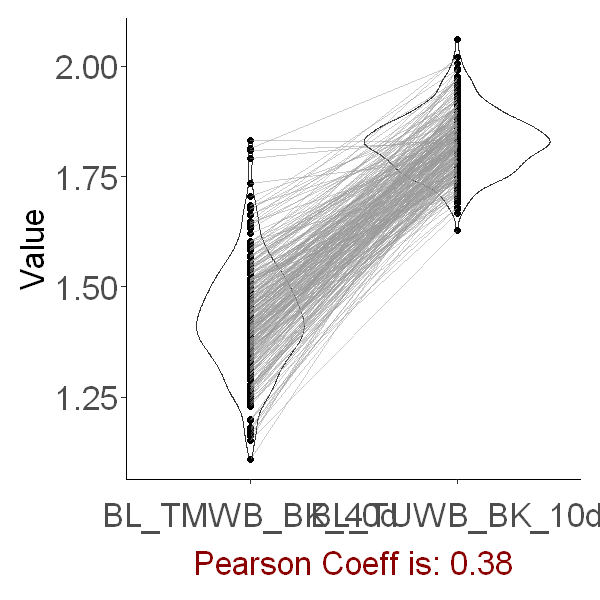

Warning message:
"Removed 8 rows containing non-finite values (stat_ydensity)."
Warning message:
"Removed 8 rows containing missing values (geom_point)."
Warning message:
"Removed 8 row(s) containing missing values (geom_path)."


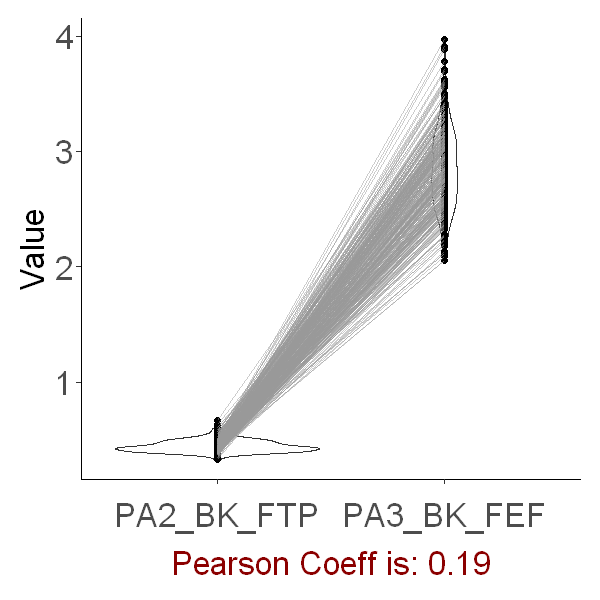

Warning message:
"Removed 1 rows containing non-finite values (stat_ydensity)."
Warning message:
"Removed 1 rows containing missing values (geom_point)."
Warning message:
"Removed 1 row(s) containing missing values (geom_path)."


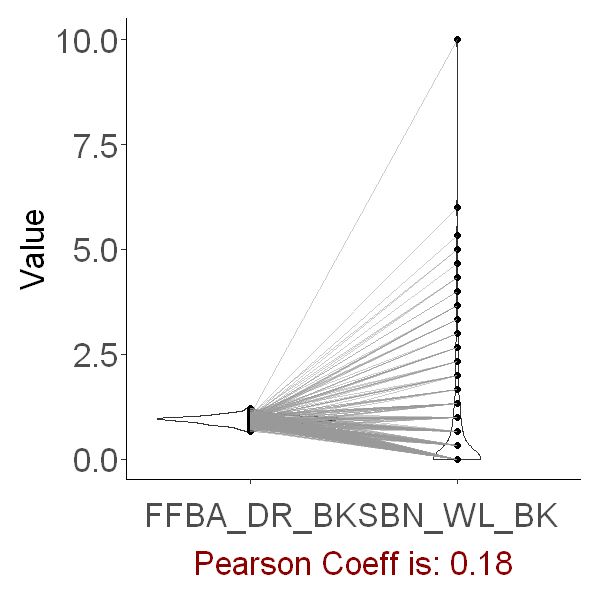

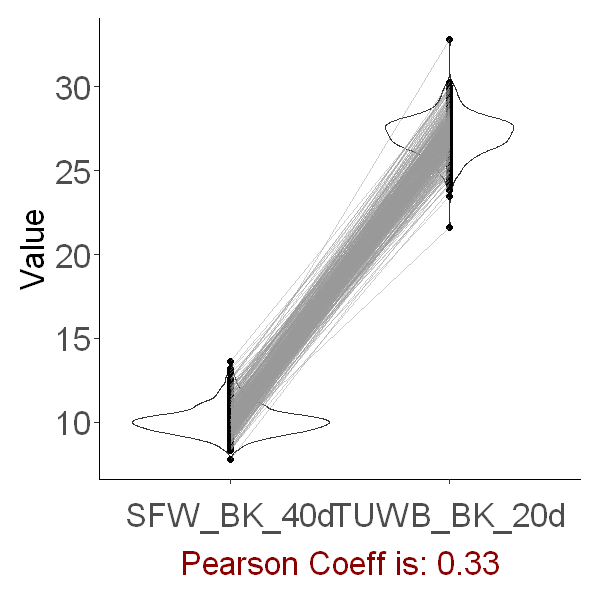

Warning message:
"Removed 1 rows containing non-finite values (stat_ydensity)."
Warning message:
"Removed 1 rows containing missing values (geom_point)."
Warning message:
"Removed 1 row(s) containing missing values (geom_path)."


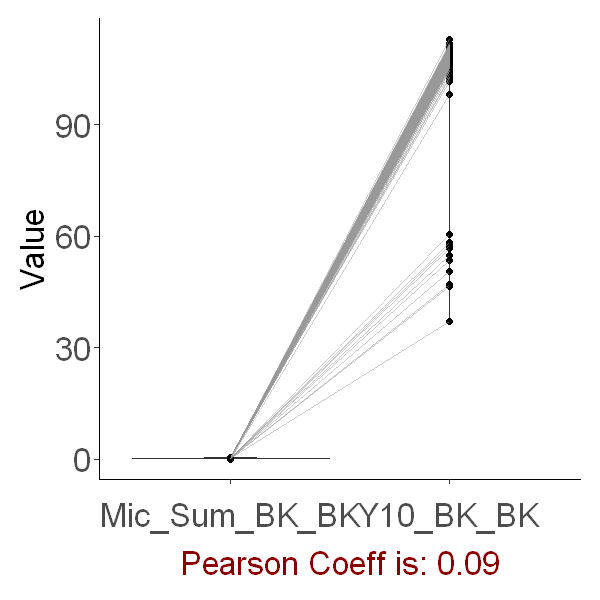

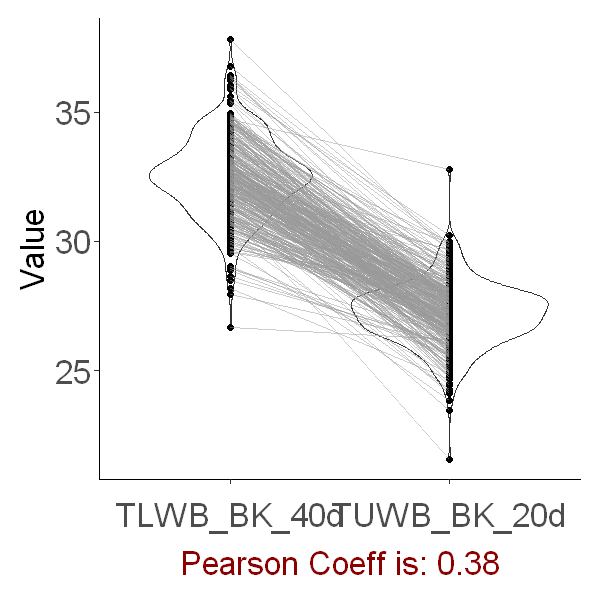

Warning message:
"Removed 1 rows containing non-finite values (stat_ydensity)."
Warning message:
"Removed 1 rows containing missing values (geom_point)."
Warning message:
"Removed 1 row(s) containing missing values (geom_path)."


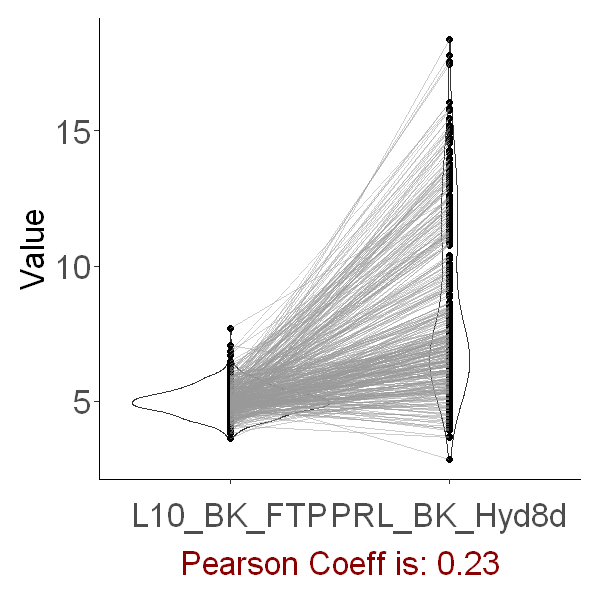

Warning message:
"Removed 2 rows containing non-finite values (stat_ydensity)."
Warning message:
"Removed 2 rows containing missing values (geom_point)."
Warning message:
"Removed 2 row(s) containing missing values (geom_path)."


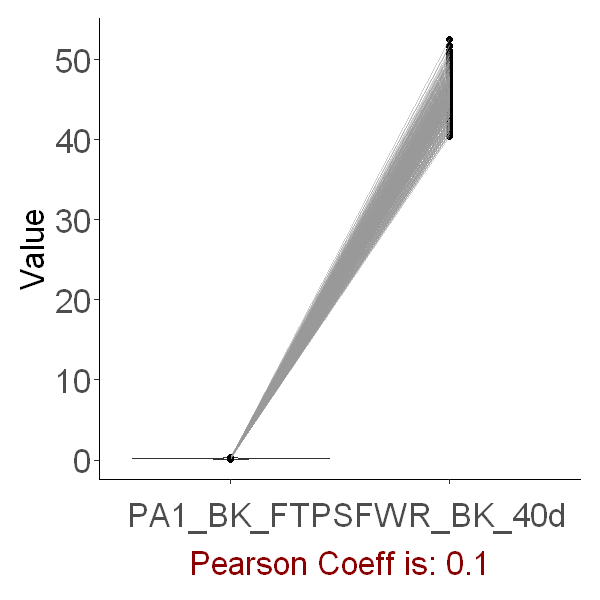

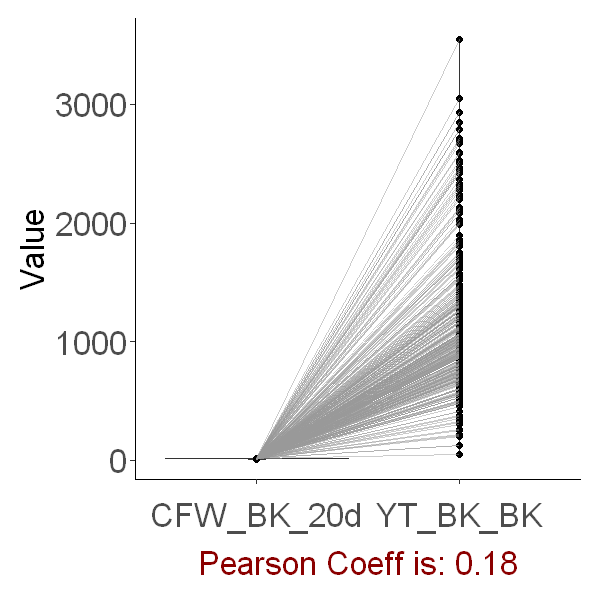

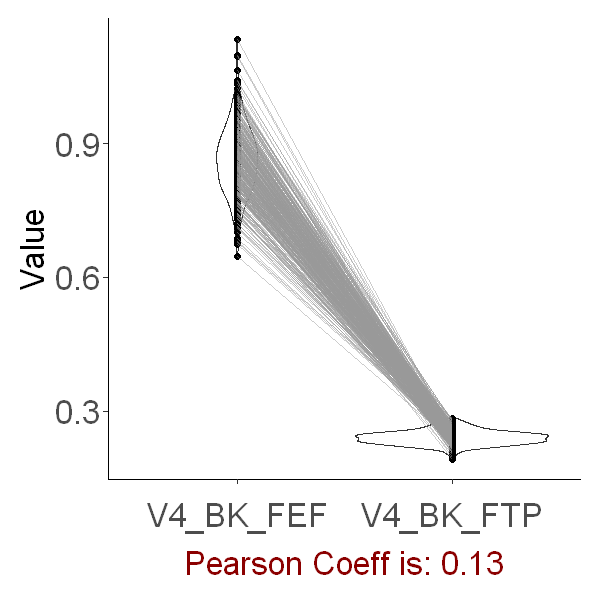

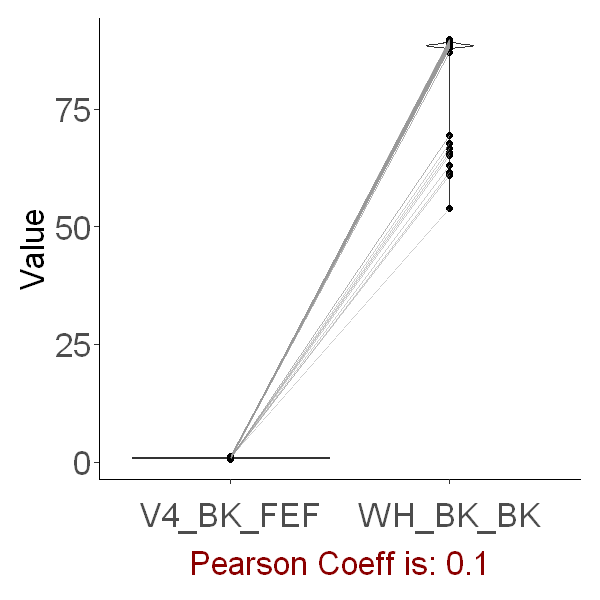

Warning message:
"Removed 33 rows containing non-finite values (stat_ydensity)."
Warning message:
"Removed 33 rows containing missing values (geom_point)."
Warning message:
"Removed 33 row(s) containing missing values (geom_path)."


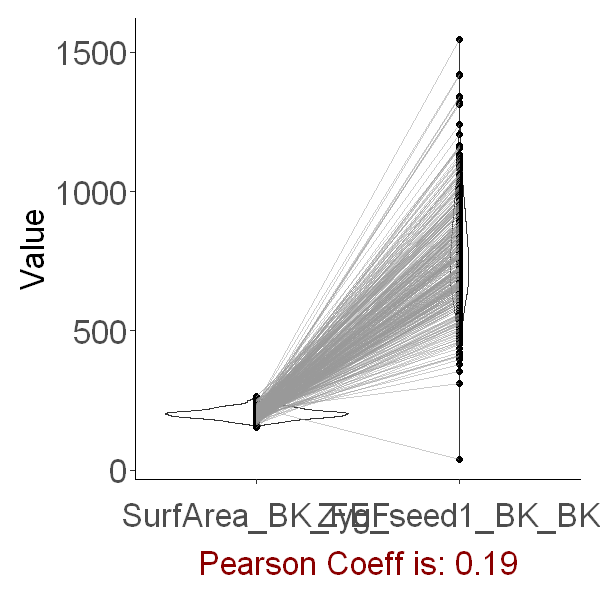

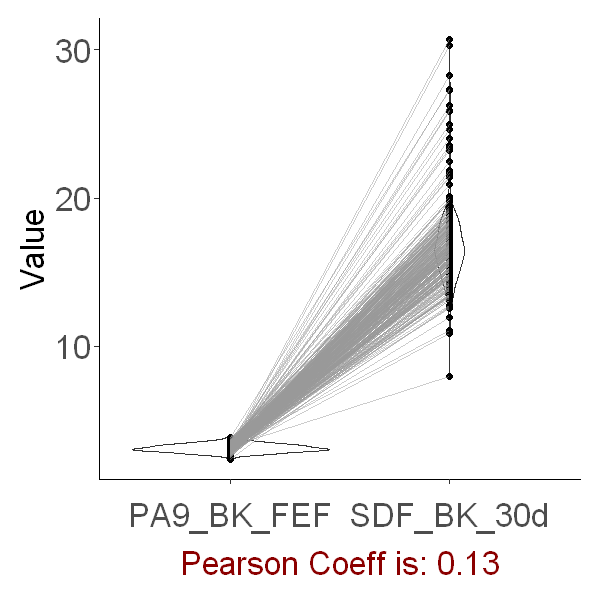

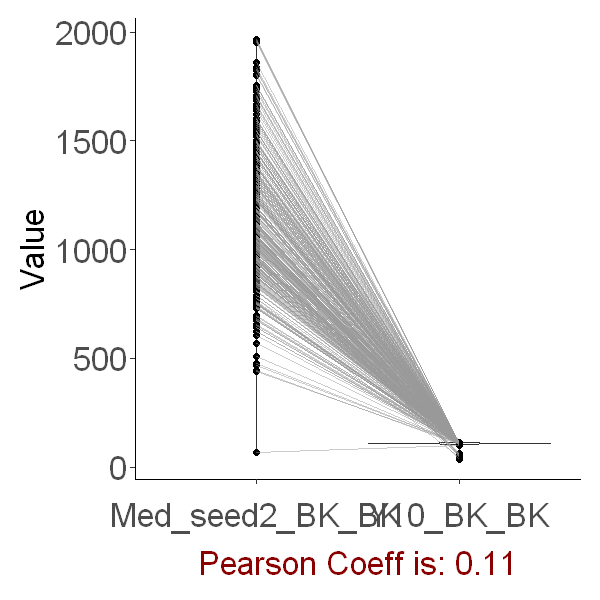

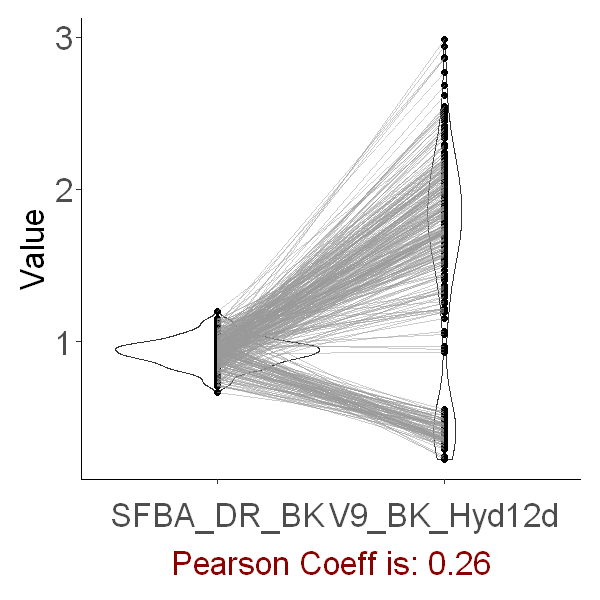

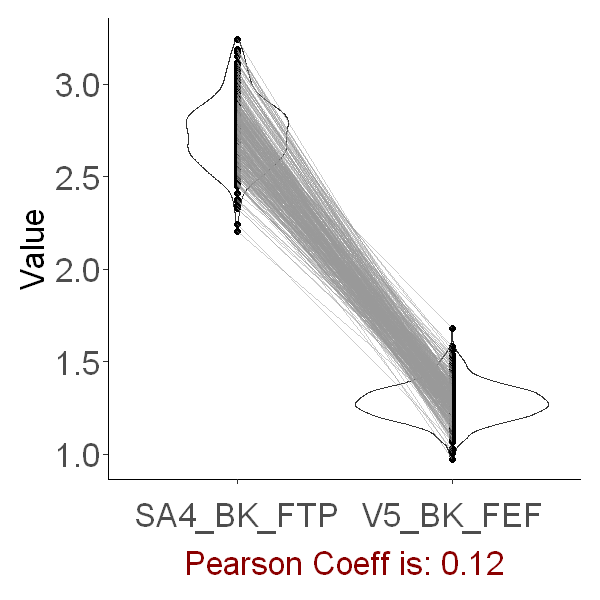

Warning message:
"Removed 2 rows containing non-finite values (stat_ydensity)."
Warning message:
"Removed 2 rows containing missing values (geom_point)."
Warning message:
"Removed 2 row(s) containing missing values (geom_path)."


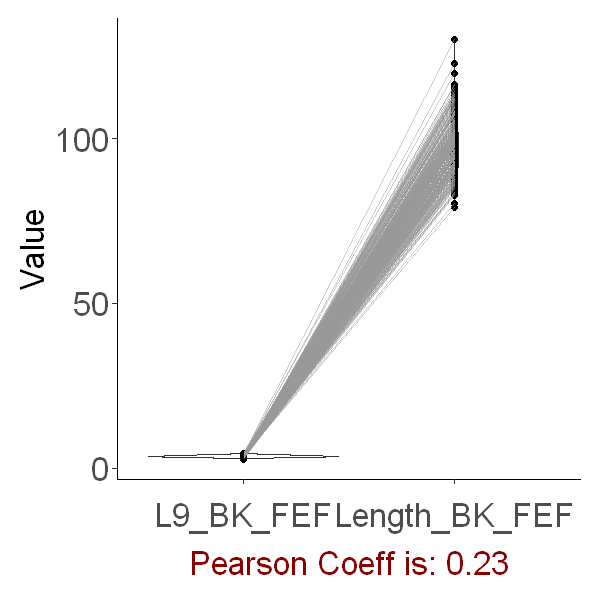

Warning message:
"Removed 5 rows containing non-finite values (stat_ydensity)."
Warning message:
"Removed 5 rows containing missing values (geom_point)."
Warning message:
"Removed 5 row(s) containing missing values (geom_path)."


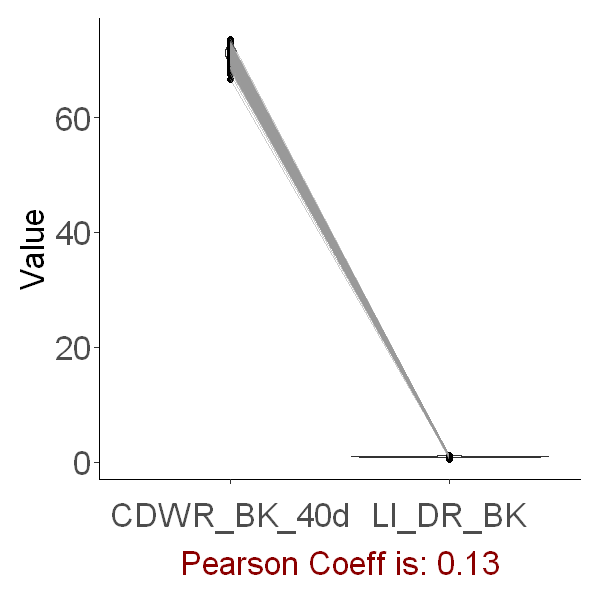

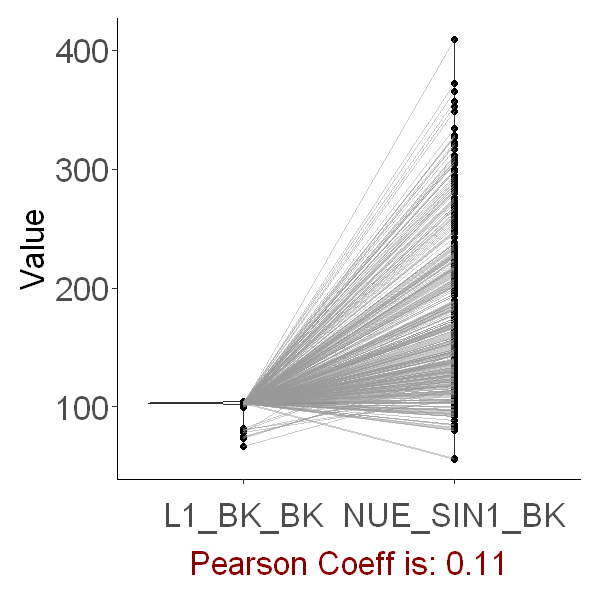

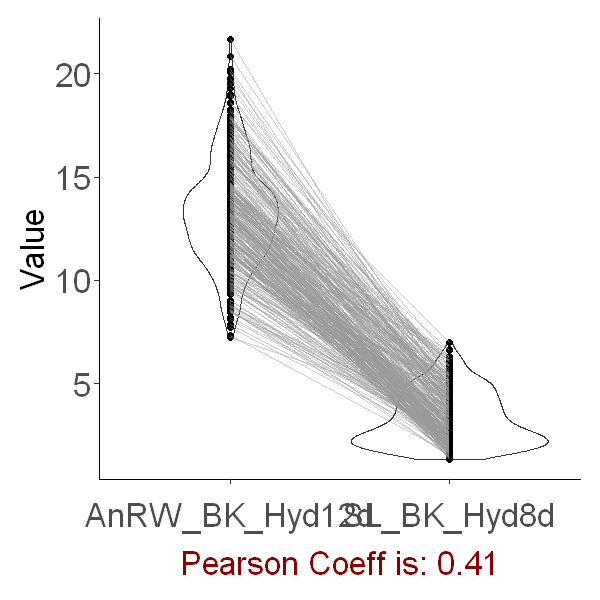

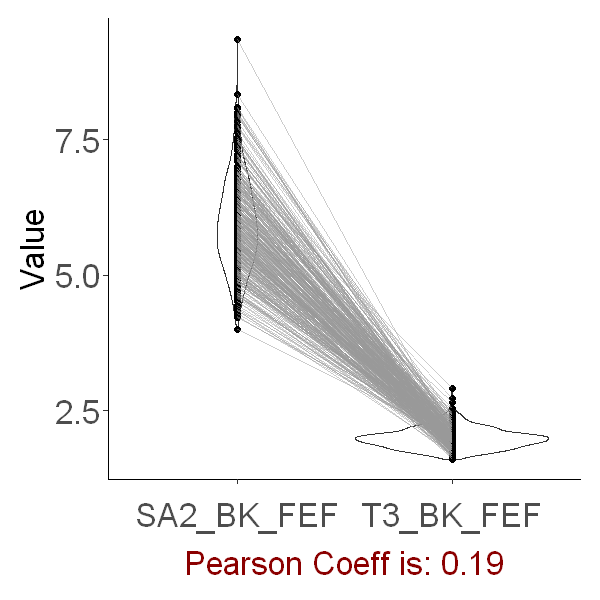

Warning message:
"Removed 21 rows containing non-finite values (stat_ydensity)."
Warning message:
"Removed 21 rows containing missing values (geom_point)."
Warning message:
"Removed 21 row(s) containing missing values (geom_path)."


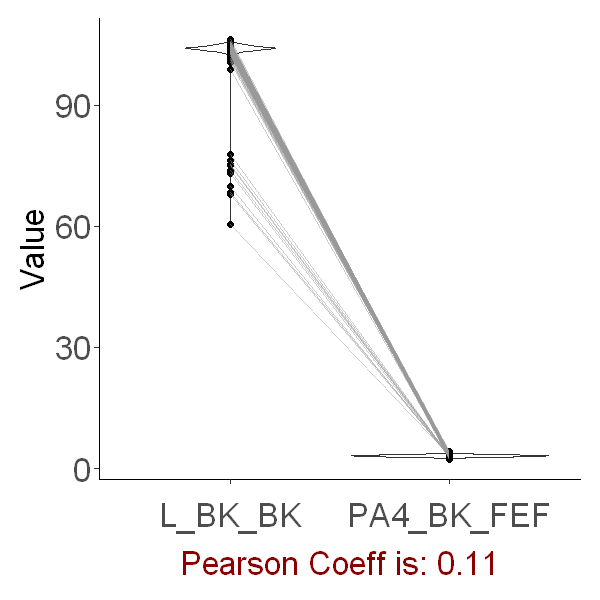

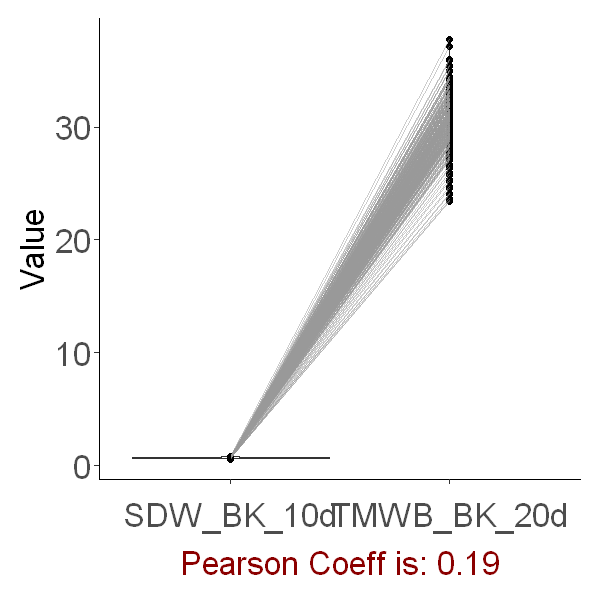

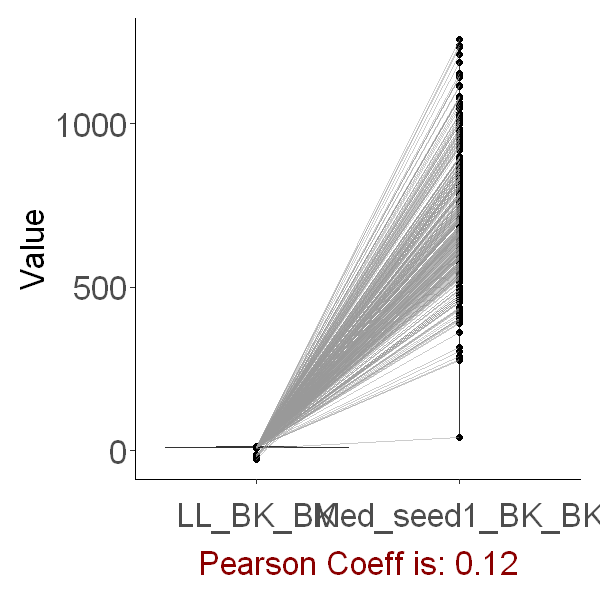

Warning message:
"Removed 2 rows containing non-finite values (stat_ydensity)."
Warning message:
"Removed 2 rows containing missing values (geom_point)."
Warning message:
"Removed 2 row(s) containing missing values (geom_path)."


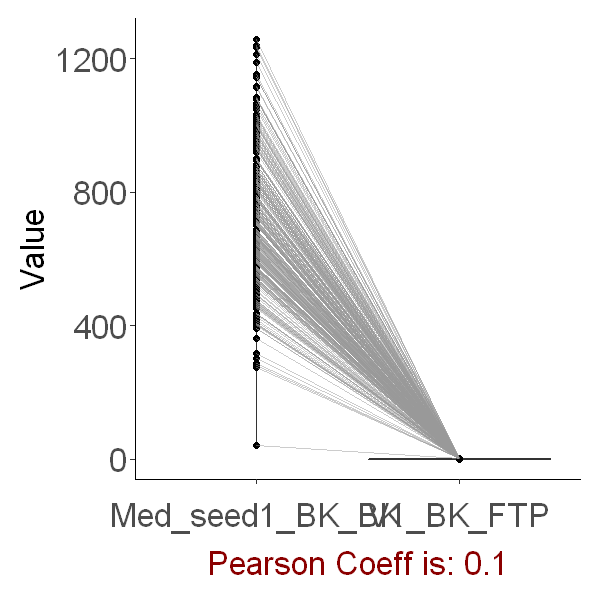

Warning message:
"Removed 38 rows containing non-finite values (stat_ydensity)."
Warning message:
"Removed 38 rows containing missing values (geom_point)."
Warning message:
"Removed 38 row(s) containing missing values (geom_path)."


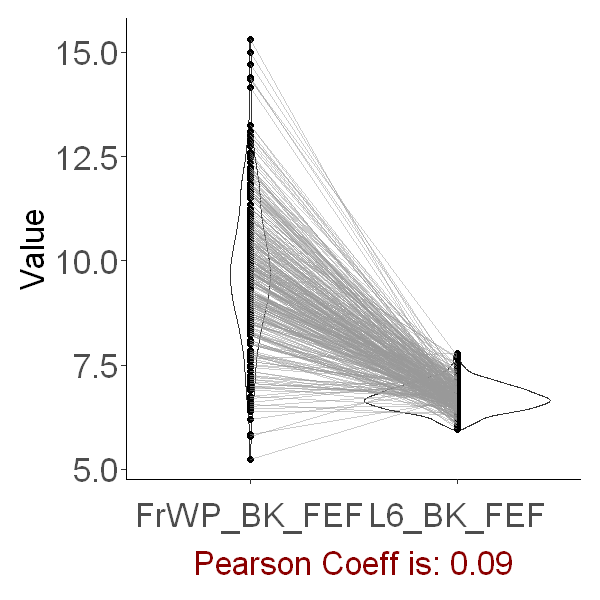

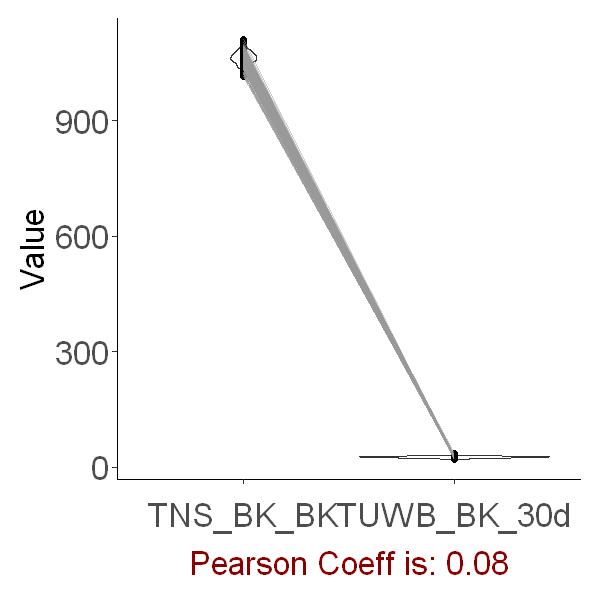

Warning message:
"Removed 12 rows containing non-finite values (stat_ydensity)."
Warning message:
"Removed 12 rows containing missing values (geom_point)."
Warning message:
"Removed 12 row(s) containing missing values (geom_path)."


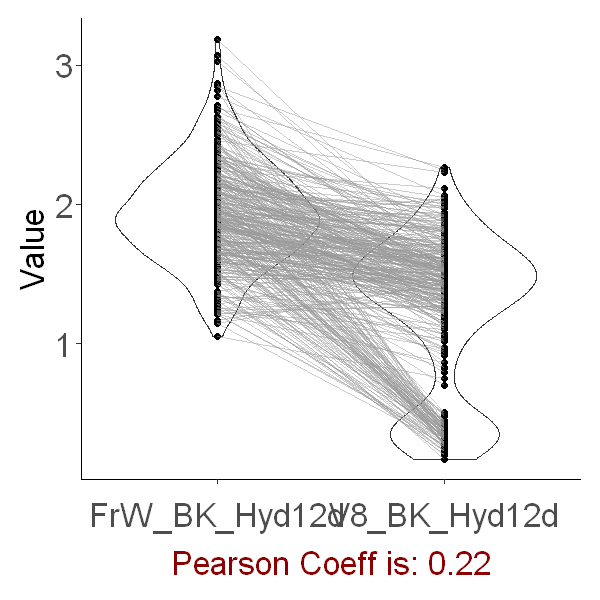

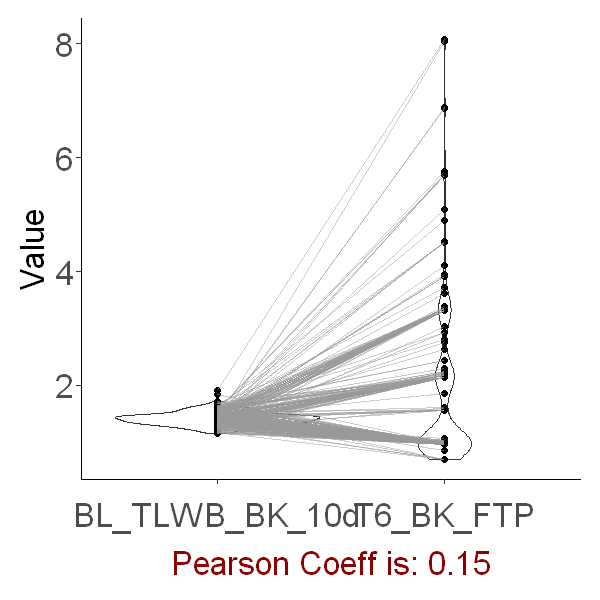

Warning message:
"Removed 6 rows containing non-finite values (stat_ydensity)."
Warning message:
"Removed 6 rows containing missing values (geom_point)."
Warning message:
"Removed 6 row(s) containing missing values (geom_path)."


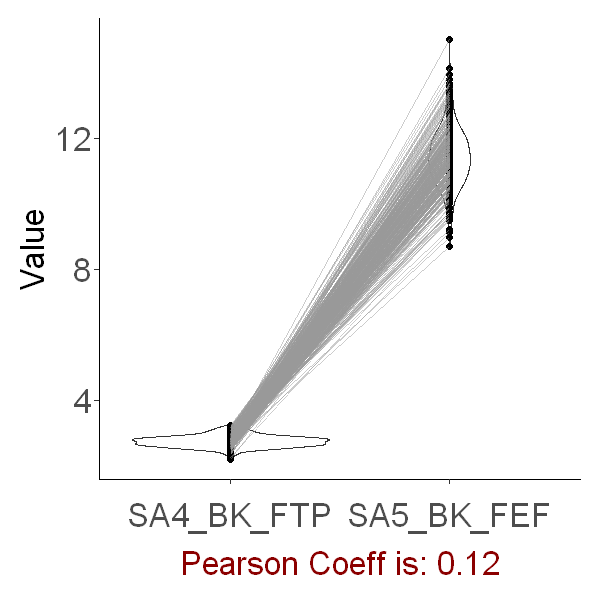

Warning message:
"Removed 33 rows containing non-finite values (stat_ydensity)."
Warning message:
"Removed 33 rows containing missing values (geom_point)."
Warning message:
"Removed 33 row(s) containing missing values (geom_path)."


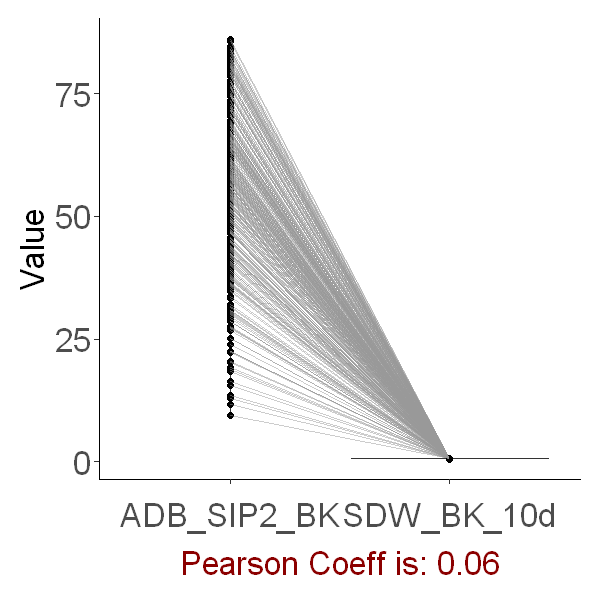

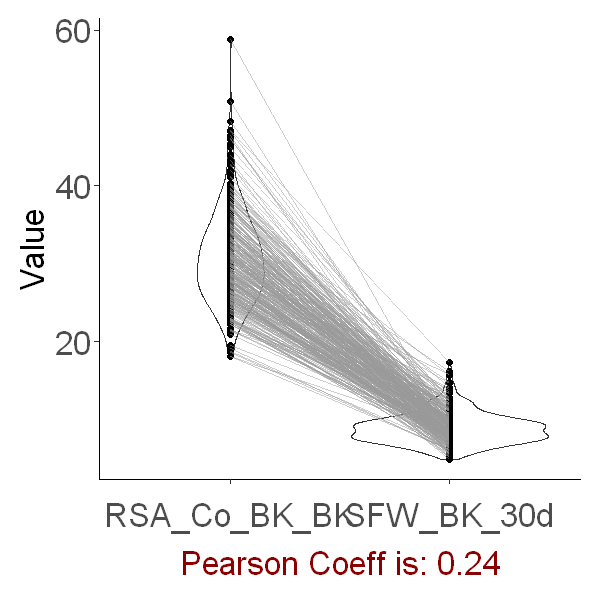

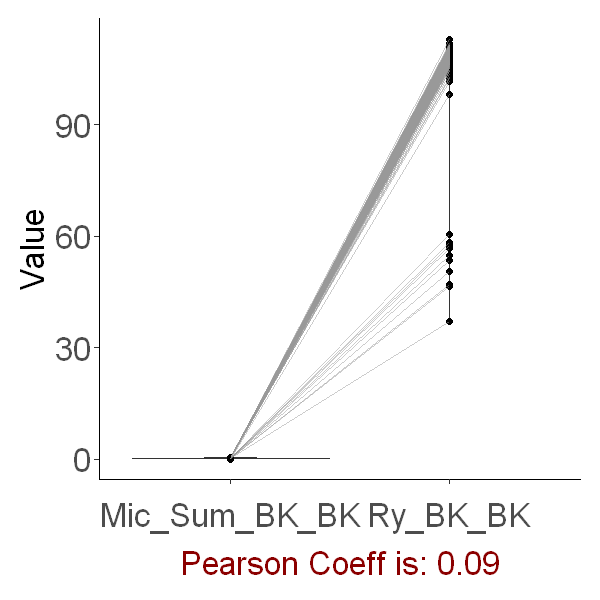

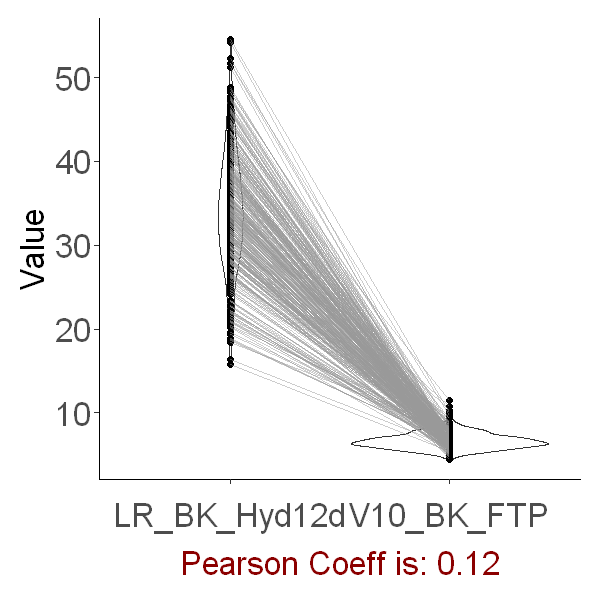

Warning message:
"Removed 1 rows containing non-finite values (stat_ydensity)."
Warning message:
"Removed 1 rows containing missing values (geom_point)."
Warning message:
"Removed 1 row(s) containing missing values (geom_path)."


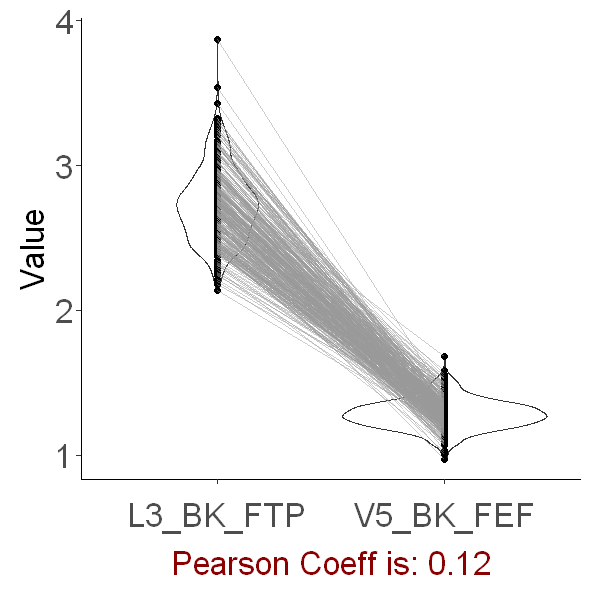

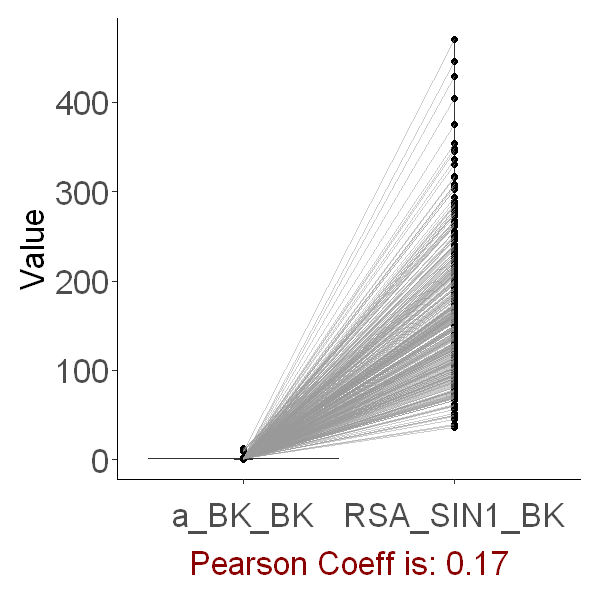

Warning message:
"Removed 14 rows containing non-finite values (stat_ydensity)."
Warning message:
"Removed 14 rows containing missing values (geom_point)."
Warning message:
"Removed 14 row(s) containing missing values (geom_path)."


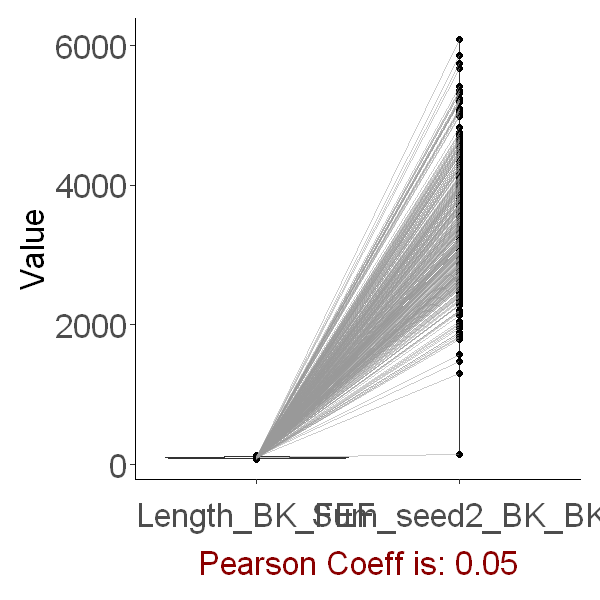

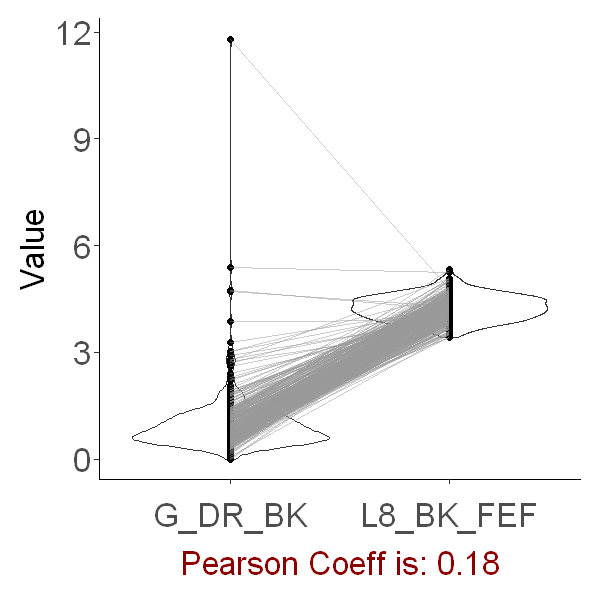

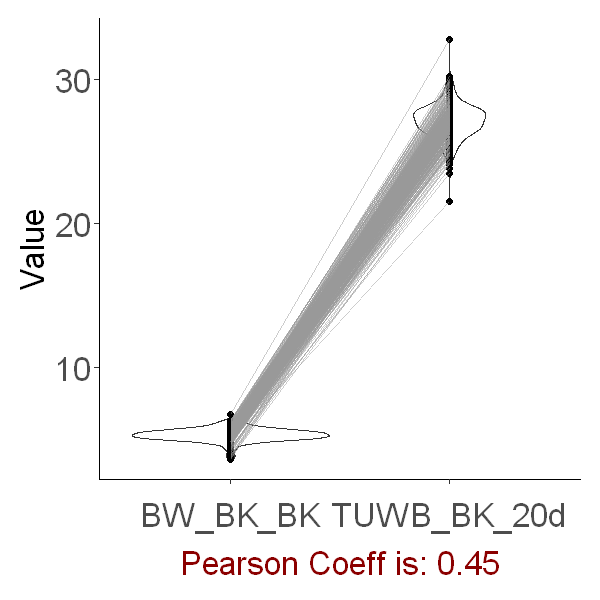

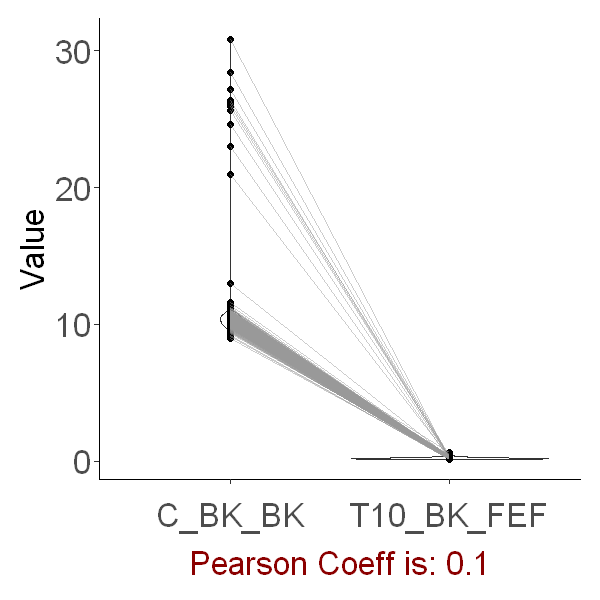

Warning message:
"Removed 55 rows containing non-finite values (stat_ydensity)."
Warning message:
"Removed 55 rows containing missing values (geom_point)."
Warning message:
"Removed 55 row(s) containing missing values (geom_path)."


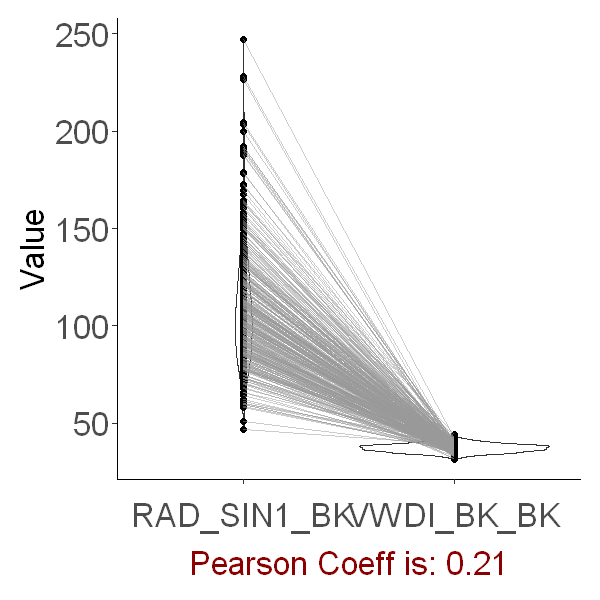

Warning message:
"Removed 40 rows containing non-finite values (stat_ydensity)."
Warning message:
"Removed 40 rows containing missing values (geom_point)."
Warning message:
"Removed 40 row(s) containing missing values (geom_path)."


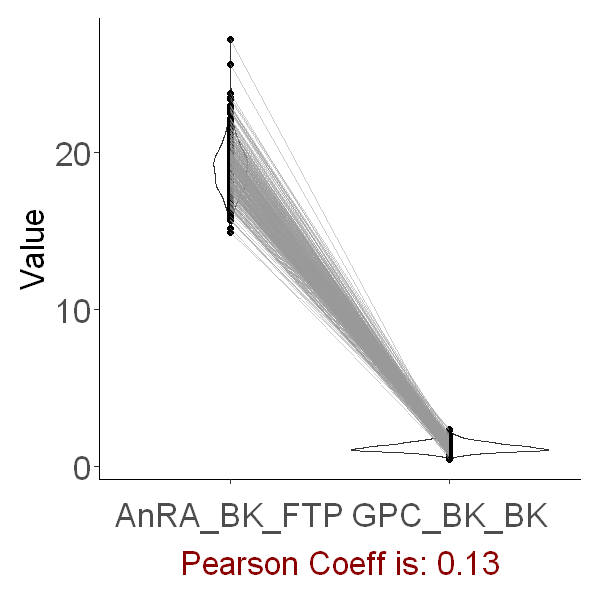

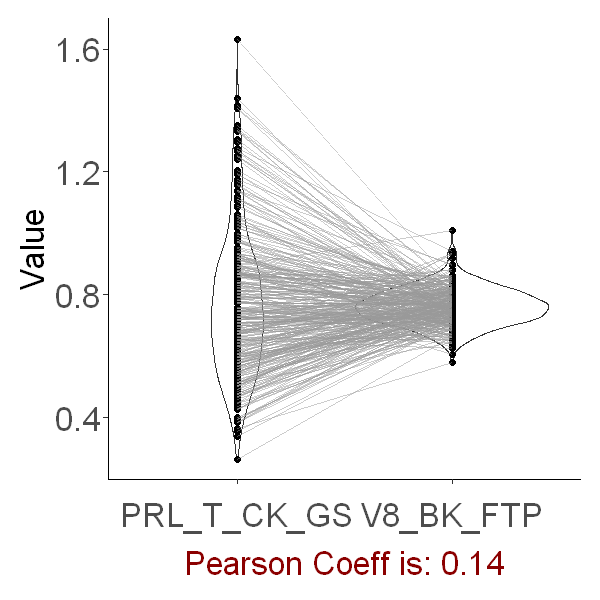

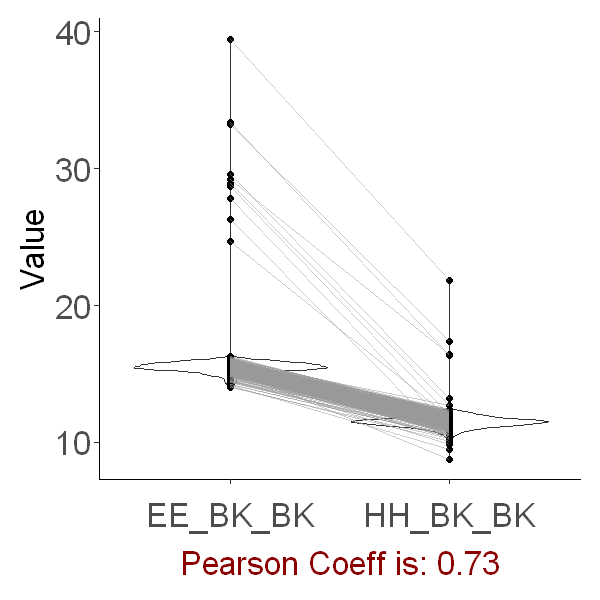

Warning message:
"Removed 34 rows containing non-finite values (stat_ydensity)."
Warning message:
"Removed 34 rows containing missing values (geom_point)."
Warning message:
"Removed 34 row(s) containing missing values (geom_path)."


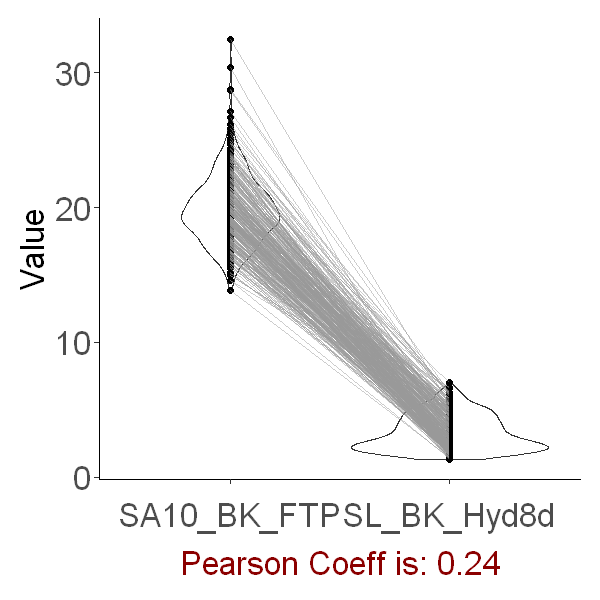

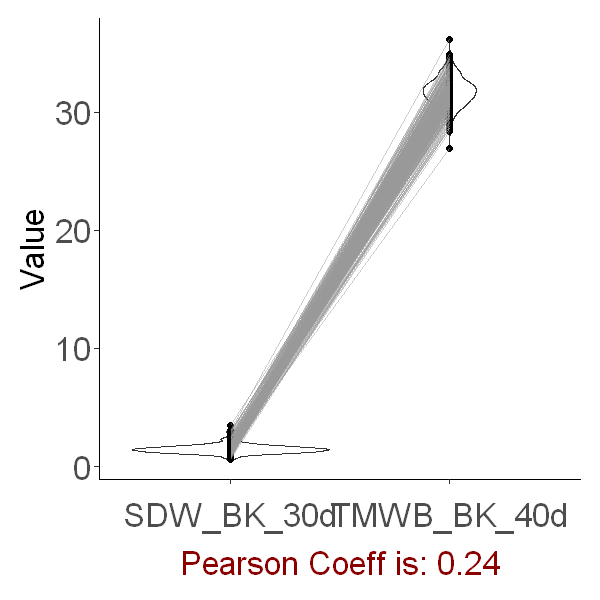

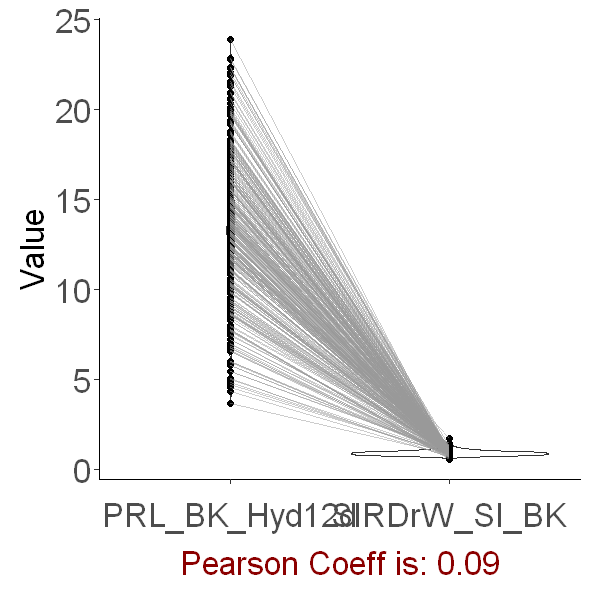

Warning message:
"Removed 1 rows containing non-finite values (stat_ydensity)."
Warning message:
"Removed 1 rows containing missing values (geom_point)."
Warning message:
"Removed 1 row(s) containing missing values (geom_path)."


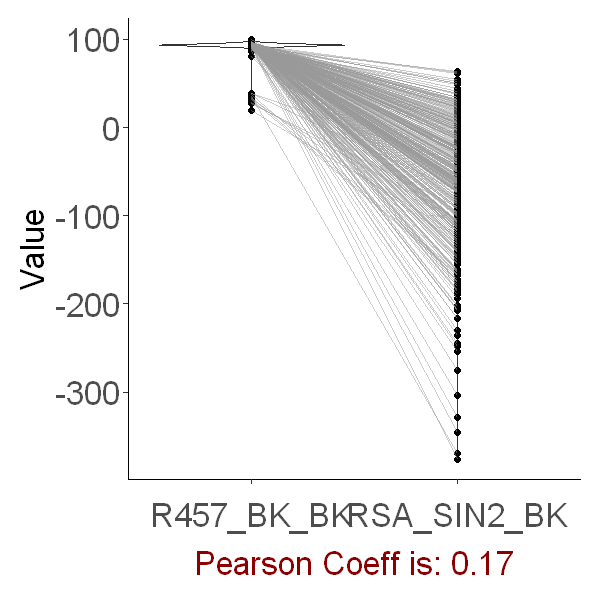

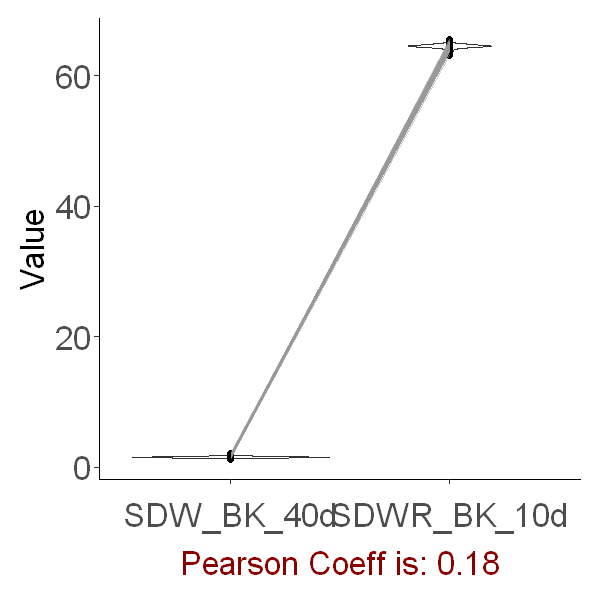

Warning message:
"Removed 1 rows containing non-finite values (stat_ydensity)."
Warning message:
"Removed 1 rows containing missing values (geom_point)."
Warning message:
"Removed 1 row(s) containing missing values (geom_path)."


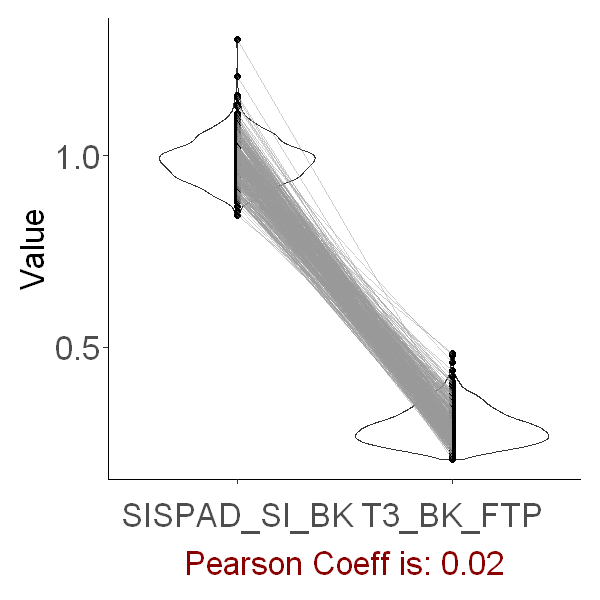

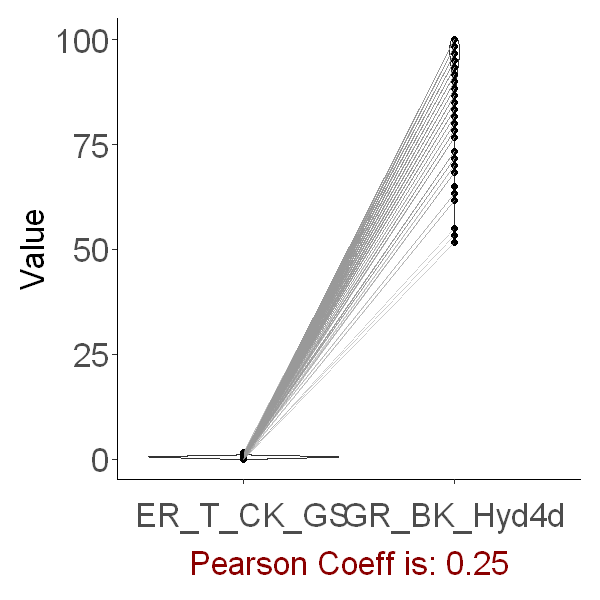

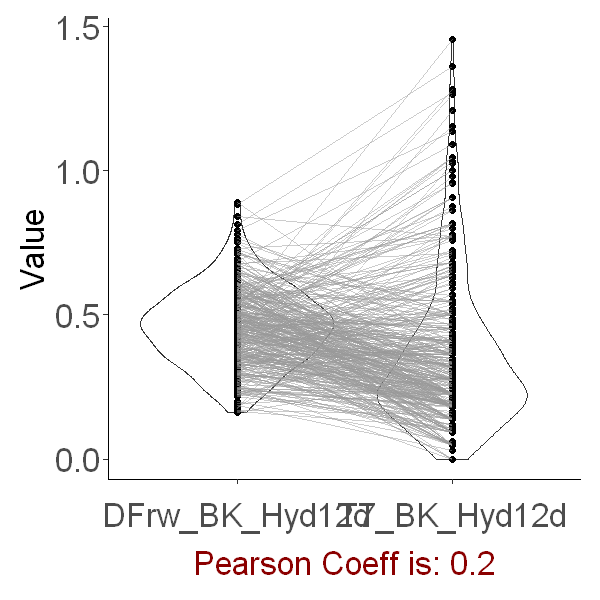

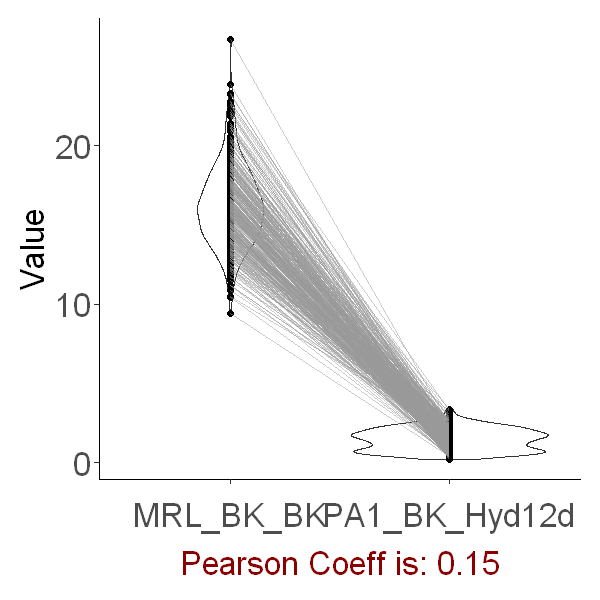

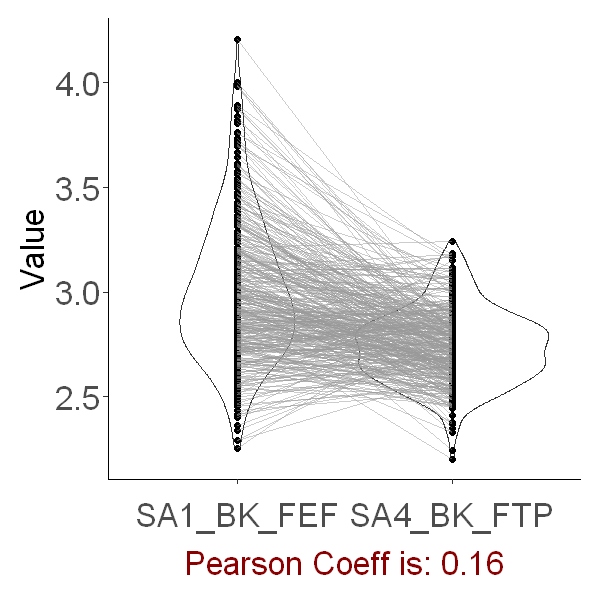

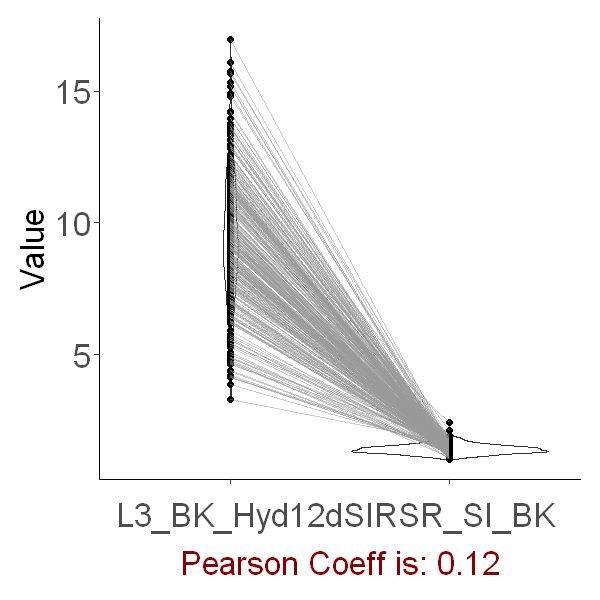

Warning message:
"Removed 31 rows containing non-finite values (stat_ydensity)."
Warning message:
"Removed 31 rows containing missing values (geom_point)."
Warning message:
"Removed 31 row(s) containing missing values (geom_path)."


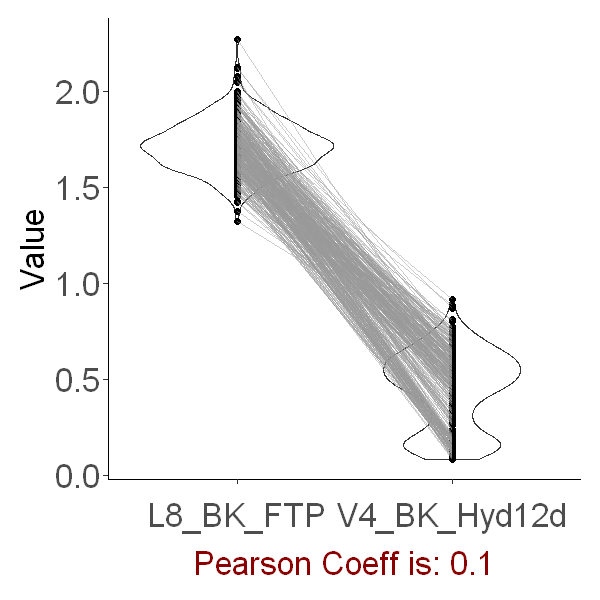

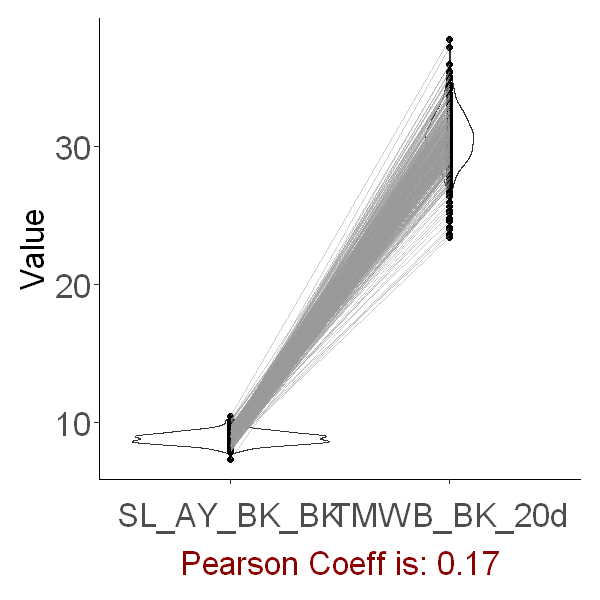

In [144]:
tmp <- df_rg %>% 
subset(Trait_idx_1 > Trait_idx_2) %>% 
subset(Pval < 0.05) %>% 
subset(rG >0.8 & rG < 0.9)

set.seed(999)
row_idx <- sample(rownames(tmp), 100)
tmp <- tmp[row_idx, ]

for (i in 1:nrow(tmp)){
    p <- plot_pair_trait(df_blup, tmp$Trait1[i], tmp$Trait2[i])
    print(p)
}

###### 各性状大类间‘genetic correlation’的关系

In [137]:
df_rg %>% 
subset(Trait_idx_1 > Trait_idx_2) %>% 
subset(Pval < 0.05) %>% 
mutate(Trait_idx_1 = as.integer(Trait_idx_1)) %>% 
mutate(Trait_idx_2 = as.integer(Trait_idx_2)) %>% 
mutate(Trait1 = triat_vec[Trait_idx_1]) %>% 
mutate(Trait2 = triat_vec[Trait_idx_2]) %>% 
merge(df_trait_class, by.x = 'Trait1', by.y = 'TraitID') %>% 
setNames(c(colnames(.)[1:(ncol(.)-1)], 'Trait_class_1')) %>% 
merge(df_trait_class, by.x = 'Trait2', by.y = 'TraitID') %>% 
setNames(c(colnames(.)[1:(ncol(.)-1)], 'Trait_class_2')) -> data

In [142]:
# remove +-1 results
plot_rG <- function(data, TRAIT){
    options(repr.plot.width = 15, repr.plot.height = 5)
    data %>% 
    subset(Trait_class_1 == TRAIT) %>% 
#     subset(rG != 1 & rG != -1) %>% 
    ggplot(aes(x=Trait_class_2, y=rG)) + 
        geom_violin() + 
        geom_jitter(width = 0.2, alpha = 0.5, color = 'grey30')+
        xlab(paste(TRAIT, 'vs 以上性状类别')) +
        theme_classic() +
        theme(axis.text.y = element_text(size = 15),
              axis.text.x = element_text(size = 15, angle = 45, hjust=1, vjust=1),
              axis.title = element_text(size = 20),
              axis.title.x  = element_text(size = 20),
              legend.text = element_text(size = 15),
              legend.title = element_text(size = 15),
              plot.margin = unit(c(0.4,0.4,0.4,0.4),'cm')) -> p
    return(p)
}

Warning message:
"Groups with fewer than two data points have been dropped."


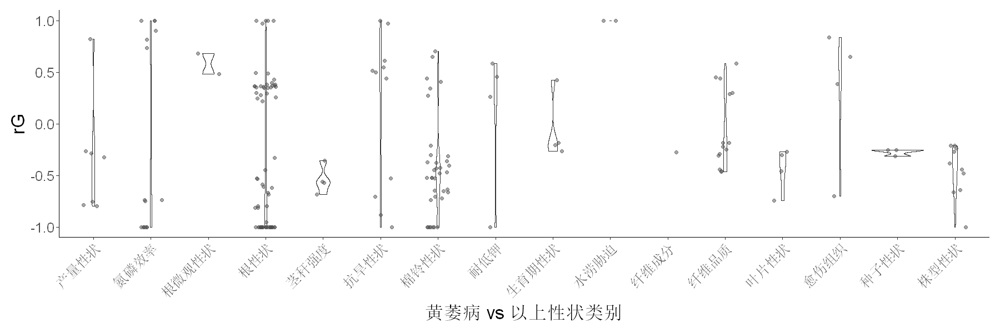

In [143]:
plot_rG(data, '黄萎病')

Warning message:
"Groups with fewer than two data points have been dropped."


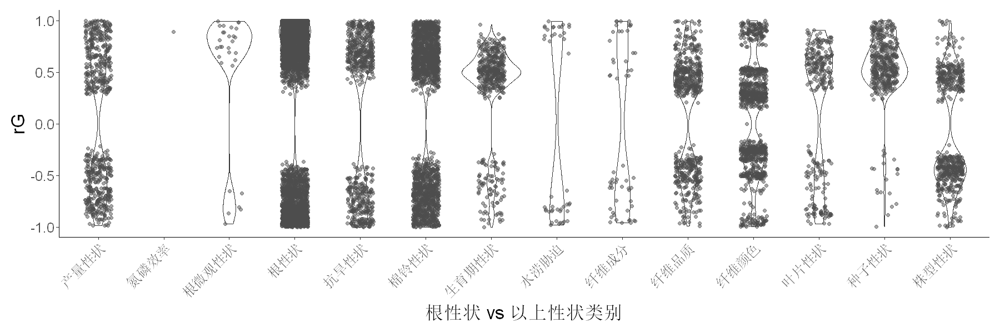

Warning message:
"Groups with fewer than two data points have been dropped."
Warning message:
"Groups with fewer than two data points have been dropped."
Warning message:
"Groups with fewer than two data points have been dropped."


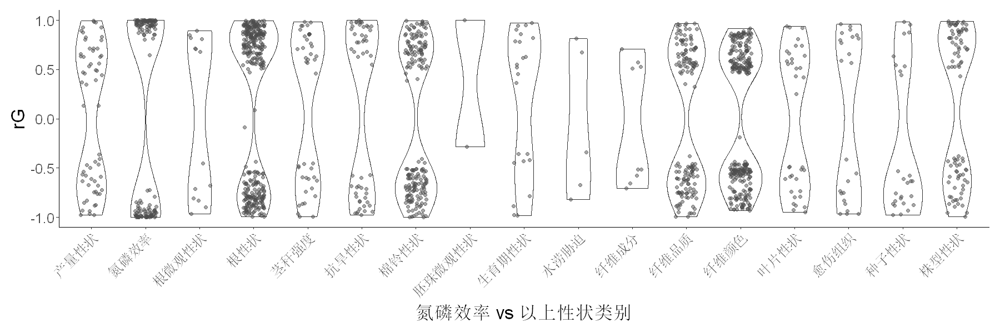

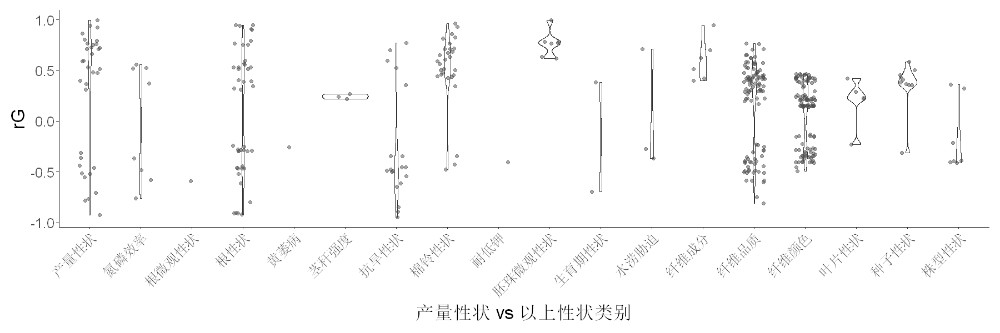

Warning message:
"Groups with fewer than two data points have been dropped."


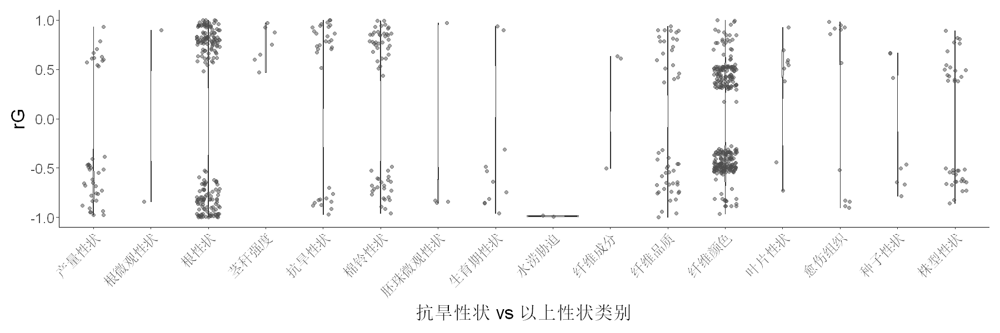

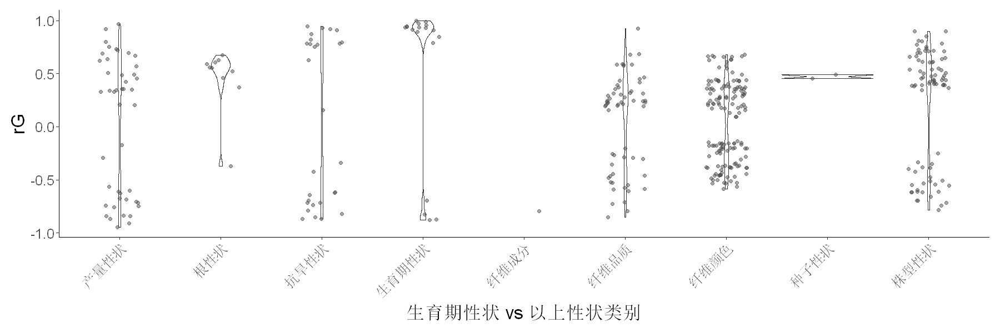

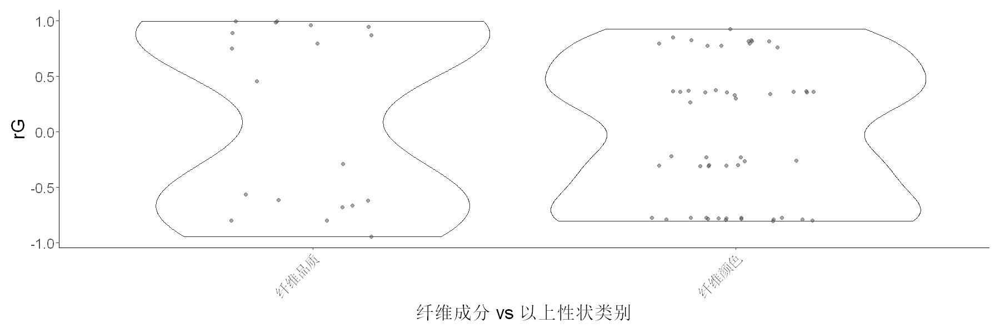

Warning message:
"Groups with fewer than two data points have been dropped."


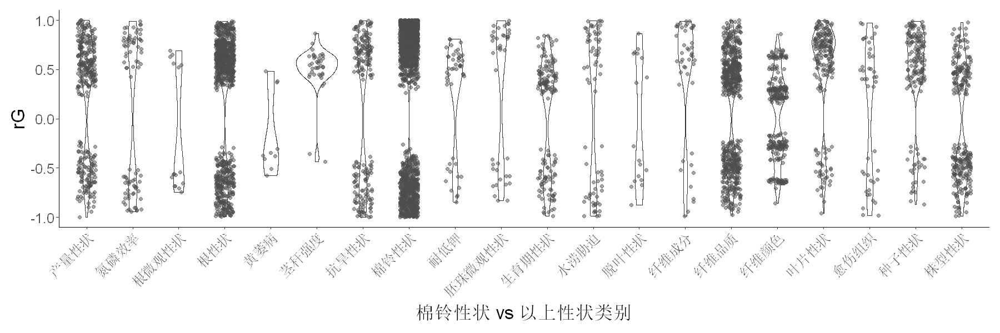

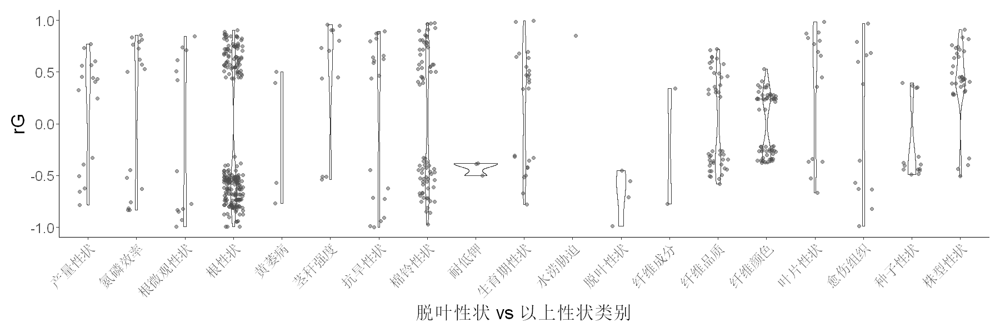

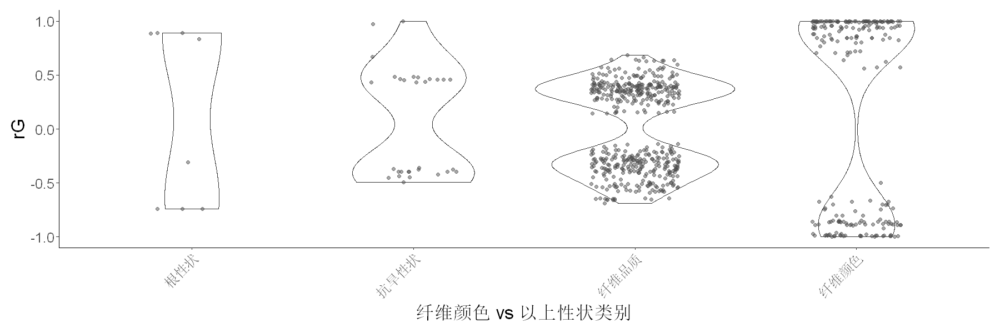

Warning message:
"Groups with fewer than two data points have been dropped."


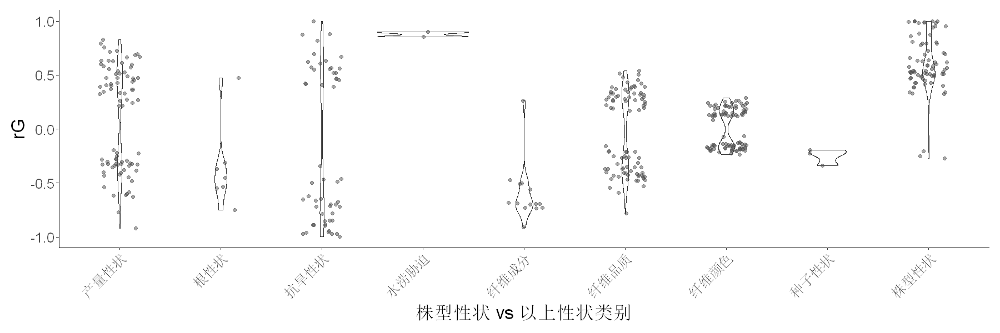

Warning message:
"Groups with fewer than two data points have been dropped."


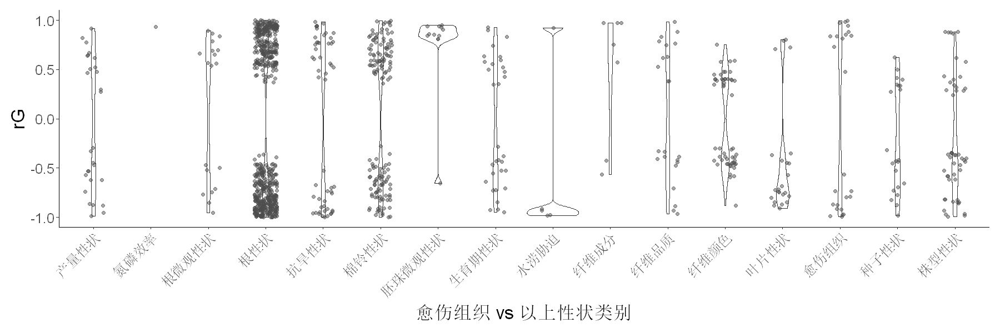

Warning message:
"Groups with fewer than two data points have been dropped."


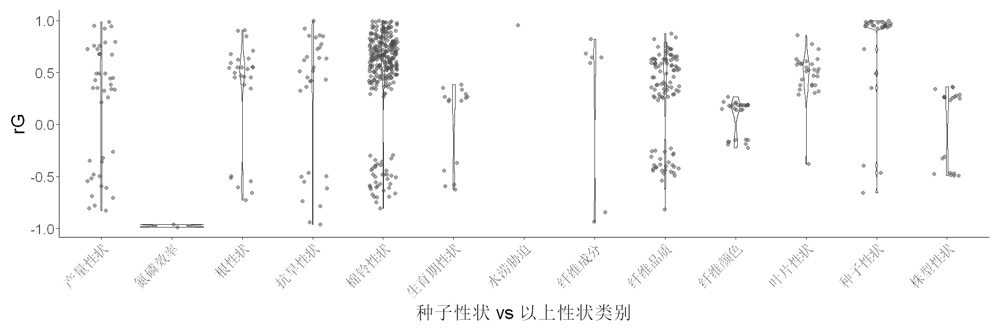

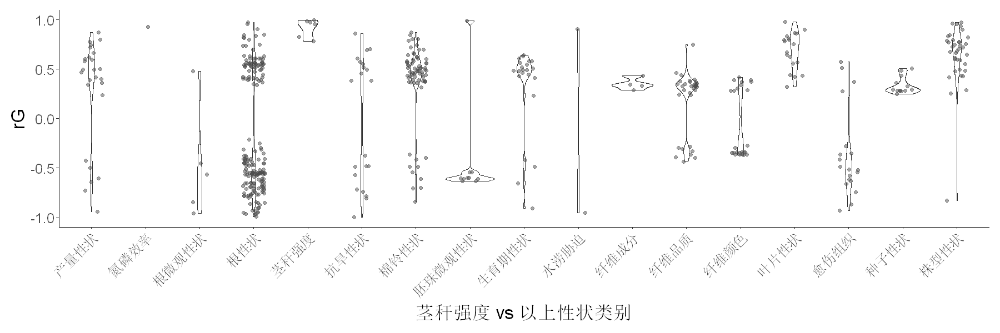

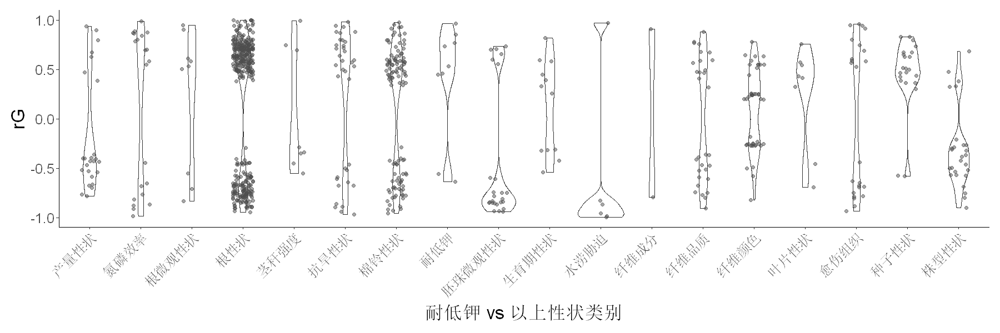

Warning message:
"Groups with fewer than two data points have been dropped."


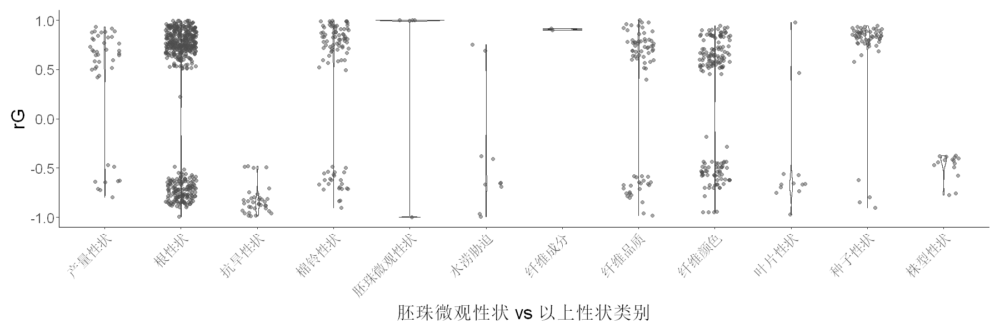

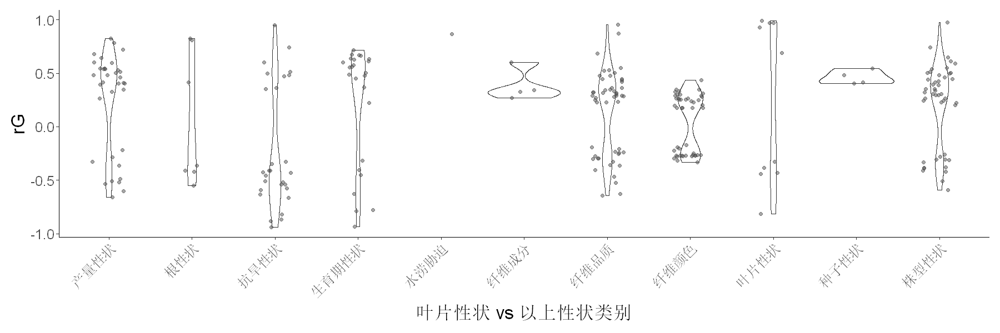

Warning message:
"Groups with fewer than two data points have been dropped."


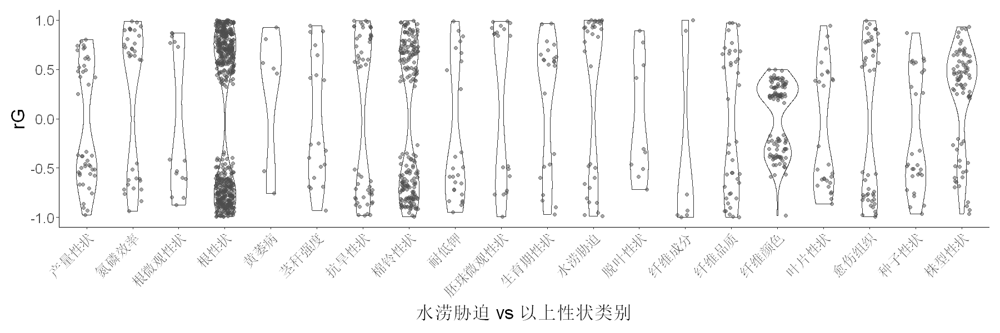

Warning message:
"Groups with fewer than two data points have been dropped."


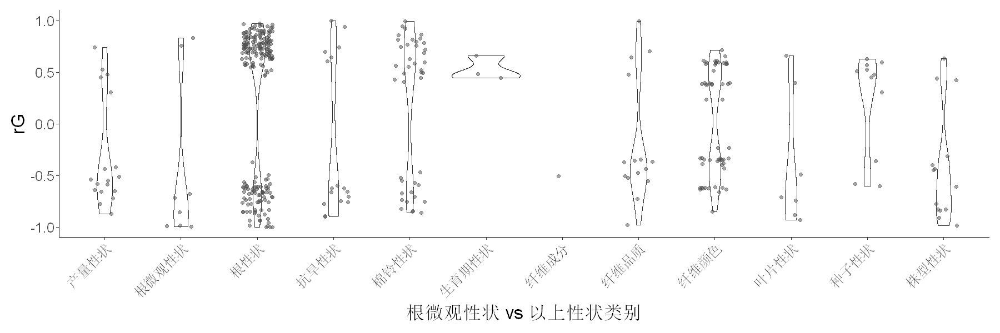

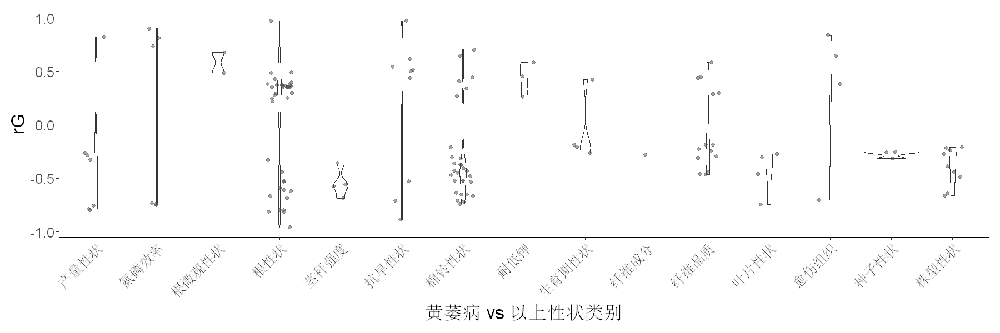

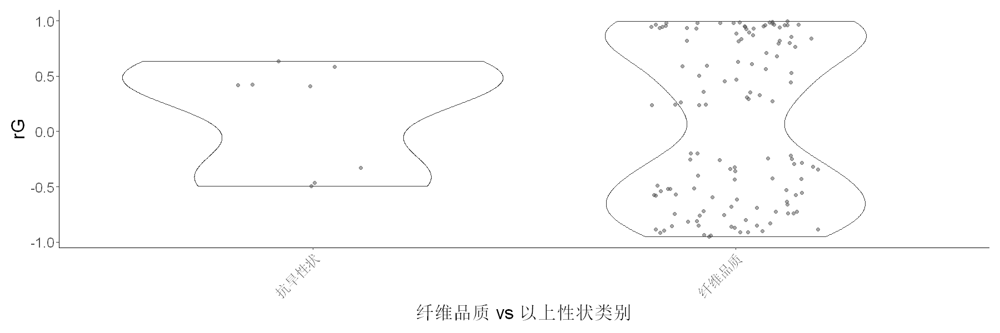

In [141]:
for (i in data$Trait_class_1 %>% unique){
    p <- plot_rG(data, i)
    print(p)
}

#### rG version 2
- Remove the trait's blup with only one value

#### rG version3
- Remove the trait's blup with only one value
- Scale some column and compare

### Tidyup rG results

In [8]:
df_blup <- read.csv('all_blup.14Dec2022.csv')

df_rg <- read.table('./extract_rG.result.tab', sep = '\t', header = F, skip = 1) %>% 
    setNames(c('Fname', 'Type', 'rG', 'SE'))

In [10]:
df_rg[c('Trait_idx_1', 'Trait_idx_2')] <- df_rg$Fname %>% gsub('.hsq', '', .) %>% str_split_fixed('_',  n=6) %>% .[,c(4, 6)]
triat_vec <- colnames(df_blup) %>% .[3:length(.)]

In [11]:
df_trait_class <- pheno_sum %>% 
    mutate(TraitID = paste0(Trait, '_', Treatment)) %>% 
    .[c('性状分类1', 'TraitID')] %>% 
    distinct()

#### 分析rG = $\pm$1 的原因
##### Generate SD for all traits
如果BLUP的SD过小，应该就不用分析genetic correlation了

#### Heatmap

Loading required package: pheatmap

Warning message:
"package 'pheatmap' was built under R version 4.2.2"


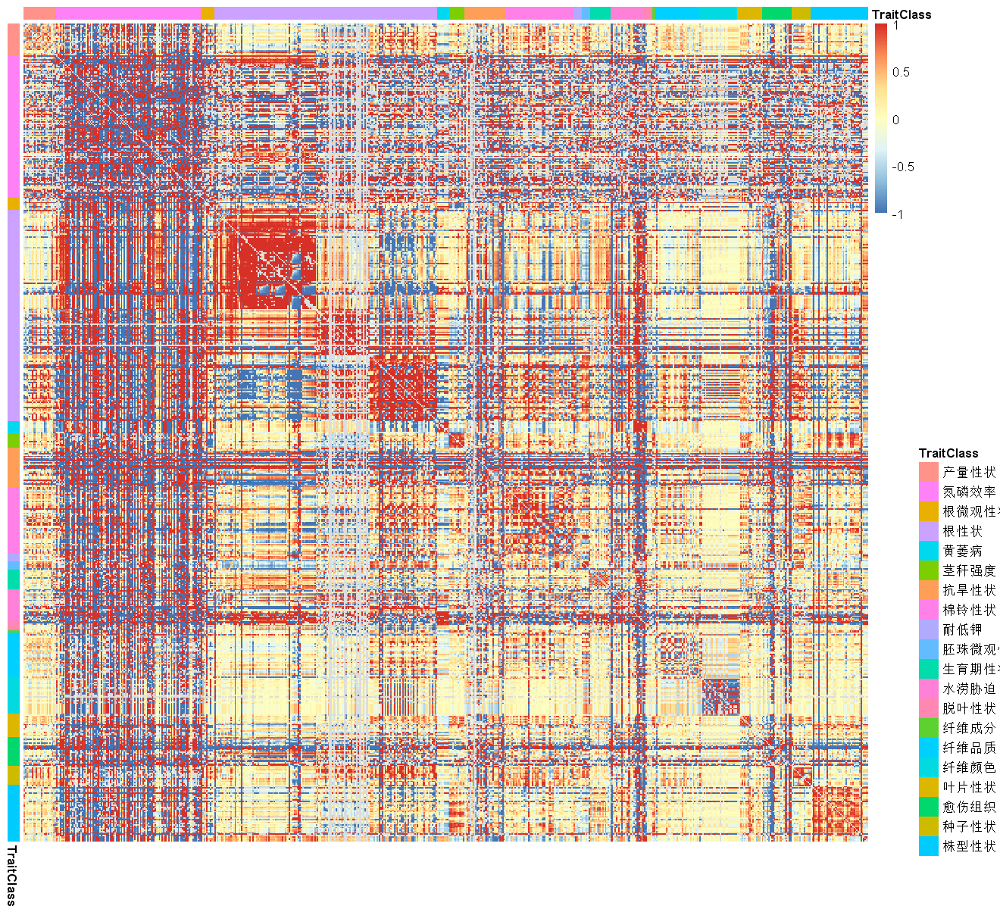

In [12]:
# generate heatmap input
df_rg %>% 
mutate(Trait_idx_1 = as.integer(Trait_idx_1)) %>% 
mutate(Trait_idx_2 = as.integer(Trait_idx_2)) %>% 
mutate(Trait1 = triat_vec[Trait_idx_1]) %>% 
mutate(Trait2 = triat_vec[Trait_idx_2]) %>% 
# subset(Trait_idx_1 < Trait_idx_2) %>% # 去除重复数据
.[c('Trait1', 'Trait2', 'rG')] %>% 
spread(Trait2, rG) %>% 
column_to_rownames('Trait1') -> rG_matrix


plot_pheatmap <- function(df, df_trait_class){
    trait_order <- df_trait_class %>% arrange(性状分类1) %>% .$TraitID
    
    ordered_row = setdiff(trait_order, setdiff(trait_order, rownames(df)))
    ordered_col = setdiff(trait_order, setdiff(trait_order, colnames(df)))
    data = df[ordered_row,  ordered_col]
    
    row_trait_class <- df_trait_class %>% subset(TraitID %in% rownames(df)) %>% distinct(TraitID, .keep_all = T) %>% arrange(性状分类1) %>% .$性状分类1
    col_trait_class <- df_trait_class %>% subset(TraitID %in% colnames(df)) %>% distinct(TraitID, .keep_all = T) %>% arrange(性状分类1) %>% .$性状分类1

    annotation_row <- data.frame(TraitClass = row_trait_class)
    rownames(annotation_row) <- ordered_row
    annotation_col <- data.frame(TraitClass = col_trait_class)
    rownames(annotation_col) <- ordered_col
    
    require(pheatmap)
    options(repr.plot.width = 11, repr.plot.height = 10)
    p <- data %>% 
        pheatmap(cluster_rows = FALSE,
                 cluster_cols = FALSE,
                 annotation_row = annotation_row,
                 annotation_col = annotation_col,
                 fontsize = 10,
                 show_rownames = F, 
                 show_colnames = F)
    return(p)
}

plot_pheatmap(rG_matrix, df_trait_class)

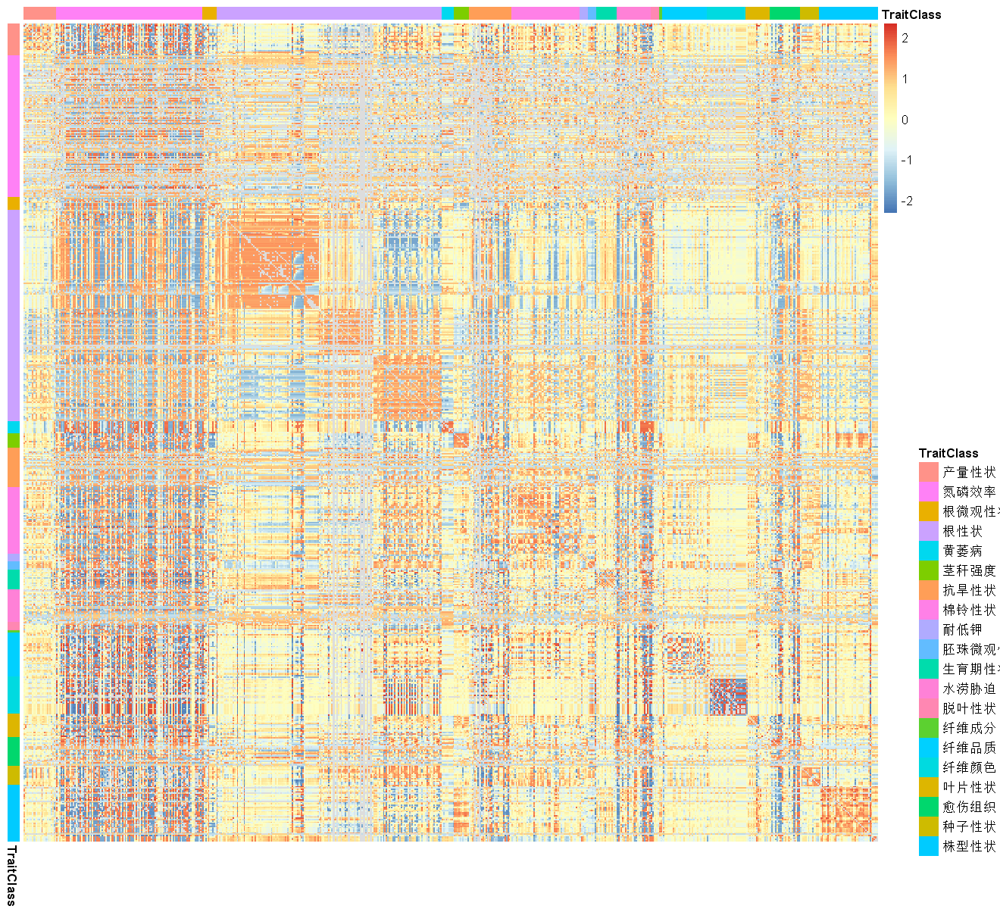

In [13]:
# generate heatmap input
df_rg %>% 
mutate(Trait_idx_1 = as.integer(Trait_idx_1)) %>% 
mutate(Trait_idx_2 = as.integer(Trait_idx_2)) %>% 
mutate(Trait1 = triat_vec[Trait_idx_1]) %>% 
mutate(Trait2 = triat_vec[Trait_idx_2]) %>% 
# subset(Trait_idx_1 < Trait_idx_2) %>% # 去除重复数据
.[c('Trait1', 'Trait2', 'rG')] %>% 
spread(Trait2, rG) %>% 
column_to_rownames('Trait1') -> rG_matrix


plot_pheatmap <- function(df, df_trait_class){
    trait_order <- df_trait_class %>% arrange(性状分类1) %>% .$TraitID
    
    ordered_row = setdiff(trait_order, setdiff(trait_order, rownames(df)))
    ordered_col = setdiff(trait_order, setdiff(trait_order, colnames(df)))
    data = df[ordered_row,  ordered_col]
    
    row_trait_class <- df_trait_class %>% subset(TraitID %in% rownames(df)) %>% distinct(TraitID, .keep_all = T) %>% arrange(性状分类1) %>% .$性状分类1
    col_trait_class <- df_trait_class %>% subset(TraitID %in% colnames(df)) %>% distinct(TraitID, .keep_all = T) %>% arrange(性状分类1) %>% .$性状分类1

    annotation_row <- data.frame(TraitClass = row_trait_class)
    rownames(annotation_row) <- ordered_row
    annotation_col <- data.frame(TraitClass = col_trait_class)
    rownames(annotation_col) <- ordered_col
    
    require(pheatmap)
    options(repr.plot.width = 11, repr.plot.height = 10)
    p <- data %>% 
        pheatmap(scale = 'row',
                cluster_rows = FALSE,
                 cluster_cols = FALSE,
                 annotation_row = annotation_row,
                 annotation_col = annotation_col,
                 fontsize = 10,
                 show_rownames = F, 
                 show_colnames = F)
    return(p)
}

plot_pheatmap(rG_matrix, df_trait_class)

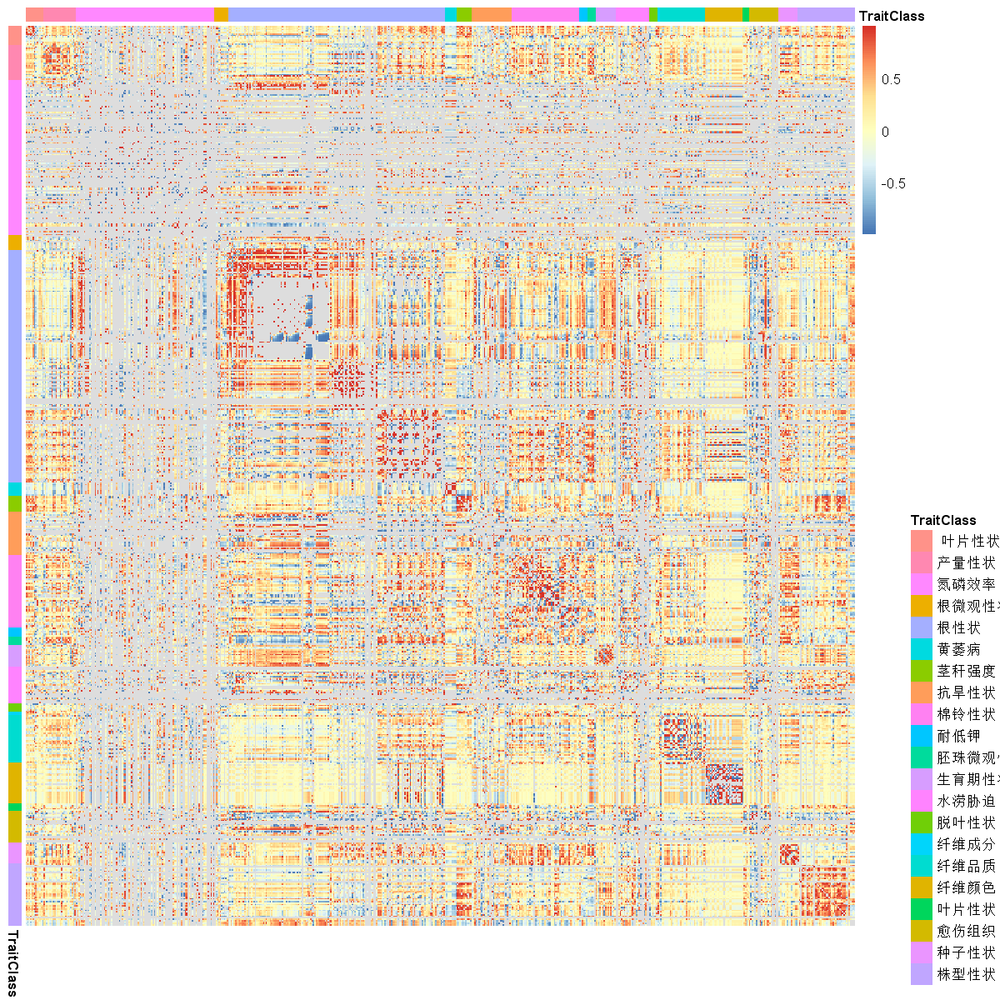

In [177]:
# generate heatmap input remove the +-1 results
df_rg %>% 
subset(rG != 1 & rG != -1) %>% 
mutate(Trait_idx_1 = as.integer(Trait_idx_1)) %>% 
mutate(Trait_idx_2 = as.integer(Trait_idx_2)) %>% 
mutate(Trait1 = triat_vec[Trait_idx_1]) %>% 
mutate(Trait2 = triat_vec[Trait_idx_2]) %>% 
# subset(Trait_idx_1 < Trait_idx_2) %>% # 去除重复数据
.[c('Trait1', 'Trait2', 'rG')] %>% 
spread(Trait2, rG) %>% 
column_to_rownames('Trait1') -> rG_matrix


plot_pheatmap <- function(df, df_trait_class){
    trait_order <- df_trait_class %>% arrange(性状分类1) %>% .$TraitID
    
    ordered_row = setdiff(trait_order, setdiff(trait_order, rownames(df)))
    ordered_col = setdiff(trait_order, setdiff(trait_order, colnames(df)))
    data = df[ordered_row,  ordered_col]
    
    row_trait_class <- df_trait_class %>% subset(TraitID %in% rownames(df)) %>% distinct(TraitID, .keep_all = T) %>% arrange(性状分类1) %>% .$性状分类1
    col_trait_class <- df_trait_class %>% subset(TraitID %in% colnames(df)) %>% distinct(TraitID, .keep_all = T) %>% arrange(性状分类1) %>% .$性状分类1

    annotation_row <- data.frame(TraitClass = row_trait_class)
    rownames(annotation_row) <- ordered_row
    annotation_col <- data.frame(TraitClass = col_trait_class)
    rownames(annotation_col) <- ordered_col
    
    require(pheatmap)
    options(repr.plot.width = 10, repr.plot.height = 10)
    p <- data %>% 
        pheatmap(cluster_rows = FALSE,
                 cluster_cols = FALSE,
                 annotation_row = annotation_row,
                 annotation_col = annotation_col,
                 fontsize = 10,
                 show_rownames = F, 
                 show_colnames = F)
    return(p)
}

plot_pheatmap(rG_matrix, df_trait_class)

#### rG for disease traits

In [24]:
df_trait_class$性状分类1 %>% unique

[1] "纤维品质"     "纤维颜色"     "纤维成分"     "产量性状"     "株型性状"    
 [6] "生育期性状"   "叶片性状"     "棉铃性状"     "种子性状"     "根性状"      
[11] "根微观性状"   "胚珠微观性状" "愈伤组织"     "茎秆强度"     "抗旱性状"    
[16] "氮磷效率"     "耐低钾"       "黄萎病"       "脱叶性状"     "水涝胁迫"

In [22]:
df_rg %>% 
mutate(Trait_idx_1 = as.integer(Trait_idx_1)) %>% 
mutate(Trait_idx_2 = as.integer(Trait_idx_2)) %>% 
mutate(Trait1 = triat_vec[Trait_idx_1]) %>% 
mutate(Trait2 = triat_vec[Trait_idx_2]) %>% 
merge(df_trait_class, by.x = 'Trait1', by.y = 'TraitID') %>% 
setNames(c(colnames(.)[1:(ncol(.)-1)], 'Trait_class_1')) %>% 
merge(df_trait_class, by.x = 'Trait2', by.y = 'TraitID') %>% 
setNames(c(colnames(.)[1:(ncol(.)-1)], 'Trait_class_2')) -> data

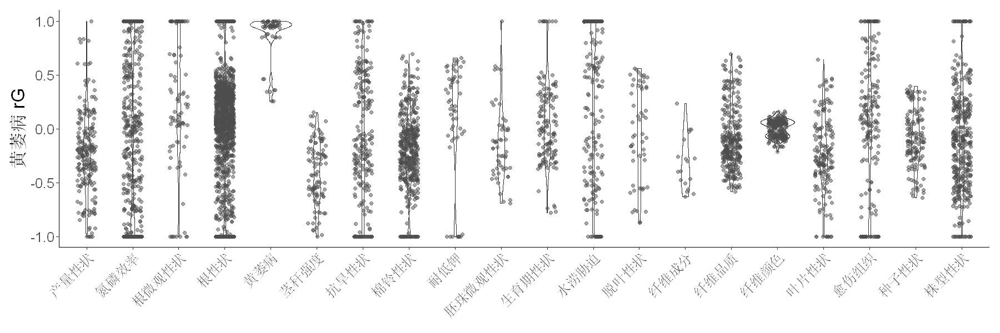

In [41]:
options(repr.plot.width = 15, repr.plot.height = 5)
data %>% 
subset(Trait_class_1 == '黄萎病') %>% 
ggplot(aes(x=Trait_class_2, y=rG)) + 
    geom_violin() + 
    geom_jitter(width = 0.2, alpha = 0.5, color = 'grey30')+
    ylab('黄萎病 rG') +
    theme_classic() +
    theme(axis.text.y = element_text(size = 15),
          axis.text.x = element_text(size = 15, angle = 45, hjust=1, vjust=1),
          axis.title = element_text(size = 20),
          axis.title.x  = element_blank(),
          legend.text = element_text(size = 15),
          legend.title = element_text(size = 15),
          plot.margin = unit(c(0.4,0.4,0.4,0.4),'cm'))

In [45]:
# remove +-1 results
plot_rG <- function(data, TRAIT){
    options(repr.plot.width = 15, repr.plot.height = 5)
    data %>% 
    subset(Trait_class_1 == TRAIT) %>% 
    subset(rG != 1 & rG != -1) %>% 
    ggplot(aes(x=Trait_class_2, y=rG)) + 
        geom_violin() + 
        geom_jitter(width = 0.2, alpha = 0.5, color = 'grey30')+
        xlab(paste(TRAIT, 'vs 以上性状类别')) +
        theme_classic() +
        theme(axis.text.y = element_text(size = 15),
              axis.text.x = element_text(size = 15, angle = 45, hjust=1, vjust=1),
              axis.title = element_text(size = 20),
              axis.title.x  = element_text(size = 20),
              legend.text = element_text(size = 15),
              legend.title = element_text(size = 15),
              plot.margin = unit(c(0.4,0.4,0.4,0.4),'cm')) -> p
    return(p)
}

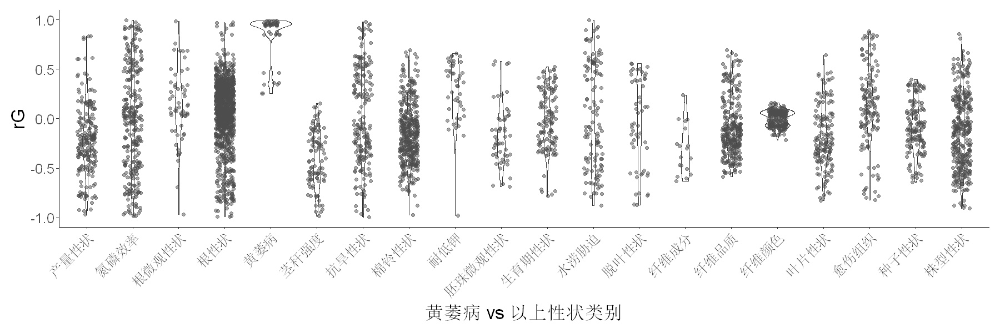

In [46]:
plot_rG(data, '黄萎病')

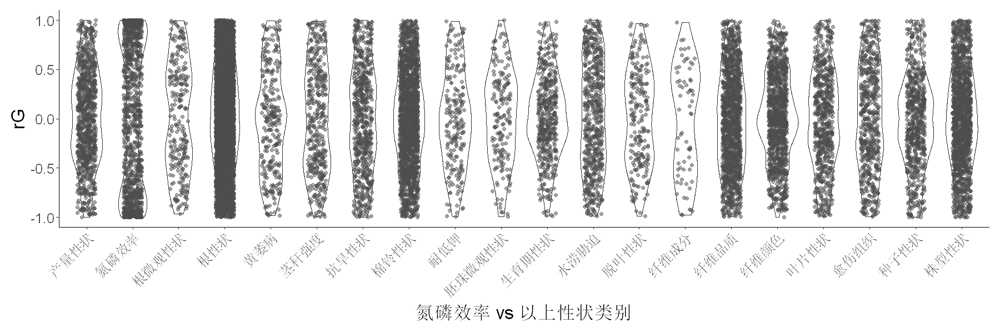

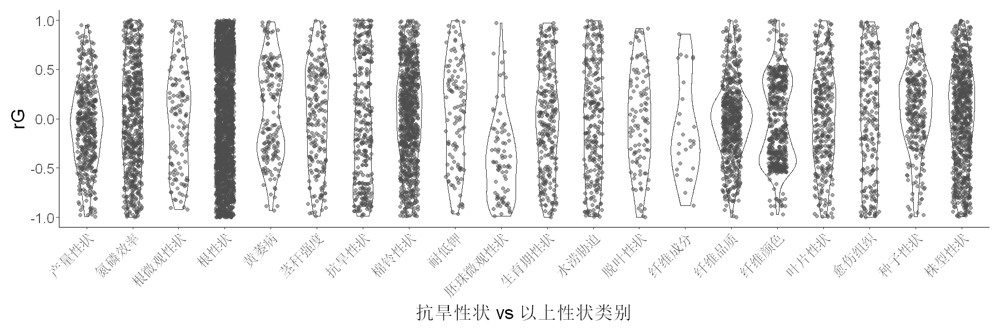

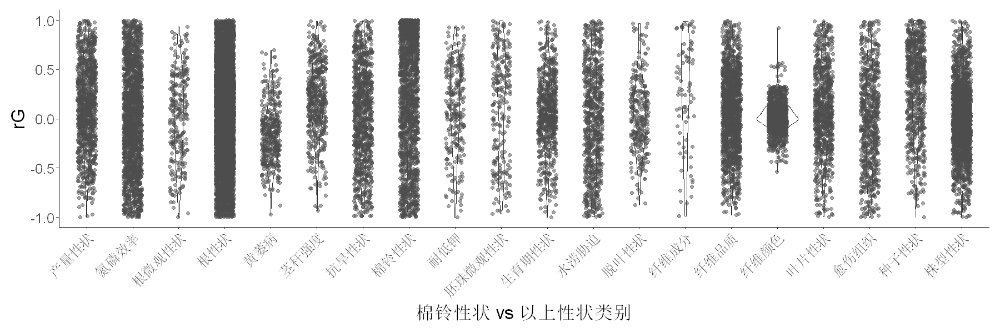

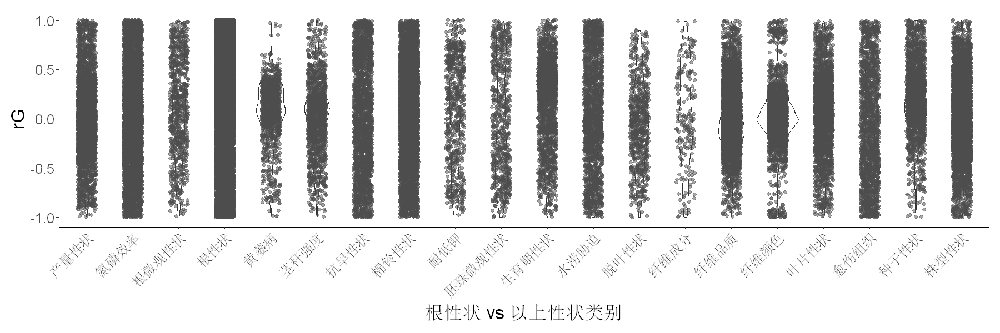

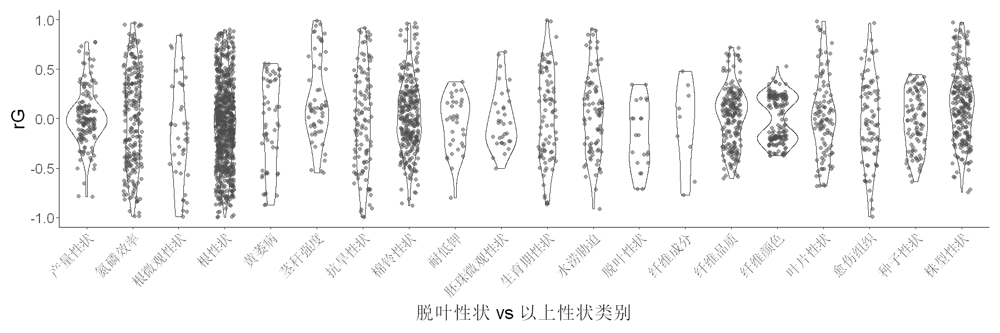

...

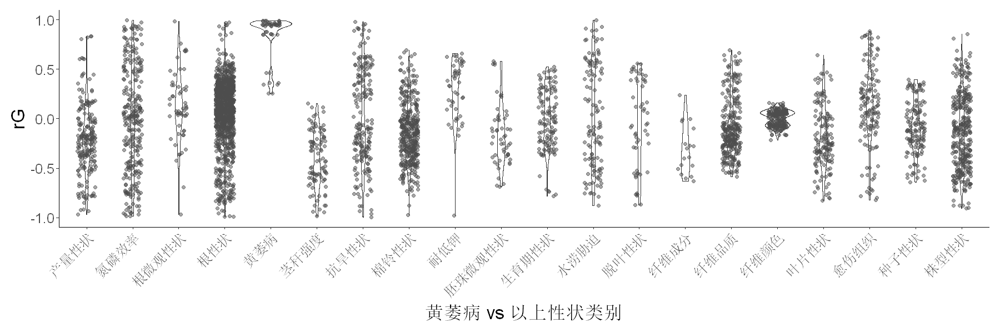

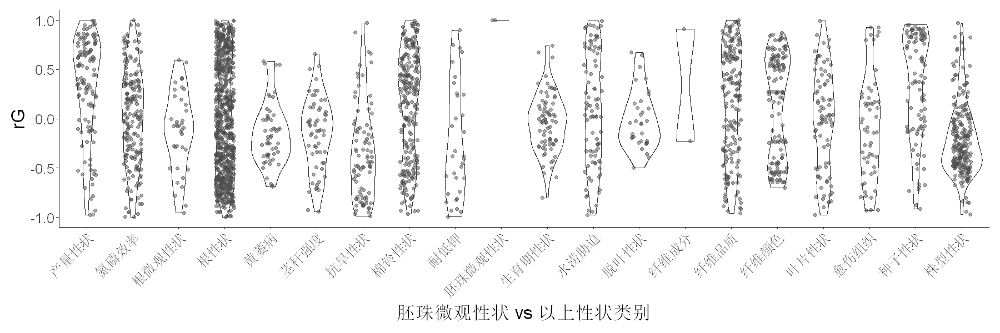

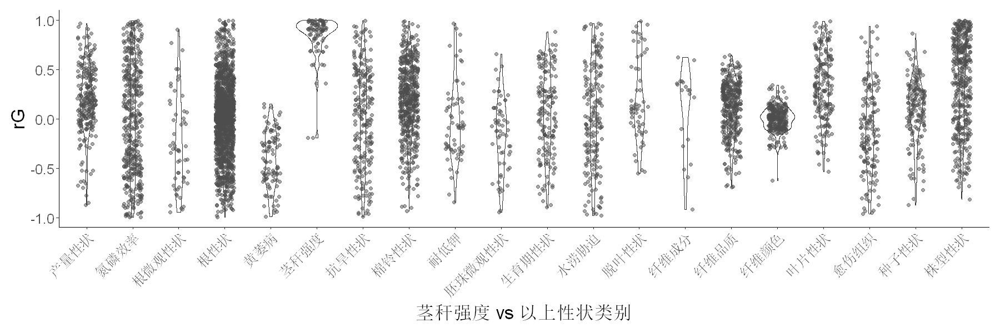

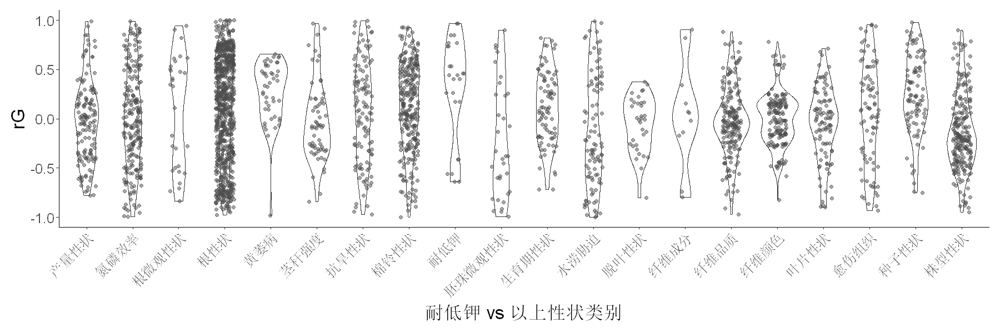

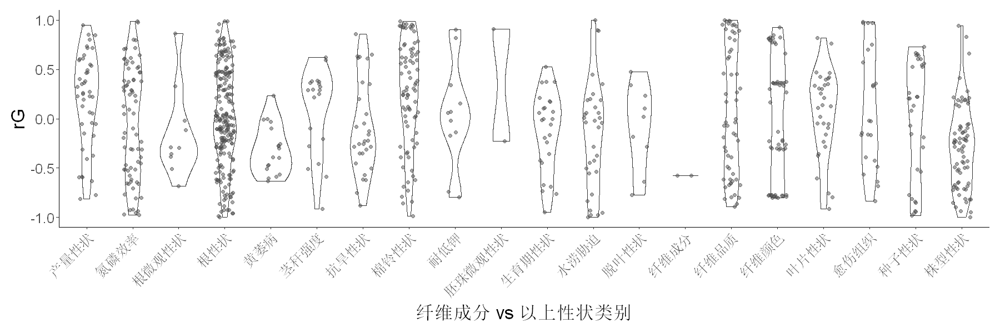

In [49]:
for (i in data$Trait_class_1 %>% unique){
    p <- plot_rG(data, i)
    print(p)
}

In [50]:
# keep +-1 results
plot_rG <- function(data, TRAIT){
    options(repr.plot.width = 15, repr.plot.height = 5)
    data %>% 
    subset(Trait_class_1 == TRAIT) %>% 
#     subset(rG != 1 & rG != -1) %>% 
    ggplot(aes(x=Trait_class_2, y=rG)) + 
        geom_violin() + 
        geom_jitter(width = 0.2, alpha = 0.5, color = 'grey30')+
        xlab(paste(TRAIT, 'vs 以上性状类别')) +
        theme_classic() +
        theme(axis.text.y = element_text(size = 15),
              axis.text.x = element_text(size = 15, angle = 45, hjust=1, vjust=1),
              axis.title = element_text(size = 20),
              axis.title.x  = element_text(size = 20),
              legend.text = element_text(size = 15),
              legend.title = element_text(size = 15),
              plot.margin = unit(c(0.4,0.4,0.4,0.4),'cm')) -> p
    return(p)
}

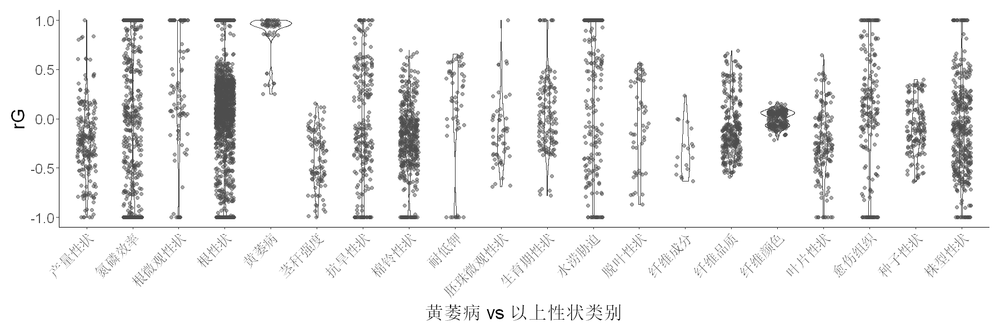

In [51]:
plot_rG(data, '黄萎病')

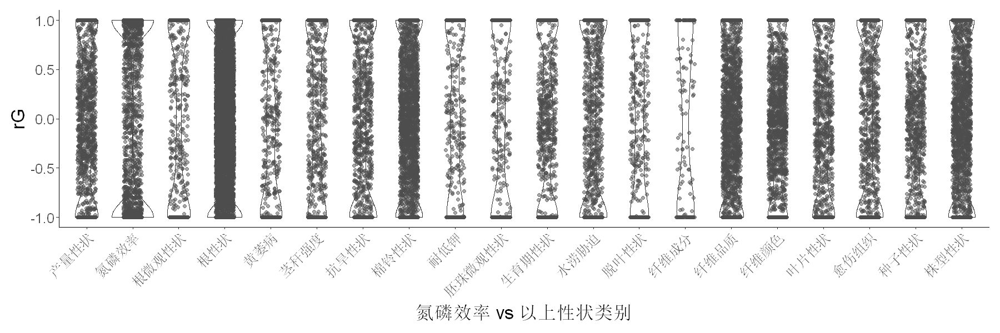

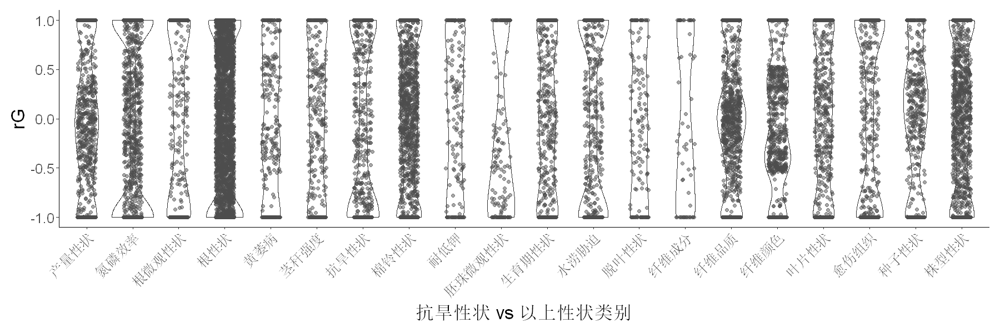

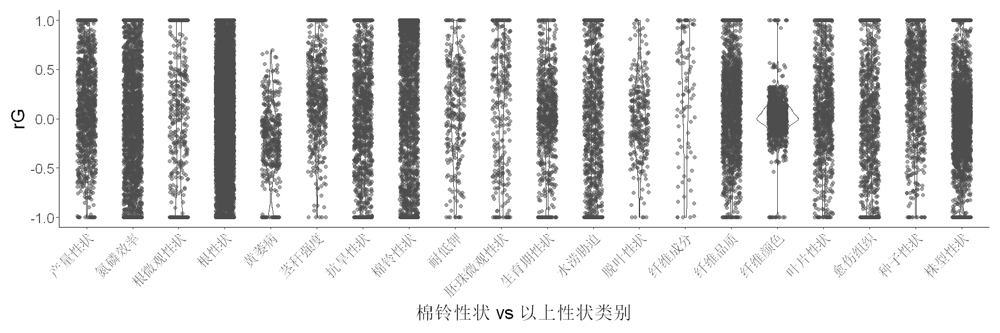

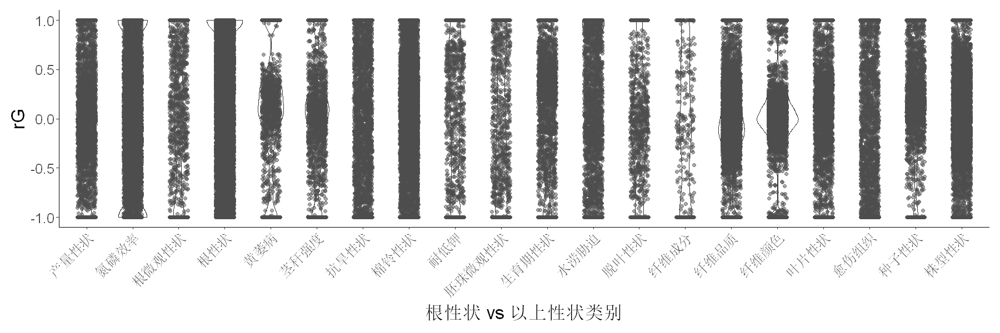

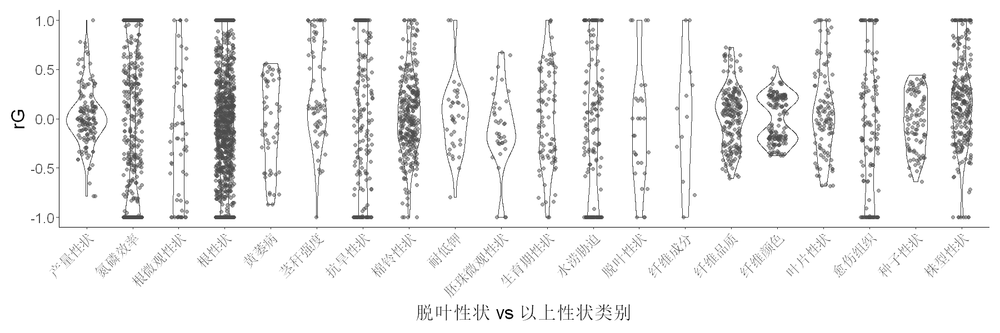

...

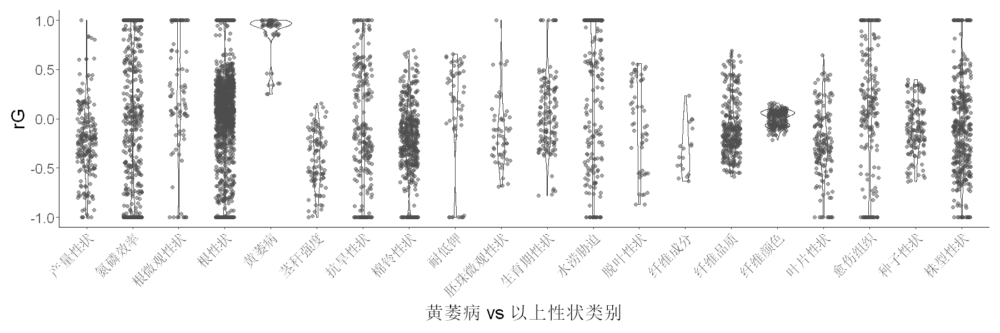

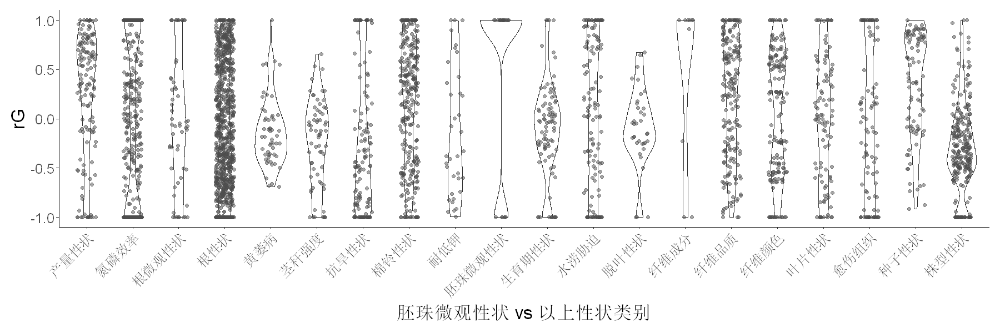

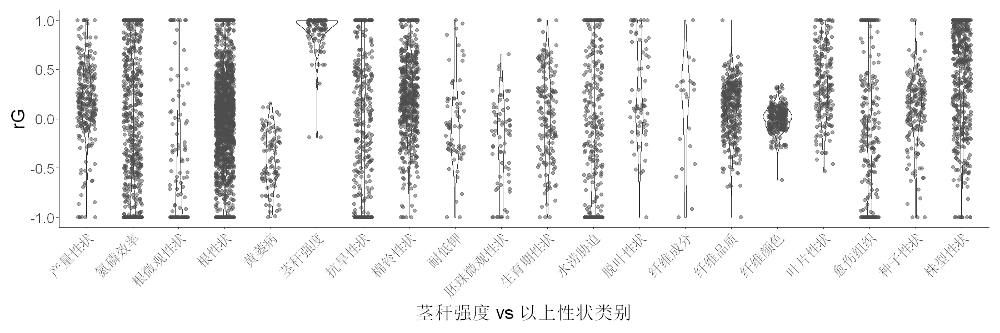

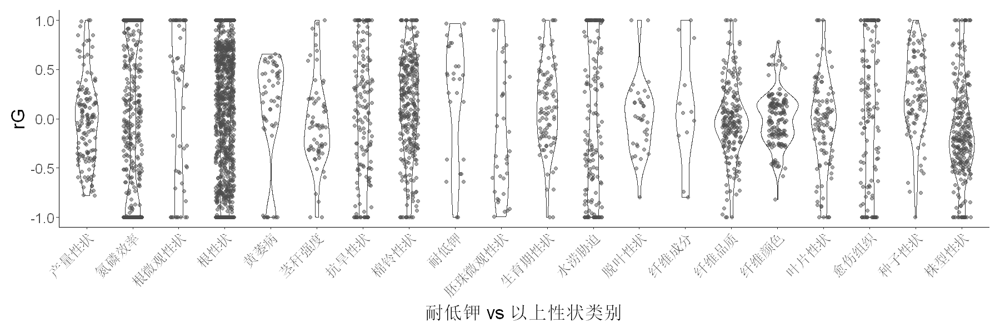

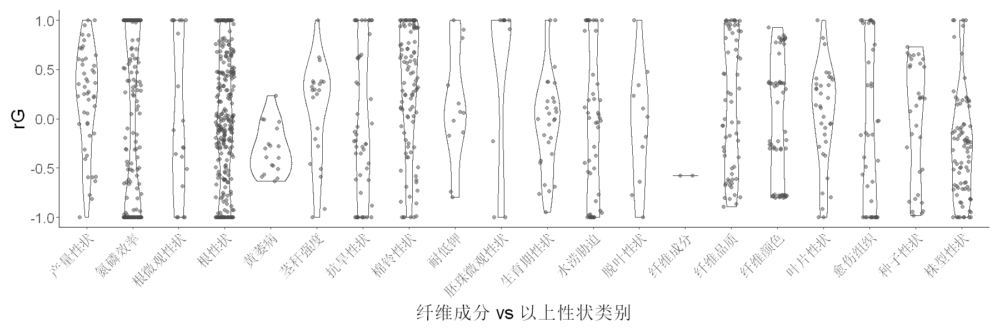

In [52]:
for (i in data$Trait_class_1 %>% unique){
    p <- plot_rG(data, i)
    print(p)
}

#### investigate the results which rG = +-1
- 如果 trait1 和 trait2 完全一致，没有结果.
- 当两个性状均值或SD差异很大时，确实很多情况为 +-1，但也有很多落于-1与1之间。
- 这说明scale两个性状再做genetic correlation可能不是必须的。

In [79]:
blup_values <- df_blup %>% .[3:ncol(.)]

In [91]:
mean_vec <- blup_values %>% colMeans(na.rm = T)

In [102]:
sd_vec <- c()
for (i in 1:ncol(blup_values))
{
  sd_vec = c(sd_vec,sd(blup_values[,i], na.rm =T))
}

In [115]:
tmp <- df_rg %>% 
    mutate(Trait_idx_1 = as.integer(Trait_idx_1)) %>% 
    mutate(Trait_idx_2 = as.integer(Trait_idx_2)) %>% 
    subset(Trait_idx_1 < Trait_idx_2) %>% 
    mutate(mean_1 = mean_vec[Trait_idx_1]) %>% 
    mutate(mean_2 = mean_vec[Trait_idx_2]) %>% 
    mutate(mean_diff = abs(mean_1 - mean_2)) %>%
    mutate(mean_diff2 = mean_1 - mean_2) %>% 
    mutate(sd_1 = sd_vec[Trait_idx_1]) %>% 
    mutate(sd_2 = sd_vec[Trait_idx_2]) %>% 
    mutate(sd_diff = sd_1 - sd_2)

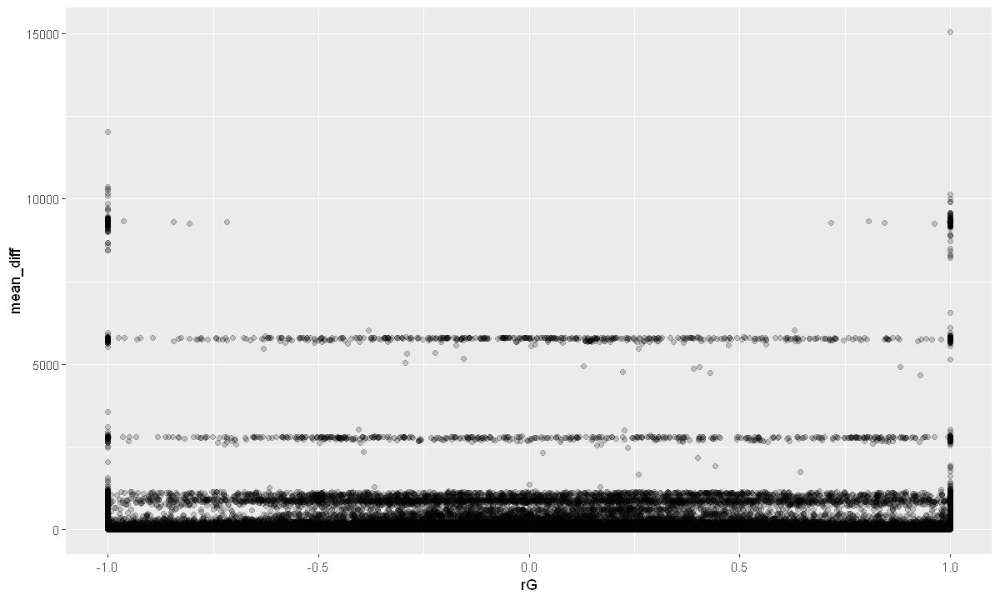

In [109]:
options(repr.plot.width = 10, repr.plot.height = 6)
tmp %>% ggplot(aes(rG, mean_diff)) +
    geom_point(alpha = 0.2)

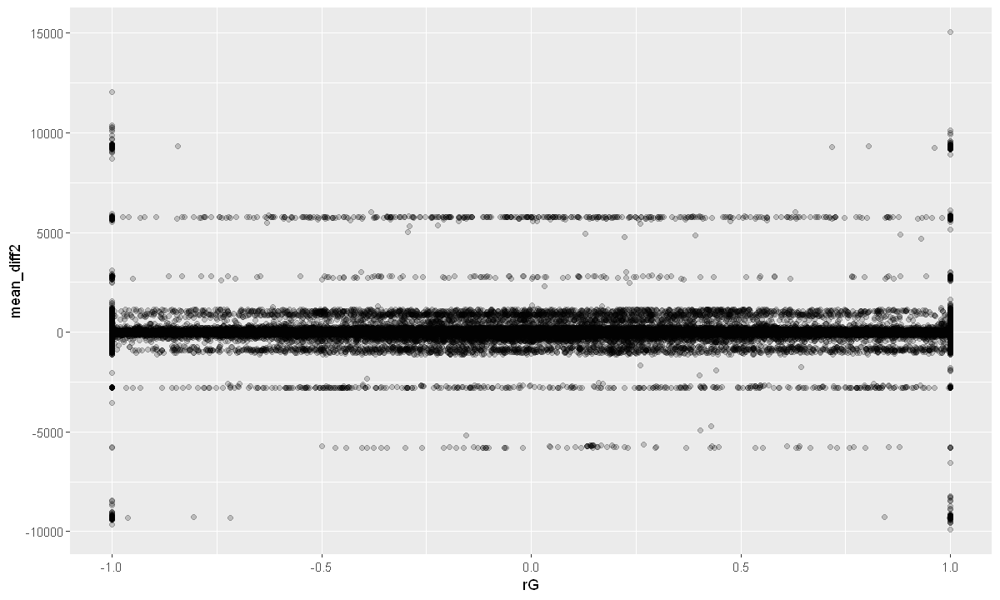

In [116]:
options(repr.plot.width = 10, repr.plot.height = 6)
tmp %>% ggplot(aes(rG, mean_diff2)) +
    geom_point(alpha = 0.2)

In [ ]:
options(repr.plot.width = 10, repr.plot.height = 6)
tmp %>% ggplot(aes(rG, mean_diff)) +
    geom_point(alpha = 0.2)

Warning message in self$trans$transform(x):
"NaNs produced"
Warning message:
"Transformation introduced infinite values in continuous y-axis"
Warning message:
"Removed 103281 rows containing missing values (geom_point)."


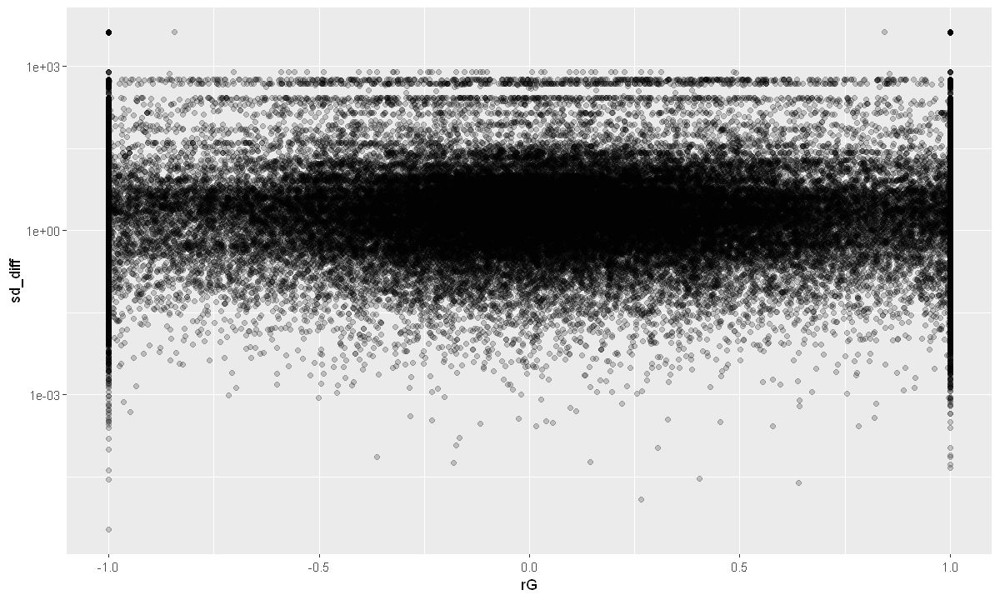

In [114]:
options(repr.plot.width = 10, repr.plot.height = 6)
tmp %>% ggplot(aes(rG, sd_diff)) +
    geom_point(alpha = 0.2) + 
    scale_y_log10()

In [84]:
blup_values[tmp$Trait_idx_1 %>% unique()] %>% colMeans(na.rm = T)

YT_DR         FBA_BLANK         FBL_BLANK           EFBA_CK 
     8.777171e-01      5.792350e+01      2.104012e+01      5.275655e+01 
  BON_blooming_DR            FBA_DR           FBA_DCK            FBA_CK 
     9.981796e-01      9.256423e-01      6.258637e+01      5.349165e+01 
          EFBA_DR            YT_DCK          FABR_DCK  BON_blooming_DCK 
     9.168491e-01      1.124958e+03      3.368582e-01      5.883157e+00 
       EFBL_BLANK          EFBL_DCK        EFBA_BLANK          EFBA_DCK 
     1.814881e+01      1.551567e+01      5.824405e+01      6.155576e+01 
           FBL_CK           EFBL_CK          FS_BLANK            FS_DCK 
     2.567725e+01      2.165222e+01      2.959332e+01      2.609237e+01 
            FU_CK            MIC_DR             FE_CK            FU_DCK 
     8.464875e+01      1.060118e+00      8.456205e+00      8.214188e+01 
            FU_DR           MIC_DCK             FL_CK          FL_BLANK 
     9.899040e-01      4.231867e+00      2.899097e+01      2.840713e+01 
           FL_DCK             FL_DR            FE_DCK          FU_BLANK 
     2.648020e+01      9.699566e-01      6.488249e+00      8.472945e+01 
            FS_CK          FE_BLANK         MIC_BLANK            MIC_CK 
     2.745844e+01      8.156675e+00      5.082304e+00      4.458297e+00 
       FFBL_BLANK        FFBA_BLANK         FBN_BLANK        NNFF_BLANK 
     2.299274e+01      5.775216e+01      9.967898e+00      5.190519e+00 
         FFBA_DCK           FFBL_DR            FBN_CK         LBN_BLANK 
     6.254221e+01      9.050082e-01      1.486893e+01      2.075375e+00 
          FFBH_CK           FBL_DCK            FBL_DR          FFBL_DCK 
     1.861070e+01      2.075777e+01      8.473470e-01      2.034663e+01 
       FFBH_BLANK           FFBH_DR           FFBA_DR           FFBA_CK 
     2.378420e+01      1.136550e+00      9.312966e-01      5.301169e+01 
          FFBL_CK          FFBH_DCK         PH2_BLANK          PW_BLANK 
     2.757584e+01      1.616101e+01      8.971446e+01      4.109027e+01 
        PH1_BLANK           SFBA_DR        FBN_FB_DCK        SFBA_BLANK 
     8.094546e+01      9.328933e-01      6.810626e+00      5.779485e+01 
       SFBL_BLANK          PH_BLANK           SFBA_CK          SFBA_DCK 
     2.188168e+01      7.690264e+01      5.460110e+01      6.366114e+01 
           PH_DCK           SFBL_CK          SFBL_DCK           SFBL_DR 
     7.316477e+01      2.759030e+01      2.641101e+01      8.686151e-01 
            PW_CK             PH_CK          NNFF_DCK           NNFF_CK 
     5.631332e+01      8.790785e+01      4.448143e+00      5.487467e+00 
           FFD_CK        SBOD_BLANK           SBOD_CK            BOP_CK 
     6.802094e+01      1.479697e+02      1.421175e+02      7.584424e-01 
        SFD_BLANK            SFD_CK            FT_DCK         FFD_BLANK 
     8.725871e+01      8.754122e+01      8.565508e+01      7.232218e+01 
            FT_DR            FDI_CK           FBOD_CK           BODI_CK 
     9.974154e-01      1.958667e+01      1.185104e+02      2.360705e+01 
         FD_BLANK       FFBH_BS_DCK         PH_FB_DCK        BODI_BLANK 
     7.686945e+01      8.561200e+00      3.551063e+01      1.892680e+01 
       FBOD_BLANK         FBN_FB_DR        FFBH_BS_DR           LPA_DCK 
     1.292066e+02      1.257933e+00      7.917529e-01      3.419297e+00 
        LPA_BLANK            LeA_CK            LPA_CK         DrW_BLANK 
     2.607958e+00      8.627031e+01      3.638864e+00      1.162924e+00 
        LeA_BLANK   FN_blooming_DCK            LeG_CK         LeN_BLANK 
     1.356496e+02      1.628748e+00      7.548185e+00      5.651462e+00 
           Frw_CK            DrW_CK           LeG_DCK        SPAD_BLANK 
     2.728551e+00      6.190992e-01      7.085864e+00      5.732731e+01 
        LeG_BLANK        FrW_Hyd12d         FrW_BLANK         LeC_BLANK 
     6.027768e+00      1.942279e+00      4.885444e+00      6.915081e+01 
          LeN_DCK           FrW_FEF    FN_blooming_DR         SPAD_SIN

In [85]:
blup_values[tmp$Trait_idx_2 %>% unique()] %>% colMeans(na.rm = T)

NUE_SIN2          NUE_SIP1         NUtE_SIN2         NUtE_SIP1 
    -7.859696e+01      1.193606e+02     -9.242468e+03      4.151693e+01 
            FT_DR      FBN_WL_BLANK         SPAD_SIN1          SPAD_TCK 
     9.974154e-01      1.360877e+01      9.210663e+01      9.127431e-01 
BL_TUWB_30d_BLANK        L10_Hyd12d           PA8_FTP            T6_FEF 
     1.732087e+00      2.890612e+01      1.296158e+00      3.144215e-01 
           T7_FTP         T9_Hyd12d            T9_FEF          Tips_FTP 
     1.178728e+00      1.849723e-01      8.514402e-02      1.788591e+01 
         Tips_FEF           V10_FEF         T4_Hyd12d          LR_Hyd8d 
     1.342612e+02      2.922211e+01      2.128723e+00      2.576335e+01 
           LR_FTP           PRL_FEF         PRL_BLANK          AnRA_FTP 
     1.183531e+01      1.489667e+01      7.706560e-01      1.909498e+01 
         AnRW_FTP       Fors_Hyd12d           L10_FTP        FBN_FB_DCK 
     6.077696e+00      4.435462e+02      5.008830e+00      6.810626e+00 
      FFBH_BS_DCK            FDI_CK         LeC_BLANK         SPAD_SIN2 
     8.561200e+00      1.958667e+01      6.915081e+01      7.893371e+00 
        SPAD_SIP2     BST_20d_BLANK    TLWB_30d_BLANK     SFW_30d_BLANK 
     1.262269e+00      2.971409e+00      3.001820e+01      8.857143e+00 
    CFW_30d_BLANK      FW_30d_BLANK    CFWR_30d_BLANK     SDW_30d_BLANK 
     1.103348e+01      1.989062e+01      5.530466e+01      1.489957e+00 
    CDW_30d_BLANK      DW_30d_BLANK    SDWR_30d_BLANK     SDF_30d_BLANK 
     2.966671e+00      4.456629e+00      3.405699e+01      1.688065e+01 
BL_TLWB_10d_BLANK             SL_CK          SL_BLANK          RDrW_FTP 
     1.416616e+00      9.639833e+00      9.124414e+00      9.467820e-02 
          Vol_FEF          FrWC_FEF          FrWP_FEF          MA_BLANK 
     5.190547e+01      9.254569e+00      9.849606e+00      3.168168e-01 
         EL_BLANK         GPC_BLANK  RootVolume_BLANK         Zyg_BLANK 
     7.557211e+02      1.230002e+00      1.281262e+01      1.018029e+03 
     HyCIR2_BLANK      HyCIR4_BLANK      CoCIR4_BLANK       HyMS2_BLANK 
     7.883551e-01      8.639817e-01      8.663708e-01      6.279112e-01 
      CoMS2_BLANK       ShMS2_BLANK        HyRN_BLANK        ShSN_BLANK 
     7.515144e-01      8.310183e-01      6.788512e-02      1.117493e+00 
       ShRN_BLANK             BSS_L             BSS_D         T5_Hyd12d 
     4.412533e-01      1.564184e+01      9.979397e+00      1.188112e+00 
        T6_Hyd12d         T7_Hyd12d         T8_Hyd12d            L8_FTP 
     6.574723e-01      3.647586e-01      2.637649e-01      1.716471e+00 
         PA10_FTP    TUWB_30d_BLANK    TMWB_30d_BLANK    TMWB_10d_BLANK 
     6.336199e+00      2.567301e+01      3.141736e+01      2.311189e+01 
   TLWB_10d_BLANK    TLWB_20d_BLANK       DDrW_Hyd12d           PRL_TCK 
     2.315365e+01      3.211960e+01      3.604083e+00      9.108724e-01 
      AnRH_Hyd12d       SL_AY_BLANK          GR_Hyd4d         LR_Hyd12d 
     6.338968e+00      8.872520e+00      9.210618e+01      3.409395e+01 
           LR_FEF          AnRA_FEF     AvgDiam_BLANK           L10_FEF 
     1.724869e+01      7.740063e+01      3.509417e+00      1.592366e+01 
        L3_Hyd12d         L5_Hyd12d            L5_FEF            SL_TCK 
     9.440809e+00      5.067605e+00      8.106683e+00      9.077286e-01 
            CSS_D             SDI_D            SFrW_U            SFrW_L 
     4.493410e+01      8.761754e+00      1.494592e+01      1.483691e+01 
           SFrW_D             LN_DR          LN.UF_DR       SILEN_BLANK 
     3.569936e+01      7.611507e-01      9.480843e-01      7.842246e-01 
     SIRDrW_BLANK          ADB_SIP1          UDB_SIN2          UDB_SIP2 
     9.145706e-01      4.525453e+01     -5.391588e+01     -6.317346e+00 
         TDB_SIN2          TDB_SIP2          TRL_SIN1          TRL_SIP1 
     3.967651e+01      4.874180e+01      1.262024e+02      1.002310e+02 
         RSA_SIN1          RSA_SIP1         RSA_BLANK          RVE_

Warning message:
"Removed 7 rows containing missing values (geom_point)."


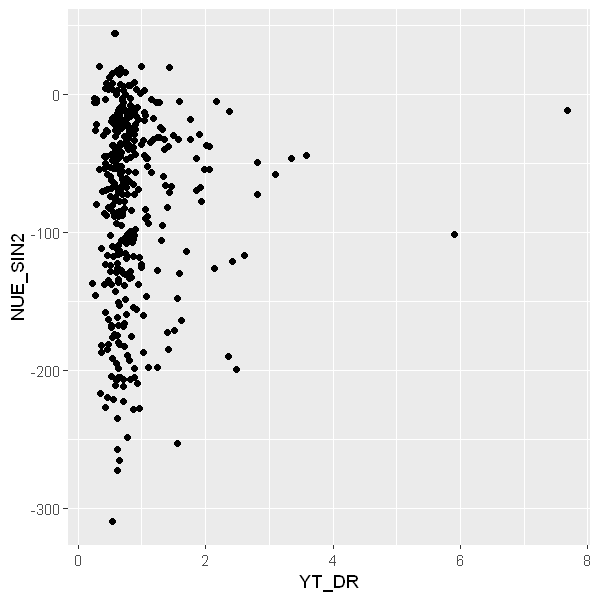

In [65]:
options(repr.plot.width = 5, repr.plot.height = 5)
df_blup[c(106+2, 626 + 2)] %>% ggplot(aes(YT_DR, NUE_SIN2)) + geom_point()

Warning message:
"Removed 3 rows containing missing values (geom_point)."


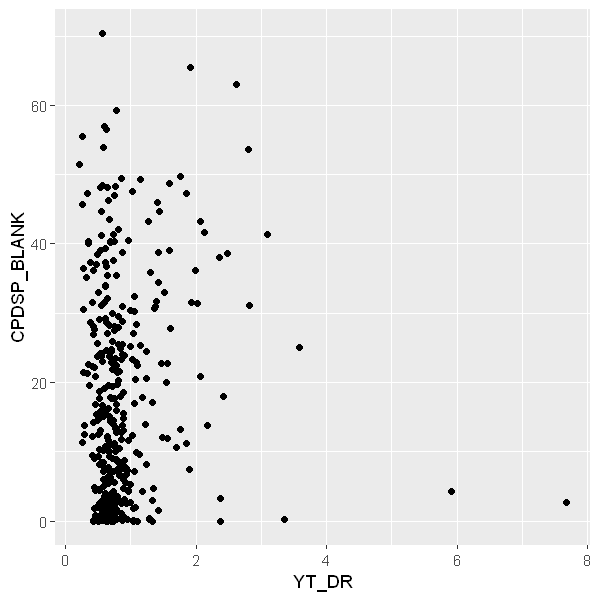

In [68]:
options(repr.plot.width = 5, repr.plot.height = 5)
df_blup[c(106+2, 633 + 2)] %>% ggplot(aes(YT_DR, CPDSP_BLANK)) + geom_point()

In [69]:
df_blup[c(106+2, 635 + 2)]

YT_DR,DW_BLANK
<dbl>,<dbl>
0.8093449,0.5480000
1.3529995,0.5043333
0.9669369,0.5900000
1.1095391,0.5796667
0.7827747,0.4930000
0.9894443,0.5930000
0.7328223,0.6703333
0.9639650,0.5106667
0.5735788,0.4853333


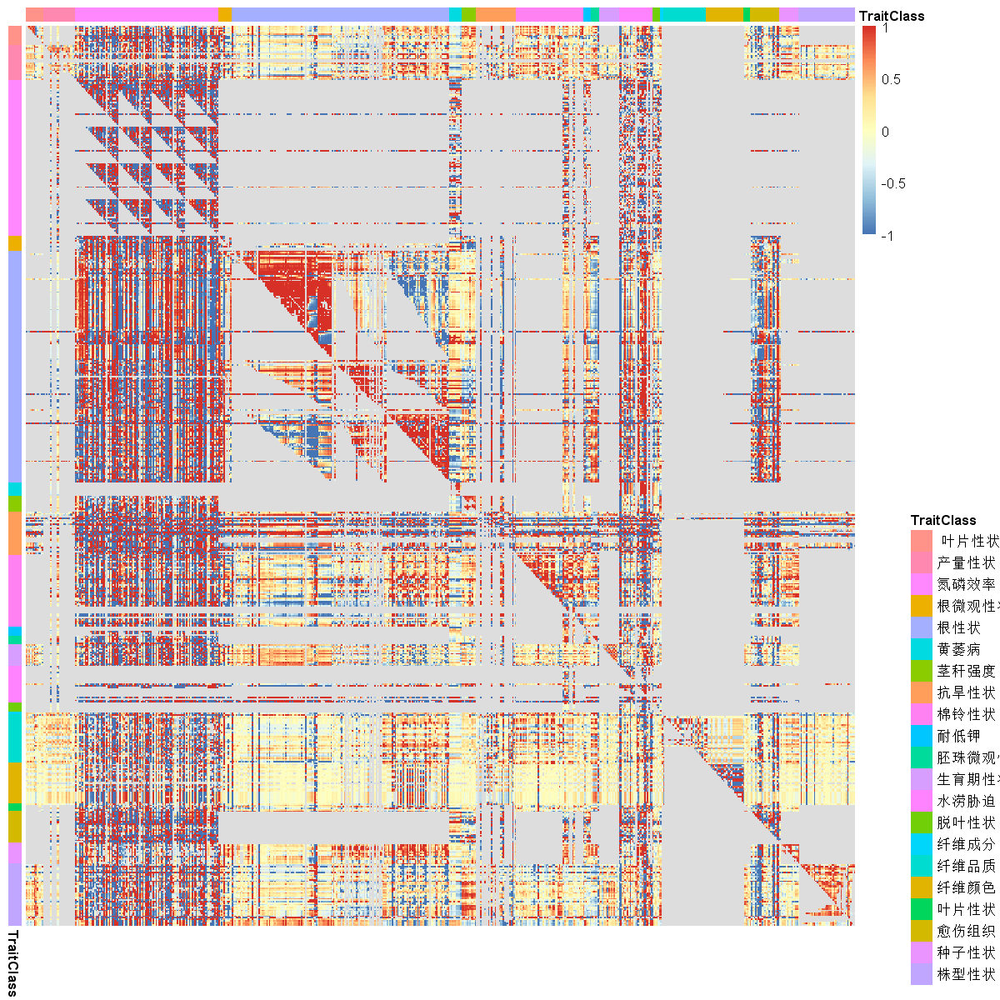

In [166]:
# generate heatmap input
df_rg %>% 
mutate(Trait_idx_1 = as.integer(Trait_idx_1)) %>% 
mutate(Trait_idx_2 = as.integer(Trait_idx_2)) %>% 
mutate(Trait1 = triat_vec[Trait_idx_1]) %>% 
mutate(Trait2 = triat_vec[Trait_idx_2]) %>% 
subset(Trait_idx_1 < Trait_idx_2) %>% 
.[c('Trait1', 'Trait2', 'rG')] %>% 
spread(Trait2, rG) %>% 
column_to_rownames('Trait1') -> rG_matrix


plot_pheatmap <- function(df, df_trait_class){
    trait_order <- df_trait_class %>% arrange(性状分类1) %>% .$TraitID
    
    ordered_row = setdiff(trait_order, setdiff(trait_order, rownames(df)))
    ordered_col = setdiff(trait_order, setdiff(trait_order, colnames(df)))
    data = df[ordered_row,  ordered_col]
    
    row_trait_class <- df_trait_class %>% subset(TraitID %in% rownames(df)) %>% distinct(TraitID, .keep_all = T) %>% arrange(性状分类1) %>% .$性状分类1
    col_trait_class <- df_trait_class %>% subset(TraitID %in% colnames(df)) %>% distinct(TraitID, .keep_all = T) %>% arrange(性状分类1) %>% .$性状分类1

    annotation_row <- data.frame(TraitClass = row_trait_class)
    rownames(annotation_row) <- ordered_row
    annotation_col <- data.frame(TraitClass = col_trait_class)
    rownames(annotation_col) <- ordered_col
    
    require(pheatmap)
    options(repr.plot.width = 10, repr.plot.height = 10)
    p <- data %>% 
        pheatmap(cluster_rows = FALSE,
                 cluster_cols = FALSE,
                 annotation_row = annotation_row,
                 annotation_col = annotation_col,
                 show_rownames = F, 
                 show_colnames = F)
    return(p)
}

plot_pheatmap(rG_matrix, df_trait_class)

In [116]:
?pheatmap

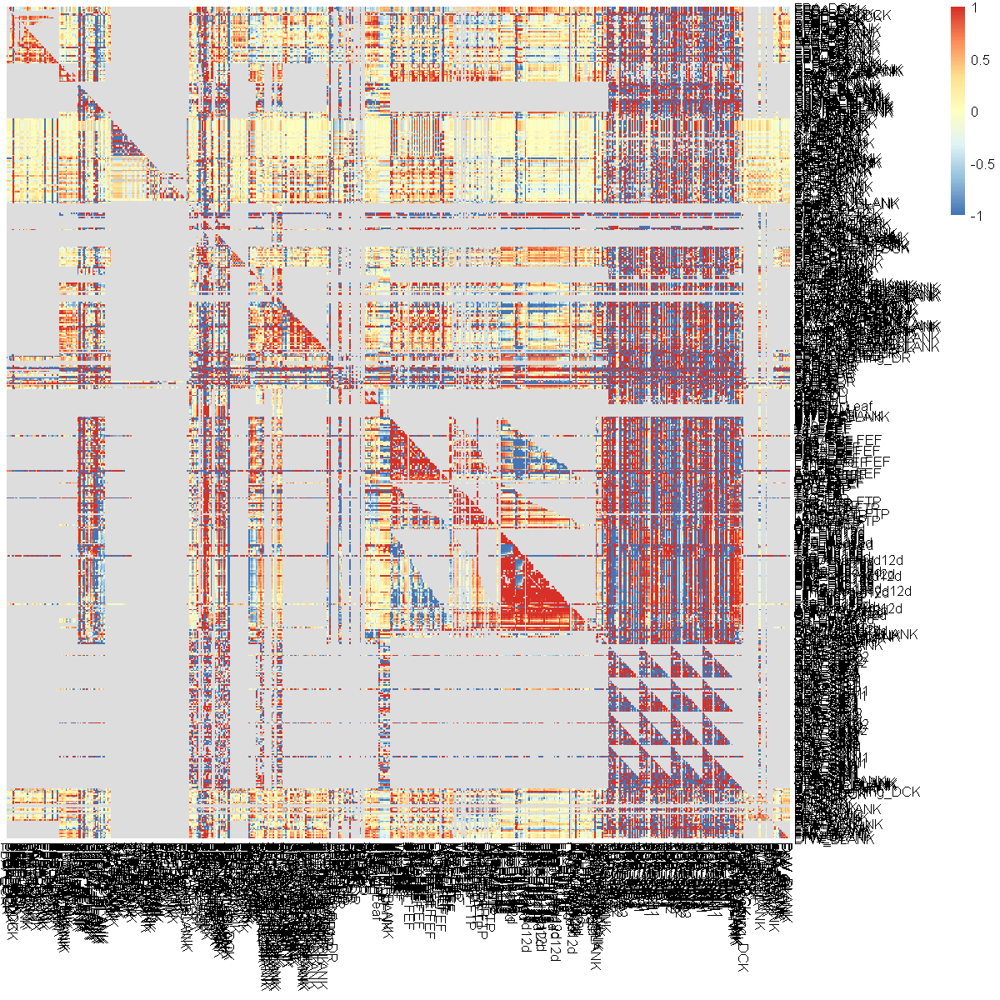

In [106]:
rG_matrix[rev(setdiff(trait_vec_ordered, setdiff(trait_vec_ordered, rownames(rG_matrix)))),
          rev(setdiff(trait_vec_ordered, setdiff(trait_vec_ordered, colnames(rG_matrix))))] %>% 
pheatmap(., 
#          scale = 'row',
         cluster_rows = FALSE,
         cluster_cols = FALSE)

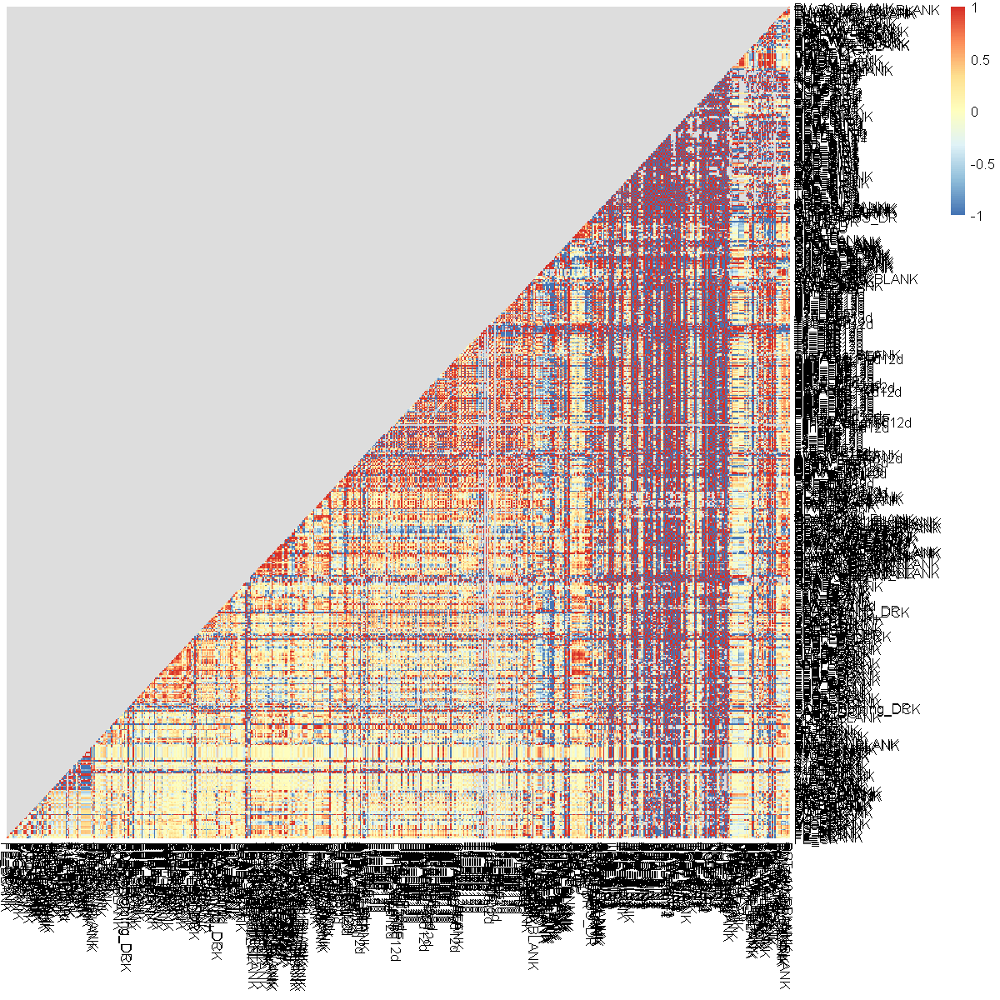

In [100]:
rG_matrix[rev(setdiff(triat_vec, setdiff(triat_vec, rownames(rG_matrix)))),
          setdiff(triat_vec, setdiff(triat_vec, colnames(rG_matrix)))] %>% 
pheatmap(., 
#          scale = 'row',
         cluster_rows = FALSE,
         cluster_cols = FALSE)

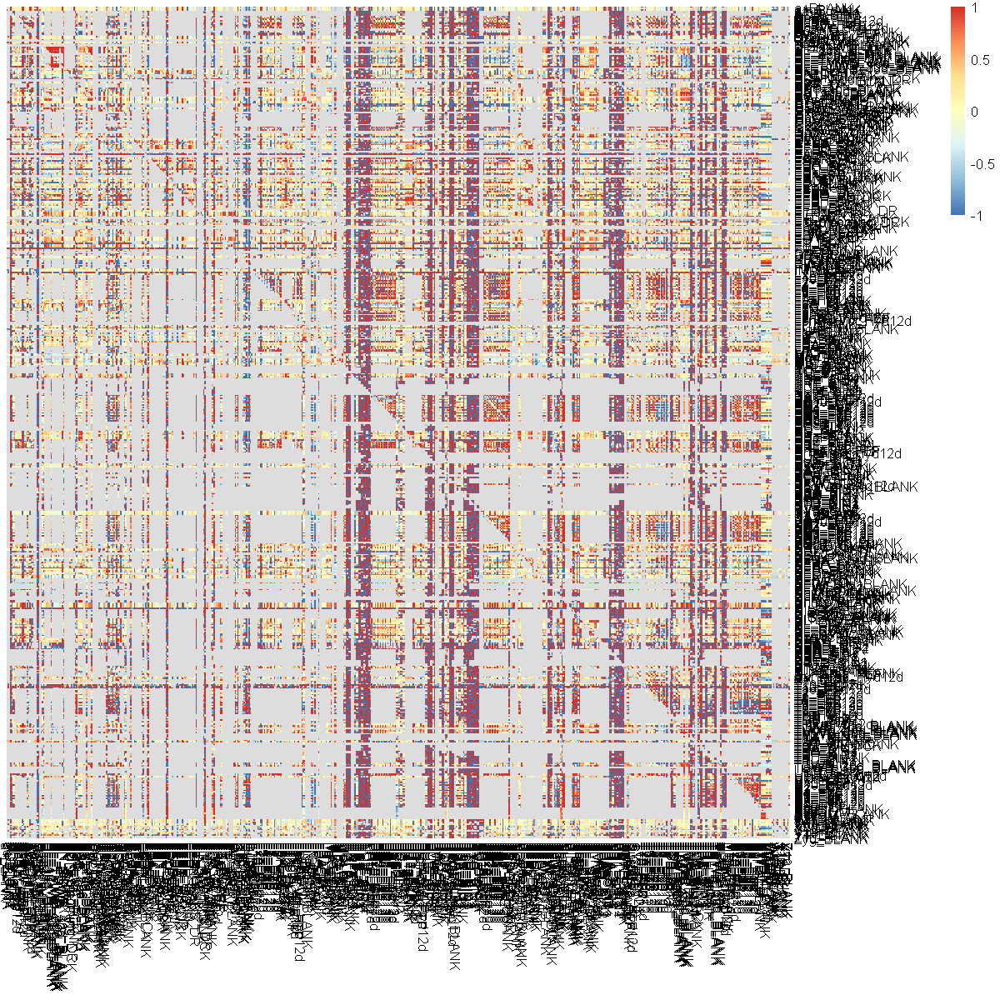

In [78]:



options(repr.plot.width = 10, repr.plot.height = 10)

dist_no_na <- function(mat) {
    edist <- dist(mat)
    edist[which(is.na(edist))] <- max(edist, na.rm=TRUE) * 1.1 
    return(edist)
    }

# pheatmap(as.matrix(rG_matrix))


pheatmap(rG_matrix, 
        cluster_rows = FALSE,
        cluster_cols = FALSE)



# pheatmap( as.matrix(rG_matrix), 
# #         scale = "row",
# #           cluster_rows = FALSE,
# #           cluster_cols = FALSE,
# # #           col = Colors,
# #            trace = "none", 
# #            xlab = "Comparison",
# #            scale = c("none"),
# #            na.color="gray",
# #            dendrogram = "row", 
# #            Colv = FALSE,
#            distfun=dist_no_na)

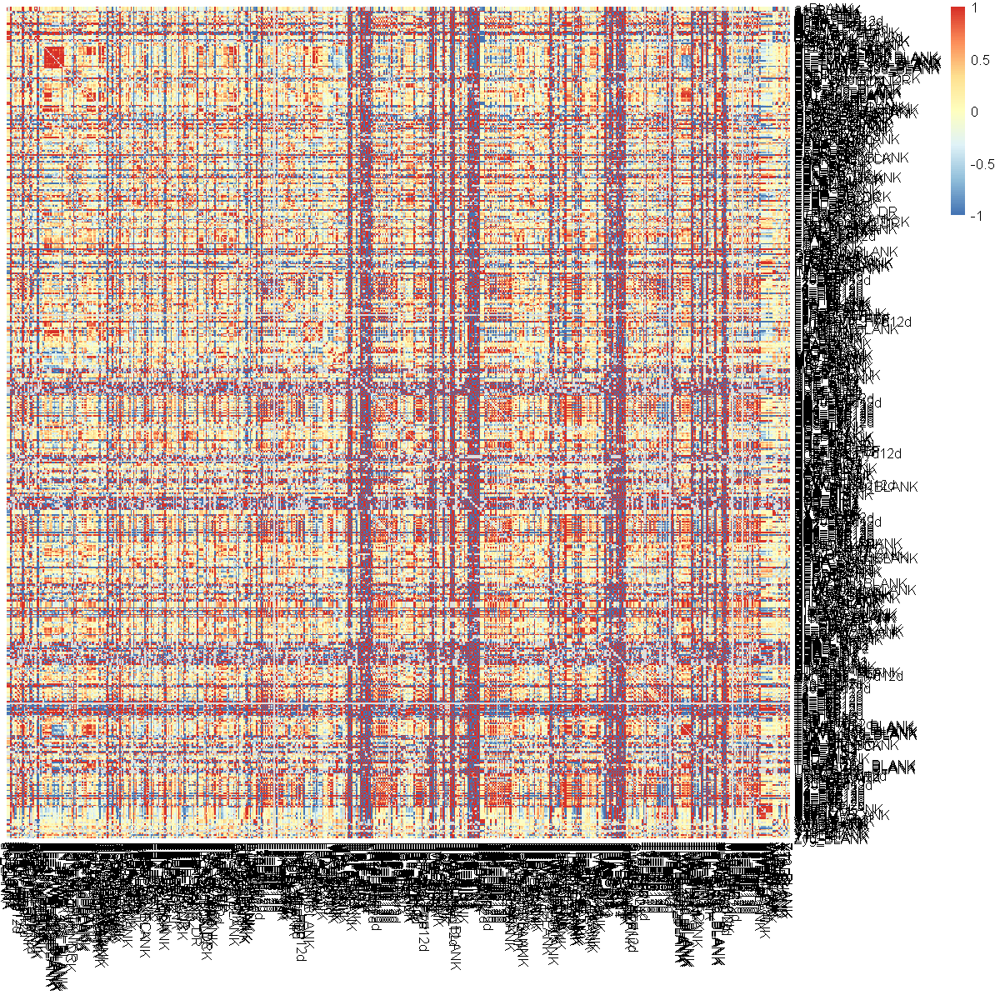

In [77]:
df_rg %>% 
mutate(Trait_idx_1 = as.integer(Trait_idx_1)) %>% 
mutate(Trait_idx_2 = as.integer(Trait_idx_2)) %>% 
mutate(Trait1 = triat_vec[Trait_idx_1]) %>% 
mutate(Trait2 = triat_vec[Trait_idx_2]) %>% 
# subset(Trait_idx_1 < Trait_idx_2) %>% 
.[c('Trait1', 'Trait2', 'rG')] %>% 
spread(Trait2, rG) %>% 
column_to_rownames('Trait1') -> rG_matrix


require(pheatmap)
options(repr.plot.width = 10, repr.plot.height = 10)

dist_no_na <- function(mat) {
    edist <- dist(mat)
    edist[which(is.na(edist))] <- max(edist, na.rm=TRUE) * 1.1 
    return(edist)
    }

# pheatmap(as.matrix(rG_matrix))


pheatmap(rG_matrix, 
        cluster_rows = FALSE,
        cluster_cols = FALSE)



# pheatmap( as.matrix(rG_matrix), 
# #         scale = "row",
# #           cluster_rows = FALSE,
# #           cluster_cols = FALSE,
# # #           col = Colors,
# #            trace = "none", 
# #            xlab = "Comparison",
# #            scale = c("none"),
# #            na.color="gray",
# #            dendrogram = "row", 
# #            Colv = FALSE,
#            distfun=dist_no_na)

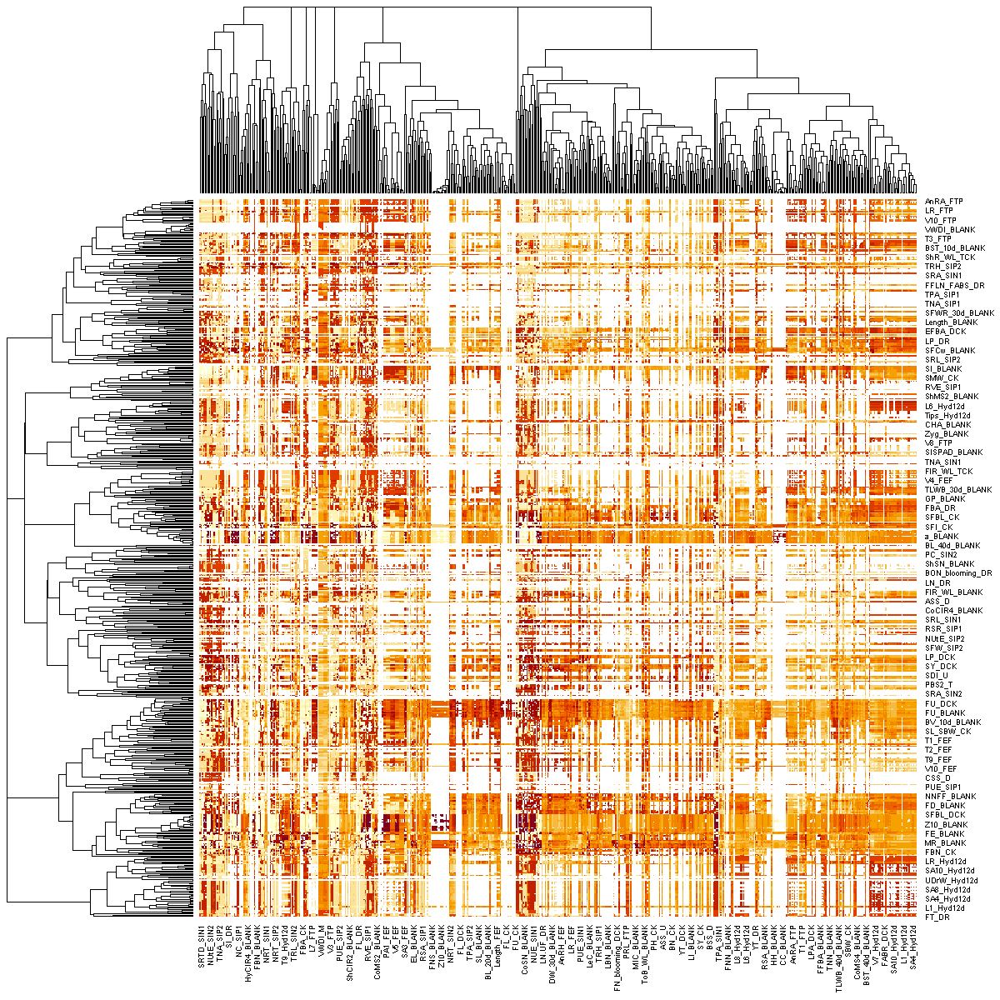

In [64]:
df_rg %>% 
mutate(Trait_idx_1 = as.integer(Trait_idx_1)) %>% 
mutate(Trait_idx_2 = as.integer(Trait_idx_2)) %>% 
mutate(Trait1 = triat_vec[Trait_idx_1]) %>% 
mutate(Trait2 = triat_vec[Trait_idx_2]) %>% 
subset(Trait_idx_1 < Trait_idx_2) %>% 
.[c('Trait1', 'Trait2', 'rG')] %>% 
spread(Trait2, rG) %>% 
column_to_rownames('Trait1') -> rG_matrix


require(pheatmap)
options(repr.plot.width = 10, repr.plot.height = 10)

dist_no_na <- function(mat) {
    edist <- dist(mat)
    edist[which(is.na(edist))] <- max(edist, na.rm=TRUE) * 1.1 
    return(edist)
    }

heatmap( as.matrix(rG_matrix), 
        scale = "row",
#           col = Colors,
#            trace = "none", 
#            xlab = "Comparison",
#            scale = c("none"),
#            na.color="gray",
#            dendrogram = "row", 
#            Colv = FALSE,
           distfun=dist_no_na)



### Test code

#### Understanding of small random effect
https://stackoverflow.com/questions/60028673/lme4-error-boundary-singular-fit-see-issingular

In [27]:
# input data
Data = structure(list(Line = structure(c(1L, 1L, 1L, 1L, 12L, 12L, 12L, 
12L, 23L, 23L, 23L, 23L, 34L, 34L, 34L, 34L, 45L, 45L, 45L, 45L, 
56L, 56L, 56L, 56L, 65L, 65L, 65L, 65L, 66L, 66L, 66L, 66L, 67L, 
67L, 67L, 67L, 2L, 2L, 2L, 2L, 3L, 3L, 3L, 3L, 4L, 4L, 4L, 4L, 
5L, 5L, 5L, 5L, 6L, 6L, 6L, 6L, 7L, 7L, 7L, 7L, 8L, 8L, 8L, 8L, 
9L, 9L, 9L, 9L, 10L, 10L, 10L, 10L, 11L, 11L, 11L, 11L, 13L, 
13L, 13L, 13L, 14L, 14L, 14L, 14L, 15L, 15L, 15L, 15L, 16L, 16L, 
16L, 16L, 8L, 8L, 8L, 8L, 66L, 66L, 66L, 66L, 17L, 17L, 17L, 
17L, 18L, 18L, 18L, 18L, 9L, 9L, 9L, 9L, 19L, 19L, 19L, 19L, 
20L, 20L, 20L, 20L, 21L, 21L, 21L, 21L, 22L, 22L, 22L, 22L, 24L, 
24L, 24L, 24L, 25L, 25L, 25L, 25L, 2L, 2L, 2L, 2L, 26L, 26L, 
26L, 26L, 27L, 27L, 27L, 27L, 10L, 10L, 10L, 10L, 28L, 28L, 28L, 
28L, 29L, 29L, 29L, 29L, 30L, 30L, 30L, 30L, 31L, 31L, 31L, 31L, 
67L, 67L, 67L, 67L, 32L, 32L, 32L, 32L, 32L, 32L, 32L, 32L, 33L, 
33L, 33L, 33L, 35L, 35L, 35L, 35L, 36L, 36L, 36L, 36L, 37L, 37L, 
37L, 37L, 38L, 38L, 38L, 38L, 39L, 39L, 39L, 39L, 40L, 40L, 40L, 
40L, 25L, 25L, 25L, 25L, 19L, 19L, 19L, 19L, 24L, 24L, 24L, 24L, 
41L, 41L, 41L, 41L, 42L, 42L, 42L, 42L, 30L, 30L, 30L, 30L, 43L, 
43L, 43L, 43L, 44L, 44L, 44L, 44L, 22L, 22L, 22L, 22L, 46L, 46L, 
46L, 46L, 47L, 47L, 47L, 47L, 17L, 17L, 17L, 17L, 48L, 48L, 48L, 
48L, 49L, 49L, 49L, 49L, 27L, 27L, 27L, 27L, 23L, 23L, 23L, 23L, 
50L, 50L, 50L, 50L, 51L, 51L, 51L, 51L, 52L, 52L, 52L, 52L, 41L, 
41L, 41L, 41L, 7L, 7L, 7L, 7L, 46L, 46L, 46L, 46L, 11L, 11L, 
11L, 11L, 33L, 33L, 33L, 33L, 53L, 53L, 53L, 53L, 54L, 54L, 54L, 
54L, 13L, 13L, 13L, 13L, 38L, 38L, 38L, 38L, 4L, 4L, 4L, 4L, 
37L, 37L, 37L, 37L, 55L, 55L, 55L, 55L, 57L, 57L, 57L, 57L, 44L, 
44L, 44L, 44L, 58L, 58L, 58L, 58L, 59L, 59L, 59L, 59L, 12L, 12L, 
12L, 12L, 47L, 47L, 47L, 47L, 48L, 48L, 48L, 48L, 60L, 60L, 60L, 
60L, 21L, 21L, 21L, 21L, 18L, 18L, 18L, 18L, 28L, 28L, 28L, 28L, 
26L, 26L, 26L, 26L, 61L, 61L, 61L, 61L, 31L, 31L, 31L, 31L, 59L, 
59L, 59L, 59L, 52L, 52L, 52L, 52L, 29L, 29L, 29L, 29L, 62L, 62L, 
62L, 62L, 63L, 63L, 63L, 63L, 54L, 54L, 54L, 54L, 55L, 55L, 55L, 
55L, 53L, 53L, 53L, 53L, 51L, 51L, 51L, 51L, 50L, 50L, 50L, 50L, 
64L, 64L, 64L, 64L, 20L, 20L, 20L, 20L, 58L, 58L, 58L, 58L, 16L, 
16L, 16L, 16L, 57L, 57L, 57L, 57L, 14L, 14L, 14L, 14L, 63L, 63L, 
63L, 63L, 64L, 64L, 64L, 64L, 61L, 61L, 61L, 61L, 36L, 36L, 36L, 
36L, 40L, 40L, 40L, 40L, 6L, 6L, 6L, 6L, 39L, 39L, 39L, 39L, 
45L, 45L, 45L, 45L, 15L, 15L, 15L, 15L, 1L, 1L, 1L, 1L, 42L, 
42L, 42L, 42L, 43L, 43L, 43L, 43L, 65L, 65L, 65L, 65L, 49L, 49L, 
49L, 49L, 56L, 56L, 56L, 56L, 3L, 3L, 3L, 3L, 62L, 62L, 62L, 
62L, 35L, 35L, 35L, 35L, 5L, 5L, 5L, 5L, 60L, 60L, 60L, 60L, 
34L, 34L, 34L, 34L), .Label = c("Line1", "Line10", "Line11", 
"Line12", "Line13", "Line14", "Line15", "Line16", "Line17", "Line18", 
"Line19", "Line2", "Line20", "Line21", "Line22", "Line23", "Line24", 
"Line25", "Line26", "Line27", "Line28", "Line29", "Line3", "Line30", 
"Line31", "Line32", "Line33", "Line34", "Line35", "Line36", "Line37", 
"Line38", "Line39", "Line4", "Line40", "Line41", "Line42", "Line43", 
"Line44", "Line45", "Line46", "Line47", "Line48", "Line49", "Line5", 
"Line50", "Line51", "Line52", "Line53", "Line54", "Line55", "Line56", 
"Line57", "Line58", "Line59", "Line6", "Line60", "Line61", "Line62", 
"Line63", "Line64", "Line65", "Line66", "Line67", "Line7", "Line8", 
"Line9"), class = "factor"), Rep = structure(c(1L, 1L, 1L, 1L, 
1L, 1L, 1L, 1L, 1L, 1L, 1L, 1L, 1L, 1L, 1L, 1L, 1L, 1L, 1L, 1L, 
1L, 1L, 1L, 1L, 1L, 1L, 1L, 1L, 1L, 1L, 1L, 1L, 1L, 1L, 1L, 1L, 
1L, 1L, 1L, 1L, 1L, 1L, 1L, 1L, 1L, 1L, 1L, 1L, 1L, 1L, 1L, 1L, 
1L, 1L, 1L, 1L, 1L, 1L, 1L, 1L, 1L, 1L, 1L, 1L, 1L, 1L, 1L, 1L, 
1L, 1L, 1L, 1L, 1L, 1L, 1L, 1L, 1L, 1L, 1L, 1L, 1L, 1L, 1L, 1L, 
1L, 1L, 1L, 1L, 2L, 2L, 2L, 2L, 2L, 2L, 2L, 2L, 2L, 2L, 2L, 2L, 
2L, 2L, 2L, 2L, 2L, 2L, 2L, 2L, 2L, 2L, 2L, 2L, 2L, 2L, 2L, 2L, 
2L, 2L, 2L, 2L, 2L, 2L, 2L, 2L, 2L, 2L, 2L, 2L, 2L, 2L, 2L, 2L, 
2L, 2L, 2L, 2L, 2L, 2L, 2L, 2L, 2L, 2L, 2L, 2L, 2L, 2L, 2L, 2L, 
2L, 2L, 2L, 2L, 2L, 2L, 2L, 2L, 2L, 2L, 2L, 2L, 2L, 2L, 2L, 2L, 
2L, 2L, 2L, 2L, 2L, 2L, 2L, 2L, 2L, 2L, 2L, 2L, 1L, 1L, 1L, 1L, 
1L, 1L, 1L, 1L, 1L, 1L, 1L, 1L, 1L, 1L, 1L, 1L, 1L, 1L, 1L, 1L, 
1L, 1L, 1L, 1L, 1L, 1L, 1L, 1L, 1L, 1L, 1L, 1L, 1L, 1L, 1L, 1L, 
1L, 1L, 1L, 1L, 1L, 1L, 1L, 1L, 1L, 1L, 1L, 1L, 1L, 1L, 1L, 1L, 
1L, 1L, 1L, 1L, 1L, 1L, 1L, 1L, 1L, 1L, 1L, 1L, 1L, 1L, 1L, 1L, 
1L, 1L, 1L, 1L, 1L, 1L, 1L, 1L, 1L, 1L, 1L, 1L, 1L, 1L, 1L, 1L, 
1L, 1L, 1L, 1L, 1L, 1L, 1L, 1L, 2L, 2L, 2L, 2L, 2L, 2L, 2L, 2L, 
2L, 2L, 2L, 2L, 2L, 2L, 2L, 2L, 2L, 2L, 2L, 2L, 2L, 2L, 2L, 2L, 
2L, 2L, 2L, 2L, 2L, 2L, 2L, 2L, 2L, 2L, 2L, 2L, 2L, 2L, 2L, 2L, 
2L, 2L, 2L, 2L, 2L, 2L, 2L, 2L, 2L, 2L, 2L, 2L, 2L, 2L, 2L, 2L, 
2L, 2L, 2L, 2L, 2L, 2L, 2L, 2L, 2L, 2L, 2L, 2L, 2L, 2L, 2L, 2L, 
2L, 2L, 2L, 2L, 2L, 2L, 2L, 2L, 2L, 2L, 2L, 2L, 2L, 2L, 2L, 2L, 
2L, 2L, 2L, 2L, 1L, 1L, 1L, 1L, 1L, 1L, 1L, 1L, 1L, 1L, 1L, 1L, 
1L, 1L, 1L, 1L, 1L, 1L, 1L, 1L, 1L, 1L, 1L, 1L, 1L, 1L, 1L, 1L, 
1L, 1L, 1L, 1L, 1L, 1L, 1L, 1L, 1L, 1L, 1L, 1L, 1L, 1L, 1L, 1L, 
1L, 1L, 1L, 1L, 1L, 1L, 1L, 1L, 1L, 1L, 1L, 1L, 1L, 1L, 1L, 1L, 
1L, 1L, 1L, 1L, 1L, 1L, 1L, 1L, 1L, 1L, 1L, 1L, 1L, 1L, 1L, 1L, 
1L, 1L, 1L, 1L, 1L, 1L, 1L, 1L, 1L, 1L, 1L, 1L, 2L, 2L, 2L, 2L, 
2L, 2L, 2L, 2L, 2L, 2L, 2L, 2L, 2L, 2L, 2L, 2L, 2L, 2L, 2L, 2L, 
2L, 2L, 2L, 2L, 2L, 2L, 2L, 2L, 2L, 2L, 2L, 2L, 2L, 2L, 2L, 2L, 
2L, 2L, 2L, 2L, 2L, 2L, 2L, 2L, 2L, 2L, 2L, 2L, 2L, 2L, 2L, 2L, 
2L, 2L, 2L, 2L, 2L, 2L, 2L, 2L, 2L, 2L, 2L, 2L, 2L, 2L, 2L, 2L, 
2L, 2L, 2L, 2L, 2L, 2L, 2L, 2L, 2L, 2L, 2L, 2L, 2L, 2L, 2L, 2L, 
2L, 2L, 2L, 2L), .Label = c("1", "2"), class = "factor"), Weight = c(NA, 
NA, NA, NA, 26L, 26L, 26L, 27L, NA, NA, NA, NA, 26L, 28L, 26L, 
25L, 22L, 17L, 20L, 20L, 28L, 20L, 27L, 26L, 22L, 25L, 21L, 25L, 
18L, 18L, 19L, 18L, 24L, 28L, 23L, 30L, 29L, 25L, 26L, 27L, NA, 
NA, NA, NA, 29L, 30L, 29L, 30L, NA, NA, NA, NA, 33L, NA, NA, 
NA, 21L, 23L, 18L, 23L, 32L, 29L, 30L, 30L, 18L, 19L, 21L, 21L, 
25L, 25L, 25L, 26L, 26L, 27L, NA, NA, 29L, 29L, 27L, 29L, 26L, 
NA, NA, NA, 26L, 20L, 23L, 27L, NA, NA, NA, NA, 32L, 32L, 30L, 
30L, 20L, 20L, 20L, 19L, 22L, 21L, 22L, 22L, 24L, 23L, 23L, 25L, 
20L, 25L, NA, NA, 27L, 26L, NA, NA, NA, NA, NA, NA, 30L, 28L, 
NA, NA, 25L, 26L, 27L, 26L, NA, NA, NA, NA, 20L, 19L, NA, NA, 
19L, 27L, 26L, 29L, 26L, 29L, 31L, 29L, 25L, 25L, 24L, 25L, 26L, 
25L, 26L, 26L, 25L, 24L, 24L, 28L, 22L, 26L, 24L, 28L, 29L, 30L, 
26L, NA, NA, NA, NA, NA, 26L, 24L, 24L, 24L, NA, NA, NA, NA, 
NA, NA, NA, NA, 30L, 30L, 30L, 31L, 24L, 25L, 28L, 22L, 28L, 
31L, 30L, NA, 31L, 30L, 29L, 25L, 25L, 22L, 24L, 20L, 30L, 30L, 
30L, 29L, 26L, 32L, 28L, 29L, 20L, 15L, 15L, 11L, 25L, 24L, 24L, 
24L, 26L, 29L, 31L, 30L, 24L, 28L, 20L, 22L, 29L, 26L, 26L, 28L, 
27L, 27L, 27L, 26L, 21L, 22L, 21L, NA, 28L, 29L, 24L, 24L, 28L, 
29L, 28L, 27L, 28L, 29L, 27L, 29L, NA, NA, NA, NA, 22L, 26L, 
21L, 21L, 26L, 30L, 28L, 30L, 27L, 26L, 28L, 26L, 25L, 25L, 26L, 
26L, 27L, 26L, 23L, 29L, NA, NA, NA, NA, 27L, 23L, 29L, 23L, 
28L, 29L, 28L, 26L, 20L, NA, NA, NA, 28L, 23L, 26L, 21L, 28L, 
26L, 26L, 29L, 20L, 27L, 20L, 26L, 29L, 26L, 28L, 28L, 30L, 27L, 
NA, NA, 26L, 21L, 26L, 25L, 27L, 26L, 27L, 24L, 25L, 20L, 21L, 
20L, 25L, 25L, 31L, 24L, 29L, 28L, 31L, 27L, 25L, 28L, 26L, 26L, 
NA, NA, NA, NA, 24L, 25L, 23L, 27L, 20L, 26L, 25L, 25L, 29L, 
28L, 29L, 29L, 26L, 27L, 25L, 28L, NA, NA, NA, NA, 26L, 28L, 
NA, NA, 21L, 20L, 31L, 25L, 31L, 28L, 30L, 29L, 23L, 25L, 24L, 
28L, 25L, 22L, 25L, 25L, 28L, 29L, 28L, 29L, 26L, 24L, 25L, 26L, 
29L, 27L, NA, NA, 26L, 29L, 29L, 30L, 25L, 24L, 25L, 24L, 28L, 
25L, 29L, 28L, 24L, 24L, 24L, 24L, 28L, 30L, 27L, 27L, 26L, 25L, 
25L, 25L, 25L, 25L, 28L, 25L, 25L, 30L, 28L, 25L, 22L, 24L, 25L, 
24L, NA, NA, NA, NA, 5L, 7L, 4L, 5L, 21L, 20L, 22L, 24L, 25L, 
27L, 25L, 28L, 32L, 31L, NA, NA, 19L, 26L, 20L, NA, 26L, 26L, 
30L, 25L, 28L, 31L, 30L, 26L, 5L, 8L, 4L, 8L, 25L, 25L, 28L, 
25L, 28L, 28L, 27L, 26L, 30L, 27L, 27L, 24L, 32L, 29L, 31L, 25L, 
30L, 30L, 27L, 28L, 16L, 20L, 16L, 21L, 25L, 22L, 25L, 20L, 24L, 
25L, 18L, 25L, 25L, 26L, 29L, 29L, 21L, 20L, 22L, 21L, 19L, 22L, 
19L, 21L, 28L, 25L, 26L, 24L, 28L, 26L, 24L, 25L, NA, NA, NA, 
NA, 25L, NA, NA, NA, 23L, 21L, 19L, 23L, 25L, 24L, 25L, NA, 22L, 
30L, 29L, 26L, 25L, 25L, 24L, 24L), PLANT = structure(c(1L, 2L, 
3L, 4L, 1L, 2L, 3L, 4L, 1L, 2L, 3L, 4L, 1L, 2L, 3L, 4L, 1L, 2L, 
3L, 4L, 1L, 2L, 3L, 4L, 1L, 2L, 3L, 4L, 1L, 2L, 3L, 4L, 1L, 2L, 
3L, 4L, 1L, 2L, 3L, 4L, 1L, 2L, 3L, 4L, 1L, 2L, 3L, 4L, 1L, 2L, 
3L, 4L, 1L, 2L, 3L, 4L, 1L, 2L, 3L, 4L, 1L, 2L, 3L, 4L, 1L, 2L, 
3L, 4L, 1L, 2L, 3L, 4L, 1L, 2L, 3L, 4L, 1L, 2L, 3L, 4L, 1L, 2L, 
3L, 4L, 1L, 2L, 3L, 4L, 1L, 2L, 3L, 4L, 1L, 2L, 3L, 4L, 1L, 2L, 
3L, 4L, 1L, 2L, 3L, 4L, 1L, 2L, 3L, 4L, 1L, 2L, 3L, 4L, 1L, 2L, 
3L, 4L, 1L, 2L, 3L, 4L, 1L, 2L, 3L, 4L, 1L, 2L, 3L, 4L, 1L, 2L, 
3L, 4L, 1L, 2L, 3L, 4L, 1L, 2L, 3L, 4L, 1L, 2L, 3L, 4L, 1L, 2L, 
3L, 4L, 1L, 2L, 3L, 4L, 1L, 2L, 3L, 4L, 1L, 2L, 3L, 4L, 1L, 2L, 
3L, 4L, 1L, 2L, 3L, 4L, 1L, 2L, 3L, 4L, 1L, 2L, 3L, 4L, 1L, 2L, 
3L, 4L, 1L, 2L, 3L, 4L, 1L, 2L, 3L, 4L, 1L, 2L, 3L, 4L, 1L, 2L, 
3L, 4L, 1L, 2L, 3L, 4L, 1L, 2L, 3L, 4L, 1L, 2L, 3L, 4L, 1L, 2L, 
3L, 4L, 1L, 2L, 3L, 4L, 1L, 2L, 3L, 4L, 1L, 2L, 3L, 4L, 1L, 2L, 
3L, 4L, 1L, 2L, 3L, 4L, 1L, 2L, 3L, 4L, 1L, 2L, 3L, 4L, 1L, 2L, 
3L, 4L, 1L, 2L, 3L, 4L, 1L, 2L, 3L, 4L, 1L, 2L, 3L, 4L, 1L, 2L, 
3L, 4L, 1L, 2L, 3L, 4L, 1L, 2L, 3L, 4L, 1L, 2L, 3L, 4L, 1L, 2L, 
3L, 4L, 1L, 2L, 3L, 4L, 1L, 2L, 3L, 4L, 1L, 2L, 3L, 4L, 1L, 2L, 
3L, 4L, 1L, 2L, 3L, 4L, 1L, 2L, 3L, 4L, 1L, 2L, 3L, 4L, 1L, 2L, 
3L, 4L, 1L, 2L, 3L, 4L, 1L, 2L, 3L, 4L, 1L, 2L, 3L, 4L, 1L, 2L, 
3L, 4L, 1L, 2L, 3L, 4L, 1L, 2L, 3L, 4L, 1L, 2L, 3L, 4L, 1L, 2L, 
3L, 4L, 1L, 2L, 3L, 4L, 1L, 2L, 3L, 4L, 1L, 2L, 3L, 4L, 1L, 2L, 
3L, 4L, 1L, 2L, 3L, 4L, 1L, 2L, 3L, 4L, 1L, 2L, 3L, 4L, 1L, 2L, 
3L, 4L, 1L, 2L, 3L, 4L, 1L, 2L, 3L, 4L, 1L, 2L, 3L, 4L, 1L, 2L, 
3L, 4L, 1L, 2L, 3L, 4L, 1L, 2L, 3L, 4L, 1L, 2L, 3L, 4L, 1L, 2L, 
3L, 4L, 1L, 2L, 3L, 4L, 1L, 2L, 3L, 4L, 1L, 2L, 3L, 4L, 1L, 2L, 
3L, 4L, 1L, 2L, 3L, 4L, 1L, 2L, 3L, 4L, 1L, 2L, 3L, 4L, 1L, 2L, 
3L, 4L, 1L, 2L, 3L, 4L, 1L, 2L, 3L, 4L, 1L, 2L, 3L, 4L, 1L, 2L, 
3L, 4L, 1L, 2L, 3L, 4L, 1L, 2L, 3L, 4L, 1L, 2L, 3L, 4L, 1L, 2L, 
3L, 4L, 1L, 2L, 3L, 4L, 1L, 2L, 3L, 4L, 1L, 2L, 3L, 4L, 1L, 2L, 
3L, 4L, 1L, 2L, 3L, 4L, 1L, 2L, 3L, 4L, 1L, 2L, 3L, 4L, 1L, 2L, 
3L, 4L, 1L, 2L, 3L, 4L, 1L, 2L, 3L, 4L, 1L, 2L, 3L, 4L, 1L, 2L, 
3L, 4L, 1L, 2L, 3L, 4L, 1L, 2L, 3L, 4L, 1L, 2L, 3L, 4L, 1L, 2L, 
3L, 4L, 1L, 2L, 3L, 4L), .Label = c("1", "2", "3", "4"), class = "factor"), 
    X = structure(c(4L, 2L, 5L, 6L, 4L, 2L, 5L, 6L, 4L, 2L, 5L, 
    6L, 4L, 2L, 5L, 6L, 4L, 2L, 5L, 6L, 4L, 2L, 5L, 6L, 4L, 2L, 
    5L, 6L, 4L, 2L, 5L, 6L, 4L, 2L, 5L, 6L, 4L, 2L, 5L, 6L, 4L, 
    2L, 5L, 6L, 4L, 2L, 5L, 6L, 4L, 2L, 5L, 6L, 4L, 2L, 5L, 6L, 
    4L, 2L, 5L, 6L, 4L, 2L, 5L, 6L, 4L, 2L, 5L, 6L, 4L, 2L, 5L, 
    6L, 4L, 2L, 5L, 6L, 4L, 2L, 5L, 6L, 4L, 2L, 5L, 6L, 4L, 2L, 
    5L, 6L, 3L, 7L, 8L, 1L, 3L, 7L, 8L, 1L, 3L, 7L, 8L, 1L, 3L, 
    7L, 8L, 1L, 3L, 7L, 8L, 1L, 3L, 7L, 8L, 1L, 3L, 7L, 8L, 1L, 
    3L, 7L, 8L, 1L, 3L, 7L, 8L, 1L, 3L, 7L, 8L, 1L, 3L, 7L, 8L, 
    1L, 3L, 7L, 8L, 1L, 3L, 7L, 8L, 1L, 3L, 7L, 8L, 1L, 3L, 7L, 
    8L, 1L, 3L, 7L, 8L, 1L, 3L, 7L, 8L, 1L, 3L, 7L, 8L, 1L, 3L, 
    7L, 8L, 1L, 3L, 7L, 8L, 1L, 3L, 7L, 8L, 1L, 3L, 7L, 8L, 1L, 
    4L, 2L, 5L, 6L, 4L, 2L, 5L, 6L, 4L, 2L, 5L, 6L, 4L, 2L, 5L, 
    6L, 4L, 2L, 5L, 6L, 4L, 2L, 5L, 6L, 4L, 2L, 5L, 6L, 4L, 2L, 
    5L, 6L, 4L, 2L, 5L, 6L, 4L, 2L, 5L, 6L, 4L, 2L, 5L, 6L, 4L, 
    2L, 5L, 6L, 4L, 2L, 5L, 6L, 4L, 2L, 5L, 6L, 4L, 2L, 5L, 6L, 
    4L, 2L, 5L, 6L, 4L, 2L, 5L, 6L, 4L, 2L, 5L, 6L, 4L, 2L, 5L, 
    6L, 4L, 2L, 5L, 6L, 4L, 2L, 5L, 6L, 4L, 2L, 5L, 6L, 4L, 2L, 
    5L, 6L, 3L, 7L, 8L, 1L, 3L, 7L, 8L, 1L, 3L, 7L, 8L, 1L, 3L, 
    7L, 8L, 1L, 3L, 7L, 8L, 1L, 3L, 7L, 8L, 1L, 3L, 7L, 8L, 1L, 
    3L, 7L, 8L, 1L, 3L, 7L, 8L, 1L, 3L, 7L, 8L, 1L, 3L, 7L, 8L, 
    1L, 3L, 7L, 8L, 1L, 3L, 7L, 8L, 1L, 3L, 7L, 8L, 1L, 3L, 7L, 
    8L, 1L, 3L, 7L, 8L, 1L, 3L, 7L, 8L, 1L, 3L, 7L, 8L, 1L, 3L, 
    7L, 8L, 1L, 3L, 7L, 8L, 1L, 3L, 7L, 8L, 1L, 3L, 7L, 8L, 1L, 
    3L, 7L, 8L, 1L, 4L, 2L, 5L, 6L, 4L, 2L, 5L, 6L, 4L, 2L, 5L, 
    6L, 4L, 2L, 5L, 6L, 4L, 2L, 5L, 6L, 4L, 2L, 5L, 6L, 4L, 2L, 
    5L, 6L, 4L, 2L, 5L, 6L, 4L, 2L, 5L, 6L, 4L, 2L, 5L, 6L, 4L, 
    2L, 5L, 6L, 4L, 2L, 5L, 6L, 4L, 2L, 5L, 6L, 4L, 2L, 5L, 6L, 
    4L, 2L, 5L, 6L, 4L, 2L, 5L, 6L, 4L, 2L, 5L, 6L, 4L, 2L, 5L, 
    6L, 4L, 2L, 5L, 6L, 4L, 2L, 5L, 6L, 4L, 2L, 5L, 6L, 4L, 2L, 
    5L, 6L, 3L, 7L, 8L, 1L, 3L, 7L, 8L, 1L, 3L, 7L, 8L, 1L, 3L, 
    7L, 8L, 1L, 3L, 7L, 8L, 1L, 3L, 7L, 8L, 1L, 3L, 7L, 8L, 1L, 
    3L, 7L, 8L, 1L, 3L, 7L, 8L, 1L, 3L, 7L, 8L, 1L, 3L, 7L, 8L, 
    1L, 3L, 7L, 8L, 1L, 3L, 7L, 8L, 1L, 3L, 7L, 8L, 1L, 3L, 7L, 
    8L, 1L, 3L, 7L, 8L, 1L, 3L, 7L, 8L, 1L, 3L, 7L, 8L, 1L, 3L, 
    7L, 8L, 1L, 3L, 7L, 8L, 1L, 3L, 7L, 8L, 1L, 3L, 7L, 8L, 1L
    ), .Label = c("24", "12", "21", "11", "13", "14", "22", "23"
    ), class = "factor")), row.names = c(NA, -536L), class = "data.frame")

Warning message:
"Removed 99 rows containing non-finite values (stat_boxplot)."
Warning message:
"Removed 99 rows containing missing values (geom_point)."


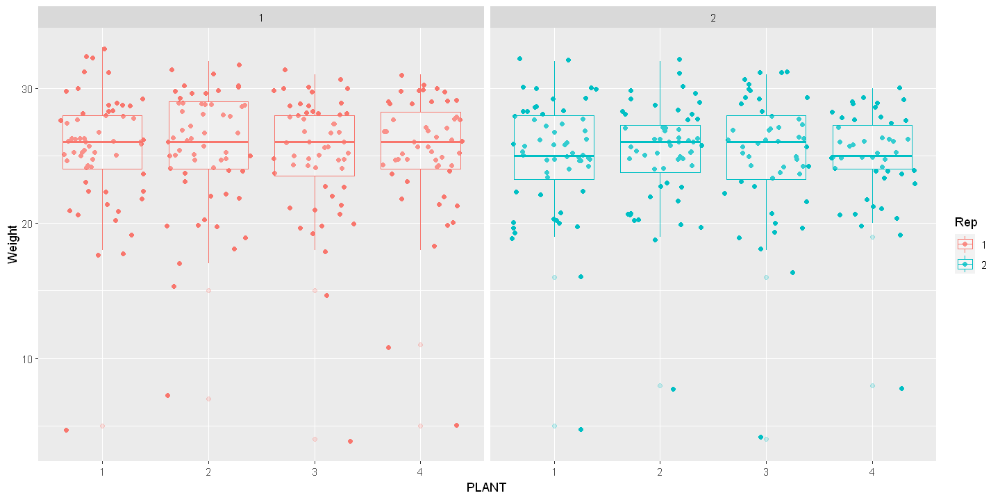

In [29]:
ggplot(Data,aes(x=PLANT,y=Weight,col=Rep)) + geom_jitter() + geom_boxplot(alpha=0.2) + facet_wrap(~Rep)

In [31]:
fit = lmer(Weight ~ 1 + (1|PLANT:Rep),data=Data)
ranef(fit)

boundary (singular) fit: see help('isSingular')



$`PLANT:Rep`
    (Intercept)
1:1           0
1:2           0
2:1           0
2:2           0
3:1           0
3:2           0
4:1           0
4:2           0

with conditional variances for "PLANT:Rep" 

In [32]:
fit = lmer(Weight ~ Line + (1|Rep:PLANT),data=Data)
ranef(fit)

boundary (singular) fit: see help('isSingular')



$`Rep:PLANT`
      (Intercept)
1:1  1.397563e-19
1:2  2.811371e-19
1:3  8.112169e-20
1:4  1.813251e-19
2:1 -1.725964e-19
2:2 -2.463986e-20
2:3 -2.027357e-19
2:4 -2.833681e-19

with conditional variances for "Rep:PLANT" 

In [33]:
fit = lmer(Weight ~ Line + (1|Rep),data=Data)
ranef(fit)

$Rep
  (Intercept)
1   0.1565793
2  -0.1565793

with conditional variances for "Rep" 

#### Function to generate BLUP and heridity

In [12]:
generate_blup_heridity <- function(df_raw, pheno_sum, trait, treatment){
    tmp <- pheno_sum %>% subset(Trait == trait & Treatment == treatment) %>% subset(Replicate2 != 'AV')
    tmp2 <- df_raw[c('ID', tmp$性状)] %>% 
        gather(性状, value, 2:ncol(.)) %>% 
        merge(tmp, '性状') %>% 
        .[c('Trait', 'Treatment', 'Location', 'Year', 'Replicate2', '性状', 'ID', 'value' )] %>% 
        mutate(ID = as.factor(ID)) %>% 
        mutate(Trait = as.factor(Trait)) %>% 
        mutate(Location = as.factor(Location)) %>% 
        mutate(Year = as.factor(Year)) %>% 
        mutate(Treatment = as.factor(Treatment)) %>% 
        mutate(Replicate2 = as.factor(Replicate2))
    
    # fit model
    mod1 = lmer(value ~ (1|ID) + (1|Location/Replicate2) + (1|Year), data = tmp2)

    # generate BLUP
    random <- ranef(mod1)
    fixed <- fixef(mod1)
    BLUP <- fixed[1] + random$ID
    colnames(BLUP)[1] = paste0(trait, '_', treatment)
    
    # generate heredity
    var_vec <- VarCorr(mod1) %>% as.data.frame() %>% .$vcov
    vG = var_vec[1]
    vRL = var_vec[2]
    vL = var_vec[3]
    vY = var_vec[4]
    Y_num = tmp$Year %>% unique %>% length
    L_num = tmp$Location %>% unique %>% length
    RL_num = Y_num * L_num
    heredity = vG / (vG + vRL/RL_num + vL/L_num + vY/Y_num)
    
    return(list(BLUP, heredity))
#     return(tmp)
}

In [13]:
generate_blup_heridity(df_raw, pheno_sum, "FL", "CK")

,FL_CK
,<dbl>
K001,31.63621
K002,29.23859
K003,28.76737
K004,28.18233
K005,31.25141
K006,33.17957
K007,29.64492
K008,33.16170
K009,31.01721


In [138]:
generate_blup_heridity_debug <- function(df_raw, pheno_sum, trait, treatment){
    tmp <- pheno_sum %>% subset(Trait == trait & Treatment == treatment) %>% subset(Replicate2 != 'AV')
    tmp2 <- df_raw[c('ID', tmp$性状)] 
    
#         gather(性状, value, 2:ncol(.)) %>% 
#         merge(tmp, '性状') %>% 
#         .[c('Trait', 'Treatment', 'Location', 'Year', 'Replicate2', '性状', 'ID', 'value' )] %>% 
#         mutate(ID = as.factor(ID)) %>% 
#         mutate(Trait = as.factor(Trait)) %>% 
#         mutate(Location = as.factor(Location)) %>% 
#         mutate(Year = as.factor(Year)) %>% 
#         mutate(Treatment = as.factor(Treatment)) %>% 
#         mutate(Replicate2 = as.factor(Replicate2))
    
#     # fit model
#     mod1 = lmer(value ~ (1|ID) + (1|Location/Replicate2) + (1|Year), data = tmp2)

#     # generate BLUP
#     random <- ranef(mod1)
#     fixed <- fixef(mod1)
#     BLUP <- fixed[1] + random$ID
#     colnames(BLUP)[1] = paste0(trait, '_', treatment)
    
#     # generate heredity
#     var_vec <- VarCorr(mod1) %>% as.data.frame() %>% .$vcov
#     vG = var_vec[1]
#     vRL = var_vec[2]
#     vL = var_vec[3]
#     vY = var_vec[4]
#     Y_num = tmp$Year %>% unique %>% length
#     L_num = tmp$Location %>% unique %>% length
#     RL_num = Y_num * L_num
#     heredity = vG / (vG + vRL/RL_num + vL/L_num + vY/Y_num)
    
#     return(list(BLUP, heredity))
    return(list(tmp,tmp2))
}
generate_blup_heridity_debug(df_raw, pheno_sum, "FE", "BLANK")


[[1]]
     X1        性状           注释 性状分类1 Trait Location Year Treatment
1564  7 FE_AY_18_R1 断裂伸长率%_R1  纤维品质    FE       AY   18     BLANK
1565  8 FE_AY_18_R2 断裂伸长率%_R2  纤维品质    FE       AY   18     BLANK
     Replicate Additional_info Replicate2
1564        R1            <NA>         R1
1565        R2            <NA>         R2

[[2]]
      ID FE_AY_18_R1 FE_AY_18_R2
1   K001         7.2         8.0
2   K002         8.8         8.9
3   K003         8.5         9.6
4   K004         7.7         8.6
5   K005         6.9         6.9
6   K006         7.3         6.5
7   K007         7.4         7.0
8   K008         6.4         6.5
9   K009         8.4         8.0
10  K010         8.5         8.0
11  K011         6.6         7.3
12  K012         7.1         7.3
13  K013         7.8         6.9
14  K014         6.8         6.3
15  K015         6.4         6.6
16  K016         6.7         6.9
17  K017         7.2         7.7
18  K018         6.3         6.7
19  K019         8.3         8.4
20  K020         6.6         6.4
21  K021         7.3         7.7
22  K022         7.8         8.7
23  K023         6.7         6.8
24  K024         6.3         6.8
25  K025         8.1         7.9
26  K026         7.5         7.9
27  K027         7.7         7.0
28  K028         9.3         8.6
29  K029         8.4         7.2
30  K030         6.6         6.6
31  K031         8.7         8.6
32  K032         7.2         6.6
33  K033         7.9         7.2
34  K034         8.4         8.5
35  K035         6.3         5.9
36  K036         8.2         7.4
37  K037         8.4         7.5
38  K038         7.8         8.5
39  K039         6.8         7.2
40  K040         8.4         9.8
41  K041         7.2         8.3
42  K042         7.0         7.2
43  K043         8.1         9.0
44  K044         7.4         7.6
45  K045         7.6         8.3
46  K046         6.6         6.4
47  K047         7.3         6.6
48  K048         7.6         7.9
49  K049         6.9         6.7
50  K050         8.0         8.4
51  K051         6.4         6.3
52  K052         7.5         7.2
53  K053         8.4         8.2
54  K054         8.7         8.3
55  K055         7.5         8.8
56  K056         6.6         7.0
57  K057         7.1         7.6
58  K058         8.6         9.8
59  K059         8.8         7.5
60  K060         9.5        10.7
61  K061         9.9         8.5
62  K062         7.2         8.0
63  K063         9.6        10.5
64  K064         7.8         8.2
65  K065         7.7         8.6
66  K066         9.1         8.9
67  K067         8.9        10.0
68  K068        10.1        10.3
69  K069        11.3        12.2
70  K070        10.9        10.4
71  K071         8.5         8.7
72  K072         7.3         7.7
73  K073         7.8         8.7
74  K074        10.0        11.3
75  K075        10.9         9.7
76  K076         7.7         8.1
77  K077         8.5         9.2
78  K078         7.9         7.7
79  K079         7.7         9.0
80  K080         9.2        10.9
81  K081         7.3         7.9
82  K082         9.0         8.5
83  K083         9.6        10.8
84  K084        11.0        10.5
85  K085         9.4         9.9
86  K086         7.9         7.9
87  K087         7.6         7.6
88  K088         8.4         9.8
89  K089         8.6         9.2
90  K090         7.4         7.8
91  K091         7.8         7.6
92  K092         7.6         8.0
93  K093         8.9         9.2
94  K094         8.6         8.5
95  K095        10.0        10.3
96  K096        12.6        10.9
97  K097         8.2         8.0
98  K098         8.6         8.2
99  K099         6.4         6.2
100 K100         9.2         8.1
101 K101         7.3         8.0
102 K102         8.2         8.1
103 K103         9.8         8.6
104 K104        10.2         9.1
105 K105         8.5         8.0
106 K106         8.0         7.5
107 K107         9.7         8.3
108 K108         8.3         7.6
109 K109        10.1        10.1
110 K110         8.3         8.6